# Download MNIST

In [4]:
import torch
import os
import cv2
import imgaug as ia
import numpy as np
import sys
import json

from imgaug import augmenters as iaa

from collections import defaultdict

from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn import functional as F

from torchvision.models import resnet18 as resnet18
from torchvision import transforms

import matplotlib.pyplot as plt

In [1]:
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from time import time
from torchvision import datasets, transforms
from torch import nn, optim

In [5]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.5,), (0.5,)),
                              ])

In [3]:
trainset = datasets.MNIST('/home/pedashenko/Desktop/Python3/GANs/MNIST', download=True, train=True, transform=transform)

/home/pedashenko/anaconda3/lib/python3.8/site-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


##  Set constants

In [7]:
# Root directory for dataset
dataroot = "/home/pedashenko/Desktop/Python3/GANs/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 2 
# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 28

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 28

# Number of training epochs
num_epochs = 3

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

d=784 # pictures dimension
h=5 #hidden dimension of nn function g
m=10 # nongaussian comnponent compressed space

add_samples = 2 #5

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


In [9]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 1)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 1)
        nn.init.constant_(m.bias.data, 0)

## Объявление генератора 

In [10]:
#d=10 # pictures dimension
#h=2 #hidden dimension of nn function g
#m=2 # nongaussian comnponent compressed space

#add_samples = 25
#batch_size = 2 
#device = "cuda:0"
from torch import nn
import torch

torch.autograd.set_detect_anomaly(True)


class Langevin(nn.Module):
    def __init__(self, n_samples, lr, mu, cov, req_samples):
        super(Langevin, self).__init__()
        self.lr=torch.tensor(lr)
        self.mu=mu
        self.precision=torch.inverse(cov)
        self.n_samples=n_samples
        self.req_samples = req_samples
        self.output_list = torch.randn(4)
        self.it = torch.tensor(1)
        self.T = nn.Linear(d, m, bias=False)
        self.g=nn.Sequential(
                nn.Linear(m,h),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.3),
                nn.LayerNorm(h),
                nn.Linear(h,h - 1),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.3),
                nn.LayerNorm(h-1),
                nn.Linear(h - 1, 1),
                nn.Softplus(beta = 0.05)) #0.1
        


    def forward(self, Z_init):
        self.Z_init = Z_init
        self.Z_list=torch.zeros([self.req_samples, self.Z_init.shape[0]], requires_grad=True).to(device)
        self.output_list = torch.zeros([self.req_samples, Z_init.shape[0]])
        self.output_list[0,:] = self.Z_init
        for i in range(1,self.req_samples):
            self.z_diff=self.Z_list[i-1,:].clone().requires_grad_(True)

            self.g_nn=torch.log(self.g(self.T(self.z_diff))).unsqueeze(-1) 
            #self.g_nn=torch.exp(self.g(self.z_diff)).unsqueeze(-1) 

            
            self.normal_phi_G=0.5*(((self.z_diff - self.mu).T).matmul(self.precision)).matmul(self.z_diff- self.mu)

            self.gradient_g = torch.autograd.grad(self.g_nn, self.z_diff, grad_outputs=torch.ones_like(self.g_nn),
                                             create_graph=True, retain_graph=True)[0]

            self.gradient_normal= torch.autograd.grad(self.normal_phi_G, self.z_diff, 
                                        grad_outputs=torch.ones_like(self.normal_phi_G),
                                        create_graph=True, retain_graph=True)[0]
            self.gradient=self.gradient_g+self.gradient_normal
            #print(Z_list.is_leaf)
            self.noise = torch.sqrt(2*self.lr)*torch.randn_like(self.z_diff).to(device)
            self.output_list[i,:] = self.Z_list[i-1,:]-self.lr*self.gradient+self.noise
            self.it += 1
            self.lr = 1 / (torch.pow(self.it, 3/4))
        
        return self.output_list.clone()

mu = torch.zeros(d, device=device)
cov = torch.eye(d, device=device)
netG=Langevin(n_samples=batch_size,lr=1,mu=mu,cov=cov, req_samples = batch_size + add_samples)
Z_init=torch.randn(d)
samples = netG(Z_init)
real_answer = torch.randn(batch_size, d)
for param in netG.parameters():
    print(param.grad)

None
None
None
None
None
None
None
None
None
None
None


## Три вида дискриминаторов. Самым лучшим на MNIST'е оказался последний

In [11]:
class Discriminator(nn.Module):
    def __init__(self, no_of_channels=1, disc_dim=32):
        super(Discriminator, self).__init__()
        self.network = nn.Sequential(
                
                nn.Conv2d(in_channels=no_of_channels, out_channels=disc_dim, kernel_size=4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                
                nn.Conv2d(in_channels=disc_dim, out_channels=disc_dim * 2, kernel_size=4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(disc_dim * 2),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(in_channels=disc_dim * 2, out_channels=disc_dim * 4, kernel_size=3, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(disc_dim * 4),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(in_channels=disc_dim * 4, out_channels=1, 
                          kernel_size=4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
            )
    def forward(self, input):
        '''
        forward pass of the discriminator
        Input is an image tensor, 
        returns a 1-dimension tensor representing image as    
        fake/real.
        '''   
        output = self.network(input)
        return output.view(-1, 1).squeeze(1)

In [12]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 28 x 28
            nn.Conv2d(nc, ndf, 2, 3, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [13]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [15]:
# Create the Discriminator
netD = Discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1, bias=True)
    (10): Sigmoid()
  )
)


In [16]:
dataloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

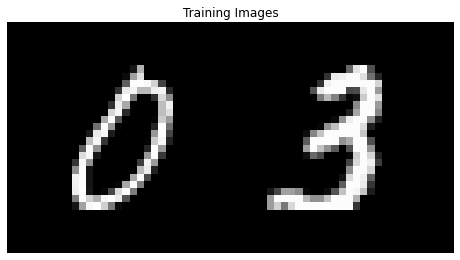

In [17]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))


In [20]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, d, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.


# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG_g = optim.Adam(netG.g.parameters(), lr=lr*5, betas=(beta1, 0.999))
optimizerG_T = optim.Adam(netG.T.parameters(), lr=lr*5, betas=(beta1, 0.999))

In [21]:
netG.g.parameters()

<generator object Module.parameters at 0x7f5d219f92e0>

## Инициализируем начальную точку откуда Ланжевен пойдет путешествовать

In [22]:
noise = torch.randn(d, device=device)


In [23]:
#netD.load_state_dict(torch.load('netDmodel_0_v1.pth'))
#netG.load_state_dict(torch.load('netGmodel_0_v1.pth'))

#optimizerD.load_state_dict(torch.load('optDoptimizer_0.pth'))
#optimizerG.load_state_dict(torch.load('optGoptimizer_0.pth'))

<All keys matched successfully>

## Main loop

Starting Training Loop...
[0/3][0/30000]	Loss_D: 0.0027	Loss_G: 6.3321	D(x): 1.0000	D(G(z)): 0.0027 / 0.0019
tensor([2.0134, 1.1889], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.9749, -0.9869], grad_fn=<SliceBackward>)


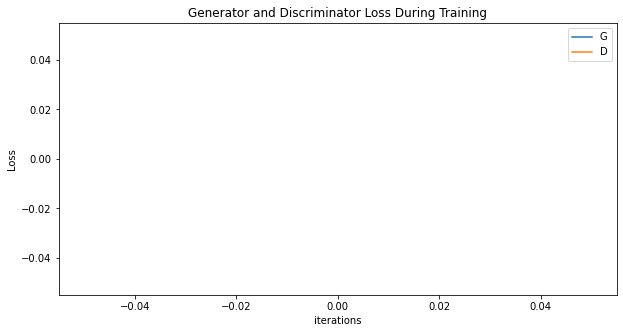

[0/3][10/30000]	Loss_D: 0.0039	Loss_G: 6.4543	D(x): 1.0000	D(G(z)): 0.0039 / 0.0018
tensor([2.0364, 1.1861], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.9608, -0.9771], grad_fn=<SliceBackward>)
[0/3][20/30000]	Loss_D: 0.0000	Loss_G: 6.4141	D(x): 1.0000	D(G(z)): 0.0000 / 0.0022
tensor([2.0704, 1.1764], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.9503, -0.9684], grad_fn=<SliceBackward>)
[0/3][30/30000]	Loss_D: 0.0055	Loss_G: 6.6164	D(x): 1.0000	D(G(z)): 0.0055 / 0.0018
tensor([2.1091, 1.1562], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.9426, -0.9613], grad_fn=<SliceBackward>)
[0/3][40/30000]	Loss_D: 0.0083	Loss_G: 6.7370	D(x): 1.0000	D(G(z)): 0.0082 / 0.0018
tensor([2.1436, 1.1329], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.9344, -0.9554], grad_fn=<SliceBackward>)
[0/3][50/30000]	Loss_D: 0.0034	Loss_G: 6.6530	D(

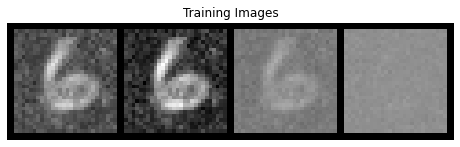

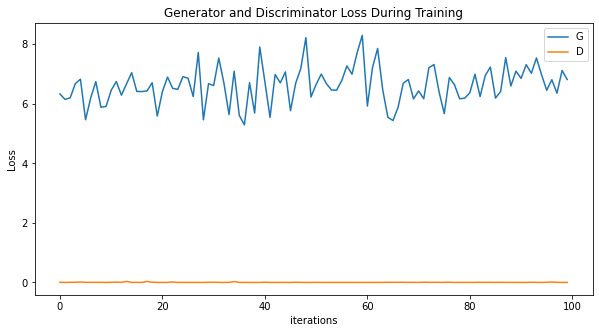

[0/3][110/30000]	Loss_D: 0.0010	Loss_G: 6.9123	D(x): 1.0000	D(G(z)): 0.0010 / 0.0011
tensor([2.1882, 1.0876], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.8761, -0.9138], grad_fn=<SliceBackward>)
[0/3][120/30000]	Loss_D: 0.0009	Loss_G: 6.2042	D(x): 1.0000	D(G(z)): 0.0009 / 0.0021
tensor([2.1877, 1.0918], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.8683, -0.9070], grad_fn=<SliceBackward>)
[0/3][130/30000]	Loss_D: 0.0017	Loss_G: 3.8160	D(x): 1.0000	D(G(z)): 0.0017 / 0.4985
tensor([2.1869, 1.0977], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.8644, -0.9038], grad_fn=<SliceBackward>)
[0/3][140/30000]	Loss_D: 0.0328	Loss_G: 6.1628	D(x): 1.0000	D(G(z)): 0.0319 / 0.0021
tensor([2.1955, 1.1035], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8588, -0.8980], grad_fn=<SliceBackward>)
[0/3][150/30000]	Loss_D: 0.0019	Loss_G: 6.35

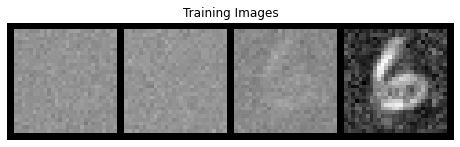

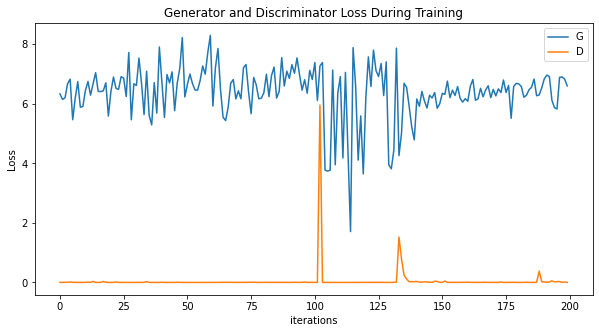

[0/3][210/30000]	Loss_D: 0.0018	Loss_G: 6.9566	D(x): 0.9997	D(G(z)): 0.0015 / 0.0010
tensor([2.3082, 1.0483], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8342, -0.8704], grad_fn=<SliceBackward>)
[0/3][220/30000]	Loss_D: 0.0415	Loss_G: 6.8592	D(x): 1.0000	D(G(z)): 0.0404 / 0.0011
tensor([2.3284, 1.0376], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8306, -0.8679], grad_fn=<SliceBackward>)
[0/3][230/30000]	Loss_D: 0.0029	Loss_G: 6.9559	D(x): 1.0000	D(G(z)): 0.0029 / 0.0010
tensor([2.3496, 1.0232], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8285, -0.8657], grad_fn=<SliceBackward>)
[0/3][240/30000]	Loss_D: 0.0043	Loss_G: 6.8614	D(x): 1.0000	D(G(z)): 0.0043 / 0.0011
tensor([2.3699, 1.0080], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8277, -0.8649], grad_fn=<SliceBackward>)
[0/3][250/30000]	Loss_D: 0.0032	Loss_G: 7.07

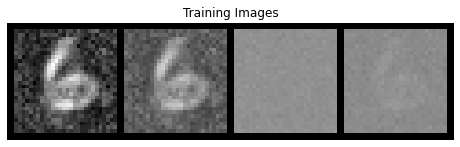

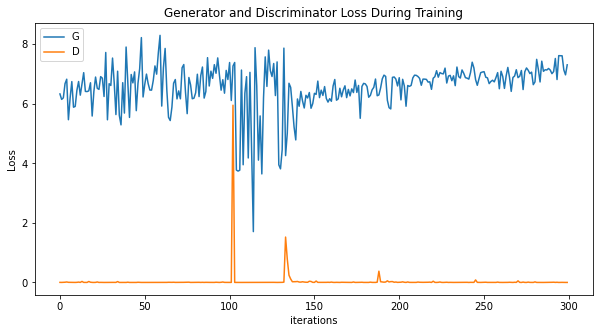

[0/3][310/30000]	Loss_D: 0.0009	Loss_G: 6.7968	D(x): 1.0000	D(G(z)): 0.0009 / 0.0011
tensor([2.4859, 0.9295], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.8121, -0.8573], grad_fn=<SliceBackward>)
[0/3][320/30000]	Loss_D: 0.0014	Loss_G: 7.5434	D(x): 1.0000	D(G(z)): 0.0014 / 0.0005
tensor([2.4975, 0.9188], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.8106, -0.8567], grad_fn=<SliceBackward>)
[0/3][330/30000]	Loss_D: 0.0003	Loss_G: 6.9207	D(x): 1.0000	D(G(z)): 0.0003 / 0.0010
tensor([2.5086, 0.9097], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.8083, -0.8558], grad_fn=<SliceBackward>)
[0/3][340/30000]	Loss_D: 0.0033	Loss_G: 6.9975	D(x): 1.0000	D(G(z)): 0.0033 / 0.0009
tensor([2.5195, 0.9009], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.8069, -0.8555], grad_fn=<SliceBackward>)
[0/3][350/30000]	Loss_D: 0.0021	Loss_G: 6.27

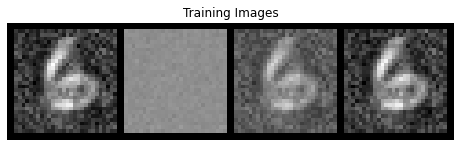

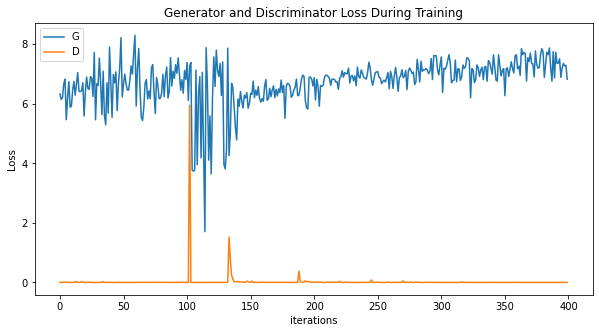

[0/3][410/30000]	Loss_D: 0.0005	Loss_G: 7.0016	D(x): 1.0000	D(G(z)): 0.0005 / 0.0009
tensor([2.6028, 0.8371], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7950, -0.8555], grad_fn=<SliceBackward>)
[0/3][420/30000]	Loss_D: 0.0006	Loss_G: 7.3597	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
tensor([2.6172, 0.8266], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7938, -0.8560], grad_fn=<SliceBackward>)
[0/3][430/30000]	Loss_D: 0.0005	Loss_G: 7.0079	D(x): 1.0000	D(G(z)): 0.0005 / 0.0009
tensor([2.6328, 0.8155], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7923, -0.8560], grad_fn=<SliceBackward>)
[0/3][440/30000]	Loss_D: 0.0014	Loss_G: 6.7642	D(x): 1.0000	D(G(z)): 0.0014 / 0.0020
tensor([2.6492, 0.8033], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7901, -0.8560], grad_fn=<SliceBackward>)
[0/3][450/30000]	Loss_D: 0.0002	Loss_G: 6.37

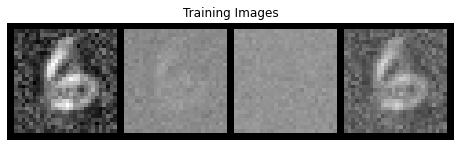

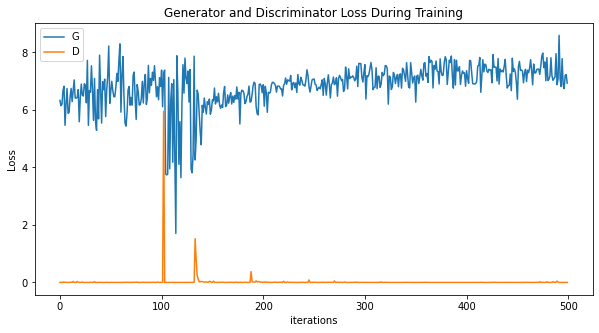

[0/3][510/30000]	Loss_D: 0.0002	Loss_G: 7.9807	D(x): 1.0000	D(G(z)): 0.0002 / 0.0004
tensor([2.8464, 0.6660], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7876, -0.8742], grad_fn=<SliceBackward>)
[0/3][520/30000]	Loss_D: 0.0008	Loss_G: 7.8547	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
tensor([2.8577, 0.6545], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0026], grad_fn=<SliceBackward>)
tensor([-0.7917, -0.8800], grad_fn=<SliceBackward>)
[0/3][530/30000]	Loss_D: 0.0647	Loss_G: 7.6000	D(x): 1.0000	D(G(z)): 0.0619 / 0.0005
tensor([2.8715, 0.6497], grad_fn=<SliceBackward>) tensor([-0.0111,  0.0020], grad_fn=<SliceBackward>)
tensor([-0.7938, -0.8877], grad_fn=<SliceBackward>)
[0/3][540/30000]	Loss_D: 0.0006	Loss_G: 7.2163	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
tensor([2.8844, 0.6433], grad_fn=<SliceBackward>) tensor([-0.0110,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.7844, -0.8804], grad_fn=<SliceBackward>)
[0/3][550/30000]	Loss_D: 0.0006	Loss_G: 7.61

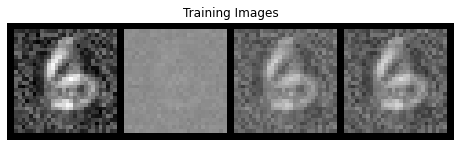

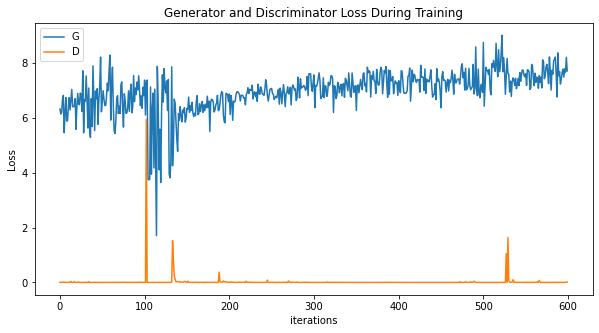

[0/3][610/30000]	Loss_D: 0.0148	Loss_G: 7.8166	D(x): 1.0000	D(G(z)): 0.0146 / 0.0004
tensor([3.0493, 0.4692], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.6837, -0.8079], grad_fn=<SliceBackward>)
[0/3][620/30000]	Loss_D: 0.0001	Loss_G: 7.0022	D(x): 1.0000	D(G(z)): 0.0001 / 0.0009
tensor([3.0840, 0.4312], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.6689, -0.7990], grad_fn=<SliceBackward>)
[0/3][630/30000]	Loss_D: 0.0005	Loss_G: 7.8285	D(x): 1.0000	D(G(z)): 0.0005 / 0.0006
tensor([3.1200, 0.3912], grad_fn=<SliceBackward>) tensor([-0.0108,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.6552, -0.7925], grad_fn=<SliceBackward>)
[0/3][640/30000]	Loss_D: 0.0087	Loss_G: 7.7765	D(x): 1.0000	D(G(z)): 0.0087 / 0.0006
tensor([3.1589, 0.3493], grad_fn=<SliceBackward>) tensor([-0.0108,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.6399, -0.7869], grad_fn=<SliceBackward>)
[0/3][650/30000]	Loss_D: 0.0005	Loss_G: 5.89

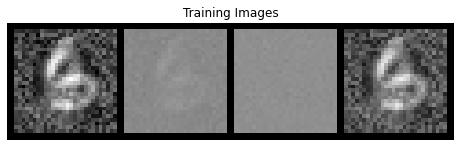

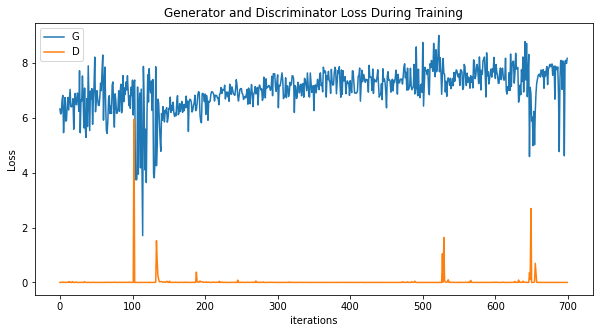

[0/3][710/30000]	Loss_D: 0.0001	Loss_G: 7.3247	D(x): 1.0000	D(G(z)): 0.0001 / 0.0009
tensor([3.1889, 0.3179], grad_fn=<SliceBackward>) tensor([-0.0143, -0.0010], grad_fn=<SliceBackward>)
tensor([-0.5972, -0.7642], grad_fn=<SliceBackward>)
[0/3][720/30000]	Loss_D: 0.0005	Loss_G: 8.0489	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
tensor([3.1888, 0.3185], grad_fn=<SliceBackward>) tensor([-0.0143, -0.0010], grad_fn=<SliceBackward>)
tensor([-0.5927, -0.7609], grad_fn=<SliceBackward>)
[0/3][730/30000]	Loss_D: 0.0006	Loss_G: 8.3688	D(x): 1.0000	D(G(z)): 0.0006 / 0.0002
tensor([3.1886, 0.3191], grad_fn=<SliceBackward>) tensor([-0.0143, -0.0010], grad_fn=<SliceBackward>)
tensor([-0.5875, -0.7575], grad_fn=<SliceBackward>)
[0/3][740/30000]	Loss_D: 0.0002	Loss_G: 7.9488	D(x): 1.0000	D(G(z)): 0.0002 / 0.0004
tensor([3.1885, 0.3198], grad_fn=<SliceBackward>) tensor([-0.0143, -0.0010], grad_fn=<SliceBackward>)
tensor([-0.5806, -0.7526], grad_fn=<SliceBackward>)
[0/3][750/30000]	Loss_D: 0.0004	Loss_G: 4.25

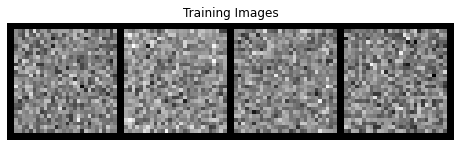

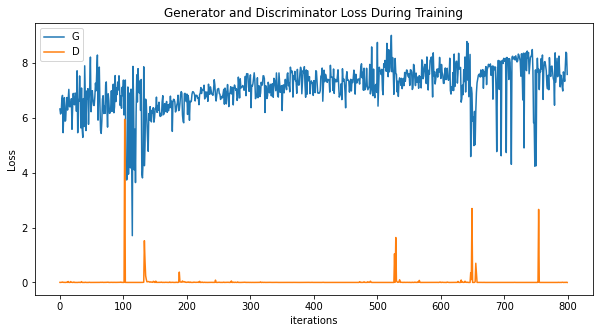

[0/3][810/30000]	Loss_D: 0.0004	Loss_G: 7.8365	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
tensor([3.2908, 0.2322], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0014], grad_fn=<SliceBackward>)
tensor([-0.5287, -0.7363], grad_fn=<SliceBackward>)
[0/3][820/30000]	Loss_D: 0.0024	Loss_G: 6.5201	D(x): 1.0000	D(G(z)): 0.0024 / 0.0019
tensor([3.2915, 0.2282], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5285, -0.7384], grad_fn=<SliceBackward>)
[0/3][830/30000]	Loss_D: 0.0003	Loss_G: 9.5644	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([3.2919, 0.2246], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5281, -0.7406], grad_fn=<SliceBackward>)
[0/3][840/30000]	Loss_D: 0.0004	Loss_G: 8.0211	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
tensor([3.2922, 0.2215], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5268, -0.7438], grad_fn=<SliceBackward>)
[0/3][850/30000]	Loss_D: 0.0009	Loss_G: 7.67

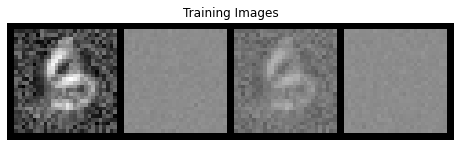

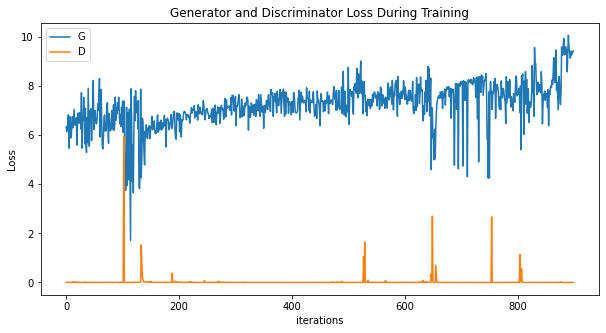

[0/3][910/30000]	Loss_D: 0.0002	Loss_G: 9.3632	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([3.2987, 0.1853], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5126, -0.7483], grad_fn=<SliceBackward>)
[0/3][920/30000]	Loss_D: 0.0002	Loss_G: 9.2958	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([3.2976, 0.1851], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5109, -0.7479], grad_fn=<SliceBackward>)
[0/3][930/30000]	Loss_D: 0.0001	Loss_G: 9.4382	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([3.2964, 0.1859], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5074, -0.7468], grad_fn=<SliceBackward>)
[0/3][940/30000]	Loss_D: 0.1389	Loss_G: 9.4026	D(x): 0.8788	D(G(z)): 0.0001 / 0.0001
tensor([3.2953, 0.1870], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.5048, -0.7475], grad_fn=<SliceBackward>)
[0/3][950/30000]	Loss_D: 0.0001	Loss_G: 9.05

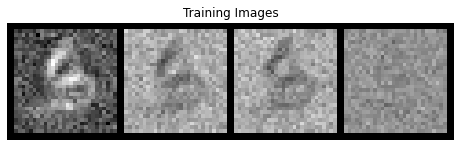

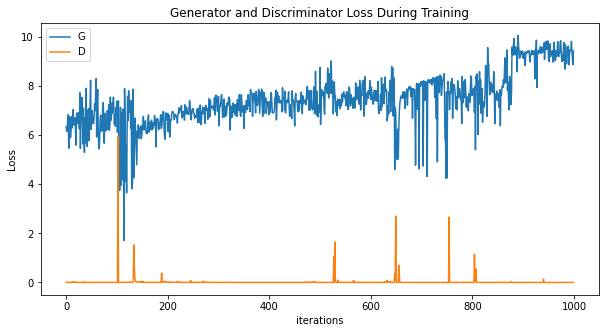

[0/3][1010/30000]	Loss_D: 0.0007	Loss_G: 9.1242	D(x): 1.0000	D(G(z)): 0.0007 / 0.0001
tensor([3.2929, 0.2067], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.4511, -0.7261], grad_fn=<SliceBackward>)
[0/3][1020/30000]	Loss_D: 0.0006	Loss_G: 9.0693	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([3.2953, 0.2104], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.4413, -0.7212], grad_fn=<SliceBackward>)
[0/3][1030/30000]	Loss_D: 0.0013	Loss_G: 8.7034	D(x): 1.0000	D(G(z)): 0.0013 / 0.0002
tensor([3.2990, 0.2148], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.4325, -0.7175], grad_fn=<SliceBackward>)
[0/3][1040/30000]	Loss_D: 0.0003	Loss_G: 9.3142	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([3.3044, 0.2182], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.4220, -0.7112], grad_fn=<SliceBackward>)
[0/3][1050/30000]	Loss_D: 0.0004	Loss_G:

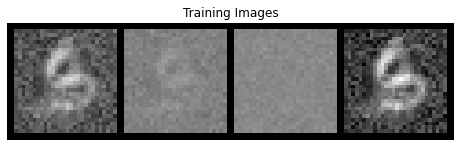

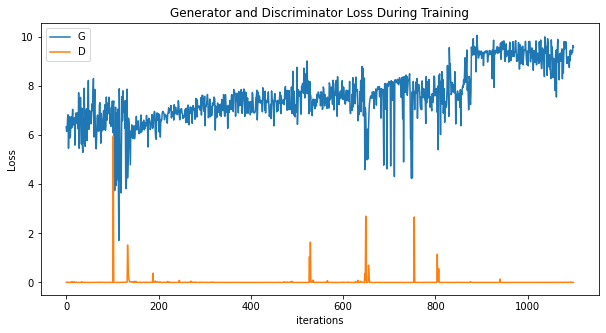

[0/3][1110/30000]	Loss_D: 0.0002	Loss_G: 9.6839	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([3.3795, 0.2178], grad_fn=<SliceBackward>) tensor([-0.0112,  0.0022], grad_fn=<SliceBackward>)
tensor([-0.3342, -0.6596], grad_fn=<SliceBackward>)
[0/3][1120/30000]	Loss_D: 0.0036	Loss_G: 9.4960	D(x): 1.0000	D(G(z)): 0.0036 / 0.0001
tensor([3.4025, 0.2018], grad_fn=<SliceBackward>) tensor([-0.0111,  0.0022], grad_fn=<SliceBackward>)
tensor([-0.3262, -0.6554], grad_fn=<SliceBackward>)
[0/3][1130/30000]	Loss_D: 0.0128	Loss_G: 9.5686	D(x): 1.0000	D(G(z)): 0.0126 / 0.0001
tensor([3.4304, 0.1829], grad_fn=<SliceBackward>) tensor([-0.0111,  0.0022], grad_fn=<SliceBackward>)
tensor([-0.3187, -0.6532], grad_fn=<SliceBackward>)
[0/3][1140/30000]	Loss_D: 0.0020	Loss_G: 8.1690	D(x): 1.0000	D(G(z)): 0.0020 / 0.0003
tensor([3.4610, 0.1573], grad_fn=<SliceBackward>) tensor([-0.0111,  0.0022], grad_fn=<SliceBackward>)
tensor([-0.3170, -0.6517], grad_fn=<SliceBackward>)
[0/3][1150/30000]	Loss_D: 0.0003	Loss_G:

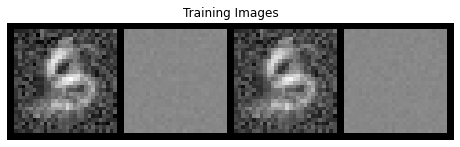

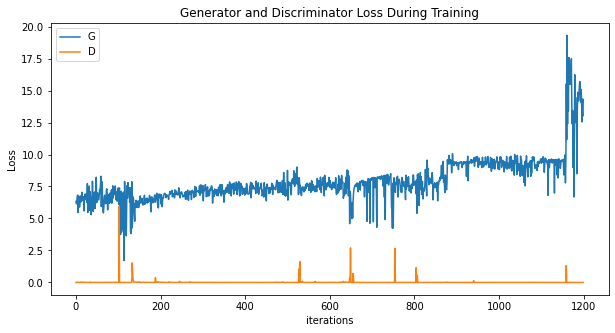

[0/3][1210/30000]	Loss_D: 0.0000	Loss_G: 15.9794	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([3.5263, 0.0722], grad_fn=<SliceBackward>) tensor([-0.0114,  0.0018], grad_fn=<SliceBackward>)
tensor([-0.2596, -0.6191], grad_fn=<SliceBackward>)
[0/3][1220/30000]	Loss_D: 0.0000	Loss_G: 10.5644	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([3.5365, 0.0682], grad_fn=<SliceBackward>) tensor([-0.0099,  0.0033], grad_fn=<SliceBackward>)
tensor([-0.2334, -0.6016], grad_fn=<SliceBackward>)
[0/3][1230/30000]	Loss_D: 0.0014	Loss_G: 12.6937	D(x): 0.9989	D(G(z)): 0.0003 / 0.0000
tensor([3.5573, 0.0484], grad_fn=<SliceBackward>) tensor([-0.0098,  0.0034], grad_fn=<SliceBackward>)
tensor([-0.2242, -0.5994], grad_fn=<SliceBackward>)
[0/3][1240/30000]	Loss_D: 0.0033	Loss_G: 12.4405	D(x): 1.0000	D(G(z)): 0.0033 / 0.0000
tensor([3.5850, 0.0219], grad_fn=<SliceBackward>) tensor([-0.0098,  0.0034], grad_fn=<SliceBackward>)
tensor([-0.2117, -0.5971], grad_fn=<SliceBackward>)
[0/3][1250/30000]	Loss_D: 0.0005	Los

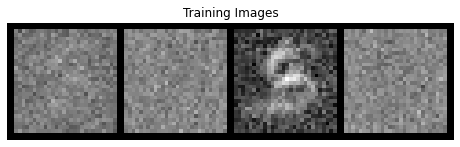

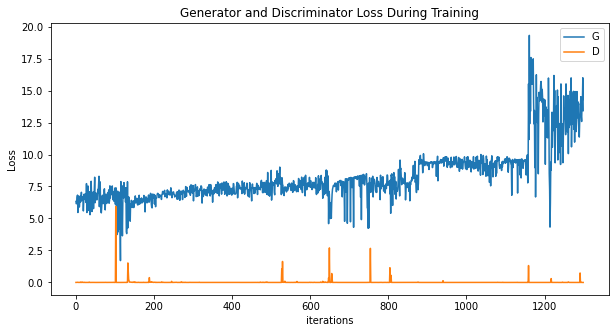

[0/3][1310/30000]	Loss_D: 0.0000	Loss_G: 12.3209	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 3.8086, -0.2134], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.1631, -0.6353], grad_fn=<SliceBackward>)
[0/3][1320/30000]	Loss_D: 0.0000	Loss_G: 12.0866	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 3.8105, -0.2153], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.1665, -0.6437], grad_fn=<SliceBackward>)
[0/3][1330/30000]	Loss_D: 0.0004	Loss_G: 10.9704	D(x): 1.0000	D(G(z)): 0.0004 / 0.0005
tensor([ 3.8128, -0.2181], grad_fn=<SliceBackward>) tensor([-0.0110,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.1615, -0.6410], grad_fn=<SliceBackward>)
[0/3][1340/30000]	Loss_D: 0.0003	Loss_G: 11.7181	D(x): 1.0000	D(G(z)): 0.0003 / 0.0000
tensor([ 3.8166, -0.2293], grad_fn=<SliceBackward>) tensor([-0.0047,  0.0080], grad_fn=<SliceBackward>)
tensor([-0.1558, -0.6408], grad_fn=<SliceBackward>)
[0/3][1350/30000]	Loss_D: 0.

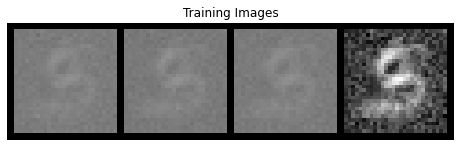

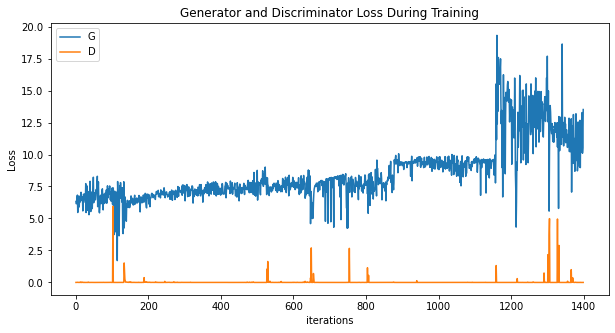

[0/3][1410/30000]	Loss_D: 0.0063	Loss_G: 12.5222	D(x): 1.0000	D(G(z)): 0.0063 / 0.0000
tensor([ 3.8512, -0.2621], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.1152, -0.6764], grad_fn=<SliceBackward>)
[0/3][1420/30000]	Loss_D: 0.0006	Loss_G: 10.1953	D(x): 1.0000	D(G(z)): 0.0006 / 0.0002
tensor([ 3.8635, -0.2766], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.1106, -0.6838], grad_fn=<SliceBackward>)
[0/3][1430/30000]	Loss_D: 0.0001	Loss_G: 9.3737	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 3.8777, -0.2933], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.1069, -0.7138], grad_fn=<SliceBackward>)
[0/3][1440/30000]	Loss_D: 0.0013	Loss_G: 12.7475	D(x): 1.0000	D(G(z)): 0.0013 / 0.0000
tensor([ 3.8942, -0.3130], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.1015, -0.7218], grad_fn=<SliceBackward>)
[0/3][1450/30000]	Loss_D: 0.0

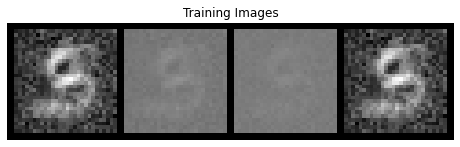

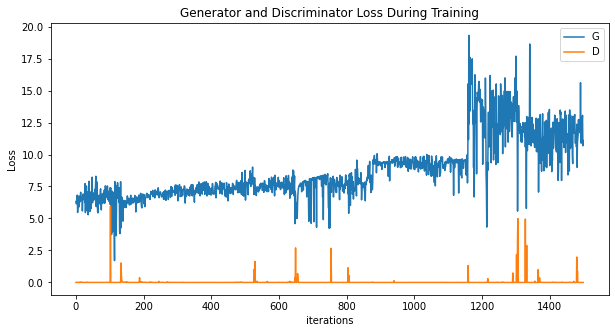

[0/3][1510/30000]	Loss_D: 0.0000	Loss_G: 13.3128	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 3.9890, -0.4336], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.0833, -0.8113], grad_fn=<SliceBackward>)
[0/3][1520/30000]	Loss_D: 0.0006	Loss_G: 10.3120	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 3.9886, -0.4321], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0086], grad_fn=<SliceBackward>)
tensor([-0.0808, -0.8108], grad_fn=<SliceBackward>)
[0/3][1530/30000]	Loss_D: 0.0005	Loss_G: 9.8968	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 3.9894, -0.4330], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0086], grad_fn=<SliceBackward>)
tensor([-0.0875, -0.8193], grad_fn=<SliceBackward>)
[0/3][1540/30000]	Loss_D: 0.0005	Loss_G: 9.8267	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 3.9905, -0.4336], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0086], grad_fn=<SliceBackward>)
tensor([-0.0885, -0.8223], grad_fn=<SliceBackward>)
[0/3][1550/30000]	Loss_D: 0.00

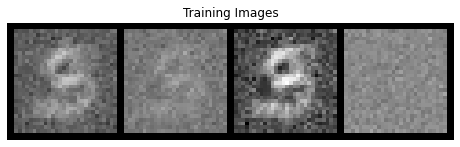

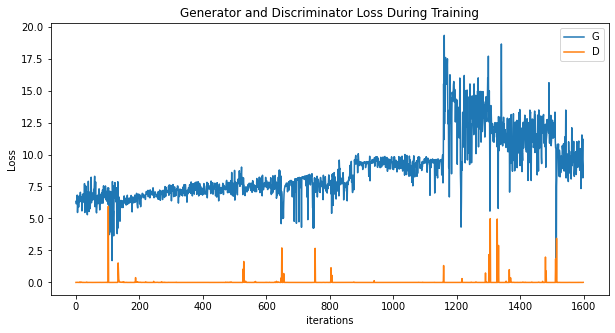

[0/3][1610/30000]	Loss_D: 0.0001	Loss_G: 9.8321	D(x): 1.0000	D(G(z)): 0.0001 / 0.0003
tensor([ 3.9952, -0.4302], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0087], grad_fn=<SliceBackward>)
tensor([-0.1731, -0.8748], grad_fn=<SliceBackward>)
[0/3][1620/30000]	Loss_D: 0.0003	Loss_G: 8.4235	D(x): 1.0000	D(G(z)): 0.0003 / 0.0005
tensor([ 3.9931, -0.4257], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0087], grad_fn=<SliceBackward>)
tensor([-0.1851, -0.8784], grad_fn=<SliceBackward>)
[0/3][1630/30000]	Loss_D: 0.0004	Loss_G: 9.3604	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 3.9917, -0.4223], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0087], grad_fn=<SliceBackward>)
tensor([-0.1909, -0.8798], grad_fn=<SliceBackward>)
[0/3][1640/30000]	Loss_D: 0.0012	Loss_G: 10.3135	D(x): 1.0000	D(G(z)): 0.0012 / 0.0000
tensor([ 3.9905, -0.4191], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0087], grad_fn=<SliceBackward>)
tensor([-0.1954, -0.8810], grad_fn=<SliceBackward>)
[0/3][1650/30000]	Loss_D: 0.033

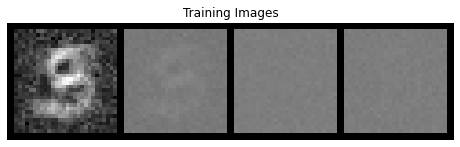

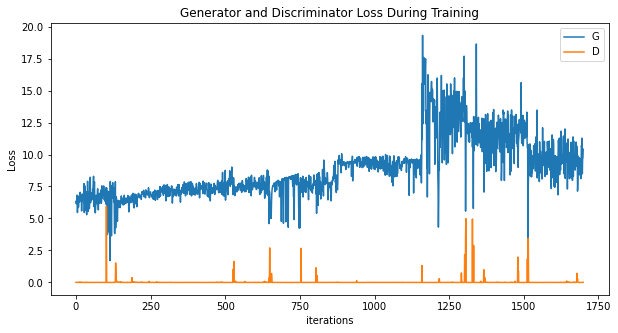

[0/3][1710/30000]	Loss_D: 0.0011	Loss_G: 10.6476	D(x): 1.0000	D(G(z)): 0.0011 / 0.0000
tensor([ 3.9777, -0.3976], grad_fn=<SliceBackward>) tensor([-0.0035,  0.0088], grad_fn=<SliceBackward>)
tensor([-0.2802, -0.9298], grad_fn=<SliceBackward>)
[0/3][1720/30000]	Loss_D: 0.0000	Loss_G: 10.0601	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 3.9851, -0.4077], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0090], grad_fn=<SliceBackward>)
tensor([-0.2976, -0.9467], grad_fn=<SliceBackward>)
[0/3][1730/30000]	Loss_D: 0.0047	Loss_G: 9.4685	D(x): 1.0000	D(G(z)): 0.0047 / 0.0001
tensor([ 3.9790, -0.3997], grad_fn=<SliceBackward>) tensor([-0.0040,  0.0082], grad_fn=<SliceBackward>)
tensor([-0.3012, -0.9529], grad_fn=<SliceBackward>)
[0/3][1740/30000]	Loss_D: 0.0075	Loss_G: 9.3986	D(x): 1.0000	D(G(z)): 0.0075 / 0.0001
tensor([ 3.9657, -0.3820], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0076], grad_fn=<SliceBackward>)
tensor([-0.3026, -0.9564], grad_fn=<SliceBackward>)
[0/3][1750/30000]	Loss_D: 0.03

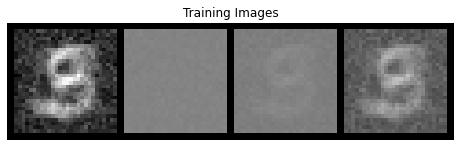

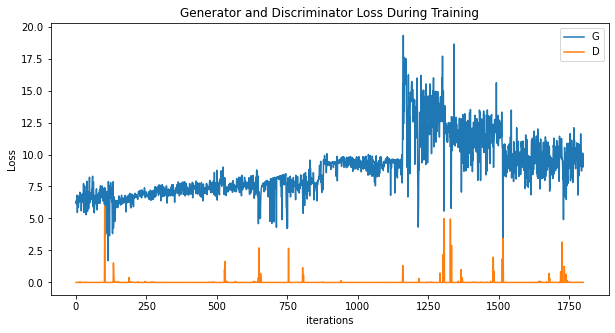

[0/3][1810/30000]	Loss_D: 0.0001	Loss_G: 10.4713	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 3.8877, -0.3116], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0076], grad_fn=<SliceBackward>)
tensor([-0.3384, -1.0036], grad_fn=<SliceBackward>)
[0/3][1820/30000]	Loss_D: 0.0001	Loss_G: 10.6936	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 3.8886, -0.3140], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0076], grad_fn=<SliceBackward>)
tensor([-0.3422, -1.0073], grad_fn=<SliceBackward>)
[0/3][1830/30000]	Loss_D: 0.0002	Loss_G: 10.8826	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 3.8888, -0.3143], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0076], grad_fn=<SliceBackward>)
tensor([-0.3441, -1.0084], grad_fn=<SliceBackward>)
[0/3][1840/30000]	Loss_D: 0.0003	Loss_G: 9.9714	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 3.8891, -0.3145], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0076], grad_fn=<SliceBackward>)
tensor([-0.3443, -1.0084], grad_fn=<SliceBackward>)
[0/3][1850/30000]	Loss_D: 0.0

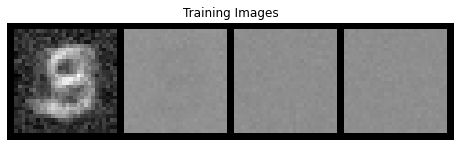

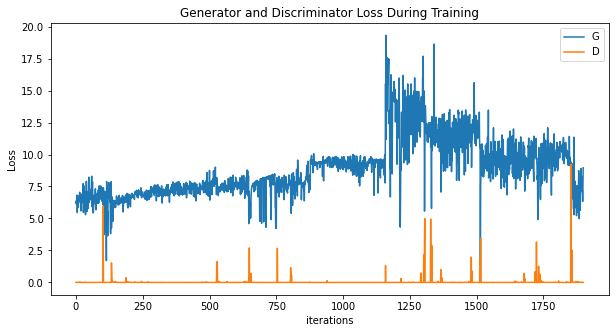

[0/3][1910/30000]	Loss_D: 0.0301	Loss_G: 7.8212	D(x): 0.9982	D(G(z)): 0.0278 / 0.0004
tensor([ 3.8820, -0.3128], grad_fn=<SliceBackward>) tensor([-0.0039,  0.0080], grad_fn=<SliceBackward>)
tensor([-0.3760, -1.0360], grad_fn=<SliceBackward>)
[0/3][1920/30000]	Loss_D: 0.0170	Loss_G: 8.1017	D(x): 1.0000	D(G(z)): 0.0168 / 0.0003
tensor([ 3.8798, -0.3113], grad_fn=<SliceBackward>) tensor([-0.0039,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.3800, -1.0378], grad_fn=<SliceBackward>)
[0/3][1930/30000]	Loss_D: 0.0019	Loss_G: 6.4680	D(x): 1.0000	D(G(z)): 0.0019 / 0.0024
tensor([ 3.8775, -0.3098], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.3830, -1.0389], grad_fn=<SliceBackward>)
[0/3][1940/30000]	Loss_D: 0.0032	Loss_G: 9.6110	D(x): 1.0000	D(G(z)): 0.0032 / 0.0002
tensor([ 3.8751, -0.3083], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.3893, -1.0428], grad_fn=<SliceBackward>)
[0/3][1950/30000]	Loss_D: 0.0042

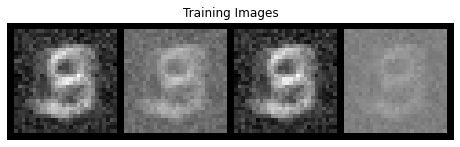

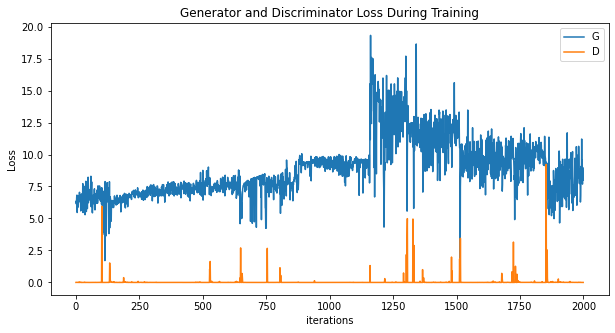

[0/3][2010/30000]	Loss_D: 0.0033	Loss_G: 10.2325	D(x): 1.0000	D(G(z)): 0.0033 / 0.0000
tensor([ 3.8598, -0.2988], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.4297, -1.0670], grad_fn=<SliceBackward>)
[0/3][2020/30000]	Loss_D: 0.0010	Loss_G: 8.0944	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
tensor([ 3.8581, -0.2978], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.4373, -1.0719], grad_fn=<SliceBackward>)
[0/3][2030/30000]	Loss_D: 0.0188	Loss_G: 6.4579	D(x): 1.0000	D(G(z)): 0.0185 / 0.0019
tensor([ 3.8563, -0.2962], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.4431, -1.0765], grad_fn=<SliceBackward>)
[0/3][2040/30000]	Loss_D: 0.0023	Loss_G: 8.1457	D(x): 1.0000	D(G(z)): 0.0023 / 0.0006
tensor([ 3.8531, -0.2954], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0082], grad_fn=<SliceBackward>)
tensor([-0.4613, -1.0967], grad_fn=<SliceBackward>)
[0/3][2050/30000]	Loss_D: 0.002

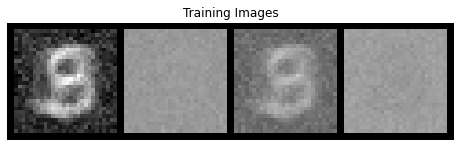

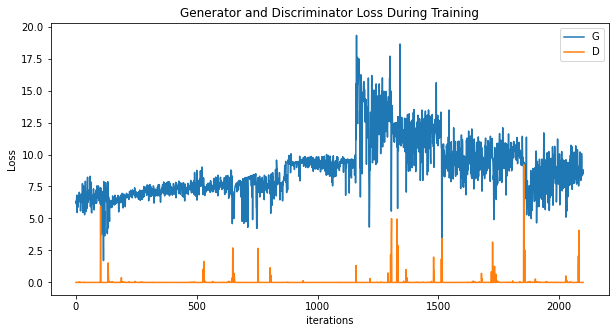

[0/3][2110/30000]	Loss_D: 0.0014	Loss_G: 10.3858	D(x): 1.0000	D(G(z)): 0.0014 / 0.0000
tensor([ 3.8436, -0.2876], grad_fn=<SliceBackward>) tensor([-0.0031,  0.0086], grad_fn=<SliceBackward>)
tensor([-0.5225, -1.1253], grad_fn=<SliceBackward>)
[0/3][2120/30000]	Loss_D: 0.0004	Loss_G: 9.2085	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 3.8437, -0.2898], grad_fn=<SliceBackward>) tensor([-0.0031,  0.0086], grad_fn=<SliceBackward>)
tensor([-0.5335, -1.1307], grad_fn=<SliceBackward>)
[0/3][2130/30000]	Loss_D: 0.4090	Loss_G: 8.4291	D(x): 0.7208	D(G(z)): 0.0002 / 0.0003
tensor([ 3.8434, -0.2895], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.5495, -1.1389], grad_fn=<SliceBackward>)
[0/3][2140/30000]	Loss_D: 0.0056	Loss_G: 8.0880	D(x): 1.0000	D(G(z)): 0.0056 / 0.0004
tensor([ 3.8438, -0.2897], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.5586, -1.1417], grad_fn=<SliceBackward>)
[0/3][2150/30000]	Loss_D: 0.019

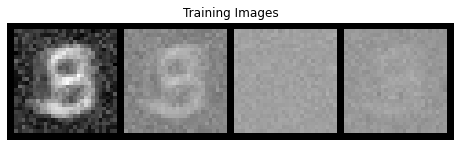

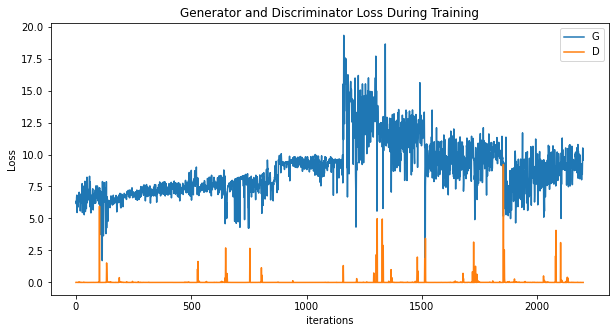

[0/3][2210/30000]	Loss_D: 0.0040	Loss_G: 7.7403	D(x): 1.0000	D(G(z)): 0.0039 / 0.0005
tensor([ 3.8845, -0.3306], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.6524, -1.1900], grad_fn=<SliceBackward>)
[0/3][2220/30000]	Loss_D: 0.0082	Loss_G: 8.7069	D(x): 1.0000	D(G(z)): 0.0081 / 0.0002
tensor([ 3.8996, -0.3434], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.6631, -1.1958], grad_fn=<SliceBackward>)
[0/3][2230/30000]	Loss_D: 0.0057	Loss_G: 9.4805	D(x): 1.0000	D(G(z)): 0.0057 / 0.0001
tensor([ 3.9185, -0.3606], grad_fn=<SliceBackward>) tensor([-0.0031,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.6748, -1.2001], grad_fn=<SliceBackward>)
[0/3][2240/30000]	Loss_D: 0.0002	Loss_G: 9.2568	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 3.9429, -0.3813], grad_fn=<SliceBackward>) tensor([-0.0031,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.6859, -1.2064], grad_fn=<SliceBackward>)
[0/3][2250/30000]	Loss_D: 0.0003

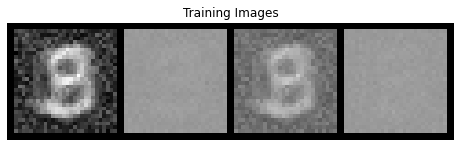

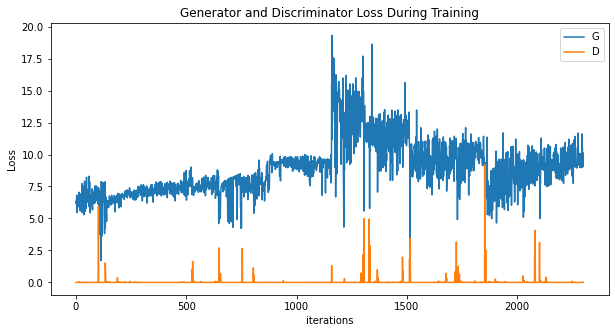

[0/3][2310/30000]	Loss_D: 0.0001	Loss_G: 10.6634	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 4.1041, -0.5358], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.7653, -1.2630], grad_fn=<SliceBackward>)
[0/3][2320/30000]	Loss_D: 0.0001	Loss_G: 9.6848	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 4.1048, -0.5360], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.7715, -1.2666], grad_fn=<SliceBackward>)
[0/3][2330/30000]	Loss_D: 0.0002	Loss_G: 9.5785	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 4.1055, -0.5362], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.7818, -1.2725], grad_fn=<SliceBackward>)
[0/3][2340/30000]	Loss_D: 0.0001	Loss_G: 10.0195	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 4.1062, -0.5364], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0085], grad_fn=<SliceBackward>)
tensor([-0.7970, -1.2829], grad_fn=<SliceBackward>)
[0/3][2350/30000]	Loss_D: 0.00

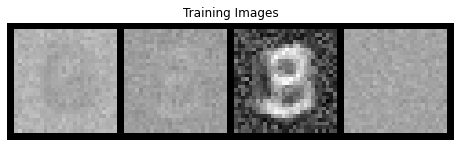

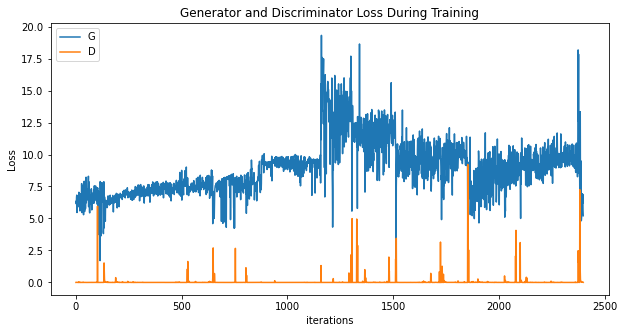

[0/3][2410/30000]	Loss_D: 0.0049	Loss_G: 7.1651	D(x): 1.0000	D(G(z)): 0.0049 / 0.0008
tensor([ 4.1085, -0.5397], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0060], grad_fn=<SliceBackward>)
tensor([-0.8362, -1.2930], grad_fn=<SliceBackward>)
[0/3][2420/30000]	Loss_D: 0.0193	Loss_G: 13.8621	D(x): 0.9999	D(G(z)): 0.0190 / 0.0064
tensor([ 4.1072, -0.5388], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0058], grad_fn=<SliceBackward>)
tensor([-0.8356, -1.2875], grad_fn=<SliceBackward>)
[0/3][2430/30000]	Loss_D: 0.0264	Loss_G: 7.8103	D(x): 1.0000	D(G(z)): 0.0259 / 0.0011
tensor([ 4.1056, -0.5377], grad_fn=<SliceBackward>) tensor([-0.0062,  0.0052], grad_fn=<SliceBackward>)
tensor([-0.8348, -1.2848], grad_fn=<SliceBackward>)
[0/3][2440/30000]	Loss_D: 0.0110	Loss_G: 6.7075	D(x): 1.0000	D(G(z)): 0.0109 / 0.0015
tensor([ 4.1048, -0.5374], grad_fn=<SliceBackward>) tensor([-0.0061,  0.0053], grad_fn=<SliceBackward>)
tensor([-0.8370, -1.2836], grad_fn=<SliceBackward>)
[0/3][2450/30000]	Loss_D: 0.023

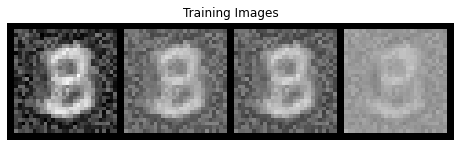

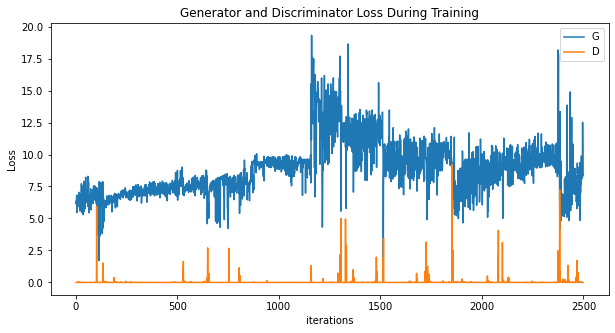

[0/3][2510/30000]	Loss_D: 0.0070	Loss_G: 8.6281	D(x): 1.0000	D(G(z)): 0.0069 / 0.0002
tensor([ 4.1117, -0.5517], grad_fn=<SliceBackward>) tensor([-0.0075,  0.0038], grad_fn=<SliceBackward>)
tensor([-0.8306, -1.2591], grad_fn=<SliceBackward>)
[0/3][2520/30000]	Loss_D: 0.0005	Loss_G: 9.6058	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 4.1113, -0.5518], grad_fn=<SliceBackward>) tensor([-0.0075,  0.0038], grad_fn=<SliceBackward>)
tensor([-0.8251, -1.2493], grad_fn=<SliceBackward>)
[0/3][2530/30000]	Loss_D: 0.1147	Loss_G: 8.8335	D(x): 0.8975	D(G(z)): 0.0001 / 0.0002
tensor([ 4.1110, -0.5518], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0038], grad_fn=<SliceBackward>)
tensor([-0.8220, -1.2396], grad_fn=<SliceBackward>)
[0/3][2540/30000]	Loss_D: 0.0005	Loss_G: 8.3945	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
tensor([ 4.1104, -0.5529], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0045], grad_fn=<SliceBackward>)
tensor([-0.8213, -1.2337], grad_fn=<SliceBackward>)
[0/3][2550/30000]	Loss_D: 0.0017

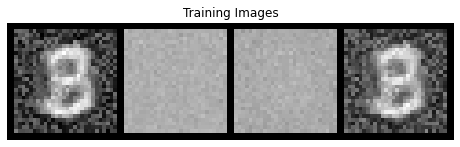

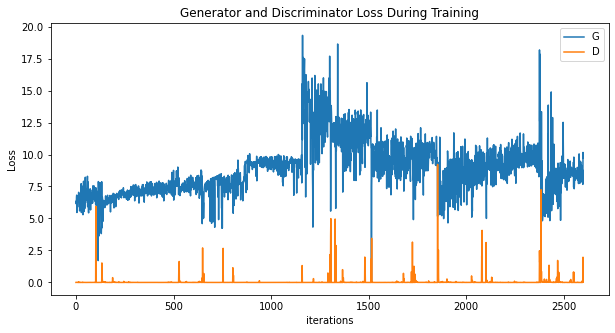

[0/3][2610/30000]	Loss_D: 0.0024	Loss_G: 7.8037	D(x): 1.0000	D(G(z)): 0.0024 / 0.0004
tensor([ 4.1101, -0.5598], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0022], grad_fn=<SliceBackward>)
tensor([-0.8277, -1.1708], grad_fn=<SliceBackward>)
[0/3][2620/30000]	Loss_D: 0.0128	Loss_G: 7.7556	D(x): 1.0000	D(G(z)): 0.0127 / 0.0005
tensor([ 4.1235, -0.5755], grad_fn=<SliceBackward>) tensor([-0.0090,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.8256, -1.1608], grad_fn=<SliceBackward>)
[0/3][2630/30000]	Loss_D: 0.0083	Loss_G: 7.9206	D(x): 1.0000	D(G(z)): 0.0082 / 0.0004
tensor([ 4.1452, -0.6044], grad_fn=<SliceBackward>) tensor([-0.0090,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.8235, -1.1526], grad_fn=<SliceBackward>)
[0/3][2640/30000]	Loss_D: 0.0031	Loss_G: 7.8096	D(x): 1.0000	D(G(z)): 0.0031 / 0.0004
tensor([ 4.1467, -0.6062], grad_fn=<SliceBackward>) tensor([-0.0090,  0.0023], grad_fn=<SliceBackward>)
tensor([-0.8183, -1.1428], grad_fn=<SliceBackward>)
[0/3][2650/30000]	Loss_D: 0.0009

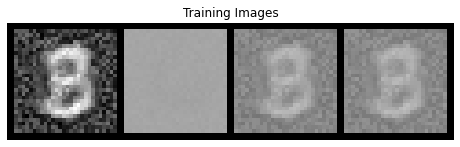

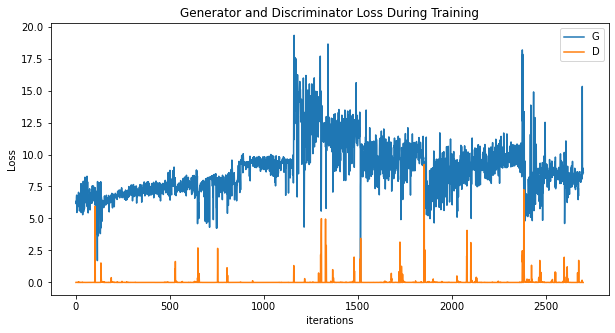

[0/3][2710/30000]	Loss_D: 0.0002	Loss_G: 8.4488	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 4.1994, -0.6627], grad_fn=<SliceBackward>) tensor([-0.0083,  0.0033], grad_fn=<SliceBackward>)
tensor([-0.7974, -1.0811], grad_fn=<SliceBackward>)
[0/3][2720/30000]	Loss_D: 0.0007	Loss_G: 8.8130	D(x): 1.0000	D(G(z)): 0.0007 / 0.0002
tensor([ 4.2008, -0.6615], grad_fn=<SliceBackward>) tensor([-0.0084,  0.0032], grad_fn=<SliceBackward>)
tensor([-0.7954, -1.0764], grad_fn=<SliceBackward>)
[0/3][2730/30000]	Loss_D: 0.0002	Loss_G: 8.5659	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 4.2027, -0.6613], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.7948, -1.0719], grad_fn=<SliceBackward>)
[0/3][2740/30000]	Loss_D: 0.0005	Loss_G: 8.8383	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
tensor([ 4.2053, -0.6619], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0029], grad_fn=<SliceBackward>)
tensor([-0.7922, -1.0657], grad_fn=<SliceBackward>)
[0/3][2750/30000]	Loss_D: 0.0002

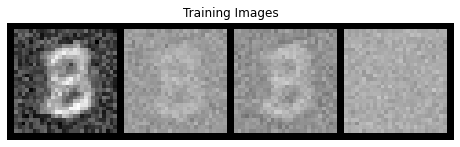

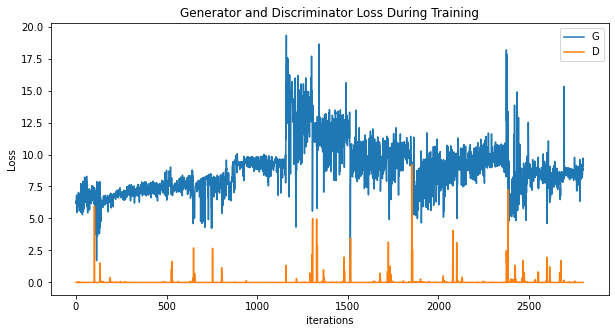

[0/3][2810/30000]	Loss_D: 0.0012	Loss_G: 8.4932	D(x): 1.0000	D(G(z)): 0.0012 / 0.0002
tensor([ 4.2159, -0.6669], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0028], grad_fn=<SliceBackward>)
tensor([-0.7691, -1.0229], grad_fn=<SliceBackward>)
[0/3][2820/30000]	Loss_D: 0.0006	Loss_G: 9.1051	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 4.2168, -0.6671], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0028], grad_fn=<SliceBackward>)
tensor([-0.7616, -1.0092], grad_fn=<SliceBackward>)
[0/3][2830/30000]	Loss_D: 0.0003	Loss_G: 8.1587	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
tensor([ 4.2176, -0.6674], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0028], grad_fn=<SliceBackward>)
tensor([-0.7548, -0.9986], grad_fn=<SliceBackward>)
[0/3][2840/30000]	Loss_D: 0.0005	Loss_G: 8.9555	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
tensor([ 4.2185, -0.6677], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0028], grad_fn=<SliceBackward>)
tensor([-0.7513, -0.9919], grad_fn=<SliceBackward>)
[0/3][2850/30000]	Loss_D: 0.0375

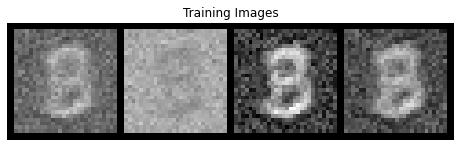

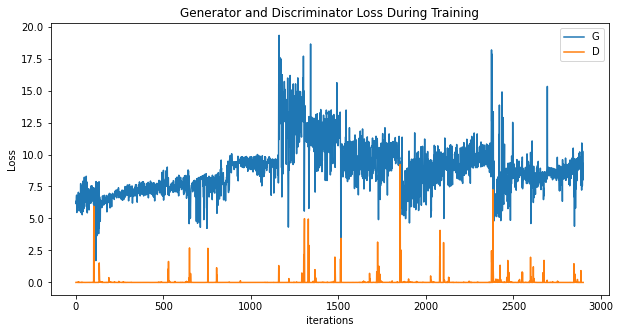

[0/3][2910/30000]	Loss_D: 0.0006	Loss_G: 8.7755	D(x): 1.0000	D(G(z)): 0.0006 / 0.0003
tensor([ 4.2586, -0.7276], grad_fn=<SliceBackward>) tensor([-0.0129, -0.0012], grad_fn=<SliceBackward>)
tensor([-0.7010, -0.9085], grad_fn=<SliceBackward>)
[0/3][2920/30000]	Loss_D: 0.0002	Loss_G: 8.2963	D(x): 1.0000	D(G(z)): 0.0002 / 0.0006
tensor([ 4.2599, -0.7314], grad_fn=<SliceBackward>) tensor([-0.0129, -0.0012], grad_fn=<SliceBackward>)
tensor([-0.6957, -0.9001], grad_fn=<SliceBackward>)
[0/3][2930/30000]	Loss_D: 0.0004	Loss_G: 6.9138	D(x): 1.0000	D(G(z)): 0.0004 / 0.0058
tensor([ 4.2611, -0.7346], grad_fn=<SliceBackward>) tensor([-0.0129, -0.0012], grad_fn=<SliceBackward>)
tensor([-0.6872, -0.8881], grad_fn=<SliceBackward>)
[0/3][2940/30000]	Loss_D: 0.0004	Loss_G: 7.6611	D(x): 1.0000	D(G(z)): 0.0004 / 0.0005
tensor([ 4.2623, -0.7376], grad_fn=<SliceBackward>) tensor([-0.0129, -0.0012], grad_fn=<SliceBackward>)
tensor([-0.6802, -0.8780], grad_fn=<SliceBackward>)
[0/3][2950/30000]	Loss_D: 0.0010

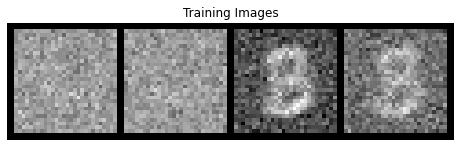

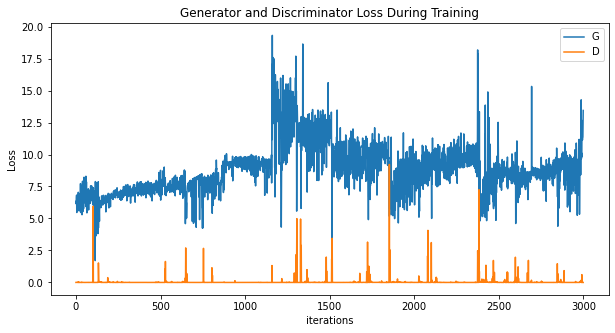

[0/3][3010/30000]	Loss_D: 0.0992	Loss_G: 5.2411	D(x): 1.0000	D(G(z)): 0.0944 / 0.4239
tensor([ 4.2721, -0.7575], grad_fn=<SliceBackward>) tensor([-0.0114,  0.0010], grad_fn=<SliceBackward>)
tensor([-0.6230, -0.8015], grad_fn=<SliceBackward>)
[0/3][3020/30000]	Loss_D: 0.0143	Loss_G: 9.4858	D(x): 1.0000	D(G(z)): 0.0141 / 0.0001
tensor([ 4.2769, -0.7603], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.6066, -0.7912], grad_fn=<SliceBackward>)
[0/3][3030/30000]	Loss_D: 1.8092	Loss_G: 9.1782	D(x): 1.0000	D(G(z)): 0.8356 / 0.0001
tensor([ 4.3243, -0.8084], grad_fn=<SliceBackward>) tensor([-0.0119,  0.0007], grad_fn=<SliceBackward>)
tensor([-0.6015, -0.7888], grad_fn=<SliceBackward>)
[0/3][3040/30000]	Loss_D: 0.0003	Loss_G: 8.6180	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 4.3296, -0.8136], grad_fn=<SliceBackward>) tensor([-0.0124,  0.0002], grad_fn=<SliceBackward>)
tensor([-0.5968, -0.7844], grad_fn=<SliceBackward>)
[0/3][3050/30000]	Loss_D: 0.0005

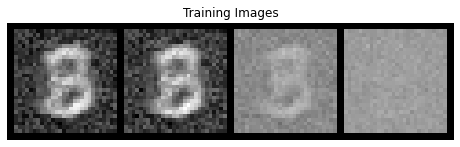

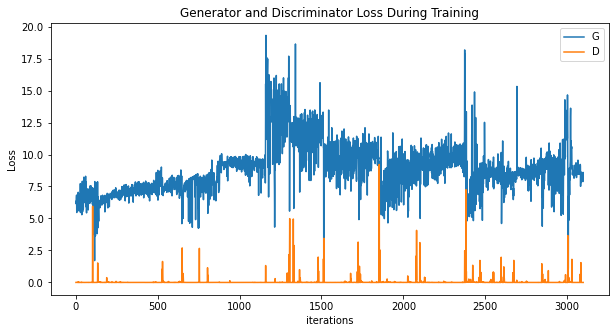

[0/3][3110/30000]	Loss_D: 0.0338	Loss_G: 8.7625	D(x): 1.0000	D(G(z)): 0.0333 / 0.0002
tensor([ 4.3400, -0.8211], grad_fn=<SliceBackward>) tensor([-0.0147, -0.0015], grad_fn=<SliceBackward>)
tensor([-0.5477, -0.7404], grad_fn=<SliceBackward>)
[0/3][3120/30000]	Loss_D: 0.0111	Loss_G: 8.0160	D(x): 1.0000	D(G(z)): 0.0111 / 0.0003
tensor([ 4.3401, -0.8216], grad_fn=<SliceBackward>) tensor([-0.0144, -0.0012], grad_fn=<SliceBackward>)
tensor([-0.5342, -0.7352], grad_fn=<SliceBackward>)
[0/3][3130/30000]	Loss_D: 0.0014	Loss_G: 8.3979	D(x): 1.0000	D(G(z)): 0.0014 / 0.0003
tensor([ 4.3402, -0.8218], grad_fn=<SliceBackward>) tensor([-0.0144, -0.0011], grad_fn=<SliceBackward>)
tensor([-0.5244, -0.7288], grad_fn=<SliceBackward>)
[0/3][3140/30000]	Loss_D: 0.1956	Loss_G: 8.3489	D(x): 1.0000	D(G(z)): 0.1776 / 0.0003
tensor([ 4.3404, -0.8219], grad_fn=<SliceBackward>) tensor([-0.0140, -0.0006], grad_fn=<SliceBackward>)
tensor([-0.5155, -0.7236], grad_fn=<SliceBackward>)
[0/3][3150/30000]	Loss_D: 0.0361

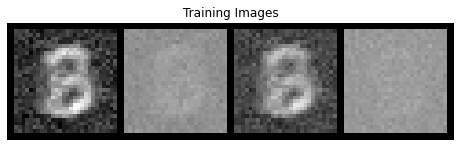

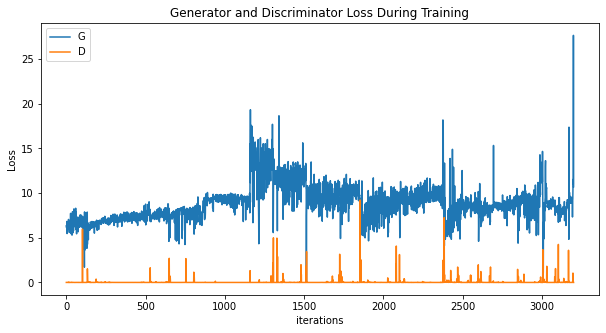

[0/3][3210/30000]	Loss_D: 0.0002	Loss_G: 9.4844	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 4.3928, -0.8788], grad_fn=<SliceBackward>) tensor([-0.0130,  0.0010], grad_fn=<SliceBackward>)
tensor([-0.4209, -0.6673], grad_fn=<SliceBackward>)
[0/3][3220/30000]	Loss_D: 0.0014	Loss_G: 11.3916	D(x): 1.0000	D(G(z)): 0.0014 / 0.0000
tensor([ 4.3902, -0.8736], grad_fn=<SliceBackward>) tensor([-0.0129,  0.0012], grad_fn=<SliceBackward>)
tensor([-0.4124, -0.6580], grad_fn=<SliceBackward>)
[0/3][3230/30000]	Loss_D: 0.0009	Loss_G: 12.7120	D(x): 1.0000	D(G(z)): 0.0009 / 0.0000
tensor([ 4.3894, -0.8730], grad_fn=<SliceBackward>) tensor([-0.0129,  0.0012], grad_fn=<SliceBackward>)
tensor([-0.3948, -0.6453], grad_fn=<SliceBackward>)
[0/3][3240/30000]	Loss_D: 0.0002	Loss_G: 9.5569	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 4.3889, -0.8727], grad_fn=<SliceBackward>) tensor([-0.0129,  0.0012], grad_fn=<SliceBackward>)
tensor([-0.3802, -0.6319], grad_fn=<SliceBackward>)
[0/3][3250/30000]	Loss_D: 0.00

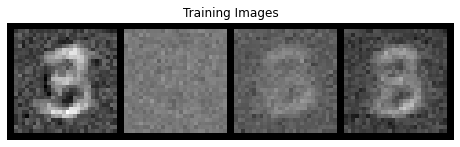

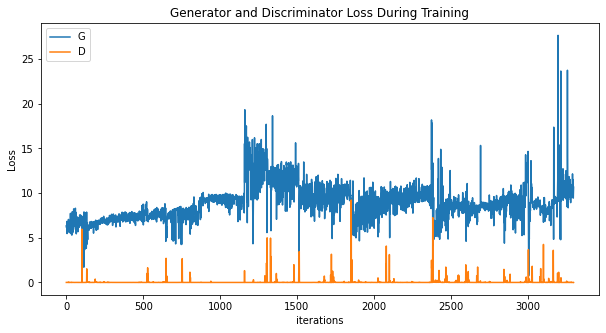

[0/3][3310/30000]	Loss_D: 0.0005	Loss_G: 9.5788	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 4.4073, -0.8791], grad_fn=<SliceBackward>) tensor([-0.0127,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.3027, -0.5748], grad_fn=<SliceBackward>)
[0/3][3320/30000]	Loss_D: 0.0005	Loss_G: 10.7081	D(x): 1.0000	D(G(z)): 0.0005 / 0.0000
tensor([ 4.4104, -0.8808], grad_fn=<SliceBackward>) tensor([-0.0127,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.2930, -0.5683], grad_fn=<SliceBackward>)
[0/3][3330/30000]	Loss_D: 0.0001	Loss_G: 10.4198	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 4.4146, -0.8830], grad_fn=<SliceBackward>) tensor([-0.0127,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.2844, -0.5622], grad_fn=<SliceBackward>)
[0/3][3340/30000]	Loss_D: 0.0089	Loss_G: 10.0187	D(x): 1.0000	D(G(z)): 0.0088 / 0.0000
tensor([ 4.4240, -0.8884], grad_fn=<SliceBackward>) tensor([-0.0127,  0.0015], grad_fn=<SliceBackward>)
tensor([-0.2707, -0.5542], grad_fn=<SliceBackward>)
[0/3][3350/30000]	Loss_D: 0.0

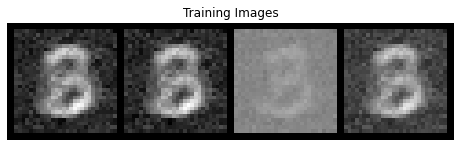

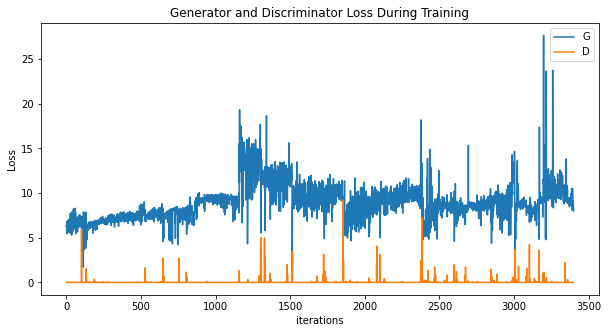

[0/3][3410/30000]	Loss_D: 0.0002	Loss_G: 8.1330	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
tensor([ 4.4368, -0.8967], grad_fn=<SliceBackward>) tensor([-0.0084,  0.0060], grad_fn=<SliceBackward>)
tensor([-0.2369, -0.5060], grad_fn=<SliceBackward>)
[0/3][3420/30000]	Loss_D: 0.0106	Loss_G: 9.0695	D(x): 1.0000	D(G(z)): 0.0106 / 0.0002
tensor([ 4.4394, -0.9007], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0054], grad_fn=<SliceBackward>)
tensor([-0.2305, -0.4974], grad_fn=<SliceBackward>)
[0/3][3430/30000]	Loss_D: 0.0011	Loss_G: 7.2735	D(x): 1.0000	D(G(z)): 0.0011 / 0.0015
tensor([ 4.4419, -0.9038], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0054], grad_fn=<SliceBackward>)
tensor([-0.2232, -0.4892], grad_fn=<SliceBackward>)
[0/3][3440/30000]	Loss_D: 0.0211	Loss_G: 9.0239	D(x): 1.0000	D(G(z)): 0.0207 / 0.0001
tensor([ 4.4480, -0.9100], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0054], grad_fn=<SliceBackward>)
tensor([-0.2170, -0.4827], grad_fn=<SliceBackward>)
[0/3][3450/30000]	Loss_D: 0.0000

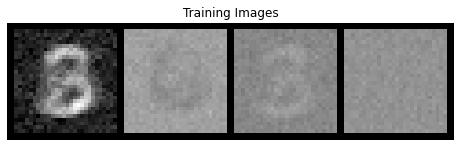

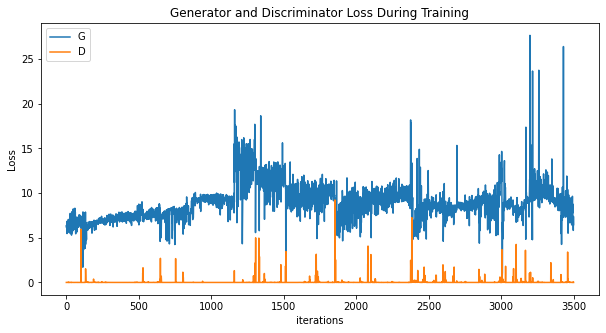

[0/3][3510/30000]	Loss_D: 0.0047	Loss_G: 7.2047	D(x): 1.0000	D(G(z)): 0.0047 / 0.0014
tensor([ 4.4641, -0.9196], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0046], grad_fn=<SliceBackward>)
tensor([-0.1579, -0.4336], grad_fn=<SliceBackward>)
[0/3][3520/30000]	Loss_D: 0.0062	Loss_G: 17.2253	D(x): 1.0000	D(G(z)): 0.0062 / 0.0011
tensor([ 4.4646, -0.9191], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.1494, -0.4277], grad_fn=<SliceBackward>)
[0/3][3530/30000]	Loss_D: 0.0030	Loss_G: 8.4848	D(x): 1.0000	D(G(z)): 0.0030 / 0.0003
tensor([ 4.4652, -0.9186], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.1461, -0.4240], grad_fn=<SliceBackward>)
[0/3][3540/30000]	Loss_D: 0.0045	Loss_G: 9.2158	D(x): 1.0000	D(G(z)): 0.0045 / 0.0001
tensor([ 4.4659, -0.9183], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0048], grad_fn=<SliceBackward>)
tensor([-0.1363, -0.4158], grad_fn=<SliceBackward>)
[0/3][3550/30000]	Loss_D: 0.000

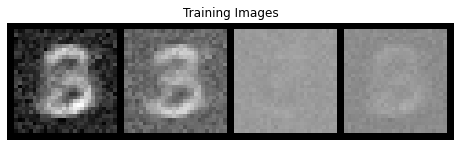

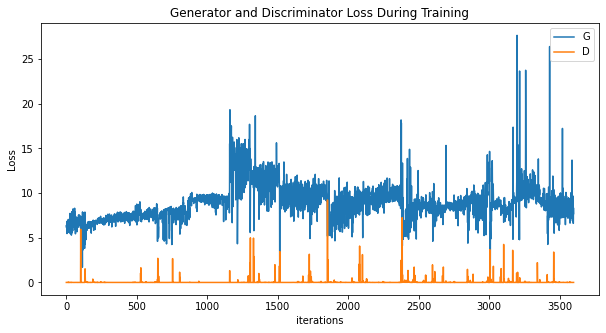

[0/3][3610/30000]	Loss_D: 0.4173	Loss_G: 4.6977	D(x): 1.0000	D(G(z)): 0.3330 / 0.0092
tensor([ 4.4673, -0.9137], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0055], grad_fn=<SliceBackward>)
tensor([-0.0804, -0.3702], grad_fn=<SliceBackward>)
[0/3][3620/30000]	Loss_D: 0.0125	Loss_G: 8.3872	D(x): 1.0000	D(G(z)): 0.0123 / 0.0003
tensor([ 4.4787, -0.9234], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0061], grad_fn=<SliceBackward>)
tensor([-0.0738, -0.3649], grad_fn=<SliceBackward>)
[0/3][3630/30000]	Loss_D: 0.0001	Loss_G: 7.9762	D(x): 1.0000	D(G(z)): 0.0001 / 0.0004
tensor([ 4.5084, -0.9516], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0064], grad_fn=<SliceBackward>)
tensor([-0.0707, -0.3624], grad_fn=<SliceBackward>)
[0/3][3640/30000]	Loss_D: 0.0004	Loss_G: 8.0711	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
tensor([ 4.5105, -0.9498], grad_fn=<SliceBackward>) tensor([-0.0084,  0.0065], grad_fn=<SliceBackward>)
tensor([-0.0688, -0.3603], grad_fn=<SliceBackward>)
[0/3][3650/30000]	Loss_D: 0.0004

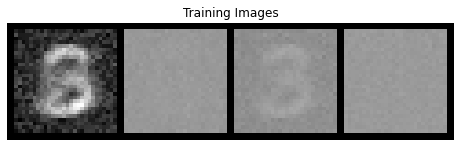

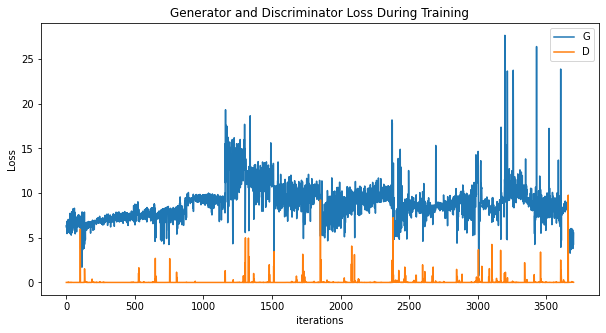

[0/3][3710/30000]	Loss_D: 0.0140	Loss_G: 3.9734	D(x): 1.0000	D(G(z)): 0.0139 / 0.0193
tensor([ 4.5171, -0.9635], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0062], grad_fn=<SliceBackward>)
tensor([-0.0474, -0.3379], grad_fn=<SliceBackward>)
[0/3][3720/30000]	Loss_D: 0.0110	Loss_G: 5.7250	D(x): 1.0000	D(G(z)): 0.0109 / 0.0033
tensor([ 4.5166, -0.9632], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0063], grad_fn=<SliceBackward>)
tensor([-0.0449, -0.3351], grad_fn=<SliceBackward>)
[0/3][3730/30000]	Loss_D: 0.0133	Loss_G: 5.7797	D(x): 0.9996	D(G(z)): 0.0127 / 0.0031
tensor([ 4.5163, -0.9630], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0064], grad_fn=<SliceBackward>)
tensor([-0.0374, -0.3305], grad_fn=<SliceBackward>)
[0/3][3740/30000]	Loss_D: 0.0095	Loss_G: 5.7046	D(x): 1.0000	D(G(z)): 0.0095 / 0.0033
tensor([ 4.5160, -0.9626], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0065], grad_fn=<SliceBackward>)
tensor([-0.0357, -0.3283], grad_fn=<SliceBackward>)
[0/3][3750/30000]	Loss_D: 0.0110

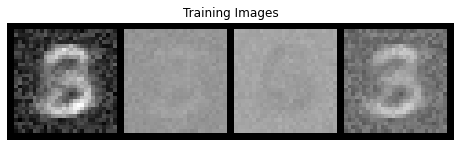

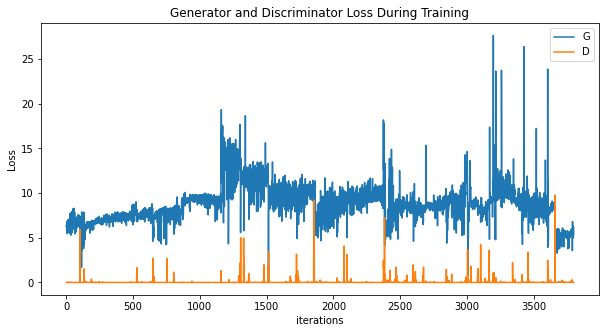

[0/3][3810/30000]	Loss_D: 0.0043	Loss_G: 6.1538	D(x): 1.0000	D(G(z)): 0.0042 / 0.0021
tensor([ 4.5246, -0.9681], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0068], grad_fn=<SliceBackward>)
tensor([-0.0160, -0.3079], grad_fn=<SliceBackward>)
[0/3][3820/30000]	Loss_D: 0.0027	Loss_G: 6.1329	D(x): 1.0000	D(G(z)): 0.0027 / 0.0022
tensor([ 4.5301, -0.9728], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0068], grad_fn=<SliceBackward>)
tensor([-0.0129, -0.3045], grad_fn=<SliceBackward>)
[0/3][3830/30000]	Loss_D: 0.0148	Loss_G: 5.9594	D(x): 1.0000	D(G(z)): 0.0146 / 0.0026
tensor([ 4.5400, -0.9815], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0068], grad_fn=<SliceBackward>)
tensor([-0.0103, -0.3036], grad_fn=<SliceBackward>)
[0/3][3840/30000]	Loss_D: 0.0207	Loss_G: 5.7286	D(x): 1.0000	D(G(z)): 0.0204 / 0.0033
tensor([ 4.5589, -0.9972], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0068], grad_fn=<SliceBackward>)
tensor([-0.0048, -0.3002], grad_fn=<SliceBackward>)
[0/3][3850/30000]	Loss_D: 0.4406

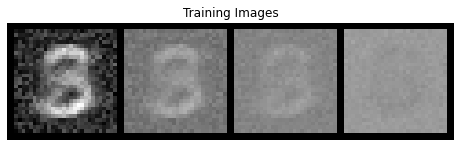

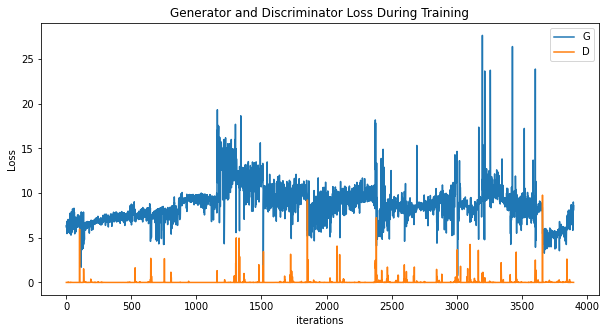

[0/3][3910/30000]	Loss_D: 0.0020	Loss_G: 7.7519	D(x): 1.0000	D(G(z)): 0.0020 / 0.0005
tensor([ 4.5906, -1.0234], grad_fn=<SliceBackward>) tensor([-0.0093,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.0366, -0.2496], grad_fn=<SliceBackward>)
[0/3][3920/30000]	Loss_D: 0.0062	Loss_G: 7.8161	D(x): 1.0000	D(G(z)): 0.0062 / 0.0005
tensor([ 4.5904, -1.0232], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.0409, -0.2434], grad_fn=<SliceBackward>)
[0/3][3930/30000]	Loss_D: 0.0015	Loss_G: 8.3549	D(x): 1.0000	D(G(z)): 0.0015 / 0.0002
tensor([ 4.5902, -1.0230], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0475, -0.2358], grad_fn=<SliceBackward>)
[0/3][3940/30000]	Loss_D: 0.0020	Loss_G: 7.1783	D(x): 1.0000	D(G(z)): 0.0020 / 0.0008
tensor([ 4.5900, -1.0228], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0517, -0.2293], grad_fn=<SliceBackward>)
[0/3][3950/30000]	Loss_D: 0.0135

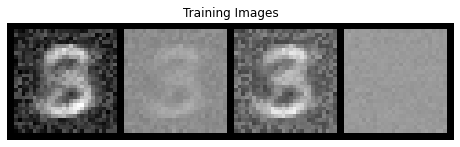

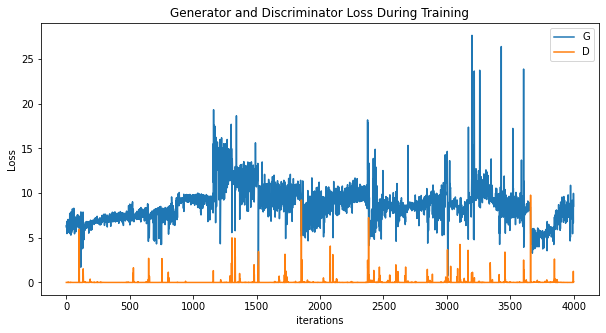

[0/3][4010/30000]	Loss_D: 0.0685	Loss_G: 8.5752	D(x): 1.0000	D(G(z)): 0.0650 / 0.0002
tensor([ 4.5962, -1.0256], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0071], grad_fn=<SliceBackward>)
tensor([ 0.0962, -0.1773], grad_fn=<SliceBackward>)
[0/3][4020/30000]	Loss_D: 0.0133	Loss_G: 8.0664	D(x): 1.0000	D(G(z)): 0.0132 / 0.0003
tensor([ 4.6114, -1.0376], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1067, -0.1688], grad_fn=<SliceBackward>)
[0/3][4030/30000]	Loss_D: 0.0008	Loss_G: 8.7192	D(x): 1.0000	D(G(z)): 0.0008 / 0.0002
tensor([ 4.6332, -1.0610], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0076], grad_fn=<SliceBackward>)
tensor([ 0.1130, -0.1607], grad_fn=<SliceBackward>)
[0/3][4040/30000]	Loss_D: 0.0016	Loss_G: 8.8230	D(x): 1.0000	D(G(z)): 0.0016 / 0.0001
tensor([ 4.6467, -1.0782], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0076], grad_fn=<SliceBackward>)
tensor([ 0.1159, -0.1564], grad_fn=<SliceBackward>)
[0/3][4050/30000]	Loss_D: 0.0001

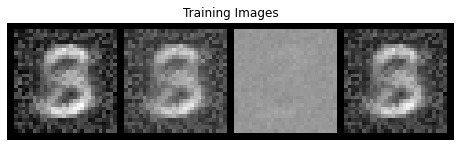

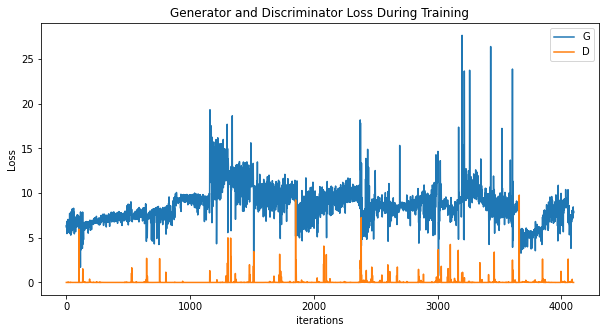

[0/3][4110/30000]	Loss_D: 0.0011	Loss_G: 7.7380	D(x): 1.0000	D(G(z)): 0.0011 / 0.0004
tensor([ 4.7013, -1.1269], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1277, -0.1604], grad_fn=<SliceBackward>)
[0/3][4120/30000]	Loss_D: 0.0011	Loss_G: 7.3676	D(x): 1.0000	D(G(z)): 0.0011 / 0.0007
tensor([ 4.7020, -1.1270], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1274, -0.1605], grad_fn=<SliceBackward>)
[0/3][4130/30000]	Loss_D: 0.0009	Loss_G: 7.7150	D(x): 1.0000	D(G(z)): 0.0009 / 0.0005
tensor([ 4.7027, -1.1271], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1265, -0.1623], grad_fn=<SliceBackward>)
[0/3][4140/30000]	Loss_D: 0.0005	Loss_G: 7.4505	D(x): 1.0000	D(G(z)): 0.0005 / 0.0006
tensor([ 4.7034, -1.1271], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1255, -0.1648], grad_fn=<SliceBackward>)
[0/3][4150/30000]	Loss_D: 0.0008

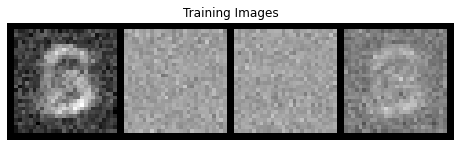

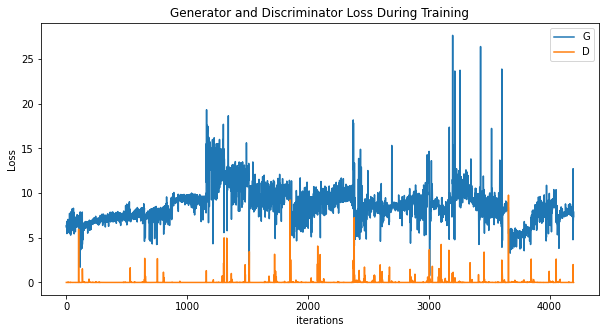

[0/3][4210/30000]	Loss_D: 0.0053	Loss_G: 8.3537	D(x): 1.0000	D(G(z)): 0.0052 / 0.0003
tensor([ 4.7200, -1.1422], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0089], grad_fn=<SliceBackward>)
tensor([ 0.1254, -0.1811], grad_fn=<SliceBackward>)
[0/3][4220/30000]	Loss_D: 0.0033	Loss_G: 9.0999	D(x): 1.0000	D(G(z)): 0.0033 / 0.0001
tensor([ 4.7316, -1.1538], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0089], grad_fn=<SliceBackward>)
tensor([ 0.1260, -0.1817], grad_fn=<SliceBackward>)
[0/3][4230/30000]	Loss_D: 0.0005	Loss_G: 8.0354	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
tensor([ 4.7386, -1.1594], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0089], grad_fn=<SliceBackward>)
tensor([ 0.1257, -0.1834], grad_fn=<SliceBackward>)
[0/3][4240/30000]	Loss_D: 0.0004	Loss_G: 8.4380	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 4.7469, -1.1648], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0090], grad_fn=<SliceBackward>)
tensor([ 0.1273, -0.1829], grad_fn=<SliceBackward>)
[0/3][4250/30000]	Loss_D: 0.0007

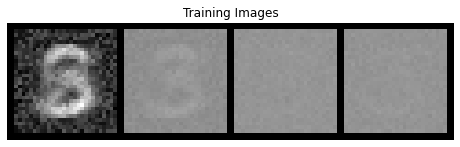

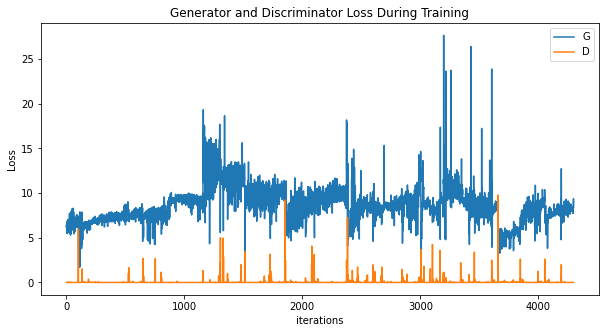

[0/3][4310/30000]	Loss_D: 0.0043	Loss_G: 8.1148	D(x): 1.0000	D(G(z)): 0.0043 / 0.0003
tensor([ 4.8390, -1.2221], grad_fn=<SliceBackward>) tensor([-0.0062,  0.0090], grad_fn=<SliceBackward>)
tensor([ 0.1324, -0.1801], grad_fn=<SliceBackward>)
[0/3][4320/30000]	Loss_D: 0.0027	Loss_G: 8.2014	D(x): 1.0000	D(G(z)): 0.0027 / 0.0003
tensor([ 4.8611, -1.2371], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0086], grad_fn=<SliceBackward>)
tensor([ 0.1344, -0.1791], grad_fn=<SliceBackward>)
[0/3][4330/30000]	Loss_D: 0.0008	Loss_G: 8.1257	D(x): 1.0000	D(G(z)): 0.0008 / 0.0003
tensor([ 4.8700, -1.2394], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1357, -0.1787], grad_fn=<SliceBackward>)
[0/3][4340/30000]	Loss_D: 0.0002	Loss_G: 8.6701	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 4.8701, -1.2393], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1404, -0.1741], grad_fn=<SliceBackward>)
[0/3][4350/30000]	Loss_D: 0.0009

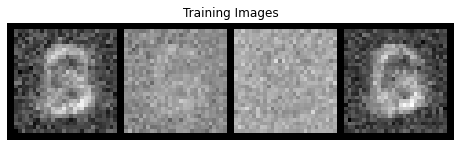

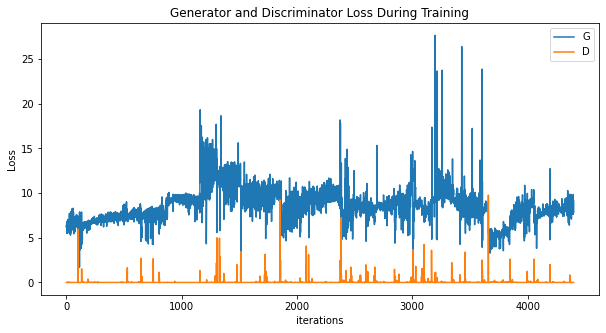

[0/3][4410/30000]	Loss_D: 0.0016	Loss_G: 9.5017	D(x): 1.0000	D(G(z)): 0.0016 / 0.0001
tensor([ 4.8805, -1.2449], grad_fn=<SliceBackward>) tensor([-0.0066,  0.0087], grad_fn=<SliceBackward>)
tensor([ 0.1707, -0.1681], grad_fn=<SliceBackward>)
[0/3][4420/30000]	Loss_D: 0.0041	Loss_G: 9.3465	D(x): 1.0000	D(G(z)): 0.0041 / 0.0001
tensor([ 4.9064, -1.2700], grad_fn=<SliceBackward>) tensor([-0.0064,  0.0088], grad_fn=<SliceBackward>)
tensor([ 0.1709, -0.1699], grad_fn=<SliceBackward>)
[0/3][4430/30000]	Loss_D: 0.0000	Loss_G: 8.9869	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 4.9330, -1.2899], grad_fn=<SliceBackward>) tensor([-0.0064,  0.0088], grad_fn=<SliceBackward>)
tensor([ 0.1699, -0.1711], grad_fn=<SliceBackward>)
[0/3][4440/30000]	Loss_D: 0.0013	Loss_G: 8.6220	D(x): 1.0000	D(G(z)): 0.0013 / 0.0002
tensor([ 4.9420, -1.2968], grad_fn=<SliceBackward>) tensor([-0.0065,  0.0088], grad_fn=<SliceBackward>)
tensor([ 0.1694, -0.1726], grad_fn=<SliceBackward>)
[0/3][4450/30000]	Loss_D: 0.0000

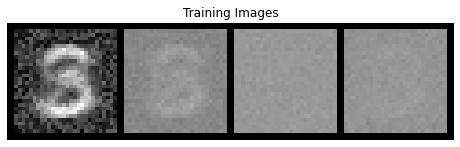

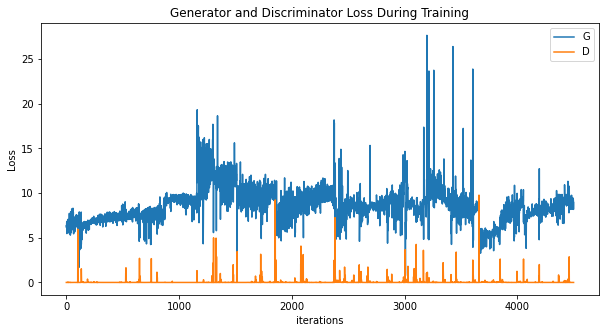

[0/3][4510/30000]	Loss_D: 0.0053	Loss_G: 8.4002	D(x): 1.0000	D(G(z)): 0.0053 / 0.0002
tensor([ 5.0045, -1.3564], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0100], grad_fn=<SliceBackward>)
tensor([ 0.1682, -0.1940], grad_fn=<SliceBackward>)
[0/3][4520/30000]	Loss_D: 0.0299	Loss_G: 10.0928	D(x): 1.0000	D(G(z)): 0.0290 / 0.0000
tensor([ 5.0208, -1.3805], grad_fn=<SliceBackward>) tensor([-0.0051,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1630, -0.2006], grad_fn=<SliceBackward>)
[0/3][4530/30000]	Loss_D: 0.0010	Loss_G: 10.1587	D(x): 1.0000	D(G(z)): 0.0010 / 0.0000
tensor([ 5.0273, -1.3995], grad_fn=<SliceBackward>) tensor([-0.0051,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1616, -0.2014], grad_fn=<SliceBackward>)
[0/3][4540/30000]	Loss_D: 0.0000	Loss_G: 9.0303	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.0321, -1.3975], grad_fn=<SliceBackward>) tensor([-0.0051,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1592, -0.2024], grad_fn=<SliceBackward>)
[0/3][4550/30000]	Loss_D: 0.00

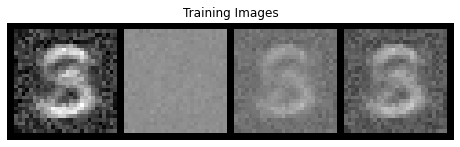

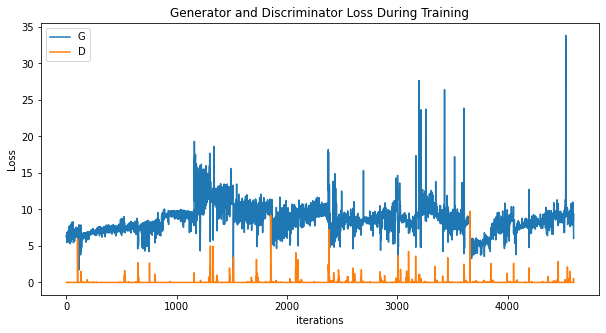

[0/3][4610/30000]	Loss_D: 0.0004	Loss_G: 9.3025	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 5.1119, -1.4360], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0092], grad_fn=<SliceBackward>)
tensor([ 0.1539, -0.2067], grad_fn=<SliceBackward>)
[0/3][4620/30000]	Loss_D: 0.0015	Loss_G: 10.3798	D(x): 1.0000	D(G(z)): 0.0015 / 0.0000
tensor([ 5.1348, -1.4353], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0091], grad_fn=<SliceBackward>)
tensor([ 0.1518, -0.2086], grad_fn=<SliceBackward>)
[0/3][4630/30000]	Loss_D: 0.0006	Loss_G: 8.2539	D(x): 0.9997	D(G(z)): 0.0004 / 0.0003
tensor([ 5.1353, -1.4323], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0091], grad_fn=<SliceBackward>)
tensor([ 0.1502, -0.2116], grad_fn=<SliceBackward>)
[0/3][4640/30000]	Loss_D: 0.0006	Loss_G: 9.9142	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 5.1347, -1.4299], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0091], grad_fn=<SliceBackward>)
tensor([ 0.1490, -0.2133], grad_fn=<SliceBackward>)
[0/3][4650/30000]	Loss_D: 0.000

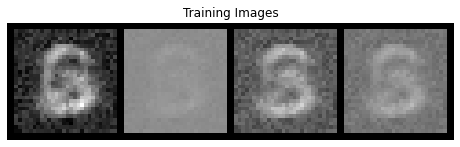

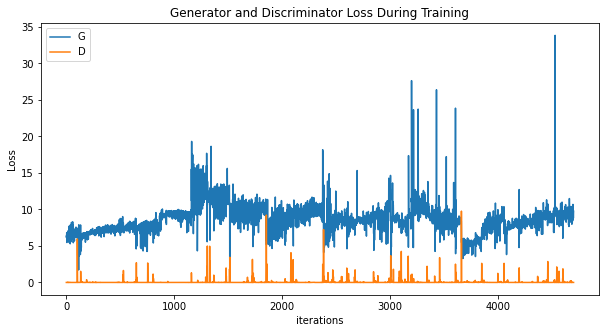

[0/3][4710/30000]	Loss_D: 0.0002	Loss_G: 9.1114	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 5.1447, -1.4582], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0095], grad_fn=<SliceBackward>)
tensor([ 0.1231, -0.2447], grad_fn=<SliceBackward>)
[0/3][4720/30000]	Loss_D: 0.0012	Loss_G: 10.1778	D(x): 1.0000	D(G(z)): 0.0012 / 0.0000
tensor([ 5.1440, -1.4864], grad_fn=<SliceBackward>) tensor([-0.0062,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.0901, -0.2855], grad_fn=<SliceBackward>)
[0/3][4730/30000]	Loss_D: 0.0003	Loss_G: 9.2336	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.1387, -1.5053], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.0860, -0.2918], grad_fn=<SliceBackward>)
[0/3][4740/30000]	Loss_D: 0.0001	Loss_G: 10.3722	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.1457, -1.5015], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.0849, -0.2964], grad_fn=<SliceBackward>)
[0/3][4750/30000]	Loss_D: 0.00

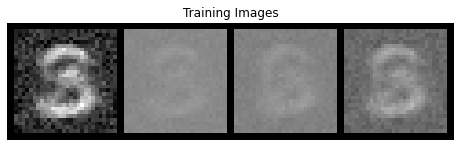

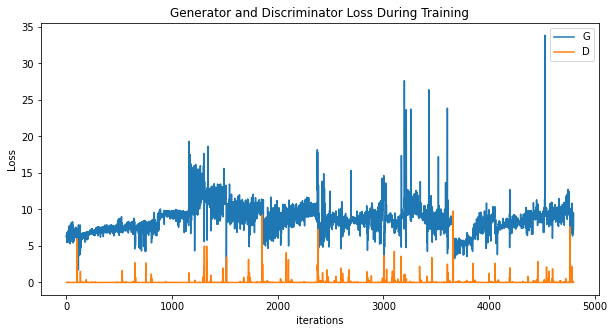

[0/3][4810/30000]	Loss_D: 0.0011	Loss_G: 8.9863	D(x): 1.0000	D(G(z)): 0.0011 / 0.0002
tensor([ 5.1856, -1.5486], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.0920, -0.3118], grad_fn=<SliceBackward>)
[0/3][4820/30000]	Loss_D: 0.0003	Loss_G: 9.1445	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.1782, -1.5741], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.0868, -0.3239], grad_fn=<SliceBackward>)
[0/3][4830/30000]	Loss_D: 0.0324	Loss_G: 6.5462	D(x): 1.0000	D(G(z)): 0.0319 / 0.0016
tensor([ 5.1718, -1.5905], grad_fn=<SliceBackward>) tensor([-0.0095,  0.0065], grad_fn=<SliceBackward>)
tensor([ 0.0857, -0.3274], grad_fn=<SliceBackward>)
[0/3][4840/30000]	Loss_D: 0.0013	Loss_G: 9.3178	D(x): 1.0000	D(G(z)): 0.0013 / 0.0001
tensor([ 5.1696, -1.5988], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.0895, -0.3293], grad_fn=<SliceBackward>)
[0/3][4850/30000]	Loss_D: 0.0007

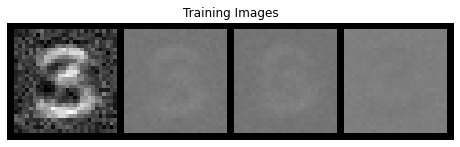

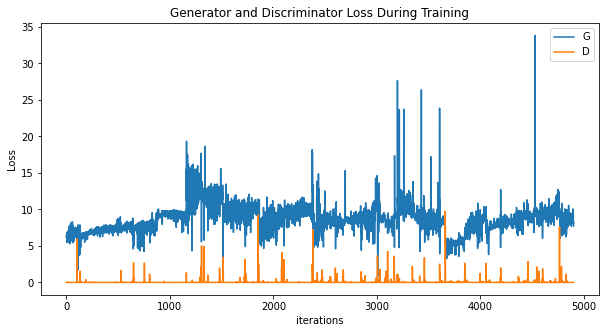

[0/3][4910/30000]	Loss_D: 0.0013	Loss_G: 5.7132	D(x): 1.0000	D(G(z)): 0.0013 / 0.0260
tensor([ 5.1472, -1.6838], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.1076, -0.3490], grad_fn=<SliceBackward>)
[0/3][4920/30000]	Loss_D: 0.0025	Loss_G: 8.8869	D(x): 1.0000	D(G(z)): 0.0025 / 0.0002
tensor([ 5.1411, -1.7022], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.1092, -0.3515], grad_fn=<SliceBackward>)
[0/3][4930/30000]	Loss_D: 1.2339	Loss_G: 8.7677	D(x): 1.0000	D(G(z)): 0.6684 / 0.0004
tensor([ 5.1371, -1.7082], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.1109, -0.3523], grad_fn=<SliceBackward>)
[0/3][4940/30000]	Loss_D: 0.4170	Loss_G: 7.1817	D(x): 0.7214	D(G(z)): 0.0097 / 0.0011
tensor([ 5.1381, -1.7161], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.1126, -0.3530], grad_fn=<SliceBackward>)
[0/3][4950/30000]	Loss_D: 0.0027

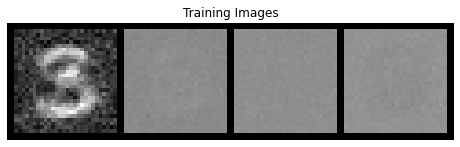

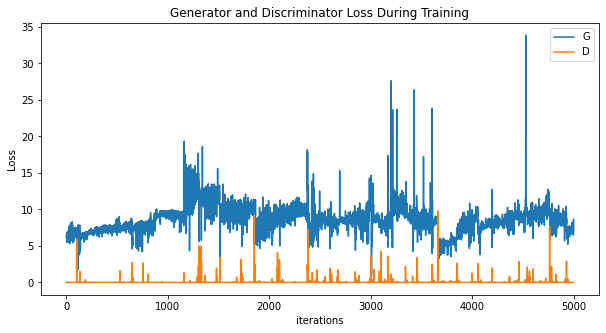

[0/3][5010/30000]	Loss_D: 0.0022	Loss_G: 7.2867	D(x): 0.9999	D(G(z)): 0.0021 / 0.0007
tensor([ 5.1153, -1.7666], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0079], grad_fn=<SliceBackward>)
tensor([ 0.1228, -0.3685], grad_fn=<SliceBackward>)
[0/3][5020/30000]	Loss_D: 0.0161	Loss_G: 7.8570	D(x): 1.0000	D(G(z)): 0.0160 / 0.0004
tensor([ 5.1136, -1.7643], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0077], grad_fn=<SliceBackward>)
tensor([ 0.1295, -0.3671], grad_fn=<SliceBackward>)
[0/3][5030/30000]	Loss_D: 0.0062	Loss_G: 7.9080	D(x): 1.0000	D(G(z)): 0.0062 / 0.0004
tensor([ 5.1128, -1.7644], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.1399, -0.3709], grad_fn=<SliceBackward>)
[0/3][5040/30000]	Loss_D: 0.0031	Loss_G: 8.0050	D(x): 1.0000	D(G(z)): 0.0031 / 0.0004
tensor([ 5.1122, -1.7646], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0079], grad_fn=<SliceBackward>)
tensor([ 0.1437, -0.3719], grad_fn=<SliceBackward>)
[0/3][5050/30000]	Loss_D: 0.0009

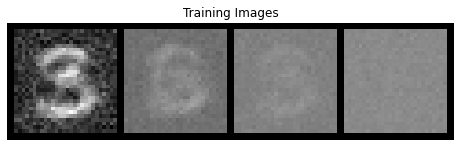

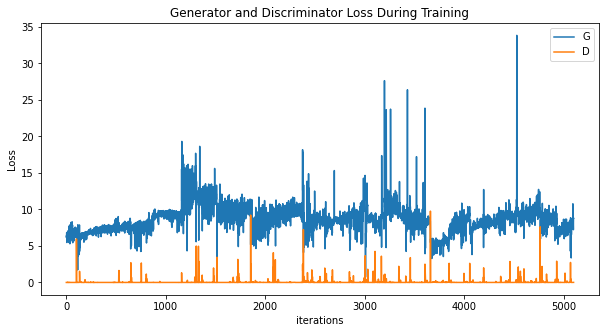

[0/3][5110/30000]	Loss_D: 0.0042	Loss_G: 4.8924	D(x): 1.0000	D(G(z)): 0.0041 / 0.1143
tensor([ 5.0984, -1.7987], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0083], grad_fn=<SliceBackward>)
tensor([ 0.1731, -0.3793], grad_fn=<SliceBackward>)
[0/3][5120/30000]	Loss_D: 0.0009	Loss_G: 8.2611	D(x): 1.0000	D(G(z)): 0.0009 / 0.0003
tensor([ 5.1026, -1.7995], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0083], grad_fn=<SliceBackward>)
tensor([ 0.1770, -0.3825], grad_fn=<SliceBackward>)
[0/3][5130/30000]	Loss_D: 0.0006	Loss_G: 9.6736	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 5.1254, -1.8118], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0091], grad_fn=<SliceBackward>)
tensor([ 0.1787, -0.3843], grad_fn=<SliceBackward>)
[0/3][5140/30000]	Loss_D: 0.0006	Loss_G: 9.5008	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 5.1293, -1.8085], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0085], grad_fn=<SliceBackward>)
tensor([ 0.1792, -0.3867], grad_fn=<SliceBackward>)
[0/3][5150/30000]	Loss_D: 0.0006

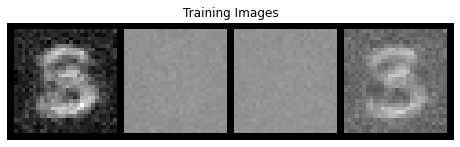

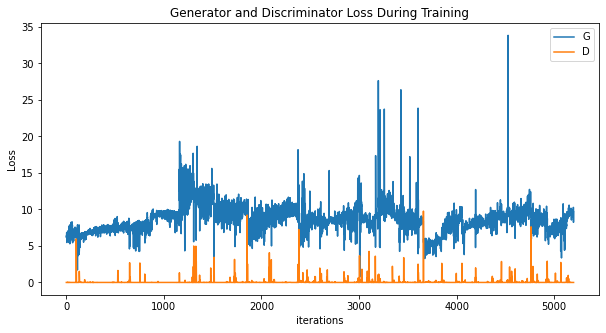

[0/3][5210/30000]	Loss_D: 0.0002	Loss_G: 8.6238	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 5.1704, -1.8087], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.1819, -0.3973], grad_fn=<SliceBackward>)
[0/3][5220/30000]	Loss_D: 0.0004	Loss_G: 9.0363	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 5.1712, -1.8083], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.1827, -0.3977], grad_fn=<SliceBackward>)
[0/3][5230/30000]	Loss_D: 0.0003	Loss_G: 9.7486	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.1721, -1.8080], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.1824, -0.3963], grad_fn=<SliceBackward>)
[0/3][5240/30000]	Loss_D: 0.0002	Loss_G: 9.1499	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 5.1730, -1.8077], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.1833, -0.3950], grad_fn=<SliceBackward>)
[0/3][5250/30000]	Loss_D: 0.0002

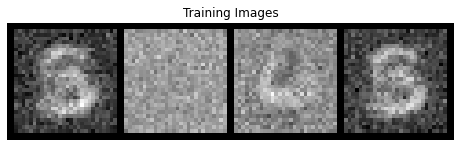

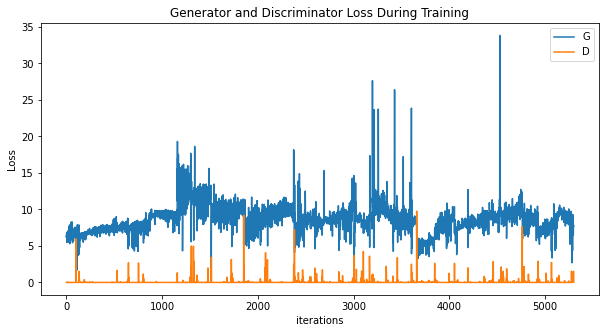

[0/3][5310/30000]	Loss_D: 0.0008	Loss_G: 8.5430	D(x): 1.0000	D(G(z)): 0.0008 / 0.0002
tensor([ 5.1909, -1.8438], grad_fn=<SliceBackward>) tensor([-0.0095,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.1797, -0.4046], grad_fn=<SliceBackward>)
[0/3][5320/30000]	Loss_D: 0.0073	Loss_G: 8.3948	D(x): 1.0000	D(G(z)): 0.0073 / 0.0002
tensor([ 5.1898, -1.8431], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.1774, -0.4053], grad_fn=<SliceBackward>)
[0/3][5330/30000]	Loss_D: 0.1670	Loss_G: 7.8730	D(x): 1.0000	D(G(z)): 0.1435 / 0.0004
tensor([ 5.1954, -1.8488], grad_fn=<SliceBackward>) tensor([-0.0093,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.1732, -0.4133], grad_fn=<SliceBackward>)
[0/3][5340/30000]	Loss_D: 0.0004	Loss_G: 8.7581	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 5.2187, -1.8610], grad_fn=<SliceBackward>) tensor([-0.0090,  0.0068], grad_fn=<SliceBackward>)
tensor([ 0.1737, -0.4132], grad_fn=<SliceBackward>)
[0/3][5350/30000]	Loss_D: 0.0001

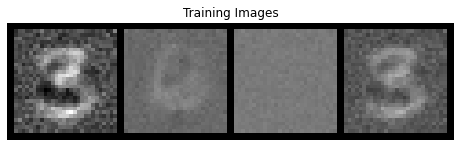

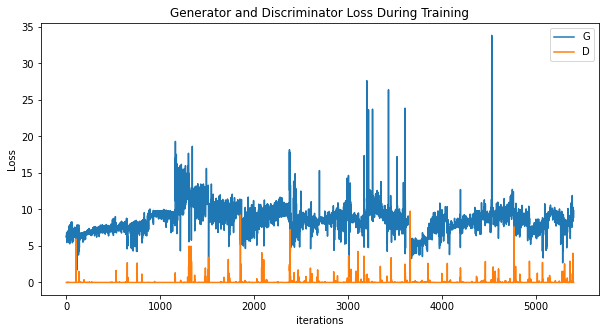

[0/3][5410/30000]	Loss_D: 0.0003	Loss_G: 9.5173	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.2651, -1.8761], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0081], grad_fn=<SliceBackward>)
tensor([ 0.1426, -0.4393], grad_fn=<SliceBackward>)
[0/3][5420/30000]	Loss_D: 0.0012	Loss_G: 8.5432	D(x): 1.0000	D(G(z)): 0.0012 / 0.0017
tensor([ 5.2652, -1.8756], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0081], grad_fn=<SliceBackward>)
tensor([ 0.1401, -0.4409], grad_fn=<SliceBackward>)
[0/3][5430/30000]	Loss_D: 0.0108	Loss_G: 10.1221	D(x): 1.0000	D(G(z)): 0.0107 / 0.0000
tensor([ 5.2655, -1.8777], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0082], grad_fn=<SliceBackward>)
tensor([ 0.1356, -0.4449], grad_fn=<SliceBackward>)
[0/3][5440/30000]	Loss_D: 0.0006	Loss_G: 10.0170	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 5.2744, -1.9255], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0079], grad_fn=<SliceBackward>)
tensor([ 0.1299, -0.4474], grad_fn=<SliceBackward>)
[0/3][5450/30000]	Loss_D: 0.00

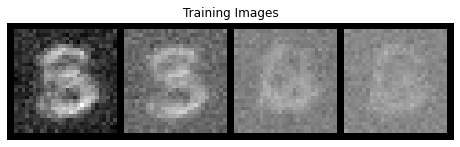

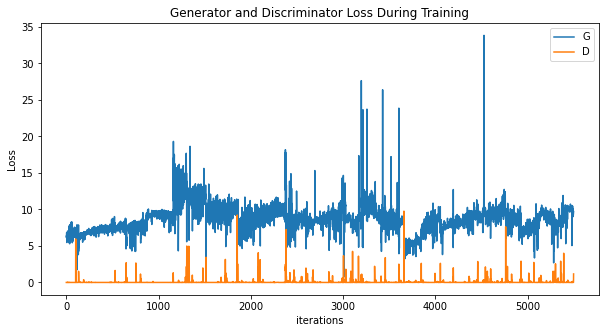

[0/3][5510/30000]	Loss_D: 0.0000	Loss_G: 8.8671	D(x): 1.0000	D(G(z)): 0.0000 / 0.0002
tensor([ 5.2910, -1.9947], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.1021, -0.4632], grad_fn=<SliceBackward>)
[0/3][5520/30000]	Loss_D: 0.0030	Loss_G: 9.6987	D(x): 0.9971	D(G(z)): 0.0001 / 0.0001
tensor([ 5.2938, -1.9928], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1051, -0.4640], grad_fn=<SliceBackward>)
[0/3][5530/30000]	Loss_D: 0.0001	Loss_G: 9.2812	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.2993, -1.9895], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1045, -0.4643], grad_fn=<SliceBackward>)
[0/3][5540/30000]	Loss_D: 0.0002	Loss_G: 9.6783	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 5.3080, -1.9860], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1042, -0.4721], grad_fn=<SliceBackward>)
[0/3][5550/30000]	Loss_D: 0.6756

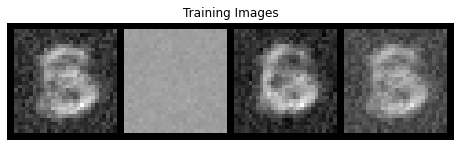

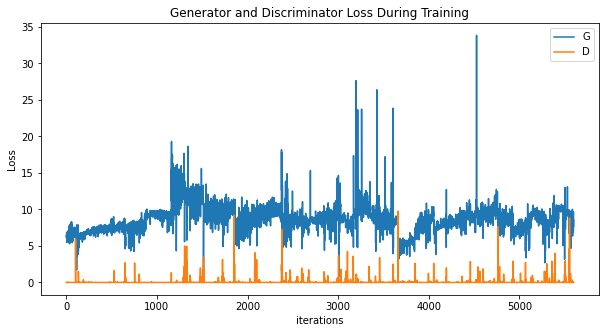

[0/3][5610/30000]	Loss_D: 0.0079	Loss_G: 7.1352	D(x): 1.0000	D(G(z)): 0.0079 / 0.0008
tensor([ 5.3297, -2.0348], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0068], grad_fn=<SliceBackward>)
tensor([ 0.0990, -0.4770], grad_fn=<SliceBackward>)
[0/3][5620/30000]	Loss_D: 0.0088	Loss_G: 7.3741	D(x): 1.0000	D(G(z)): 0.0088 / 0.0012
tensor([ 5.3266, -2.0410], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0067], grad_fn=<SliceBackward>)
tensor([ 0.0978, -0.4761], grad_fn=<SliceBackward>)
[0/3][5630/30000]	Loss_D: 0.0698	Loss_G: 7.1453	D(x): 0.9447	D(G(z)): 0.0110 / 0.0013
tensor([ 5.3235, -2.0453], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0066], grad_fn=<SliceBackward>)
tensor([ 0.0954, -0.4758], grad_fn=<SliceBackward>)
[0/3][5640/30000]	Loss_D: 0.0113	Loss_G: 9.6892	D(x): 1.0000	D(G(z)): 0.0111 / 0.0001
tensor([ 5.3210, -2.0471], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0065], grad_fn=<SliceBackward>)
tensor([ 0.0948, -0.4755], grad_fn=<SliceBackward>)
[0/3][5650/30000]	Loss_D: 0.0289

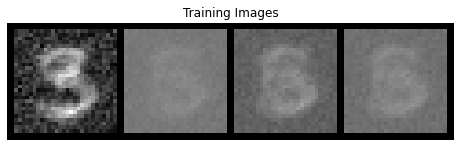

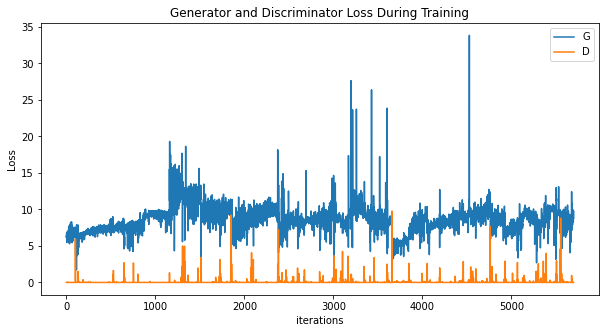

[0/3][5710/30000]	Loss_D: 0.0071	Loss_G: 6.9513	D(x): 1.0000	D(G(z)): 0.0070 / 0.0058
tensor([ 5.3379, -2.0442], grad_fn=<SliceBackward>) tensor([-0.0110,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0881, -0.4841], grad_fn=<SliceBackward>)
[0/3][5720/30000]	Loss_D: 0.0001	Loss_G: 8.5584	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
tensor([ 5.3391, -2.0395], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.0856, -0.4854], grad_fn=<SliceBackward>)
[0/3][5730/30000]	Loss_D: 0.0002	Loss_G: 7.8119	D(x): 1.0000	D(G(z)): 0.0002 / 0.0004
tensor([ 5.3393, -2.0354], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.0834, -0.4866], grad_fn=<SliceBackward>)
[0/3][5740/30000]	Loss_D: 0.0009	Loss_G: 7.8870	D(x): 1.0000	D(G(z)): 0.0009 / 0.0005
tensor([ 5.3395, -2.0321], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.0821, -0.4873], grad_fn=<SliceBackward>)
[0/3][5750/30000]	Loss_D: 0.0006

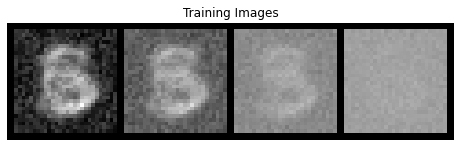

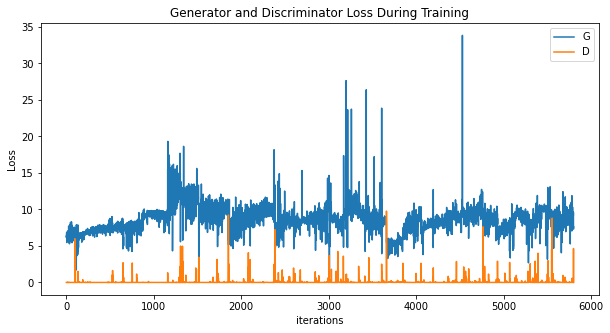

[0/3][5810/30000]	Loss_D: 0.0416	Loss_G: 5.0633	D(x): 1.0000	D(G(z)): 0.0407 / 0.0956
tensor([ 5.3365, -2.1149], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.0637, -0.4942], grad_fn=<SliceBackward>)
[0/3][5820/30000]	Loss_D: 0.0181	Loss_G: 9.3286	D(x): 0.9828	D(G(z)): 0.0006 / 0.0001
tensor([ 5.3370, -2.1165], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.0629, -0.4940], grad_fn=<SliceBackward>)
[0/3][5830/30000]	Loss_D: 0.0004	Loss_G: 8.9764	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 5.3385, -2.1172], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0064], grad_fn=<SliceBackward>)
tensor([ 0.0615, -0.4932], grad_fn=<SliceBackward>)
[0/3][5840/30000]	Loss_D: 0.0044	Loss_G: 8.7452	D(x): 1.0000	D(G(z)): 0.0044 / 0.0002
tensor([ 5.3500, -2.1257], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0066], grad_fn=<SliceBackward>)
tensor([ 0.0620, -0.4934], grad_fn=<SliceBackward>)
[0/3][5850/30000]	Loss_D: 0.0003

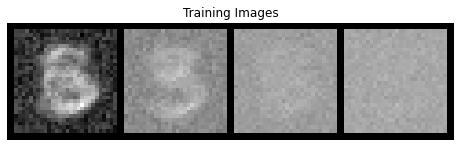

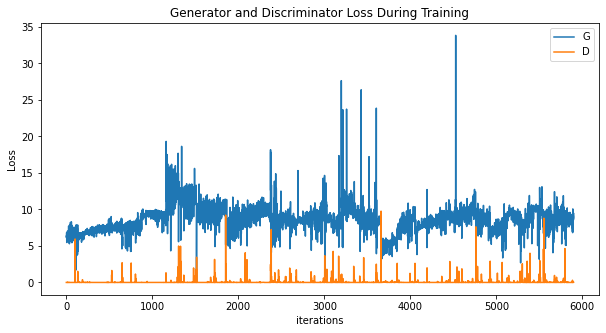

[0/3][5910/30000]	Loss_D: 0.0017	Loss_G: 8.9090	D(x): 1.0000	D(G(z)): 0.0017 / 0.0001
tensor([ 5.3528, -2.1517], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0065], grad_fn=<SliceBackward>)
tensor([ 0.0421, -0.5103], grad_fn=<SliceBackward>)
[0/3][5920/30000]	Loss_D: 0.0065	Loss_G: 9.1106	D(x): 0.9939	D(G(z)): 0.0004 / 0.0001
tensor([ 5.3519, -2.1737], grad_fn=<SliceBackward>) tensor([-0.0115,  0.0054], grad_fn=<SliceBackward>)
tensor([ 0.0400, -0.5113], grad_fn=<SliceBackward>)
[0/3][5930/30000]	Loss_D: 0.0031	Loss_G: 9.2673	D(x): 1.0000	D(G(z)): 0.0031 / 0.0001
tensor([ 5.3391, -2.1987], grad_fn=<SliceBackward>) tensor([-0.0115,  0.0054], grad_fn=<SliceBackward>)
tensor([ 0.0278, -0.5180], grad_fn=<SliceBackward>)
[0/3][5940/30000]	Loss_D: 0.0207	Loss_G: 8.8330	D(x): 0.9993	D(G(z)): 0.0197 / 0.0002
tensor([ 5.3268, -2.2268], grad_fn=<SliceBackward>) tensor([-0.0132,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.0242, -0.5167], grad_fn=<SliceBackward>)
[0/3][5950/30000]	Loss_D: 0.0003

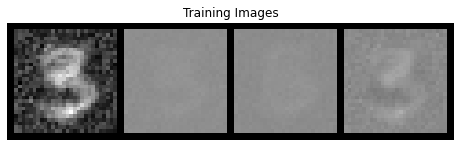

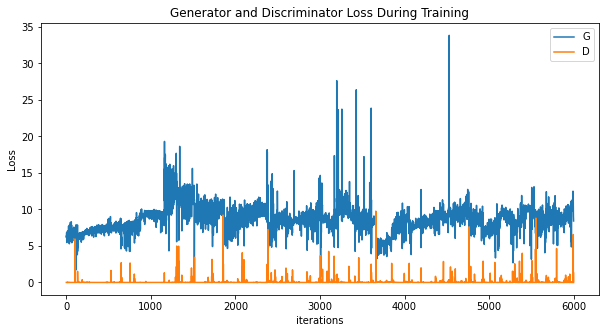

[0/3][6010/30000]	Loss_D: 0.0002	Loss_G: 8.6134	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 5.3512, -2.2818], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0043], grad_fn=<SliceBackward>)
tensor([ 0.0106, -0.5202], grad_fn=<SliceBackward>)
[0/3][6020/30000]	Loss_D: 0.0001	Loss_G: 8.4298	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
tensor([ 5.3498, -2.2806], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0043], grad_fn=<SliceBackward>)
tensor([ 0.0094, -0.5218], grad_fn=<SliceBackward>)
[0/3][6030/30000]	Loss_D: 0.0296	Loss_G: 7.1269	D(x): 0.9714	D(G(z)): 0.0001 / 0.0014
tensor([ 5.3478, -2.2793], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0043], grad_fn=<SliceBackward>)
tensor([ 0.0069, -0.5217], grad_fn=<SliceBackward>)
[0/3][6040/30000]	Loss_D: 0.0002	Loss_G: 8.3040	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 5.3456, -2.2781], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0043], grad_fn=<SliceBackward>)
tensor([ 0.0059, -0.5216], grad_fn=<SliceBackward>)
[0/3][6050/30000]	Loss_D: 0.0012

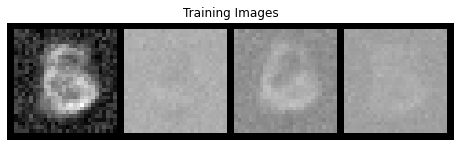

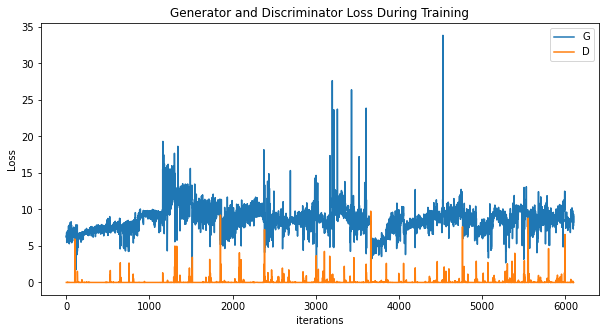

[0/3][6110/30000]	Loss_D: 0.1322	Loss_G: 8.8768	D(x): 0.8875	D(G(z)): 0.0047 / 0.0001
tensor([ 5.3075, -2.3494], grad_fn=<SliceBackward>) tensor([-0.0131,  0.0040], grad_fn=<SliceBackward>)
tensor([-0.0223, -0.5345], grad_fn=<SliceBackward>)
[0/3][6120/30000]	Loss_D: 0.0013	Loss_G: 8.6404	D(x): 1.0000	D(G(z)): 0.0013 / 0.0002
tensor([ 5.2960, -2.3582], grad_fn=<SliceBackward>) tensor([-0.0131,  0.0040], grad_fn=<SliceBackward>)
tensor([-0.0206, -0.5332], grad_fn=<SliceBackward>)
[0/3][6130/30000]	Loss_D: 0.0003	Loss_G: 9.9921	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.2833, -2.3648], grad_fn=<SliceBackward>) tensor([-0.0132,  0.0039], grad_fn=<SliceBackward>)
tensor([-0.0213, -0.5332], grad_fn=<SliceBackward>)
[0/3][6140/30000]	Loss_D: 0.0001	Loss_G: 8.7927	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
tensor([ 5.2756, -2.3734], grad_fn=<SliceBackward>) tensor([-0.0132,  0.0039], grad_fn=<SliceBackward>)
tensor([-0.0299, -0.5329], grad_fn=<SliceBackward>)
[0/3][6150/30000]	Loss_D: 0.0004

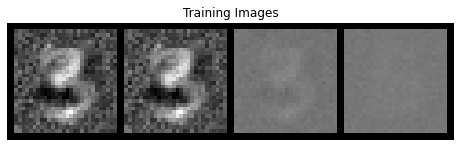

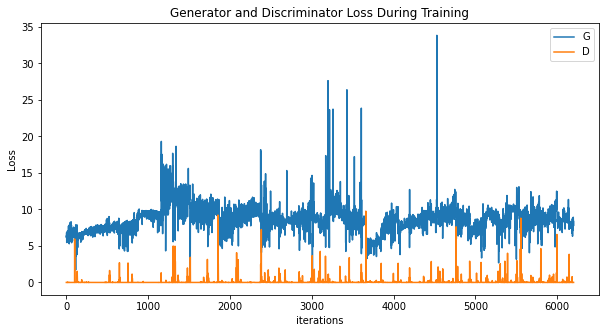

[0/3][6210/30000]	Loss_D: 0.0053	Loss_G: 7.4573	D(x): 1.0000	D(G(z)): 0.0052 / 0.0011
tensor([ 5.2766, -2.3658], grad_fn=<SliceBackward>) tensor([-0.0133,  0.0038], grad_fn=<SliceBackward>)
tensor([-0.0442, -0.5163], grad_fn=<SliceBackward>)
[0/3][6220/30000]	Loss_D: 0.0050	Loss_G: 8.6715	D(x): 0.9999	D(G(z)): 0.0049 / 0.0002
tensor([ 5.2771, -2.3643], grad_fn=<SliceBackward>) tensor([-0.0140,  0.0035], grad_fn=<SliceBackward>)
tensor([-0.0427, -0.5141], grad_fn=<SliceBackward>)
[0/3][6230/30000]	Loss_D: 0.0024	Loss_G: 8.0446	D(x): 1.0000	D(G(z)): 0.0024 / 0.0003
tensor([ 5.2815, -2.3692], grad_fn=<SliceBackward>) tensor([-0.0137,  0.0038], grad_fn=<SliceBackward>)
tensor([-0.0437, -0.5115], grad_fn=<SliceBackward>)
[0/3][6240/30000]	Loss_D: 0.0069	Loss_G: 8.6250	D(x): 1.0000	D(G(z)): 0.0069 / 0.0002
tensor([ 5.2860, -2.3823], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0054], grad_fn=<SliceBackward>)
tensor([-0.0442, -0.5104], grad_fn=<SliceBackward>)
[0/3][6250/30000]	Loss_D: 0.0003

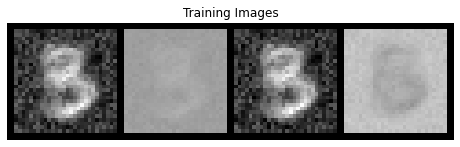

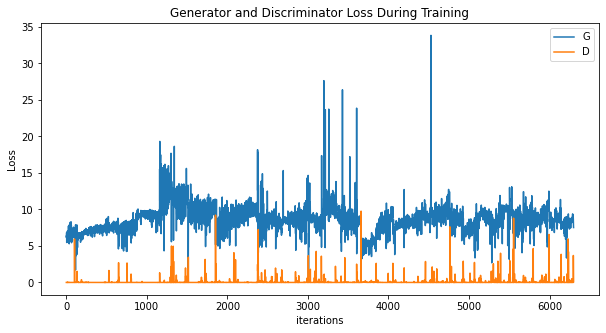

[0/3][6310/30000]	Loss_D: 0.0042	Loss_G: 5.9155	D(x): 1.0000	D(G(z)): 0.0042 / 0.0049
tensor([ 5.2543, -2.4275], grad_fn=<SliceBackward>) tensor([-0.0135,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.0780, -0.5302], grad_fn=<SliceBackward>)
[0/3][6320/30000]	Loss_D: 0.0122	Loss_G: 7.2025	D(x): 1.0000	D(G(z)): 0.0121 / 0.0008
tensor([ 5.2499, -2.4350], grad_fn=<SliceBackward>) tensor([-0.0135,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.0765, -0.5271], grad_fn=<SliceBackward>)
[0/3][6330/30000]	Loss_D: 0.0077	Loss_G: 6.8180	D(x): 1.0000	D(G(z)): 0.0077 / 0.0011
tensor([ 5.2436, -2.4433], grad_fn=<SliceBackward>) tensor([-0.0135,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.0761, -0.5244], grad_fn=<SliceBackward>)
[0/3][6340/30000]	Loss_D: 0.0231	Loss_G: 7.2059	D(x): 1.0000	D(G(z)): 0.0226 / 0.0007
tensor([ 5.2358, -2.4519], grad_fn=<SliceBackward>) tensor([-0.0134,  0.0047], grad_fn=<SliceBackward>)
tensor([-0.0763, -0.5242], grad_fn=<SliceBackward>)
[0/3][6350/30000]	Loss_D: 0.0126

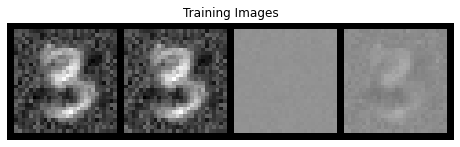

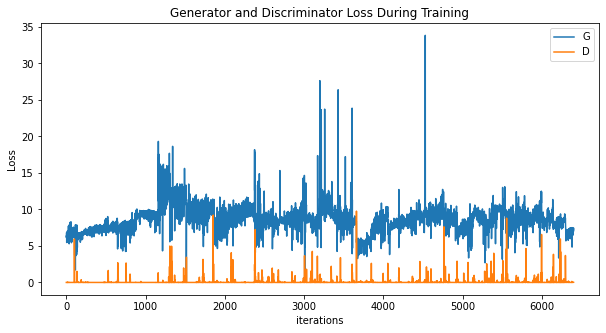

[0/3][6410/30000]	Loss_D: 0.0426	Loss_G: 7.4081	D(x): 1.0000	D(G(z)): 0.0417 / 0.0006
tensor([ 5.1867, -2.4998], grad_fn=<SliceBackward>) tensor([-0.0134,  0.0048], grad_fn=<SliceBackward>)
tensor([-0.0674, -0.5145], grad_fn=<SliceBackward>)
[0/3][6420/30000]	Loss_D: 1.0929	Loss_G: 6.9333	D(x): 1.0000	D(G(z)): 0.5816 / 0.0010
tensor([ 5.1790, -2.5087], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.0670, -0.5120], grad_fn=<SliceBackward>)
[0/3][6430/30000]	Loss_D: 0.0061	Loss_G: 6.6460	D(x): 1.0000	D(G(z)): 0.0060 / 0.0013
tensor([ 5.1843, -2.5063], grad_fn=<SliceBackward>) tensor([-0.0159,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.0643, -0.5129], grad_fn=<SliceBackward>)
[0/3][6440/30000]	Loss_D: 0.0017	Loss_G: 6.8874	D(x): 1.0000	D(G(z)): 0.0017 / 0.0010
tensor([ 5.1834, -2.5068], grad_fn=<SliceBackward>) tensor([-0.0159,  0.0024], grad_fn=<SliceBackward>)
tensor([-0.0630, -0.5120], grad_fn=<SliceBackward>)
[0/3][6450/30000]	Loss_D: 0.0045

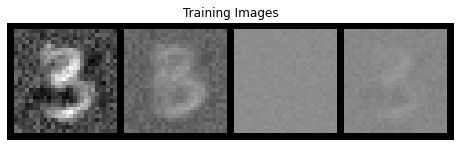

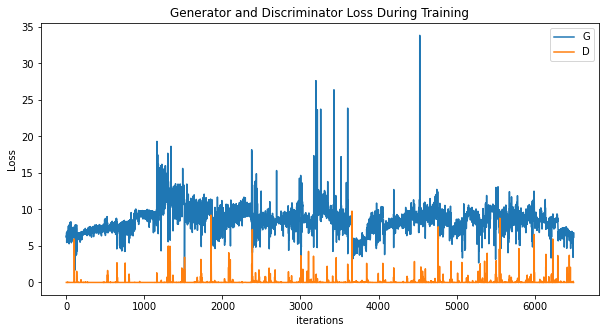

[0/3][6510/30000]	Loss_D: 0.0062	Loss_G: 6.9215	D(x): 1.0000	D(G(z)): 0.0061 / 0.0010
tensor([ 5.1845, -2.4947], grad_fn=<SliceBackward>) tensor([-0.0155,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.0390, -0.4939], grad_fn=<SliceBackward>)
[0/3][6520/30000]	Loss_D: 0.0065	Loss_G: 7.1757	D(x): 1.0000	D(G(z)): 0.0065 / 0.0008
tensor([ 5.1845, -2.4947], grad_fn=<SliceBackward>) tensor([-0.0155,  0.0027], grad_fn=<SliceBackward>)
tensor([-0.0371, -0.4916], grad_fn=<SliceBackward>)
[0/3][6530/30000]	Loss_D: 0.0096	Loss_G: 6.9957	D(x): 1.0000	D(G(z)): 0.0095 / 0.0009
tensor([ 5.1845, -2.4960], grad_fn=<SliceBackward>) tensor([-0.0149,  0.0034], grad_fn=<SliceBackward>)
tensor([-0.0340, -0.4877], grad_fn=<SliceBackward>)
[0/3][6540/30000]	Loss_D: 0.0013	Loss_G: 7.3345	D(x): 1.0000	D(G(z)): 0.0013 / 0.0007
tensor([ 5.1854, -2.5013], grad_fn=<SliceBackward>) tensor([-0.0148,  0.0036], grad_fn=<SliceBackward>)
tensor([-0.0320, -0.4865], grad_fn=<SliceBackward>)
[0/3][6550/30000]	Loss_D: 0.0024

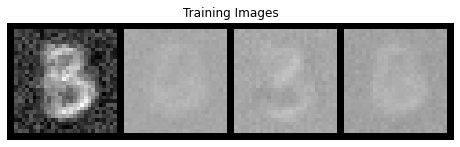

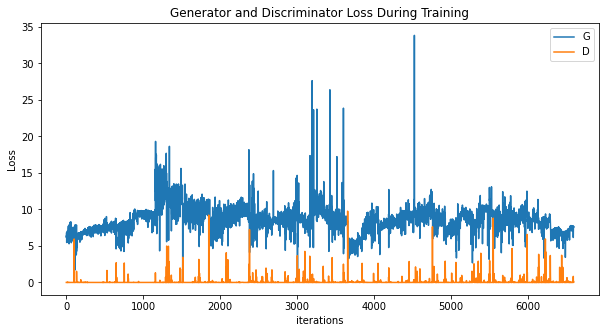

[0/3][6610/30000]	Loss_D: 0.0495	Loss_G: 6.2348	D(x): 0.9836	D(G(z)): 0.0323 / 0.0076
tensor([ 5.2002, -2.5440], grad_fn=<SliceBackward>) tensor([-0.0167,  0.0020], grad_fn=<SliceBackward>)
tensor([-0.0303, -0.4902], grad_fn=<SliceBackward>)
[0/3][6620/30000]	Loss_D: 0.0010	Loss_G: 7.8629	D(x): 1.0000	D(G(z)): 0.0010 / 0.0004
tensor([ 5.1901, -2.5806], grad_fn=<SliceBackward>) tensor([-0.0167,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.0279, -0.4874], grad_fn=<SliceBackward>)
[0/3][6630/30000]	Loss_D: 0.0006	Loss_G: 7.8463	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
tensor([ 5.1902, -2.5813], grad_fn=<SliceBackward>) tensor([-0.0167,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.0148, -0.4836], grad_fn=<SliceBackward>)
[0/3][6640/30000]	Loss_D: 0.0044	Loss_G: 8.4111	D(x): 1.0000	D(G(z)): 0.0044 / 0.0002
tensor([ 5.1907, -2.5808], grad_fn=<SliceBackward>) tensor([-0.0167,  0.0021], grad_fn=<SliceBackward>)
tensor([-0.0118, -0.4821], grad_fn=<SliceBackward>)
[0/3][6650/30000]	Loss_D: 0.0263

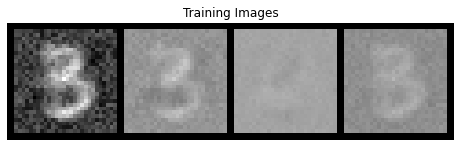

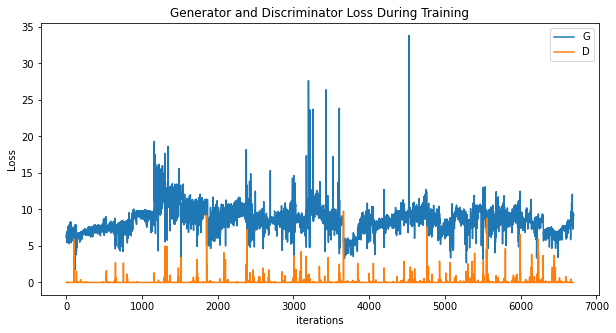

[0/3][6710/30000]	Loss_D: 0.0005	Loss_G: 9.5598	D(x): 0.9999	D(G(z)): 0.0004 / 0.0001
tensor([ 5.1478, -2.6587], grad_fn=<SliceBackward>) tensor([-0.0163,  0.0030], grad_fn=<SliceBackward>)
tensor([ 0.0152, -0.4609], grad_fn=<SliceBackward>)
[0/3][6720/30000]	Loss_D: 0.0000	Loss_G: 9.0596	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.1471, -2.6593], grad_fn=<SliceBackward>) tensor([-0.0163,  0.0030], grad_fn=<SliceBackward>)
tensor([ 0.0185, -0.4571], grad_fn=<SliceBackward>)
[0/3][6730/30000]	Loss_D: 0.0003	Loss_G: 8.5289	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 5.1465, -2.6600], grad_fn=<SliceBackward>) tensor([-0.0163,  0.0030], grad_fn=<SliceBackward>)
tensor([ 0.0216, -0.4528], grad_fn=<SliceBackward>)
[0/3][6740/30000]	Loss_D: 0.0001	Loss_G: 8.9022	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.1456, -2.6609], grad_fn=<SliceBackward>) tensor([-0.0163,  0.0030], grad_fn=<SliceBackward>)
tensor([ 0.0248, -0.4498], grad_fn=<SliceBackward>)
[0/3][6750/30000]	Loss_D: 0.0001

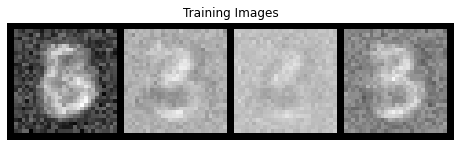

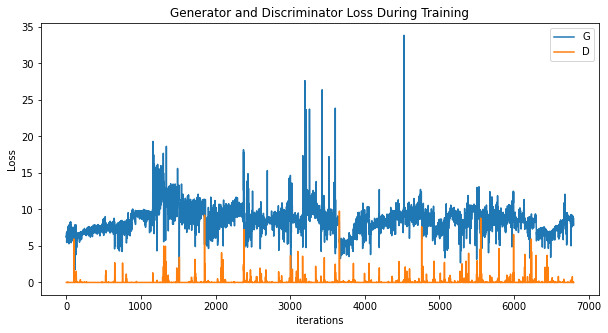

[0/3][6810/30000]	Loss_D: 0.0137	Loss_G: 8.3659	D(x): 1.0000	D(G(z)): 0.0136 / 0.0002
tensor([ 5.1231, -2.6849], grad_fn=<SliceBackward>) tensor([-0.0160,  0.0037], grad_fn=<SliceBackward>)
tensor([ 0.0615, -0.4272], grad_fn=<SliceBackward>)
[0/3][6820/30000]	Loss_D: 0.0020	Loss_G: 8.3974	D(x): 1.0000	D(G(z)): 0.0020 / 0.0002
tensor([ 5.1251, -2.6804], grad_fn=<SliceBackward>) tensor([-0.0159,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.0640, -0.4240], grad_fn=<SliceBackward>)
[0/3][6830/30000]	Loss_D: 0.0003	Loss_G: 8.6220	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 5.1277, -2.6761], grad_fn=<SliceBackward>) tensor([-0.0159,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.0799, -0.4139], grad_fn=<SliceBackward>)
[0/3][6840/30000]	Loss_D: 0.0018	Loss_G: 8.3823	D(x): 1.0000	D(G(z)): 0.0018 / 0.0002
tensor([ 5.1236, -2.6760], grad_fn=<SliceBackward>) tensor([-0.0159,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.0826, -0.4122], grad_fn=<SliceBackward>)
[0/3][6850/30000]	Loss_D: 0.0017

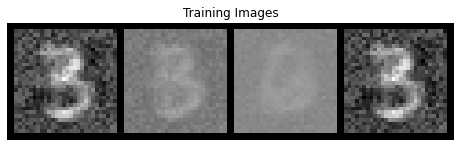

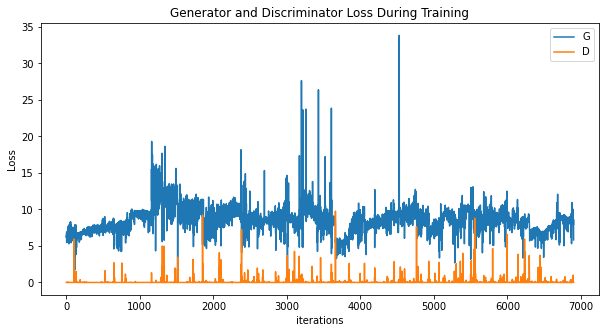

[0/3][6910/30000]	Loss_D: 0.0158	Loss_G: 8.5920	D(x): 1.0000	D(G(z)): 0.0156 / 0.0002
tensor([ 5.0821, -2.7053], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0047], grad_fn=<SliceBackward>)
tensor([ 0.1125, -0.3973], grad_fn=<SliceBackward>)
[0/3][6920/30000]	Loss_D: 0.1982	Loss_G: 5.3508	D(x): 1.0000	D(G(z)): 0.1770 / 0.0117
tensor([ 5.0755, -2.7060], grad_fn=<SliceBackward>) tensor([-0.0165,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.1208, -0.3903], grad_fn=<SliceBackward>)
[0/3][6930/30000]	Loss_D: 0.0016	Loss_G: 6.1567	D(x): 1.0000	D(G(z)): 0.0016 / 0.0021
tensor([ 5.0741, -2.7013], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0046], grad_fn=<SliceBackward>)
tensor([ 0.1262, -0.3869], grad_fn=<SliceBackward>)
[0/3][6940/30000]	Loss_D: 0.0098	Loss_G: 6.0686	D(x): 1.0000	D(G(z)): 0.0098 / 0.0049
tensor([ 5.0739, -2.7009], grad_fn=<SliceBackward>) tensor([-0.0174,  0.0029], grad_fn=<SliceBackward>)
tensor([ 0.1281, -0.3849], grad_fn=<SliceBackward>)
[0/3][6950/30000]	Loss_D: 0.0029

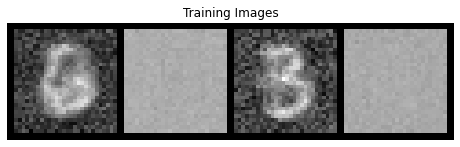

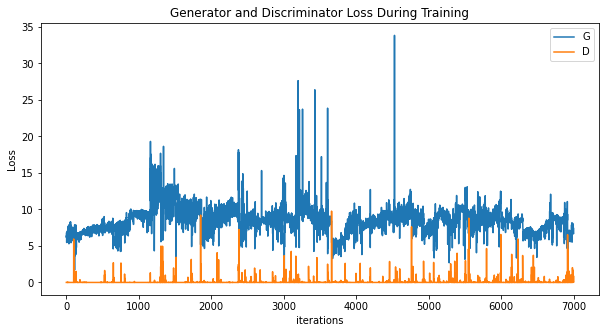

[0/3][7010/30000]	Loss_D: 0.0051	Loss_G: 5.5142	D(x): 1.0000	D(G(z)): 0.0051 / 0.0093
tensor([ 5.0846, -2.7354], grad_fn=<SliceBackward>) tensor([-0.0175,  0.0040], grad_fn=<SliceBackward>)
tensor([ 0.1664, -0.3796], grad_fn=<SliceBackward>)
[0/3][7020/30000]	Loss_D: 0.0151	Loss_G: 7.0096	D(x): 1.0000	D(G(z)): 0.0150 / 0.0009
tensor([ 5.0845, -2.7354], grad_fn=<SliceBackward>) tensor([-0.0171,  0.0045], grad_fn=<SliceBackward>)
tensor([ 0.1697, -0.3797], grad_fn=<SliceBackward>)
[0/3][7030/30000]	Loss_D: 0.0107	Loss_G: 6.8858	D(x): 1.0000	D(G(z)): 0.0106 / 0.0010
tensor([ 5.0847, -2.7356], grad_fn=<SliceBackward>) tensor([-0.0170,  0.0045], grad_fn=<SliceBackward>)
tensor([ 0.1753, -0.3838], grad_fn=<SliceBackward>)
[0/3][7040/30000]	Loss_D: 0.0055	Loss_G: 7.5849	D(x): 0.9982	D(G(z)): 0.0037 / 0.0005
tensor([ 5.0848, -2.7356], grad_fn=<SliceBackward>) tensor([-0.0170,  0.0046], grad_fn=<SliceBackward>)
tensor([ 0.1776, -0.3858], grad_fn=<SliceBackward>)
[0/3][7050/30000]	Loss_D: 0.0039

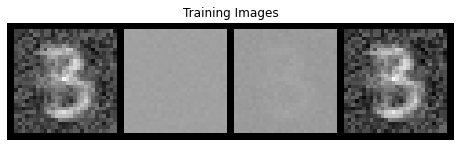

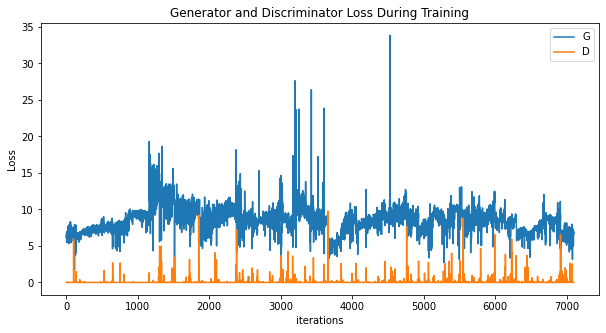

[0/3][7110/30000]	Loss_D: 0.0575	Loss_G: 6.9460	D(x): 1.0000	D(G(z)): 0.0548 / 0.0010
tensor([ 5.1027, -2.7422], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.2137, -0.3825], grad_fn=<SliceBackward>)
[0/3][7120/30000]	Loss_D: 0.0125	Loss_G: 6.9589	D(x): 1.0000	D(G(z)): 0.0124 / 0.0010
tensor([ 5.1036, -2.7410], grad_fn=<SliceBackward>) tensor([-0.0153,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.2178, -0.3840], grad_fn=<SliceBackward>)
[0/3][7130/30000]	Loss_D: 0.0773	Loss_G: 6.7125	D(x): 1.0000	D(G(z)): 0.0736 / 0.0012
tensor([ 5.1024, -2.7457], grad_fn=<SliceBackward>) tensor([-0.0157,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.2225, -0.3878], grad_fn=<SliceBackward>)
[0/3][7140/30000]	Loss_D: 0.0120	Loss_G: 6.1910	D(x): 1.0000	D(G(z)): 0.0119 / 0.0021
tensor([ 5.1032, -2.7459], grad_fn=<SliceBackward>) tensor([-0.0153,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.2284, -0.3861], grad_fn=<SliceBackward>)
[0/3][7150/30000]	Loss_D: 0.0090

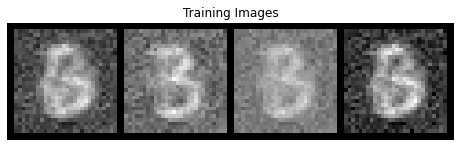

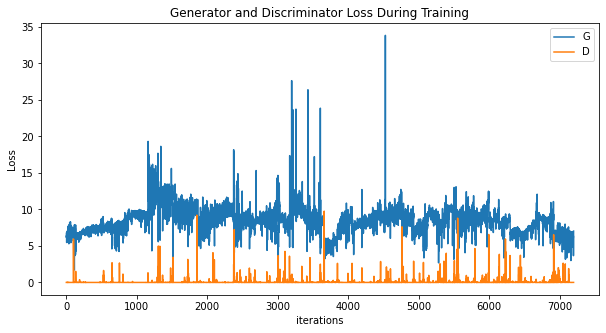

[0/3][7210/30000]	Loss_D: 0.0028	Loss_G: 7.3650	D(x): 1.0000	D(G(z)): 0.0028 / 0.0006
tensor([ 5.0532, -2.7528], grad_fn=<SliceBackward>) tensor([-0.0152,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.2583, -0.3910], grad_fn=<SliceBackward>)
[0/3][7220/30000]	Loss_D: 0.0030	Loss_G: 6.1348	D(x): 1.0000	D(G(z)): 0.0029 / 0.0022
tensor([ 5.0488, -2.7536], grad_fn=<SliceBackward>) tensor([-0.0152,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.2632, -0.3928], grad_fn=<SliceBackward>)
[0/3][7230/30000]	Loss_D: 0.0630	Loss_G: 5.6109	D(x): 1.0000	D(G(z)): 0.0606 / 0.0042
tensor([ 5.0445, -2.7537], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.2696, -0.3914], grad_fn=<SliceBackward>)
[0/3][7240/30000]	Loss_D: 0.0092	Loss_G: 6.0039	D(x): 1.0000	D(G(z)): 0.0091 / 0.0025
tensor([ 5.0411, -2.7520], grad_fn=<SliceBackward>) tensor([-0.0155,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.2729, -0.3902], grad_fn=<SliceBackward>)
[0/3][7250/30000]	Loss_D: 0.0058

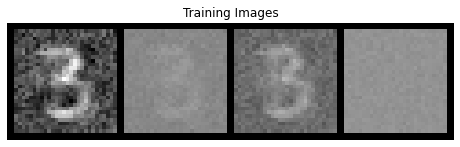

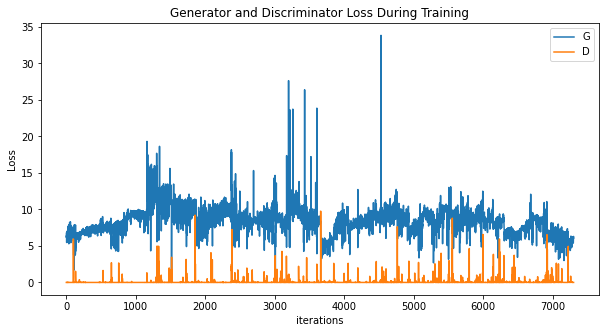

[0/3][7310/30000]	Loss_D: 0.0051	Loss_G: 6.0517	D(x): 1.0000	D(G(z)): 0.0051 / 0.0024
tensor([ 5.0493, -2.7385], grad_fn=<SliceBackward>) tensor([-0.0154,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2934, -0.3879], grad_fn=<SliceBackward>)
[0/3][7320/30000]	Loss_D: 0.0038	Loss_G: 6.0910	D(x): 1.0000	D(G(z)): 0.0038 / 0.0023
tensor([ 5.0502, -2.7379], grad_fn=<SliceBackward>) tensor([-0.0154,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2951, -0.3882], grad_fn=<SliceBackward>)
[0/3][7330/30000]	Loss_D: 0.0240	Loss_G: 6.4143	D(x): 1.0000	D(G(z)): 0.0236 / 0.0016
tensor([ 5.0511, -2.7369], grad_fn=<SliceBackward>) tensor([-0.0154,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.2984, -0.3877], grad_fn=<SliceBackward>)
[0/3][7340/30000]	Loss_D: 0.0328	Loss_G: 4.0328	D(x): 1.0000	D(G(z)): 0.0322 / 0.1280
tensor([ 5.0520, -2.7355], grad_fn=<SliceBackward>) tensor([-0.0154,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.3021, -0.3865], grad_fn=<SliceBackward>)
[0/3][7350/30000]	Loss_D: 0.0189

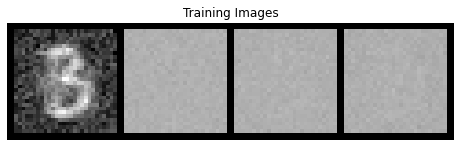

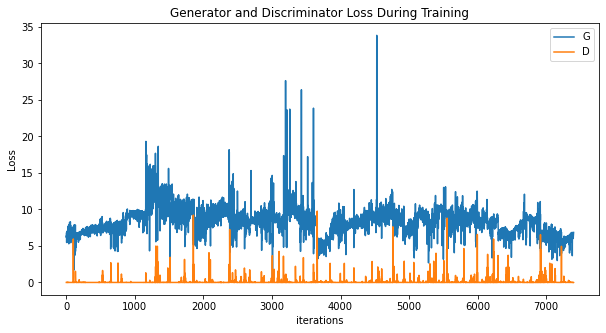

[0/3][7410/30000]	Loss_D: 0.0035	Loss_G: 6.3672	D(x): 1.0000	D(G(z)): 0.0035 / 0.0017
tensor([ 5.0544, -2.7319], grad_fn=<SliceBackward>) tensor([-0.0153,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.3309, -0.3879], grad_fn=<SliceBackward>)
[0/3][7420/30000]	Loss_D: 0.0043	Loss_G: 6.8042	D(x): 1.0000	D(G(z)): 0.0042 / 0.0011
tensor([ 5.0537, -2.7326], grad_fn=<SliceBackward>) tensor([-0.0153,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.3333, -0.3900], grad_fn=<SliceBackward>)
[0/3][7430/30000]	Loss_D: 0.0029	Loss_G: 6.5227	D(x): 1.0000	D(G(z)): 0.0029 / 0.0015
tensor([ 5.0528, -2.7334], grad_fn=<SliceBackward>) tensor([-0.0153,  0.0062], grad_fn=<SliceBackward>)
tensor([ 0.3344, -0.3908], grad_fn=<SliceBackward>)
[0/3][7440/30000]	Loss_D: 0.0353	Loss_G: 7.3453	D(x): 1.0000	D(G(z)): 0.0345 / 0.0007
tensor([ 5.0508, -2.7349], grad_fn=<SliceBackward>) tensor([-0.0151,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.3371, -0.3915], grad_fn=<SliceBackward>)
[0/3][7450/30000]	Loss_D: 0.0571

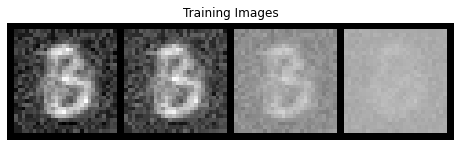

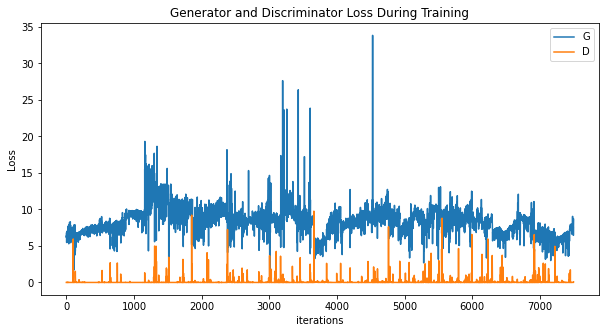

[0/3][7510/30000]	Loss_D: 0.0002	Loss_G: 6.1129	D(x): 0.9999	D(G(z)): 0.0001 / 0.0041
tensor([ 5.1416, -2.7244], grad_fn=<SliceBackward>) tensor([-0.0143,  0.0068], grad_fn=<SliceBackward>)
tensor([ 0.3521, -0.4069], grad_fn=<SliceBackward>)
[0/3][7520/30000]	Loss_D: 0.0400	Loss_G: 7.3545	D(x): 0.9616	D(G(z)): 0.0000 / 0.0016
tensor([ 5.1426, -2.7247], grad_fn=<SliceBackward>) tensor([-0.0144,  0.0067], grad_fn=<SliceBackward>)
tensor([ 0.3485, -0.4155], grad_fn=<SliceBackward>)
[0/3][7530/30000]	Loss_D: 0.0101	Loss_G: 6.1882	D(x): 1.0000	D(G(z)): 0.0100 / 0.0023
tensor([ 5.1424, -2.7249], grad_fn=<SliceBackward>) tensor([-0.0142,  0.0069], grad_fn=<SliceBackward>)
tensor([ 0.3456, -0.4220], grad_fn=<SliceBackward>)
[0/3][7540/30000]	Loss_D: 0.0363	Loss_G: 6.3791	D(x): 1.0000	D(G(z)): 0.0351 / 0.0018
tensor([ 5.1441, -2.7229], grad_fn=<SliceBackward>) tensor([-0.0167,  0.0045], grad_fn=<SliceBackward>)
tensor([ 0.3441, -0.4246], grad_fn=<SliceBackward>)
[0/3][7550/30000]	Loss_D: 0.0007

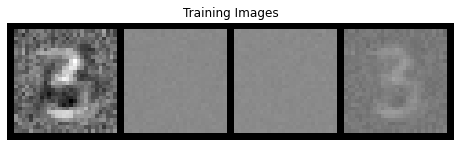

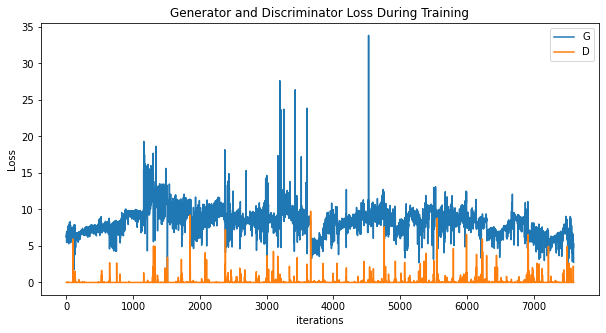

[0/3][7610/30000]	Loss_D: 0.0050	Loss_G: 5.9783	D(x): 1.0000	D(G(z)): 0.0050 / 0.0025
tensor([ 5.1271, -2.7326], grad_fn=<SliceBackward>) tensor([-0.0192,  0.0019], grad_fn=<SliceBackward>)
tensor([ 0.3341, -0.4397], grad_fn=<SliceBackward>)
[0/3][7620/30000]	Loss_D: 0.0039	Loss_G: 6.0419	D(x): 1.0000	D(G(z)): 0.0039 / 0.0024
tensor([ 5.1185, -2.7375], grad_fn=<SliceBackward>) tensor([-0.0192,  0.0019], grad_fn=<SliceBackward>)
tensor([ 0.3379, -0.4372], grad_fn=<SliceBackward>)
[0/3][7630/30000]	Loss_D: 0.0027	Loss_G: 3.3676	D(x): 1.0000	D(G(z)): 0.0027 / 0.1173
tensor([ 5.1093, -2.7427], grad_fn=<SliceBackward>) tensor([-0.0192,  0.0020], grad_fn=<SliceBackward>)
tensor([ 0.3371, -0.4348], grad_fn=<SliceBackward>)
[0/3][7640/30000]	Loss_D: 0.0022	Loss_G: 3.7559	D(x): 1.0000	D(G(z)): 0.0022 / 0.1387
tensor([ 5.0978, -2.7486], grad_fn=<SliceBackward>) tensor([-0.0191,  0.0020], grad_fn=<SliceBackward>)
tensor([ 0.3357, -0.4327], grad_fn=<SliceBackward>)
[0/3][7650/30000]	Loss_D: 0.0062

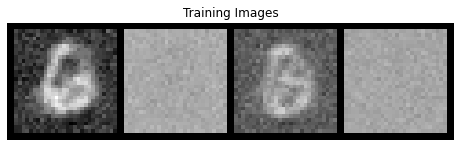

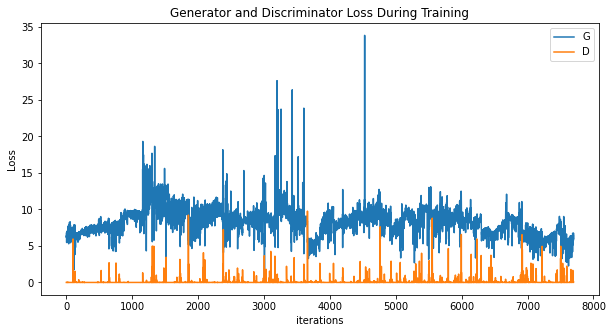

[0/3][7710/30000]	Loss_D: 0.0023	Loss_G: 6.5302	D(x): 1.0000	D(G(z)): 0.0023 / 0.0016
tensor([ 5.1214, -2.7037], grad_fn=<SliceBackward>) tensor([-0.0186,  0.0014], grad_fn=<SliceBackward>)
tensor([ 0.3239, -0.4421], grad_fn=<SliceBackward>)
[0/3][7720/30000]	Loss_D: 0.0092	Loss_G: 6.5696	D(x): 1.0000	D(G(z)): 0.0091 / 0.0014
tensor([ 5.1341, -2.6931], grad_fn=<SliceBackward>) tensor([-0.0184,  0.0015], grad_fn=<SliceBackward>)
tensor([ 0.3244, -0.4406], grad_fn=<SliceBackward>)
[0/3][7730/30000]	Loss_D: 0.0073	Loss_G: 6.8723	D(x): 1.0000	D(G(z)): 0.0072 / 0.0010
tensor([ 5.1476, -2.6813], grad_fn=<SliceBackward>) tensor([-0.0182,  0.0016], grad_fn=<SliceBackward>)
tensor([ 0.3246, -0.4395], grad_fn=<SliceBackward>)
[0/3][7740/30000]	Loss_D: 0.0098	Loss_G: 6.3887	D(x): 1.0000	D(G(z)): 0.0097 / 0.0023
tensor([ 5.1610, -2.6693], grad_fn=<SliceBackward>) tensor([-0.0180,  0.0018], grad_fn=<SliceBackward>)
tensor([ 0.3235, -0.4403], grad_fn=<SliceBackward>)
[0/3][7750/30000]	Loss_D: 0.0032

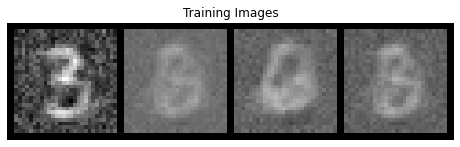

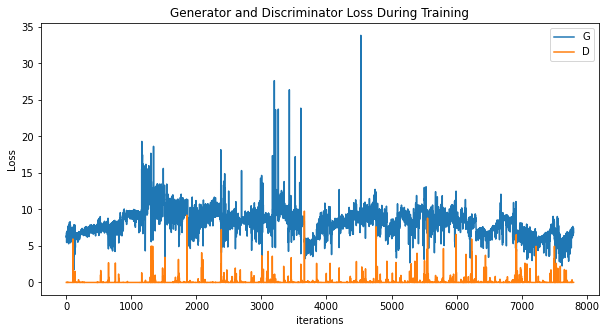

[0/3][7810/30000]	Loss_D: 0.0017	Loss_G: 7.4587	D(x): 1.0000	D(G(z)): 0.0016 / 0.0006
tensor([ 5.2179, -2.6080], grad_fn=<SliceBackward>) tensor([-0.0176,  0.0016], grad_fn=<SliceBackward>)
tensor([ 0.3168, -0.4362], grad_fn=<SliceBackward>)
[0/3][7820/30000]	Loss_D: 0.0047	Loss_G: 8.0432	D(x): 0.9961	D(G(z)): 0.0008 / 0.0003
tensor([ 5.2222, -2.6013], grad_fn=<SliceBackward>) tensor([-0.0175,  0.0016], grad_fn=<SliceBackward>)
tensor([ 0.3181, -0.4354], grad_fn=<SliceBackward>)
[0/3][7830/30000]	Loss_D: 0.0010	Loss_G: 7.0339	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
tensor([ 5.2265, -2.5937], grad_fn=<SliceBackward>) tensor([-0.0177,  0.0014], grad_fn=<SliceBackward>)
tensor([ 0.3182, -0.4334], grad_fn=<SliceBackward>)
[0/3][7840/30000]	Loss_D: 0.0013	Loss_G: 7.3291	D(x): 1.0000	D(G(z)): 0.0013 / 0.0008
tensor([ 5.2326, -2.5848], grad_fn=<SliceBackward>) tensor([-0.0175,  0.0015], grad_fn=<SliceBackward>)
tensor([ 0.3148, -0.4322], grad_fn=<SliceBackward>)
[0/3][7850/30000]	Loss_D: 0.0002

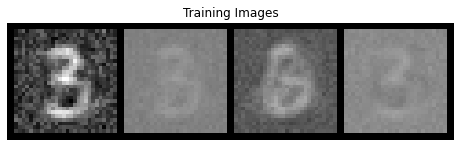

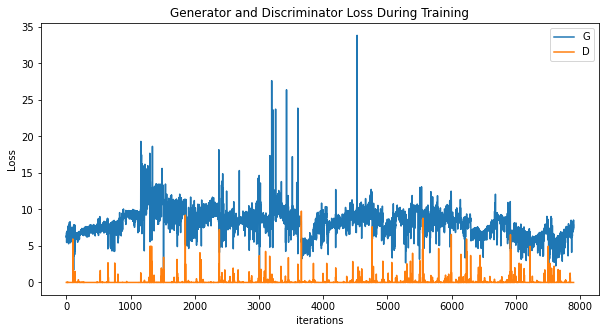

[0/3][7910/30000]	Loss_D: 0.0006	Loss_G: 8.0758	D(x): 1.0000	D(G(z)): 0.0006 / 0.0003
tensor([ 5.2531, -2.5610], grad_fn=<SliceBackward>) tensor([-0.0170,  0.0014], grad_fn=<SliceBackward>)
tensor([ 0.2911, -0.4466], grad_fn=<SliceBackward>)
[0/3][7920/30000]	Loss_D: 0.0037	Loss_G: 7.3409	D(x): 1.0000	D(G(z)): 0.0037 / 0.0007
tensor([ 5.2568, -2.5563], grad_fn=<SliceBackward>) tensor([-0.0170,  0.0015], grad_fn=<SliceBackward>)
tensor([ 0.2840, -0.4511], grad_fn=<SliceBackward>)
[0/3][7930/30000]	Loss_D: 0.0022	Loss_G: 3.5635	D(x): 1.0000	D(G(z)): 0.0022 / 0.4324
tensor([ 5.2611, -2.5510], grad_fn=<SliceBackward>) tensor([-0.0170,  0.0015], grad_fn=<SliceBackward>)
tensor([ 0.2735, -0.4578], grad_fn=<SliceBackward>)
[0/3][7940/30000]	Loss_D: 0.0006	Loss_G: 7.5685	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
tensor([ 5.2662, -2.5455], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0015], grad_fn=<SliceBackward>)
tensor([ 0.2748, -0.4585], grad_fn=<SliceBackward>)
[0/3][7950/30000]	Loss_D: 0.0001

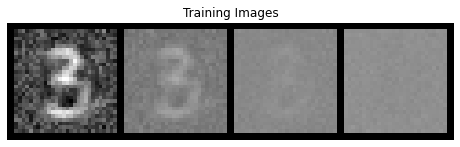

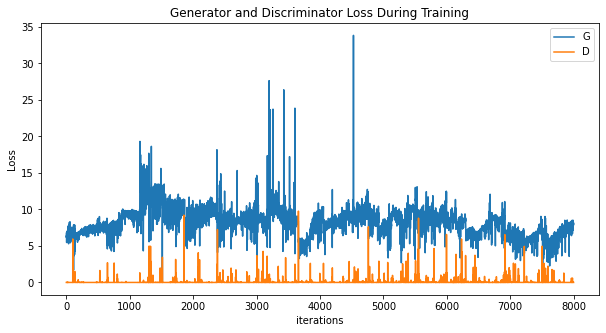

[0/3][8010/30000]	Loss_D: 0.0006	Loss_G: 8.0972	D(x): 1.0000	D(G(z)): 0.0006 / 0.0003
tensor([ 5.3052, -2.5139], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0011], grad_fn=<SliceBackward>)
tensor([ 0.2674, -0.4640], grad_fn=<SliceBackward>)
[0/3][8020/30000]	Loss_D: 0.0011	Loss_G: 4.7323	D(x): 1.0000	D(G(z)): 0.0011 / 0.0925
tensor([ 5.3052, -2.5140], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0011], grad_fn=<SliceBackward>)
tensor([ 0.2786, -0.4473], grad_fn=<SliceBackward>)
[0/3][8030/30000]	Loss_D: 0.0002	Loss_G: 8.0514	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
tensor([ 5.3052, -2.5142], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0011], grad_fn=<SliceBackward>)
tensor([ 0.2809, -0.4387], grad_fn=<SliceBackward>)
[0/3][8040/30000]	Loss_D: 0.0008	Loss_G: 8.1474	D(x): 1.0000	D(G(z)): 0.0008 / 0.0003
tensor([ 5.3051, -2.5143], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0011], grad_fn=<SliceBackward>)
tensor([ 0.2957, -0.4176], grad_fn=<SliceBackward>)
[0/3][8050/30000]	Loss_D: 0.0004

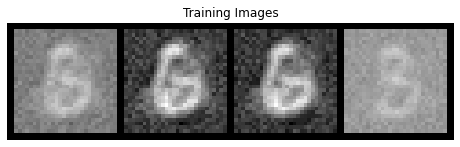

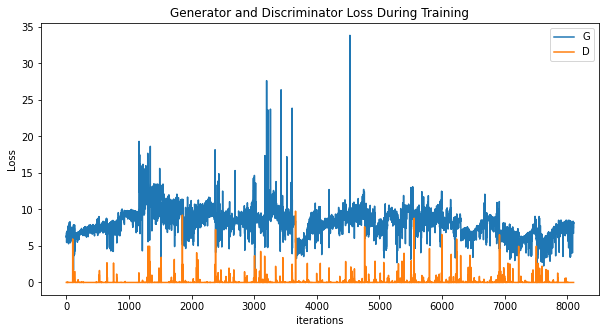

[0/3][8110/30000]	Loss_D: 0.0002	Loss_G: 8.0029	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
tensor([ 5.3045, -2.5156], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0010], grad_fn=<SliceBackward>)
tensor([ 0.3048, -0.4005], grad_fn=<SliceBackward>)
[0/3][8120/30000]	Loss_D: 0.0002	Loss_G: 8.3061	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
tensor([ 5.3044, -2.5158], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0010], grad_fn=<SliceBackward>)
tensor([ 0.3103, -0.3890], grad_fn=<SliceBackward>)
[0/3][8130/30000]	Loss_D: 0.0002	Loss_G: 8.2773	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
tensor([ 5.3042, -2.5161], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0010], grad_fn=<SliceBackward>)
tensor([ 0.3123, -0.3859], grad_fn=<SliceBackward>)
[0/3][8140/30000]	Loss_D: 0.0007	Loss_G: 8.0306	D(x): 1.0000	D(G(z)): 0.0007 / 0.0003
tensor([ 5.3039, -2.5165], grad_fn=<SliceBackward>) tensor([-0.0169,  0.0010], grad_fn=<SliceBackward>)
tensor([ 0.3158, -0.3810], grad_fn=<SliceBackward>)
[0/3][8150/30000]	Loss_D: 0.0004

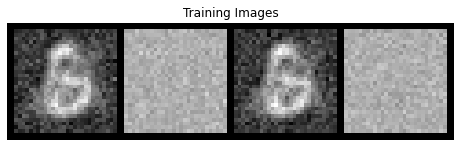

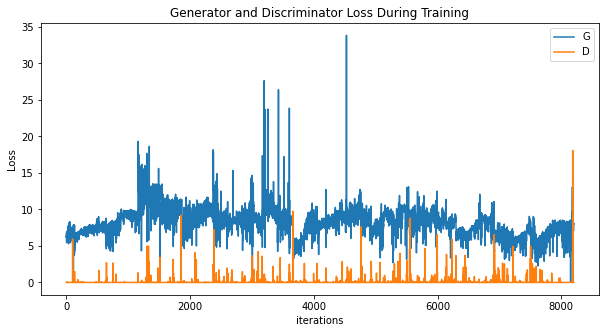

[0/3][8210/30000]	Loss_D: 0.0005	Loss_G: 9.1448	D(x): 0.9999	D(G(z)): 0.0004 / 0.0001
tensor([ 5.3519, -2.5239], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0019], grad_fn=<SliceBackward>)
tensor([ 0.3164, -0.3731], grad_fn=<SliceBackward>)
[0/3][8220/30000]	Loss_D: 0.0012	Loss_G: 6.9506	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
tensor([ 5.3538, -2.5250], grad_fn=<SliceBackward>) tensor([-0.0156,  0.0019], grad_fn=<SliceBackward>)
tensor([ 0.3163, -0.3724], grad_fn=<SliceBackward>)
[0/3][8230/30000]	Loss_D: 0.0081	Loss_G: 8.1615	D(x): 1.0000	D(G(z)): 0.0081 / 0.0003
tensor([ 5.3619, -2.5308], grad_fn=<SliceBackward>) tensor([-0.0151,  0.0026], grad_fn=<SliceBackward>)
tensor([ 0.3185, -0.3658], grad_fn=<SliceBackward>)
[0/3][8240/30000]	Loss_D: 0.0036	Loss_G: 7.6873	D(x): 1.0000	D(G(z)): 0.0036 / 0.0005
tensor([ 5.3593, -2.5323], grad_fn=<SliceBackward>) tensor([-0.0146,  0.0032], grad_fn=<SliceBackward>)
tensor([ 0.3208, -0.3616], grad_fn=<SliceBackward>)
[0/3][8250/30000]	Loss_D: 0.0003

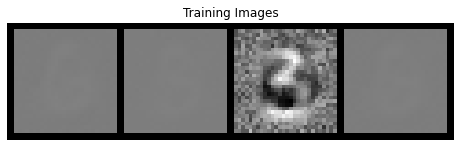

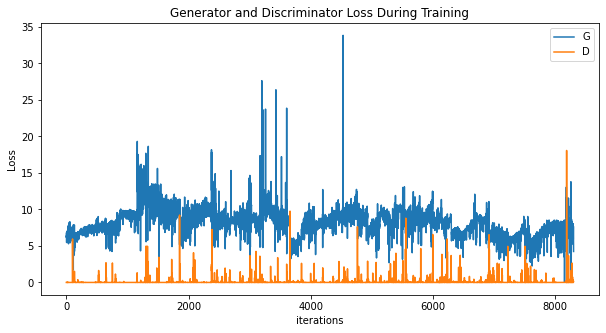

[0/3][8310/30000]	Loss_D: 0.0960	Loss_G: 7.9963	D(x): 0.9137	D(G(z)): 0.0012 / 0.0003
tensor([ 5.4388, -2.5139], grad_fn=<SliceBackward>) tensor([-0.0116,  0.0056], grad_fn=<SliceBackward>)
tensor([ 0.3172, -0.3361], grad_fn=<SliceBackward>)
[0/3][8320/30000]	Loss_D: 0.0014	Loss_G: 7.5690	D(x): 1.0000	D(G(z)): 0.0014 / 0.0005
tensor([ 5.4648, -2.4921], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0062], grad_fn=<SliceBackward>)
tensor([ 0.2991, -0.3281], grad_fn=<SliceBackward>)
[0/3][8330/30000]	Loss_D: 0.0025	Loss_G: 7.7876	D(x): 1.0000	D(G(z)): 0.0025 / 0.0005
tensor([ 5.4684, -2.4848], grad_fn=<SliceBackward>) tensor([-0.0121,  0.0049], grad_fn=<SliceBackward>)
tensor([ 0.2960, -0.3200], grad_fn=<SliceBackward>)
[0/3][8340/30000]	Loss_D: 0.0228	Loss_G: 8.2689	D(x): 1.0000	D(G(z)): 0.0225 / 0.0003
tensor([ 5.4668, -2.4901], grad_fn=<SliceBackward>) tensor([-0.0128,  0.0042], grad_fn=<SliceBackward>)
tensor([ 0.2911, -0.3192], grad_fn=<SliceBackward>)
[0/3][8350/30000]	Loss_D: 0.1330

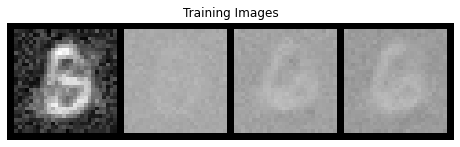

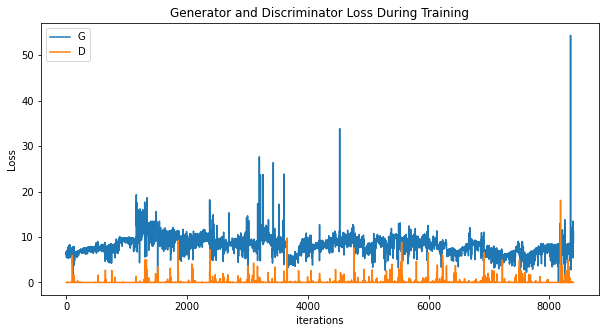

[0/3][8410/30000]	Loss_D: 0.0008	Loss_G: 8.8523	D(x): 1.0000	D(G(z)): 0.0008 / 0.0002
tensor([ 5.5568, -2.4181], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2450, -0.2844], grad_fn=<SliceBackward>)
[0/3][8420/30000]	Loss_D: 0.0003	Loss_G: 8.9551	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.5576, -2.4195], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2452, -0.2849], grad_fn=<SliceBackward>)
[0/3][8430/30000]	Loss_D: 0.0032	Loss_G: 8.9754	D(x): 1.0000	D(G(z)): 0.0031 / 0.0001
tensor([ 5.5581, -2.4206], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2453, -0.2826], grad_fn=<SliceBackward>)
[0/3][8440/30000]	Loss_D: 0.0119	Loss_G: 8.6544	D(x): 1.0000	D(G(z)): 0.0118 / 0.0002
tensor([ 5.5589, -2.4213], grad_fn=<SliceBackward>) tensor([-0.0109,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.2479, -0.2792], grad_fn=<SliceBackward>)
[0/3][8450/30000]	Loss_D: 0.0001

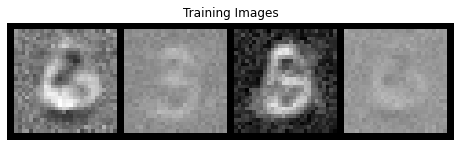

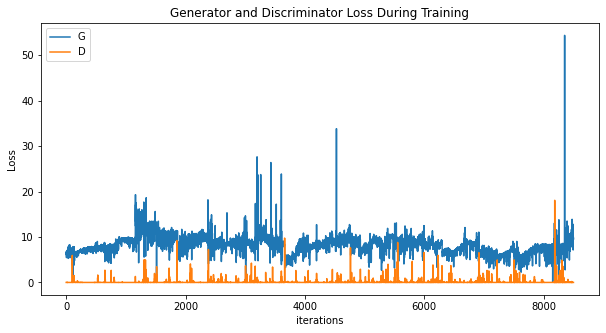

[0/3][8510/30000]	Loss_D: 0.0000	Loss_G: 11.6582	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6172, -2.4041], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.2272, -0.2546], grad_fn=<SliceBackward>)
[0/3][8520/30000]	Loss_D: 0.0000	Loss_G: 11.1548	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6122, -2.4017], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.2233, -0.2575], grad_fn=<SliceBackward>)
[0/3][8530/30000]	Loss_D: 0.0000	Loss_G: 15.8318	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6084, -2.4009], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.2124, -0.2642], grad_fn=<SliceBackward>)
[0/3][8540/30000]	Loss_D: 0.0001	Loss_G: 11.2371	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6069, -2.4013], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([ 0.2082, -0.2702], grad_fn=<SliceBackward>)
[0/3][8550/30000]	Loss_D: 0.

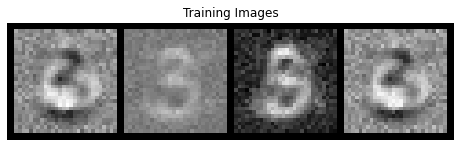

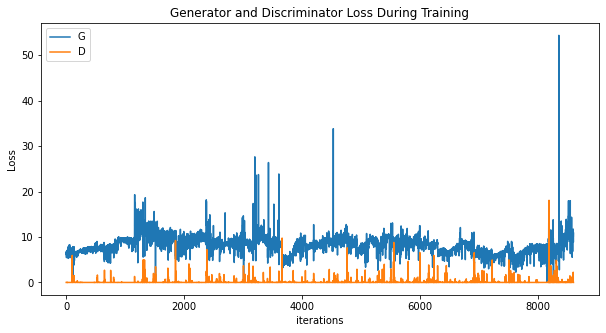

[0/3][8610/30000]	Loss_D: 0.0003	Loss_G: 9.9124	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 5.5978, -2.4143], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.1466, -0.3132], grad_fn=<SliceBackward>)
[0/3][8620/30000]	Loss_D: 0.0001	Loss_G: 11.1316	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.5973, -2.4137], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.1438, -0.3163], grad_fn=<SliceBackward>)
[0/3][8630/30000]	Loss_D: 0.0002	Loss_G: 10.8878	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 5.5963, -2.4125], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.1340, -0.3259], grad_fn=<SliceBackward>)
[0/3][8640/30000]	Loss_D: 0.0001	Loss_G: 10.1487	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.5936, -2.4097], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0096], grad_fn=<SliceBackward>)
tensor([ 0.1322, -0.3264], grad_fn=<SliceBackward>)
[0/3][8650/30000]	Loss_D: 0.0

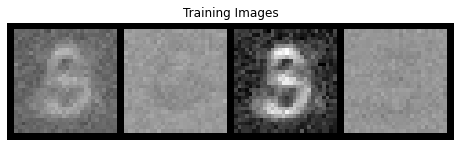

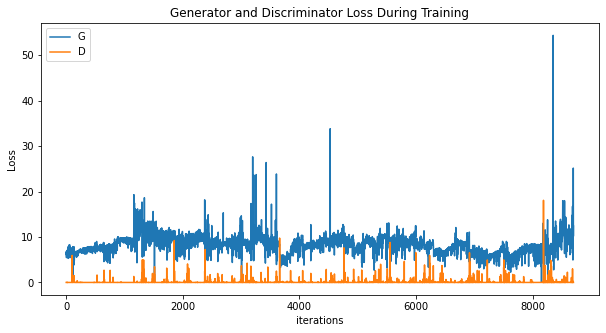

[0/3][8710/30000]	Loss_D: 0.0016	Loss_G: 8.0362	D(x): 1.0000	D(G(z)): 0.0016 / 0.0003
tensor([ 5.6564, -2.4047], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0094], grad_fn=<SliceBackward>)
tensor([ 0.0874, -0.3402], grad_fn=<SliceBackward>)
[0/3][8720/30000]	Loss_D: 0.0010	Loss_G: 8.9737	D(x): 1.0000	D(G(z)): 0.0010 / 0.0001
tensor([ 5.6573, -2.4037], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0094], grad_fn=<SliceBackward>)
tensor([ 0.0801, -0.3445], grad_fn=<SliceBackward>)
[0/3][8730/30000]	Loss_D: 0.0054	Loss_G: 12.0368	D(x): 1.0000	D(G(z)): 0.0054 / 0.0000
tensor([ 5.6582, -2.4024], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0095], grad_fn=<SliceBackward>)
tensor([ 0.0762, -0.3485], grad_fn=<SliceBackward>)
[0/3][8740/30000]	Loss_D: 0.0018	Loss_G: 10.5911	D(x): 0.9997	D(G(z)): 0.0015 / 0.0001
tensor([ 5.6588, -2.4015], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0095], grad_fn=<SliceBackward>)
tensor([ 0.0709, -0.3492], grad_fn=<SliceBackward>)
[0/3][8750/30000]	Loss_D: 0.00

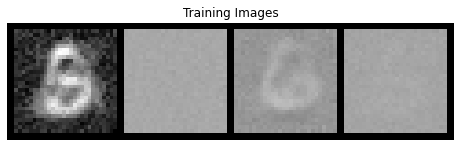

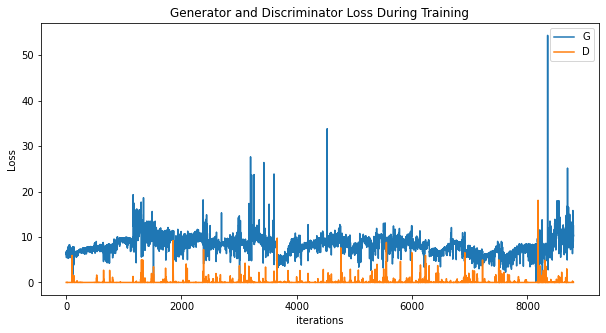

[0/3][8810/30000]	Loss_D: 0.0000	Loss_G: 10.5642	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6846, -2.4390], grad_fn=<SliceBackward>) tensor([-0.0073,  0.0098], grad_fn=<SliceBackward>)
tensor([ 0.0440, -0.3766], grad_fn=<SliceBackward>)
[0/3][8820/30000]	Loss_D: 0.0000	Loss_G: 9.7436	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.6833, -2.4401], grad_fn=<SliceBackward>) tensor([-0.0073,  0.0098], grad_fn=<SliceBackward>)
tensor([ 0.0335, -0.3833], grad_fn=<SliceBackward>)
[0/3][8830/30000]	Loss_D: 0.0001	Loss_G: 11.8991	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6816, -2.4379], grad_fn=<SliceBackward>) tensor([-0.0073,  0.0098], grad_fn=<SliceBackward>)
tensor([ 0.0259, -0.3870], grad_fn=<SliceBackward>)
[0/3][8840/30000]	Loss_D: 0.0001	Loss_G: 11.4472	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6810, -2.4371], grad_fn=<SliceBackward>) tensor([-0.0073,  0.0098], grad_fn=<SliceBackward>)
tensor([ 0.0173, -0.3944], grad_fn=<SliceBackward>)
[0/3][8850/30000]	Loss_D: 0.0

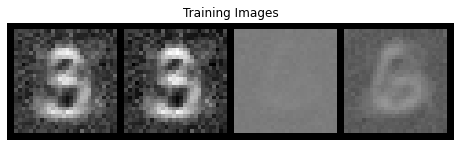

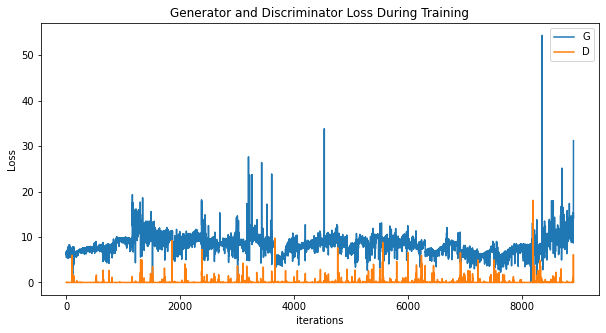

[0/3][8910/30000]	Loss_D: 0.0076	Loss_G: 13.1287	D(x): 0.9924	D(G(z)): 0.0000 / 0.0001
tensor([ 5.6717, -2.4705], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0096], grad_fn=<SliceBackward>)
tensor([-0.0438, -0.4300], grad_fn=<SliceBackward>)
[0/3][8920/30000]	Loss_D: 0.0003	Loss_G: 12.9748	D(x): 1.0000	D(G(z)): 0.0003 / 0.0000
tensor([ 5.6735, -2.4750], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0096], grad_fn=<SliceBackward>)
tensor([-0.0515, -0.4370], grad_fn=<SliceBackward>)
[0/3][8930/30000]	Loss_D: 0.0050	Loss_G: 13.8192	D(x): 1.0000	D(G(z)): 0.0050 / 0.0000
tensor([ 5.6776, -2.4820], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0096], grad_fn=<SliceBackward>)
tensor([-0.0645, -0.4517], grad_fn=<SliceBackward>)
[0/3][8940/30000]	Loss_D: 0.0077	Loss_G: 13.9677	D(x): 1.0000	D(G(z)): 0.0077 / 0.0000
tensor([ 5.6931, -2.5076], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0098], grad_fn=<SliceBackward>)
tensor([-0.0673, -0.4521], grad_fn=<SliceBackward>)
[0/3][8950/30000]	Loss_D: 0.

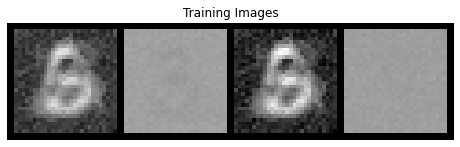

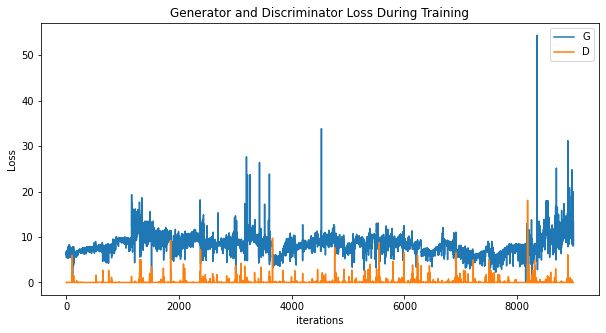

[0/3][9010/30000]	Loss_D: 0.0000	Loss_G: 12.2684	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6359, -2.5493], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0102], grad_fn=<SliceBackward>)
tensor([-0.0772, -0.4437], grad_fn=<SliceBackward>)
[0/3][9020/30000]	Loss_D: 0.0175	Loss_G: 17.8168	D(x): 1.0000	D(G(z)): 0.0172 / 0.0016
tensor([ 5.6344, -2.5476], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0101], grad_fn=<SliceBackward>)
tensor([-0.0783, -0.4426], grad_fn=<SliceBackward>)
[0/3][9030/30000]	Loss_D: 0.0111	Loss_G: 6.2361	D(x): 1.0000	D(G(z)): 0.0110 / 0.0137
tensor([ 5.6351, -2.5466], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0101], grad_fn=<SliceBackward>)
tensor([-0.0790, -0.4424], grad_fn=<SliceBackward>)
[0/3][9040/30000]	Loss_D: 0.0029	Loss_G: 10.2919	D(x): 1.0000	D(G(z)): 0.0029 / 0.0001
tensor([ 5.6358, -2.5452], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0101], grad_fn=<SliceBackward>)
tensor([-0.0796, -0.4417], grad_fn=<SliceBackward>)
[0/3][9050/30000]	Loss_D: 0.0

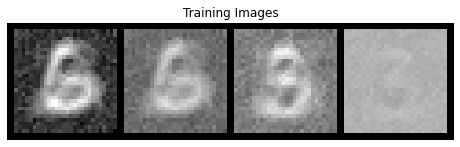

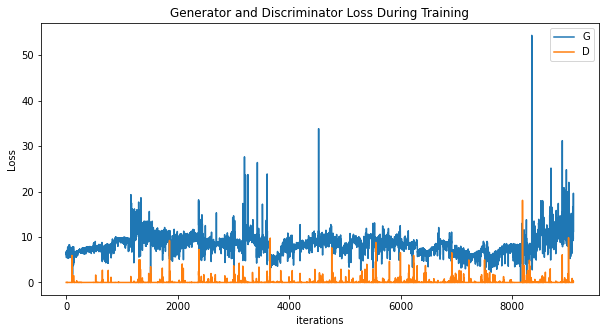

[0/3][9110/30000]	Loss_D: 0.0005	Loss_G: 13.0334	D(x): 1.0000	D(G(z)): 0.0005 / 0.0000
tensor([ 5.6330, -2.5412], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0106], grad_fn=<SliceBackward>)
tensor([-0.1001, -0.4372], grad_fn=<SliceBackward>)
[0/3][9120/30000]	Loss_D: 0.0001	Loss_G: 10.3808	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6236, -2.5335], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0105], grad_fn=<SliceBackward>)
tensor([-0.0987, -0.4341], grad_fn=<SliceBackward>)
[0/3][9130/30000]	Loss_D: 0.0000	Loss_G: 9.1119	D(x): 1.0000	D(G(z)): 0.0000 / 0.0002
tensor([ 5.6208, -2.5324], grad_fn=<SliceBackward>) tensor([-0.0063,  0.0105], grad_fn=<SliceBackward>)
tensor([-0.0973, -0.4301], grad_fn=<SliceBackward>)
[0/3][9140/30000]	Loss_D: 0.0186	Loss_G: 4.7992	D(x): 1.0000	D(G(z)): 0.0184 / 0.0133
tensor([ 5.6185, -2.5319], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0075], grad_fn=<SliceBackward>)
tensor([-0.0980, -0.4296], grad_fn=<SliceBackward>)
[0/3][9150/30000]	Loss_D: 0.00

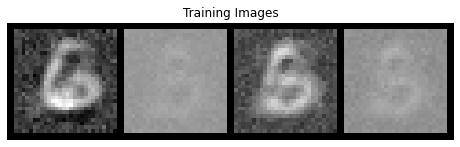

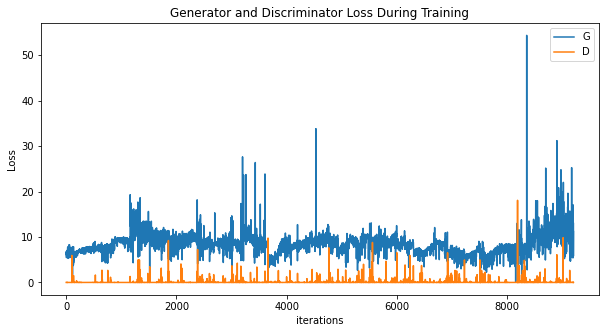

[0/3][9210/30000]	Loss_D: 0.0330	Loss_G: 17.5254	D(x): 1.0000	D(G(z)): 0.0322 / 0.0001
tensor([ 5.6489, -2.5249], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0077], grad_fn=<SliceBackward>)
tensor([-0.0834, -0.4124], grad_fn=<SliceBackward>)
[0/3][9220/30000]	Loss_D: 0.0000	Loss_G: 12.4623	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6661, -2.5228], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0077], grad_fn=<SliceBackward>)
tensor([-0.0864, -0.4136], grad_fn=<SliceBackward>)
[0/3][9230/30000]	Loss_D: 0.0002	Loss_G: 21.4468	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 5.6693, -2.5182], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([-0.0876, -0.4145], grad_fn=<SliceBackward>)
[0/3][9240/30000]	Loss_D: 0.0040	Loss_G: 6.6102	D(x): 1.0000	D(G(z)): 0.0040 / 0.0098
tensor([ 5.6733, -2.5153], grad_fn=<SliceBackward>) tensor([-0.0091,  0.0078], grad_fn=<SliceBackward>)
tensor([-0.0891, -0.4162], grad_fn=<SliceBackward>)
[0/3][9250/30000]	Loss_D: 0.0

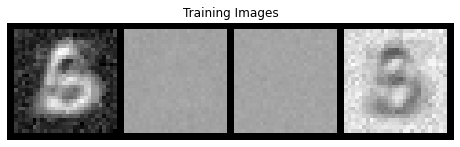

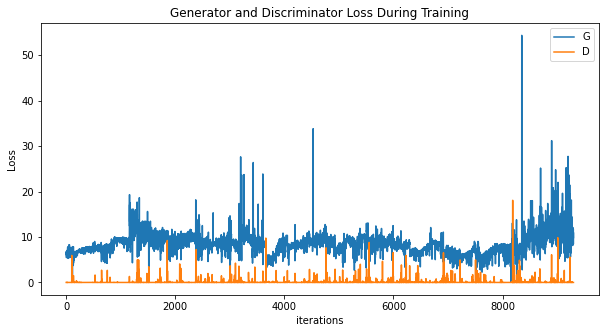

[0/3][9310/30000]	Loss_D: 0.0018	Loss_G: 11.4640	D(x): 1.0000	D(G(z)): 0.0018 / 0.0000
tensor([ 5.7558, -2.4239], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0079], grad_fn=<SliceBackward>)
tensor([-0.0707, -0.4233], grad_fn=<SliceBackward>)
[0/3][9320/30000]	Loss_D: 0.0004	Loss_G: 12.5178	D(x): 1.0000	D(G(z)): 0.0004 / 0.0000
tensor([ 5.7594, -2.4169], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0079], grad_fn=<SliceBackward>)
tensor([-0.0678, -0.4252], grad_fn=<SliceBackward>)
[0/3][9330/30000]	Loss_D: 0.0025	Loss_G: 10.2075	D(x): 1.0000	D(G(z)): 0.0025 / 0.0001
tensor([ 5.7623, -2.4106], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0079], grad_fn=<SliceBackward>)
tensor([-0.0650, -0.4245], grad_fn=<SliceBackward>)
[0/3][9340/30000]	Loss_D: 0.0006	Loss_G: 7.5666	D(x): 1.0000	D(G(z)): 0.0006 / 0.0021
tensor([ 5.7638, -2.4074], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0079], grad_fn=<SliceBackward>)
tensor([-0.0589, -0.4289], grad_fn=<SliceBackward>)
[0/3][9350/30000]	Loss_D: 0.0

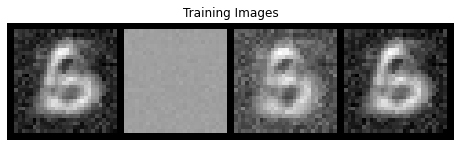

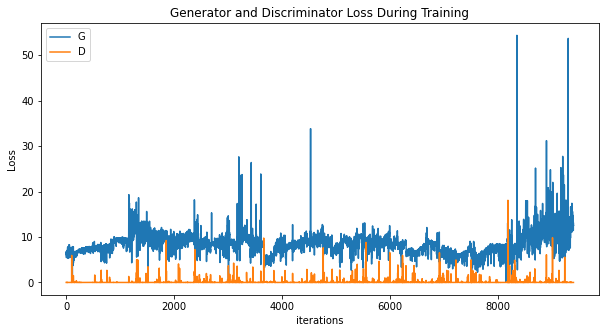

[0/3][9410/30000]	Loss_D: 0.0000	Loss_G: 15.5808	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6480, -2.5725], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0082], grad_fn=<SliceBackward>)
tensor([-0.0576, -0.4408], grad_fn=<SliceBackward>)
[0/3][9420/30000]	Loss_D: 0.0001	Loss_G: 11.6120	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6485, -2.5721], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.0525, -0.4411], grad_fn=<SliceBackward>)
[0/3][9430/30000]	Loss_D: 2.4751	Loss_G: 14.9569	D(x): 0.5035	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6491, -2.5717], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0081], grad_fn=<SliceBackward>)
tensor([-0.0531, -0.4439], grad_fn=<SliceBackward>)
[0/3][9440/30000]	Loss_D: 0.0117	Loss_G: 10.9615	D(x): 1.0000	D(G(z)): 0.0117 / 0.0005
tensor([ 5.6497, -2.5716], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0082], grad_fn=<SliceBackward>)
tensor([-0.0531, -0.4462], grad_fn=<SliceBackward>)
[0/3][9450/30000]	Loss_D: 0.

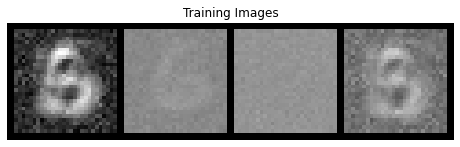

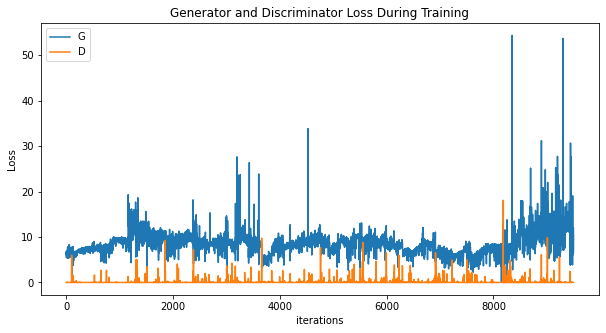

[0/3][9510/30000]	Loss_D: 0.0022	Loss_G: 6.9240	D(x): 1.0000	D(G(z)): 0.0022 / 0.0019
tensor([ 5.6544, -2.5690], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.0211, -0.4402], grad_fn=<SliceBackward>)
[0/3][9520/30000]	Loss_D: 0.0011	Loss_G: 8.0460	D(x): 1.0000	D(G(z)): 0.0011 / 0.0003
tensor([ 5.6558, -2.5692], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.0185, -0.4366], grad_fn=<SliceBackward>)
[0/3][9530/30000]	Loss_D: 0.0029	Loss_G: 10.3417	D(x): 1.0000	D(G(z)): 0.0029 / 0.0002
tensor([ 5.6571, -2.5703], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.0153, -0.4336], grad_fn=<SliceBackward>)
[0/3][9540/30000]	Loss_D: 0.0047	Loss_G: 9.5265	D(x): 1.0000	D(G(z)): 0.0047 / 0.0002
tensor([ 5.6586, -2.5721], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0083], grad_fn=<SliceBackward>)
tensor([-0.0141, -0.4325], grad_fn=<SliceBackward>)
[0/3][9550/30000]	Loss_D: 0.378

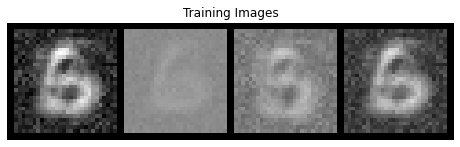

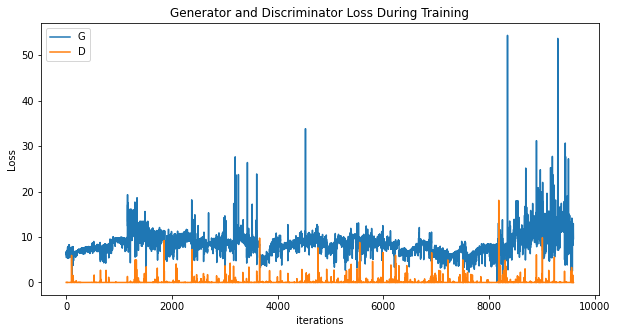

[0/3][9610/30000]	Loss_D: 0.0000	Loss_G: 11.0986	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.5613, -2.6707], grad_fn=<SliceBackward>) tensor([-0.0046,  0.0113], grad_fn=<SliceBackward>)
tensor([ 0.0106, -0.4294], grad_fn=<SliceBackward>)
[0/3][9620/30000]	Loss_D: 0.0004	Loss_G: 12.0260	D(x): 1.0000	D(G(z)): 0.0004 / 0.0000
tensor([ 5.5275, -2.6937], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0109], grad_fn=<SliceBackward>)
tensor([ 0.0181, -0.4197], grad_fn=<SliceBackward>)
[0/3][9630/30000]	Loss_D: 0.0018	Loss_G: 12.8318	D(x): 1.0000	D(G(z)): 0.0018 / 0.0000
tensor([ 5.5276, -2.6938], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0109], grad_fn=<SliceBackward>)
tensor([ 0.0272, -0.4101], grad_fn=<SliceBackward>)
[0/3][9640/30000]	Loss_D: 0.0011	Loss_G: 14.6002	D(x): 1.0000	D(G(z)): 0.0011 / 0.0000
tensor([ 5.5136, -2.7021], grad_fn=<SliceBackward>) tensor([-0.0049,  0.0110], grad_fn=<SliceBackward>)
tensor([ 0.0383, -0.3963], grad_fn=<SliceBackward>)
[0/3][9650/30000]	Loss_D: 0.

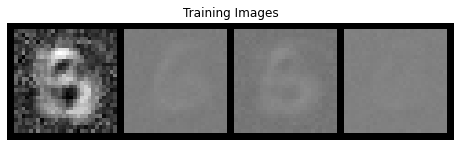

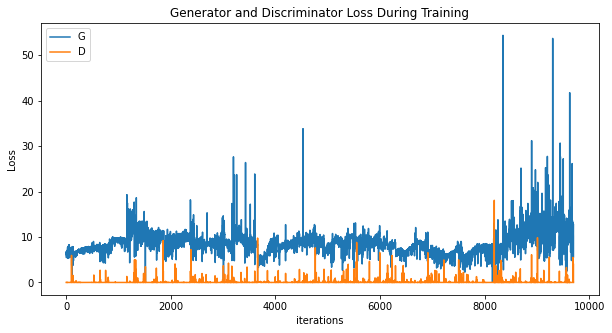

[0/3][9710/30000]	Loss_D: 0.0285	Loss_G: 3.8522	D(x): 1.0000	D(G(z)): 0.0280 / 0.0251
tensor([ 5.5222, -2.7013], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0105], grad_fn=<SliceBackward>)
tensor([ 0.0720, -0.3619], grad_fn=<SliceBackward>)
[0/3][9720/30000]	Loss_D: 3.6188	Loss_G: 7.1294	D(x): 0.5004	D(G(z)): 0.0004 / 0.0008
tensor([ 5.5241, -2.6979], grad_fn=<SliceBackward>) tensor([-0.0051,  0.0108], grad_fn=<SliceBackward>)
tensor([ 0.0737, -0.3616], grad_fn=<SliceBackward>)
[0/3][9730/30000]	Loss_D: 0.0009	Loss_G: 12.8169	D(x): 1.0000	D(G(z)): 0.0009 / 0.0001
tensor([ 5.5244, -2.6974], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0106], grad_fn=<SliceBackward>)
tensor([ 0.0717, -0.3622], grad_fn=<SliceBackward>)
[0/3][9740/30000]	Loss_D: 0.0009	Loss_G: 6.9608	D(x): 1.0000	D(G(z)): 0.0009 / 0.0011
tensor([ 5.5247, -2.6972], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0106], grad_fn=<SliceBackward>)
tensor([ 0.0719, -0.3632], grad_fn=<SliceBackward>)
[0/3][9750/30000]	Loss_D: 0.003

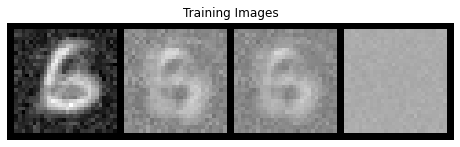

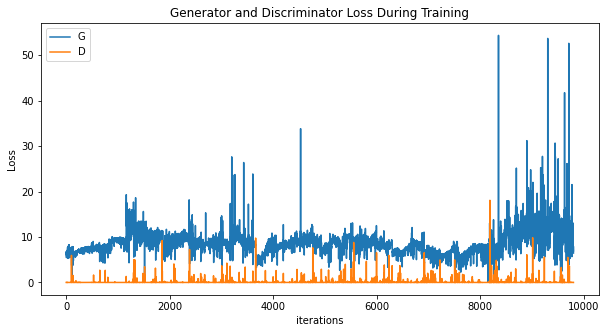

[0/3][9810/30000]	Loss_D: 0.0042	Loss_G: 9.2188	D(x): 1.0000	D(G(z)): 0.0041 / 0.0011
tensor([ 5.5270, -2.6976], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0105], grad_fn=<SliceBackward>)
tensor([ 0.0785, -0.3453], grad_fn=<SliceBackward>)
[0/3][9820/30000]	Loss_D: 0.0118	Loss_G: 8.8759	D(x): 1.0000	D(G(z)): 0.0117 / 0.0001
tensor([ 5.5273, -2.6982], grad_fn=<SliceBackward>) tensor([-0.0057,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.0783, -0.3459], grad_fn=<SliceBackward>)
[0/3][9830/30000]	Loss_D: 0.0065	Loss_G: 7.8628	D(x): 1.0000	D(G(z)): 0.0065 / 0.0036
tensor([ 5.5275, -2.6990], grad_fn=<SliceBackward>) tensor([-0.0057,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.0781, -0.3464], grad_fn=<SliceBackward>)
[0/3][9840/30000]	Loss_D: 0.0031	Loss_G: 4.8942	D(x): 1.0000	D(G(z)): 0.0031 / 0.0075
tensor([ 5.5278, -2.6998], grad_fn=<SliceBackward>) tensor([-0.0057,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.0826, -0.3391], grad_fn=<SliceBackward>)
[0/3][9850/30000]	Loss_D: 0.0067

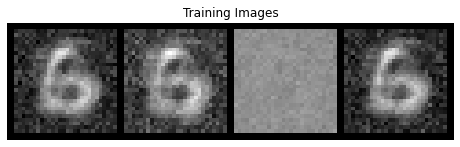

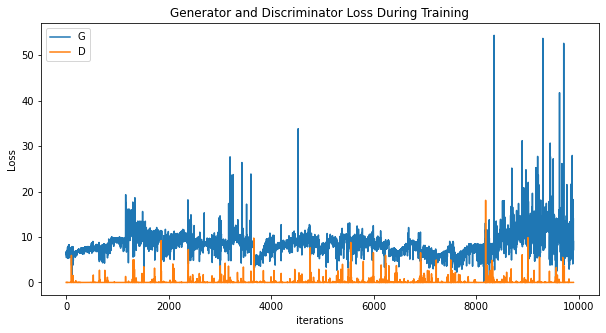

[0/3][9910/30000]	Loss_D: 0.0146	Loss_G: 12.3766	D(x): 1.0000	D(G(z)): 0.0145 / 0.0000
tensor([ 5.5292, -2.7083], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1082, -0.3036], grad_fn=<SliceBackward>)
[0/3][9920/30000]	Loss_D: 0.0040	Loss_G: 5.3229	D(x): 1.0000	D(G(z)): 0.0040 / 0.0049
tensor([ 5.5292, -2.7104], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1093, -0.3024], grad_fn=<SliceBackward>)
[0/3][9930/30000]	Loss_D: 0.0092	Loss_G: 6.5047	D(x): 1.0000	D(G(z)): 0.0091 / 0.0017
tensor([ 5.5291, -2.7133], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1103, -0.3008], grad_fn=<SliceBackward>)
[0/3][9940/30000]	Loss_D: 0.0084	Loss_G: 7.8783	D(x): 1.0000	D(G(z)): 0.0084 / 0.0032
tensor([ 5.5288, -2.7179], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1172, -0.2902], grad_fn=<SliceBackward>)
[0/3][9950/30000]	Loss_D: 0.262

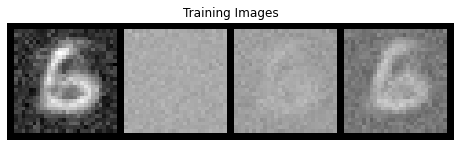

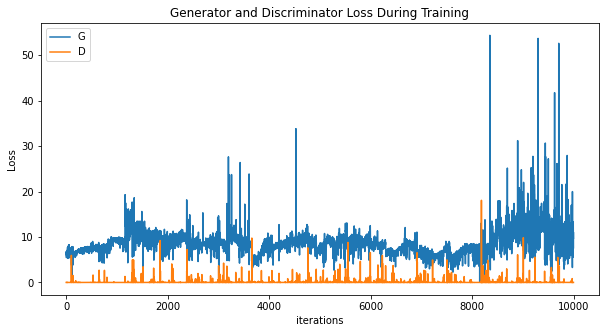

[0/3][10010/30000]	Loss_D: 0.0007	Loss_G: 9.4886	D(x): 1.0000	D(G(z)): 0.0007 / 0.0004
tensor([ 5.4276, -2.7897], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0099], grad_fn=<SliceBackward>)
tensor([ 0.1229, -0.2761], grad_fn=<SliceBackward>)
[0/3][10020/30000]	Loss_D: 0.0004	Loss_G: 11.6958	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 5.4281, -2.7857], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0099], grad_fn=<SliceBackward>)
tensor([ 0.1258, -0.2728], grad_fn=<SliceBackward>)
[0/3][10030/30000]	Loss_D: 0.0312	Loss_G: 7.5891	D(x): 1.0000	D(G(z)): 0.0305 / 0.0006
tensor([ 5.4291, -2.7818], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0099], grad_fn=<SliceBackward>)
tensor([ 0.1272, -0.2707], grad_fn=<SliceBackward>)
[0/3][10040/30000]	Loss_D: 0.0000	Loss_G: 11.6385	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.4188, -2.7838], grad_fn=<SliceBackward>) tensor([-0.0019,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.1265, -0.2706], grad_fn=<SliceBackward>)
[0/3][10050/30000]	Loss_D:

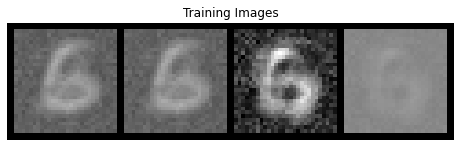

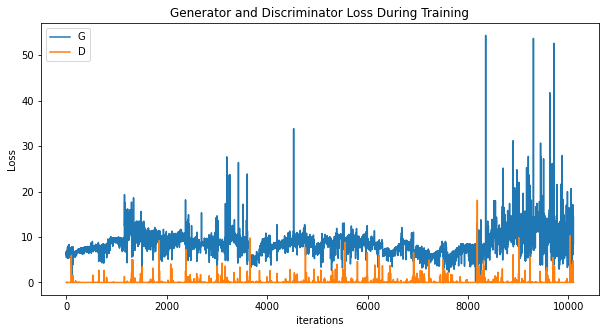

[0/3][10110/30000]	Loss_D: 0.0113	Loss_G: 23.6872	D(x): 1.0000	D(G(z)): 0.0112 / 0.0000
tensor([ 5.4084, -2.8170], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0121], grad_fn=<SliceBackward>)
tensor([ 0.1357, -0.2503], grad_fn=<SliceBackward>)
[0/3][10120/30000]	Loss_D: 0.0102	Loss_G: 12.8996	D(x): 1.0000	D(G(z)): 0.0102 / 0.0000
tensor([ 5.4020, -2.8176], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0121], grad_fn=<SliceBackward>)
tensor([ 0.1375, -0.2482], grad_fn=<SliceBackward>)
[0/3][10130/30000]	Loss_D: 0.0003	Loss_G: 10.4159	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
tensor([ 5.3938, -2.8190], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0121], grad_fn=<SliceBackward>)
tensor([ 0.1379, -0.2462], grad_fn=<SliceBackward>)
[0/3][10140/30000]	Loss_D: 0.0035	Loss_G: 11.7336	D(x): 1.0000	D(G(z)): 0.0034 / 0.0000
tensor([ 5.3840, -2.8233], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0121], grad_fn=<SliceBackward>)
tensor([ 0.1380, -0.2457], grad_fn=<SliceBackward>)
[0/3][10150/30000]	Loss_

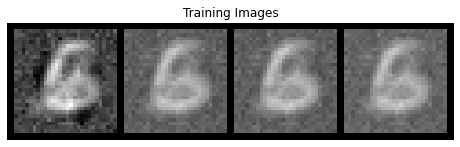

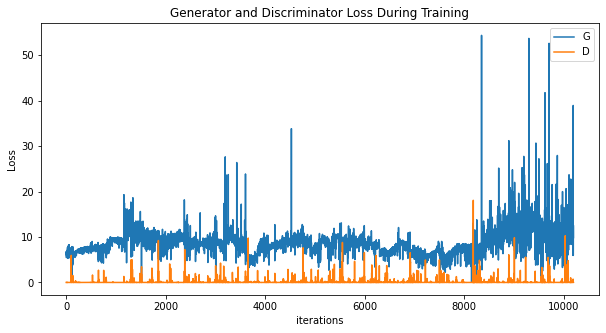

[0/3][10210/30000]	Loss_D: 0.0001	Loss_G: 13.1747	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.3902, -2.8045], grad_fn=<SliceBackward>) tensor([-0.0030,  0.0118], grad_fn=<SliceBackward>)
tensor([ 0.1452, -0.2330], grad_fn=<SliceBackward>)
[0/3][10220/30000]	Loss_D: 0.0266	Loss_G: 8.2602	D(x): 1.0000	D(G(z)): 0.0262 / 0.0070
tensor([ 5.3895, -2.8035], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0115], grad_fn=<SliceBackward>)
tensor([ 0.1475, -0.2287], grad_fn=<SliceBackward>)
[0/3][10230/30000]	Loss_D: 0.0432	Loss_G: 10.0678	D(x): 0.9973	D(G(z)): 0.0396 / 0.0004
tensor([ 5.3899, -2.8025], grad_fn=<SliceBackward>) tensor([-0.0032,  0.0116], grad_fn=<SliceBackward>)
tensor([ 0.1499, -0.2257], grad_fn=<SliceBackward>)
[0/3][10240/30000]	Loss_D: 0.0004	Loss_G: 8.5754	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
tensor([ 5.3930, -2.7988], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0114], grad_fn=<SliceBackward>)
tensor([ 0.1528, -0.2224], grad_fn=<SliceBackward>)
[0/3][10250/30000]	Loss_D:

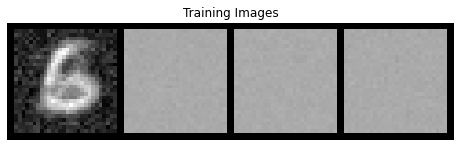

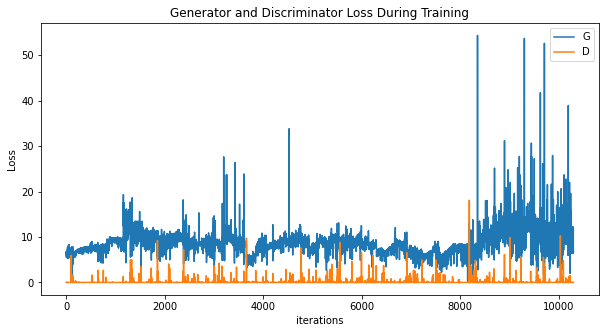

[0/3][10310/30000]	Loss_D: 0.0043	Loss_G: 12.1881	D(x): 1.0000	D(G(z)): 0.0043 / 0.0000
tensor([ 5.3975, -2.7922], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0114], grad_fn=<SliceBackward>)
tensor([ 0.1668, -0.2003], grad_fn=<SliceBackward>)
[0/3][10320/30000]	Loss_D: 0.0061	Loss_G: 8.8529	D(x): 0.9949	D(G(z)): 0.0010 / 0.0001
tensor([ 5.3977, -2.7920], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0115], grad_fn=<SliceBackward>)
tensor([ 0.1677, -0.1994], grad_fn=<SliceBackward>)
[0/3][10330/30000]	Loss_D: 0.0030	Loss_G: 5.7250	D(x): 1.0000	D(G(z)): 0.0030 / 0.0056
tensor([ 5.3978, -2.7918], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0115], grad_fn=<SliceBackward>)
tensor([ 0.1666, -0.1999], grad_fn=<SliceBackward>)
[0/3][10340/30000]	Loss_D: 0.0029	Loss_G: 8.2193	D(x): 1.0000	D(G(z)): 0.0029 / 0.0004
tensor([ 5.3978, -2.7916], grad_fn=<SliceBackward>) tensor([-0.0033,  0.0115], grad_fn=<SliceBackward>)
tensor([ 0.1707, -0.1954], grad_fn=<SliceBackward>)
[0/3][10350/30000]	Loss_D: 

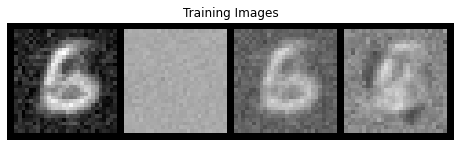

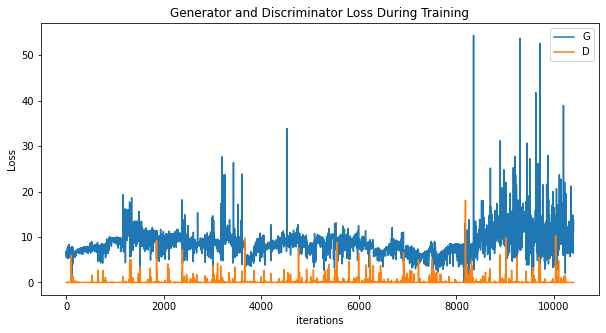

[0/3][10410/30000]	Loss_D: 0.0130	Loss_G: 5.7044	D(x): 1.0000	D(G(z)): 0.0129 / 0.0034
tensor([ 5.3947, -2.7912], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0113], grad_fn=<SliceBackward>)
tensor([ 0.1646, -0.2010], grad_fn=<SliceBackward>)
[0/3][10420/30000]	Loss_D: 0.0082	Loss_G: 5.3077	D(x): 1.0000	D(G(z)): 0.0082 / 0.5000
tensor([ 5.3967, -2.7913], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0113], grad_fn=<SliceBackward>)
tensor([ 0.1604, -0.2058], grad_fn=<SliceBackward>)
[0/3][10430/30000]	Loss_D: 0.0082	Loss_G: 12.4749	D(x): 1.0000	D(G(z)): 0.0081 / 0.0000
tensor([ 5.3998, -2.7912], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0113], grad_fn=<SliceBackward>)
tensor([ 0.1588, -0.2075], grad_fn=<SliceBackward>)
[0/3][10440/30000]	Loss_D: 0.0201	Loss_G: 9.8616	D(x): 1.0000	D(G(z)): 0.0198 / 0.0006
tensor([ 5.3917, -2.8026], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0114], grad_fn=<SliceBackward>)
tensor([ 0.1572, -0.2095], grad_fn=<SliceBackward>)
[0/3][10450/30000]	Loss_D: 

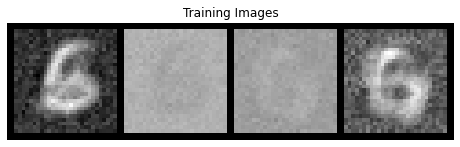

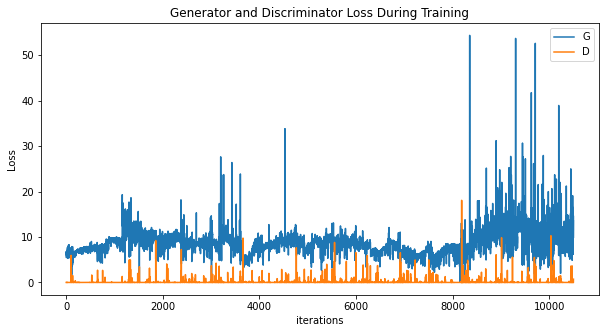

[0/3][10510/30000]	Loss_D: 0.0030	Loss_G: 6.7793	D(x): 1.0000	D(G(z)): 0.0030 / 0.0037
tensor([ 5.3335, -2.8438], grad_fn=<SliceBackward>) tensor([-0.0018,  0.0127], grad_fn=<SliceBackward>)
tensor([ 0.1472, -0.2099], grad_fn=<SliceBackward>)
[0/3][10520/30000]	Loss_D: 0.0035	Loss_G: 9.0870	D(x): 1.0000	D(G(z)): 0.0035 / 0.0001
tensor([ 5.3305, -2.8450], grad_fn=<SliceBackward>) tensor([-0.0017,  0.0128], grad_fn=<SliceBackward>)
tensor([ 0.1386, -0.2157], grad_fn=<SliceBackward>)
[0/3][10530/30000]	Loss_D: 0.0014	Loss_G: 8.7456	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
tensor([ 5.3288, -2.8456], grad_fn=<SliceBackward>) tensor([-0.0017,  0.0128], grad_fn=<SliceBackward>)
tensor([ 0.1315, -0.2230], grad_fn=<SliceBackward>)
[0/3][10540/30000]	Loss_D: 0.0029	Loss_G: 6.1042	D(x): 1.0000	D(G(z)): 0.0028 / 0.0028
tensor([ 5.3283, -2.8458], grad_fn=<SliceBackward>) tensor([-0.0017,  0.0128], grad_fn=<SliceBackward>)
tensor([ 0.1355, -0.2177], grad_fn=<SliceBackward>)
[0/3][10550/30000]	Loss_D: 0

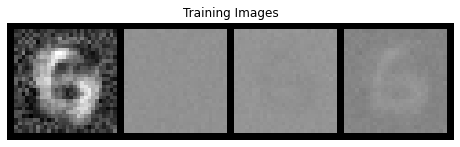

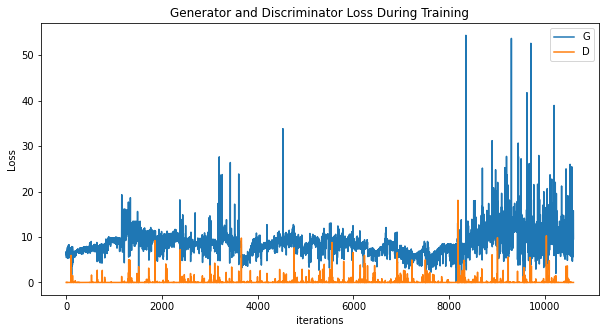

[0/3][10610/30000]	Loss_D: 0.0020	Loss_G: 14.6068	D(x): 1.0000	D(G(z)): 0.0020 / 0.0000
tensor([ 5.3250, -2.8547], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0129], grad_fn=<SliceBackward>)
tensor([ 0.1746, -0.1679], grad_fn=<SliceBackward>)
[0/3][10620/30000]	Loss_D: 0.0088	Loss_G: 13.1076	D(x): 1.0000	D(G(z)): 0.0087 / 0.0000
tensor([ 5.3188, -2.8675], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0129], grad_fn=<SliceBackward>)
tensor([ 0.1773, -0.1644], grad_fn=<SliceBackward>)
[0/3][10630/30000]	Loss_D: 0.0008	Loss_G: 11.1568	D(x): 1.0000	D(G(z)): 0.0008 / 0.0001
tensor([ 5.2946, -2.8905], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0129], grad_fn=<SliceBackward>)
tensor([ 0.1748, -0.1656], grad_fn=<SliceBackward>)
[0/3][10640/30000]	Loss_D: 0.0039	Loss_G: 24.2804	D(x): 0.9999	D(G(z)): 0.0038 / 0.0000
tensor([ 5.2950, -2.8906], grad_fn=<SliceBackward>) tensor([-0.0017,  0.0128], grad_fn=<SliceBackward>)
tensor([ 0.1838, -0.1564], grad_fn=<SliceBackward>)
[0/3][10650/30000]	Loss_

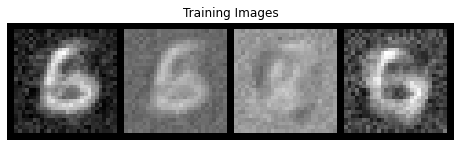

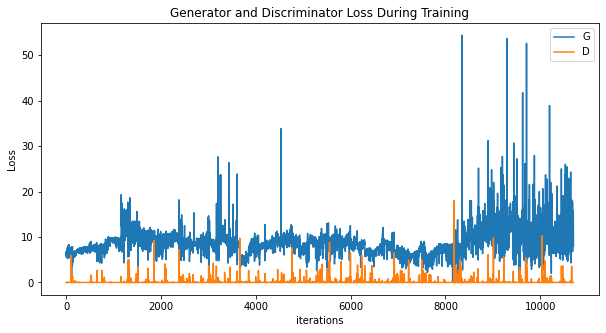

[0/3][10710/30000]	Loss_D: 0.0024	Loss_G: 11.8515	D(x): 1.0000	D(G(z)): 0.0024 / 0.0000
tensor([ 5.2998, -2.8875], grad_fn=<SliceBackward>) tensor([-0.0015,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.2009, -0.1293], grad_fn=<SliceBackward>)
[0/3][10720/30000]	Loss_D: 0.0024	Loss_G: 10.4212	D(x): 1.0000	D(G(z)): 0.0024 / 0.0001
tensor([ 5.3001, -2.8880], grad_fn=<SliceBackward>) tensor([-0.0015,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.2055, -0.1248], grad_fn=<SliceBackward>)
[0/3][10730/30000]	Loss_D: 0.0022	Loss_G: 12.0482	D(x): 1.0000	D(G(z)): 0.0022 / 0.0000
tensor([ 5.3006, -2.8895], grad_fn=<SliceBackward>) tensor([-0.0015,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.2091, -0.1212], grad_fn=<SliceBackward>)
[0/3][10740/30000]	Loss_D: 0.0252	Loss_G: 13.2147	D(x): 1.0000	D(G(z)): 0.0247 / 0.0000
tensor([ 5.2995, -2.9009], grad_fn=<SliceBackward>) tensor([-0.0012,  0.0133], grad_fn=<SliceBackward>)
tensor([ 0.2085, -0.1191], grad_fn=<SliceBackward>)
[0/3][10750/30000]	Loss_

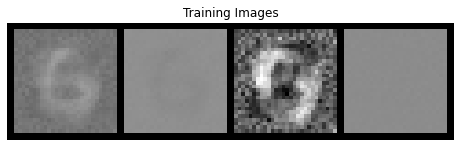

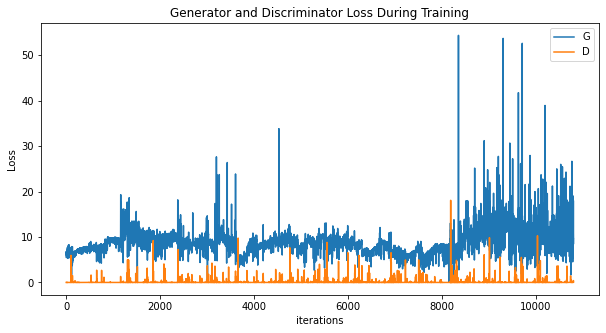

[0/3][10810/30000]	Loss_D: 0.0012	Loss_G: 10.2672	D(x): 1.0000	D(G(z)): 0.0012 / 0.0004
tensor([ 5.2800, -2.9328], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0117], grad_fn=<SliceBackward>)
tensor([ 0.1748, -0.1473], grad_fn=<SliceBackward>)
[0/3][10820/30000]	Loss_D: 0.0007	Loss_G: 8.8335	D(x): 1.0000	D(G(z)): 0.0007 / 0.0002
tensor([ 5.2730, -2.9411], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0117], grad_fn=<SliceBackward>)
tensor([ 0.1782, -0.1457], grad_fn=<SliceBackward>)
[0/3][10830/30000]	Loss_D: 0.0004	Loss_G: 6.1223	D(x): 1.0000	D(G(z)): 0.0004 / 0.0936
tensor([ 5.2467, -2.9779], grad_fn=<SliceBackward>) tensor([-0.0026,  0.0118], grad_fn=<SliceBackward>)
tensor([ 0.1774, -0.1464], grad_fn=<SliceBackward>)
[0/3][10840/30000]	Loss_D: 0.0013	Loss_G: 12.1935	D(x): 1.0000	D(G(z)): 0.0013 / 0.0000
tensor([ 5.2448, -2.9806], grad_fn=<SliceBackward>) tensor([-0.0026,  0.0118], grad_fn=<SliceBackward>)
tensor([ 0.1816, -0.1425], grad_fn=<SliceBackward>)
[0/3][10850/30000]	Loss_D:

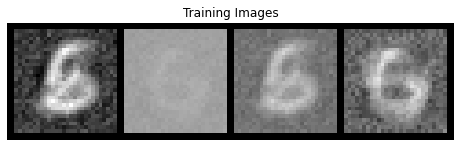

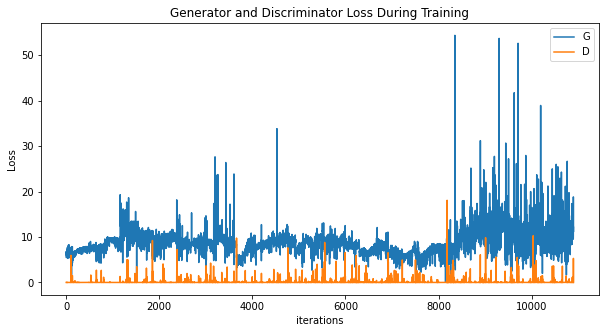

[0/3][10910/30000]	Loss_D: 0.0049	Loss_G: 8.1715	D(x): 1.0000	D(G(z)): 0.0049 / 0.0017
tensor([ 5.2125, -3.0176], grad_fn=<SliceBackward>) tensor([-0.0009,  0.0134], grad_fn=<SliceBackward>)
tensor([ 0.1845, -0.1406], grad_fn=<SliceBackward>)
[0/3][10920/30000]	Loss_D: 0.0001	Loss_G: 5.7680	D(x): 1.0000	D(G(z)): 0.0001 / 0.0033
tensor([ 5.2015, -3.0218], grad_fn=<SliceBackward>) tensor([-0.0008,  0.0135], grad_fn=<SliceBackward>)
tensor([ 0.1862, -0.1398], grad_fn=<SliceBackward>)
[0/3][10930/30000]	Loss_D: 0.0178	Loss_G: 9.8617	D(x): 1.0000	D(G(z)): 0.0176 / 0.0007
tensor([ 5.1910, -3.0261], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0135], grad_fn=<SliceBackward>)
tensor([ 0.1885, -0.1374], grad_fn=<SliceBackward>)
[0/3][10940/30000]	Loss_D: 0.0008	Loss_G: 6.2859	D(x): 1.0000	D(G(z)): 0.0008 / 0.0060
tensor([ 5.1815, -3.0304], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0135], grad_fn=<SliceBackward>)
tensor([ 0.1902, -0.1355], grad_fn=<SliceBackward>)
[0/3][10950/30000]	Loss_D: 0

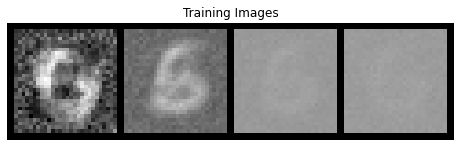

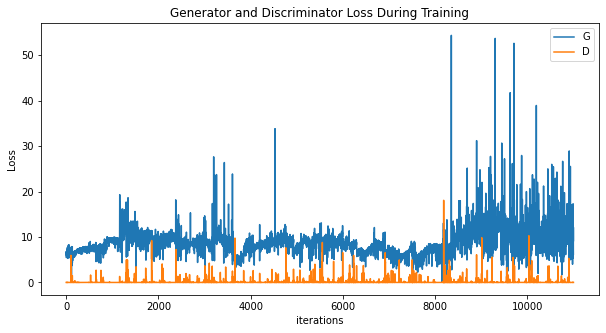

[0/3][11010/30000]	Loss_D: 0.0017	Loss_G: 6.7607	D(x): 1.0000	D(G(z)): 0.0017 / 0.0153
tensor([ 5.1167, -3.0575], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0137], grad_fn=<SliceBackward>)
tensor([ 0.1894, -0.1316], grad_fn=<SliceBackward>)
[0/3][11020/30000]	Loss_D: 0.0003	Loss_G: 9.6040	D(x): 1.0000	D(G(z)): 0.0003 / 0.0008
tensor([ 5.1088, -3.0607], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0137], grad_fn=<SliceBackward>)
tensor([ 0.1894, -0.1311], grad_fn=<SliceBackward>)
[0/3][11030/30000]	Loss_D: 0.0013	Loss_G: 11.9223	D(x): 1.0000	D(G(z)): 0.0013 / 0.0000
tensor([ 5.1011, -3.0639], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0137], grad_fn=<SliceBackward>)
tensor([ 0.1896, -0.1308], grad_fn=<SliceBackward>)
[0/3][11040/30000]	Loss_D: 0.1725	Loss_G: 15.3589	D(x): 1.0000	D(G(z)): 0.1466 / 0.0000
tensor([ 5.0956, -3.0672], grad_fn=<SliceBackward>) tensor([-0.0005,  0.0138], grad_fn=<SliceBackward>)
tensor([ 0.1882, -0.1317], grad_fn=<SliceBackward>)
[0/3][11050/30000]	Loss_D:

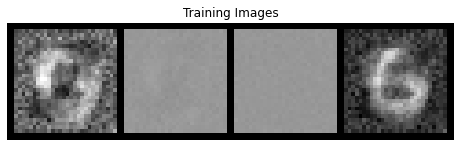

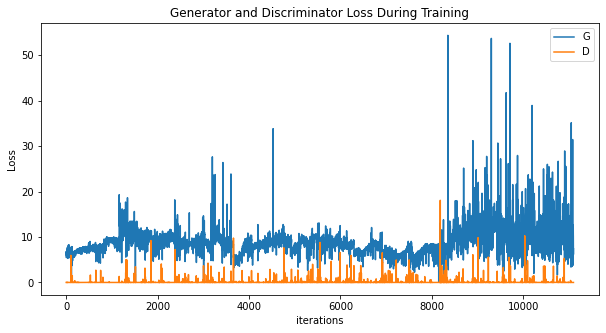

[0/3][11110/30000]	Loss_D: 0.0004	Loss_G: 7.5278	D(x): 1.0000	D(G(z)): 0.0004 / 0.0011
tensor([ 5.1207, -3.0819], grad_fn=<SliceBackward>) tensor([-0.0005,  0.0138], grad_fn=<SliceBackward>)
tensor([ 0.1796, -0.1426], grad_fn=<SliceBackward>)
[0/3][11120/30000]	Loss_D: 0.0003	Loss_G: 5.9425	D(x): 0.9999	D(G(z)): 0.0002 / 0.0032
tensor([ 5.1288, -3.0801], grad_fn=<SliceBackward>) tensor([-0.0004,  0.0138], grad_fn=<SliceBackward>)
tensor([ 0.1777, -0.1444], grad_fn=<SliceBackward>)
[0/3][11130/30000]	Loss_D: 0.0004	Loss_G: 9.2437	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
tensor([ 5.1290, -3.0800], grad_fn=<SliceBackward>) tensor([-0.0005,  0.0138], grad_fn=<SliceBackward>)
tensor([ 0.1778, -0.1444], grad_fn=<SliceBackward>)
[0/3][11140/30000]	Loss_D: 0.0004	Loss_G: 6.8912	D(x): 1.0000	D(G(z)): 0.0004 / 0.0010
tensor([ 5.1310, -3.0771], grad_fn=<SliceBackward>) tensor([-0.0005,  0.0138], grad_fn=<SliceBackward>)
tensor([ 0.1720, -0.1512], grad_fn=<SliceBackward>)
[0/3][11150/30000]	Loss_D: 0

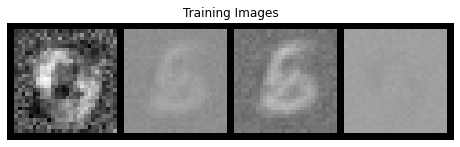

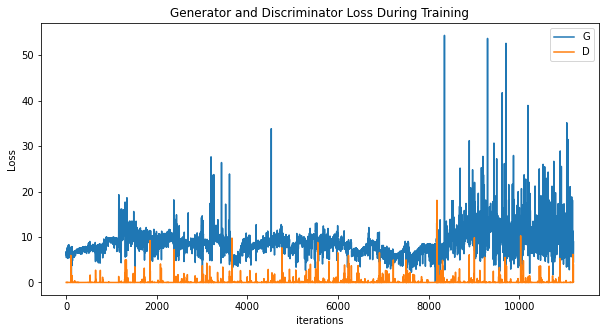

[0/3][11210/30000]	Loss_D: 0.0024	Loss_G: 5.8492	D(x): 1.0000	D(G(z)): 0.0024 / 0.0047
tensor([ 5.1234, -3.0991], grad_fn=<SliceBackward>) tensor([-0.0013,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.1628, -0.1682], grad_fn=<SliceBackward>)
[0/3][11220/30000]	Loss_D: 0.0008	Loss_G: 5.2784	D(x): 1.0000	D(G(z)): 0.0008 / 0.0954
tensor([ 5.1279, -3.0936], grad_fn=<SliceBackward>) tensor([-0.0013,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.1644, -0.1668], grad_fn=<SliceBackward>)
[0/3][11230/30000]	Loss_D: 0.0025	Loss_G: 10.8123	D(x): 1.0000	D(G(z)): 0.0025 / 0.0000
tensor([ 5.1324, -3.0881], grad_fn=<SliceBackward>) tensor([-0.0013,  0.0130], grad_fn=<SliceBackward>)
tensor([ 0.1618, -0.1701], grad_fn=<SliceBackward>)
[0/3][11240/30000]	Loss_D: 0.0303	Loss_G: 11.9078	D(x): 0.9996	D(G(z)): 0.0290 / 0.0000
tensor([ 5.1429, -3.0825], grad_fn=<SliceBackward>) tensor([-0.0013,  0.0129], grad_fn=<SliceBackward>)
tensor([ 0.1610, -0.1714], grad_fn=<SliceBackward>)
[0/3][11250/30000]	Loss_D:

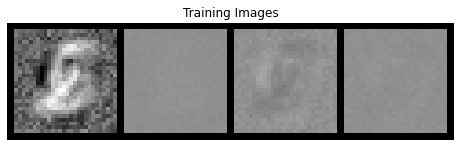

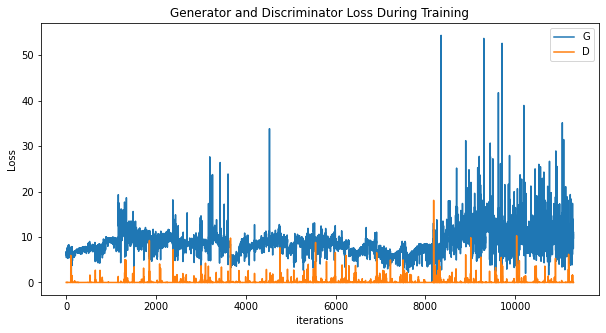

[0/3][11310/30000]	Loss_D: 0.0011	Loss_G: 8.4478	D(x): 0.9998	D(G(z)): 0.0009 / 0.0004
tensor([ 5.1719, -3.0586], grad_fn=<SliceBackward>) tensor([-0.0010,  0.0133], grad_fn=<SliceBackward>)
tensor([ 0.1555, -0.1858], grad_fn=<SliceBackward>)
[0/3][11320/30000]	Loss_D: 0.0005	Loss_G: 9.9888	D(x): 1.0000	D(G(z)): 0.0005 / 0.0000
tensor([ 5.1679, -3.0570], grad_fn=<SliceBackward>) tensor([-0.0010,  0.0133], grad_fn=<SliceBackward>)
tensor([ 0.1588, -0.1834], grad_fn=<SliceBackward>)
[0/3][11330/30000]	Loss_D: 0.0195	Loss_G: 8.4292	D(x): 0.9998	D(G(z)): 0.0190 / 0.0009
tensor([ 5.1623, -3.0546], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0103], grad_fn=<SliceBackward>)
tensor([ 0.1519, -0.1927], grad_fn=<SliceBackward>)
[0/3][11340/30000]	Loss_D: 0.0026	Loss_G: 5.5205	D(x): 1.0000	D(G(z)): 0.0026 / 0.0045
tensor([ 5.1541, -3.0527], grad_fn=<SliceBackward>) tensor([-0.0039,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.1557, -0.1889], grad_fn=<SliceBackward>)
[0/3][11350/30000]	Loss_D: 0

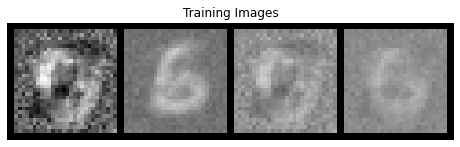

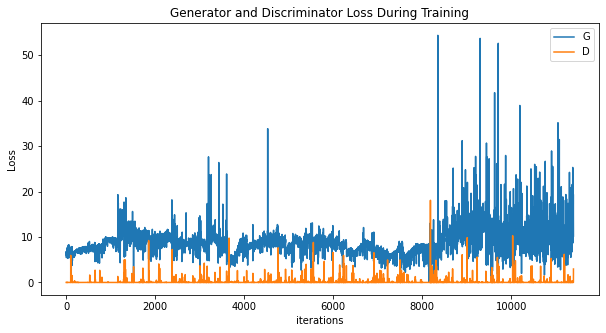

[0/3][11410/30000]	Loss_D: 0.0021	Loss_G: 10.8674	D(x): 1.0000	D(G(z)): 0.0021 / 0.0003
tensor([ 5.1849, -3.0642], grad_fn=<SliceBackward>) tensor([-0.0043,  0.0097], grad_fn=<SliceBackward>)
tensor([ 0.1580, -0.1949], grad_fn=<SliceBackward>)
[0/3][11420/30000]	Loss_D: 0.0000	Loss_G: 9.5113	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.2062, -3.0640], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0100], grad_fn=<SliceBackward>)
tensor([ 0.1542, -0.2049], grad_fn=<SliceBackward>)
[0/3][11430/30000]	Loss_D: 0.0001	Loss_G: 17.8289	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.2154, -3.0491], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.1530, -0.2068], grad_fn=<SliceBackward>)
[0/3][11440/30000]	Loss_D: 0.0009	Loss_G: 9.6087	D(x): 0.9992	D(G(z)): 0.0001 / 0.0006
tensor([ 5.2166, -3.0480], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0101], grad_fn=<SliceBackward>)
tensor([ 0.1551, -0.2061], grad_fn=<SliceBackward>)
[0/3][11450/30000]	Loss_D:

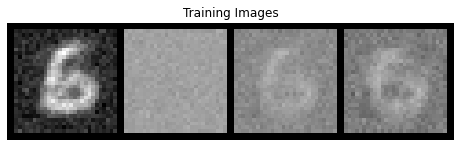

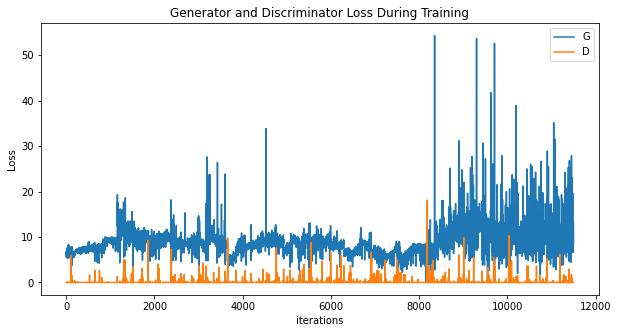

[0/3][11510/30000]	Loss_D: 0.0002	Loss_G: 3.5252	D(x): 1.0000	D(G(z)): 0.0002 / 0.4999
tensor([ 5.2354, -3.0247], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0093], grad_fn=<SliceBackward>)
tensor([ 0.1469, -0.2173], grad_fn=<SliceBackward>)
[0/3][11520/30000]	Loss_D: 0.0008	Loss_G: 9.7770	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
tensor([ 5.2361, -3.0228], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0093], grad_fn=<SliceBackward>)
tensor([ 0.1443, -0.2208], grad_fn=<SliceBackward>)
[0/3][11530/30000]	Loss_D: 0.0003	Loss_G: 9.9958	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.2366, -3.0210], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0093], grad_fn=<SliceBackward>)
tensor([ 0.1418, -0.2251], grad_fn=<SliceBackward>)
[0/3][11540/30000]	Loss_D: 0.0015	Loss_G: 11.3686	D(x): 1.0000	D(G(z)): 0.0015 / 0.0001
tensor([ 5.2370, -3.0191], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0093], grad_fn=<SliceBackward>)
tensor([ 0.1394, -0.2282], grad_fn=<SliceBackward>)
[0/3][11550/30000]	Loss_D: 

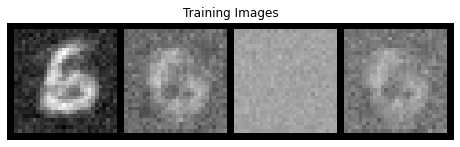

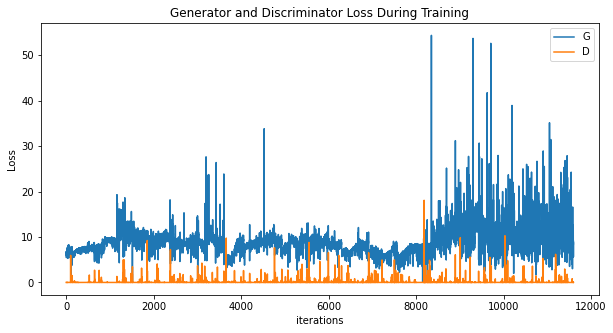

[0/3][11610/30000]	Loss_D: 0.0010	Loss_G: 6.2516	D(x): 1.0000	D(G(z)): 0.0010 / 0.0032
tensor([ 5.2551, -3.0143], grad_fn=<SliceBackward>) tensor([-0.0044,  0.0097], grad_fn=<SliceBackward>)
tensor([ 0.1435, -0.2274], grad_fn=<SliceBackward>)
[0/3][11620/30000]	Loss_D: 0.0000	Loss_G: 10.7325	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.2786, -3.0109], grad_fn=<SliceBackward>) tensor([-0.0042,  0.0100], grad_fn=<SliceBackward>)
tensor([ 0.1415, -0.2316], grad_fn=<SliceBackward>)
[0/3][11630/30000]	Loss_D: 0.0935	Loss_G: 4.5951	D(x): 1.0000	D(G(z)): 0.0868 / 0.0431
tensor([ 5.2886, -3.0162], grad_fn=<SliceBackward>) tensor([-0.0047,  0.0095], grad_fn=<SliceBackward>)
tensor([ 0.1435, -0.2302], grad_fn=<SliceBackward>)
[0/3][11640/30000]	Loss_D: 0.0210	Loss_G: 12.1911	D(x): 1.0000	D(G(z)): 0.0207 / 0.0000
tensor([ 5.2920, -3.0081], grad_fn=<SliceBackward>) tensor([-0.0042,  0.0102], grad_fn=<SliceBackward>)
tensor([ 0.1432, -0.2314], grad_fn=<SliceBackward>)
[0/3][11650/30000]	Loss_D:

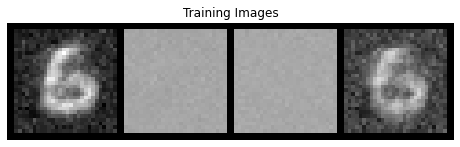

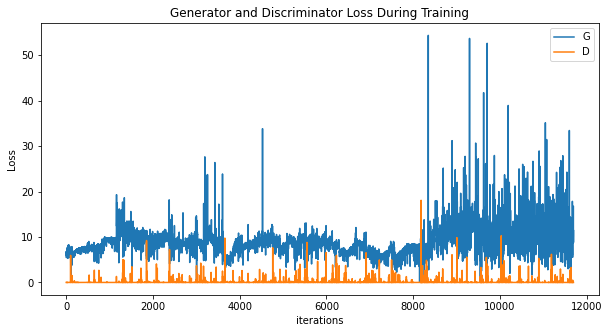

[0/3][11710/30000]	Loss_D: 0.0004	Loss_G: 8.2804	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
tensor([ 5.3403, -2.9840], grad_fn=<SliceBackward>) tensor([-0.0052,  0.0090], grad_fn=<SliceBackward>)
tensor([ 0.1436, -0.2353], grad_fn=<SliceBackward>)
[0/3][11720/30000]	Loss_D: 0.0016	Loss_G: 15.6666	D(x): 0.9999	D(G(z)): 0.0015 / 0.0000
tensor([ 5.3832, -2.9613], grad_fn=<SliceBackward>) tensor([-0.0062,  0.0080], grad_fn=<SliceBackward>)
tensor([ 0.1413, -0.2378], grad_fn=<SliceBackward>)
[0/3][11730/30000]	Loss_D: 0.0000	Loss_G: 10.7374	D(x): 1.0000	D(G(z)): 0.0000 / 0.0002
tensor([ 5.4021, -2.9484], grad_fn=<SliceBackward>) tensor([-0.0071,  0.0071], grad_fn=<SliceBackward>)
tensor([ 0.1380, -0.2414], grad_fn=<SliceBackward>)
[0/3][11740/30000]	Loss_D: 3.1185	Loss_G: 18.6557	D(x): 0.5010	D(G(z)): 0.0001 / 0.0002
tensor([ 5.4065, -2.9461], grad_fn=<SliceBackward>) tensor([-0.0071,  0.0070], grad_fn=<SliceBackward>)
tensor([ 0.1368, -0.2431], grad_fn=<SliceBackward>)
[0/3][11750/30000]	Loss_D

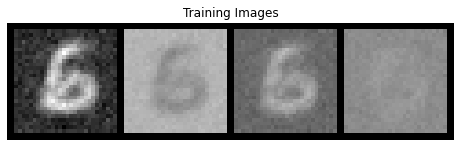

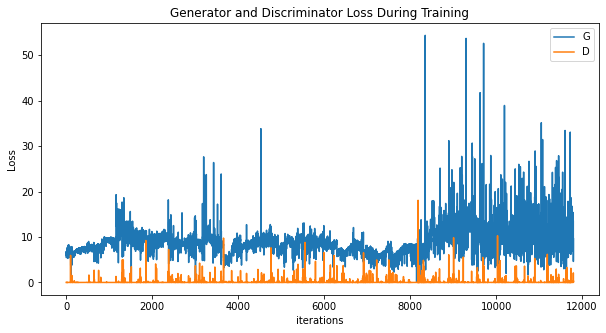

[0/3][11810/30000]	Loss_D: 0.0009	Loss_G: 6.6156	D(x): 0.9998	D(G(z)): 0.0007 / 0.0017
tensor([ 5.4070, -2.9398], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0072], grad_fn=<SliceBackward>)
tensor([ 0.1331, -0.2484], grad_fn=<SliceBackward>)
[0/3][11820/30000]	Loss_D: 0.0027	Loss_G: 14.0384	D(x): 1.0000	D(G(z)): 0.0027 / 0.0000
tensor([ 5.4067, -2.9401], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0072], grad_fn=<SliceBackward>)
tensor([ 0.1338, -0.2479], grad_fn=<SliceBackward>)
[0/3][11830/30000]	Loss_D: 0.0049	Loss_G: 11.3783	D(x): 1.0000	D(G(z)): 0.0049 / 0.0004
tensor([ 5.4081, -2.9406], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0072], grad_fn=<SliceBackward>)
tensor([ 0.1336, -0.2481], grad_fn=<SliceBackward>)
[0/3][11840/30000]	Loss_D: 0.0692	Loss_G: 7.6224	D(x): 0.9374	D(G(z)): 0.0023 / 0.0006
tensor([ 5.4081, -2.9407], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0072], grad_fn=<SliceBackward>)
tensor([ 0.1342, -0.2476], grad_fn=<SliceBackward>)
[0/3][11850/30000]	Loss_D:

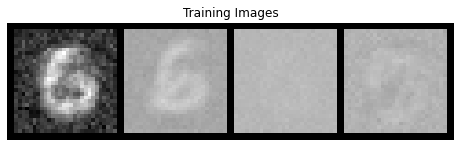

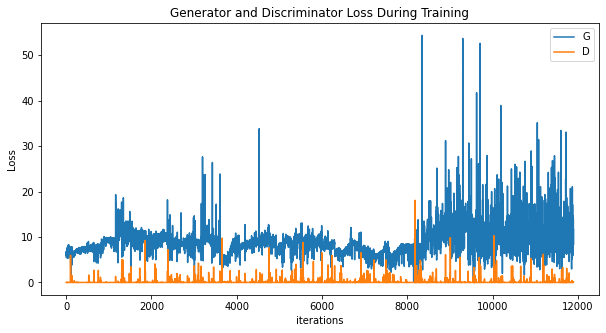

[0/3][11910/30000]	Loss_D: 0.0001	Loss_G: 8.5822	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
tensor([ 5.4355, -2.9385], grad_fn=<SliceBackward>) tensor([-0.0065,  0.0075], grad_fn=<SliceBackward>)
tensor([ 0.1272, -0.2568], grad_fn=<SliceBackward>)
[0/3][11920/30000]	Loss_D: 0.0009	Loss_G: 27.4160	D(x): 1.0000	D(G(z)): 0.0009 / 0.0000
tensor([ 5.4345, -2.9333], grad_fn=<SliceBackward>) tensor([-0.0069,  0.0070], grad_fn=<SliceBackward>)
tensor([ 0.1267, -0.2572], grad_fn=<SliceBackward>)
[0/3][11930/30000]	Loss_D: 0.0023	Loss_G: 10.9511	D(x): 1.0000	D(G(z)): 0.0022 / 0.0001
tensor([ 5.4329, -2.9275], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0071], grad_fn=<SliceBackward>)
tensor([ 0.1251, -0.2591], grad_fn=<SliceBackward>)
[0/3][11940/30000]	Loss_D: 0.0008	Loss_G: 9.4120	D(x): 1.0000	D(G(z)): 0.0008 / 0.0004
tensor([ 5.4319, -2.9240], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0072], grad_fn=<SliceBackward>)
tensor([ 0.1250, -0.2590], grad_fn=<SliceBackward>)
[0/3][11950/30000]	Loss_D:

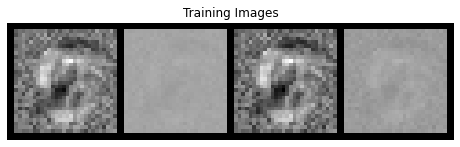

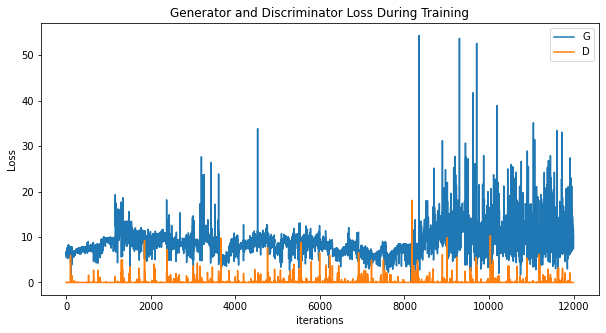

[0/3][12010/30000]	Loss_D: 0.0006	Loss_G: 13.2634	D(x): 0.9999	D(G(z)): 0.0006 / 0.0000
tensor([ 5.4382, -2.8900], grad_fn=<SliceBackward>) tensor([-0.0065,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1039, -0.2802], grad_fn=<SliceBackward>)
[0/3][12020/30000]	Loss_D: 0.0001	Loss_G: 7.5617	D(x): 1.0000	D(G(z)): 0.0001 / 0.0005
tensor([ 5.4404, -2.8839], grad_fn=<SliceBackward>) tensor([-0.0065,  0.0073], grad_fn=<SliceBackward>)
tensor([ 0.1038, -0.2813], grad_fn=<SliceBackward>)
[0/3][12030/30000]	Loss_D: 0.0131	Loss_G: 13.8157	D(x): 1.0000	D(G(z)): 0.0131 / 0.0000
tensor([ 5.4425, -2.8779], grad_fn=<SliceBackward>) tensor([-0.0065,  0.0074], grad_fn=<SliceBackward>)
tensor([ 0.1032, -0.2831], grad_fn=<SliceBackward>)
[0/3][12040/30000]	Loss_D: 0.0018	Loss_G: 10.5627	D(x): 1.0000	D(G(z)): 0.0018 / 0.0003
tensor([ 5.4385, -2.8761], grad_fn=<SliceBackward>) tensor([-0.0062,  0.0077], grad_fn=<SliceBackward>)
tensor([ 0.1031, -0.2829], grad_fn=<SliceBackward>)
[0/3][12050/30000]	Loss_D

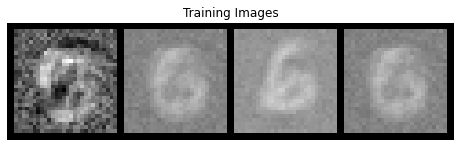

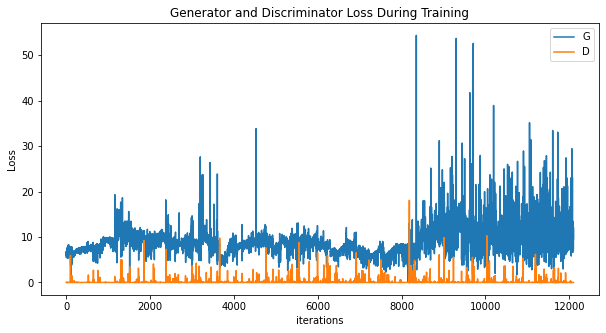

[0/3][12110/30000]	Loss_D: 0.0020	Loss_G: 13.2626	D(x): 1.0000	D(G(z)): 0.0020 / 0.0000
tensor([ 5.4468, -2.8656], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0080], grad_fn=<SliceBackward>)
tensor([ 0.0943, -0.2962], grad_fn=<SliceBackward>)
[0/3][12120/30000]	Loss_D: 0.0000	Loss_G: 16.2278	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.4767, -2.8418], grad_fn=<SliceBackward>) tensor([-0.0058,  0.0081], grad_fn=<SliceBackward>)
tensor([ 0.0968, -0.2945], grad_fn=<SliceBackward>)
[0/3][12130/30000]	Loss_D: 0.0001	Loss_G: 15.6828	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.4780, -2.8348], grad_fn=<SliceBackward>) tensor([-0.0058,  0.0081], grad_fn=<SliceBackward>)
tensor([ 0.0967, -0.2949], grad_fn=<SliceBackward>)
[0/3][12140/30000]	Loss_D: 0.0116	Loss_G: 15.3359	D(x): 1.0000	D(G(z)): 0.0115 / 0.0000
tensor([ 5.4782, -2.8353], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0034], grad_fn=<SliceBackward>)
tensor([ 0.0962, -0.2965], grad_fn=<SliceBackward>)
[0/3][12150/30000]	Loss_

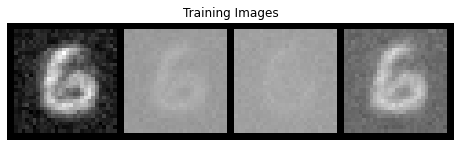

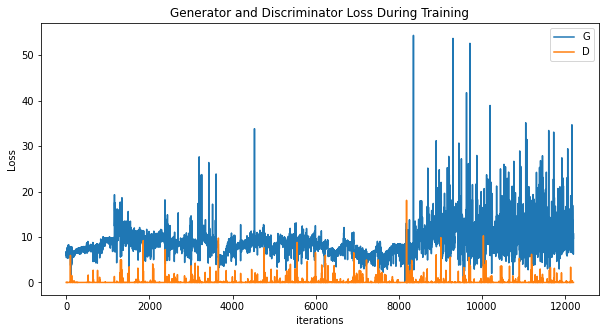

[0/3][12210/30000]	Loss_D: 0.0031	Loss_G: 10.6110	D(x): 0.9998	D(G(z)): 0.0029 / 0.0001
tensor([ 5.4839, -2.8274], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.0718, -0.3160], grad_fn=<SliceBackward>)
[0/3][12220/30000]	Loss_D: 0.0219	Loss_G: 10.0292	D(x): 1.0000	D(G(z)): 0.0215 / 0.0004
tensor([ 5.4989, -2.8055], grad_fn=<SliceBackward>) tensor([-0.0083,  0.0056], grad_fn=<SliceBackward>)
tensor([ 0.0701, -0.3167], grad_fn=<SliceBackward>)
[0/3][12230/30000]	Loss_D: 0.0008	Loss_G: 8.6832	D(x): 1.0000	D(G(z)): 0.0008 / 0.0002
tensor([ 5.5149, -2.7801], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.0691, -0.3169], grad_fn=<SliceBackward>)
[0/3][12240/30000]	Loss_D: 0.0029	Loss_G: 9.8920	D(x): 1.0000	D(G(z)): 0.0029 / 0.0003
tensor([ 5.5299, -2.7570], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.0682, -0.3177], grad_fn=<SliceBackward>)
[0/3][12250/30000]	Loss_D:

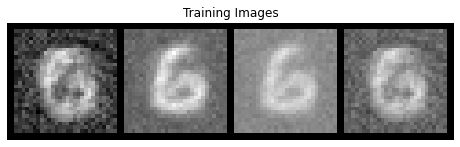

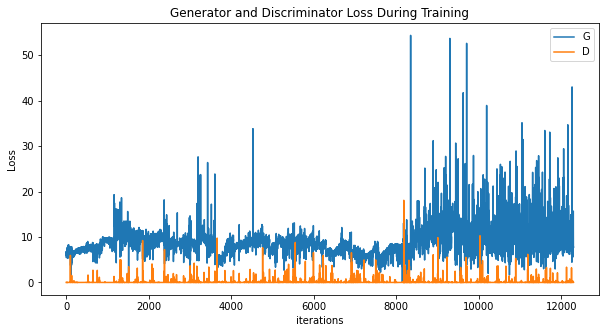

[0/3][12310/30000]	Loss_D: 0.0197	Loss_G: 9.0860	D(x): 1.0000	D(G(z)): 0.0194 / 0.0002
tensor([ 5.6016, -2.7112], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0708, -0.3093], grad_fn=<SliceBackward>)
[0/3][12320/30000]	Loss_D: 0.0004	Loss_G: 9.0427	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 5.6197, -2.6918], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0690, -0.3094], grad_fn=<SliceBackward>)
[0/3][12330/30000]	Loss_D: 0.0002	Loss_G: 12.1489	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 5.6240, -2.6758], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0733, -0.3025], grad_fn=<SliceBackward>)
[0/3][12340/30000]	Loss_D: 0.0002	Loss_G: 7.5475	D(x): 1.0000	D(G(z)): 0.0002 / 0.0058
tensor([ 5.6271, -2.6630], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([ 0.0704, -0.3008], grad_fn=<SliceBackward>)
[0/3][12350/30000]	Loss_D: 

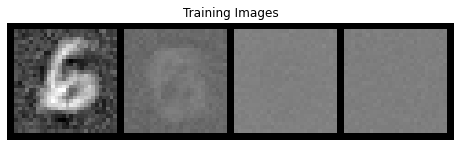

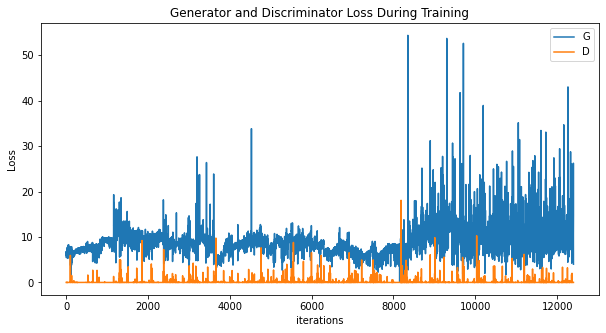

[0/3][12410/30000]	Loss_D: 0.0024	Loss_G: 6.1411	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
tensor([ 5.6776, -2.5973], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0672, -0.2932], grad_fn=<SliceBackward>)
[0/3][12420/30000]	Loss_D: 0.0019	Loss_G: 5.8923	D(x): 1.0000	D(G(z)): 0.0019 / 0.0029
tensor([ 5.6782, -2.5955], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0644, -0.2962], grad_fn=<SliceBackward>)
[0/3][12430/30000]	Loss_D: 0.0057	Loss_G: 7.1792	D(x): 1.0000	D(G(z)): 0.0056 / 0.0008
tensor([ 5.6786, -2.5941], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0612, -0.2982], grad_fn=<SliceBackward>)
[0/3][12440/30000]	Loss_D: 0.0024	Loss_G: 18.8797	D(x): 1.0000	D(G(z)): 0.0024 / 0.0000
tensor([ 5.6813, -2.5930], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0062], grad_fn=<SliceBackward>)
tensor([ 0.0577, -0.2999], grad_fn=<SliceBackward>)
[0/3][12450/30000]	Loss_D: 

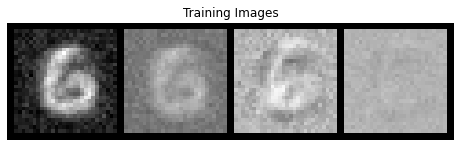

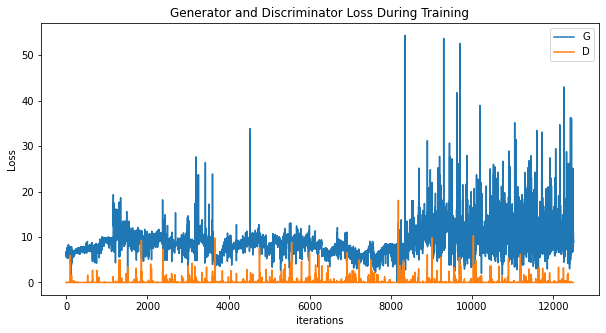

[0/3][12510/30000]	Loss_D: 0.0022	Loss_G: 10.0419	D(x): 1.0000	D(G(z)): 0.0022 / 0.0003
tensor([ 5.6829, -2.5907], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0483, -0.3061], grad_fn=<SliceBackward>)
[0/3][12520/30000]	Loss_D: 0.0021	Loss_G: 8.0915	D(x): 1.0000	D(G(z)): 0.0021 / 0.0008
tensor([ 5.6830, -2.5906], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0459, -0.3075], grad_fn=<SliceBackward>)
[0/3][12530/30000]	Loss_D: 0.0018	Loss_G: 7.8582	D(x): 1.0000	D(G(z)): 0.0018 / 0.0004
tensor([ 5.6831, -2.5905], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0417, -0.3110], grad_fn=<SliceBackward>)
[0/3][12540/30000]	Loss_D: 0.0021	Loss_G: 7.3504	D(x): 1.0000	D(G(z)): 0.0021 / 0.0007
tensor([ 5.6833, -2.5904], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.0419, -0.3102], grad_fn=<SliceBackward>)
[0/3][12550/30000]	Loss_D: 

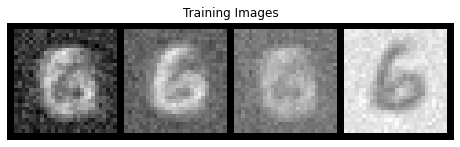

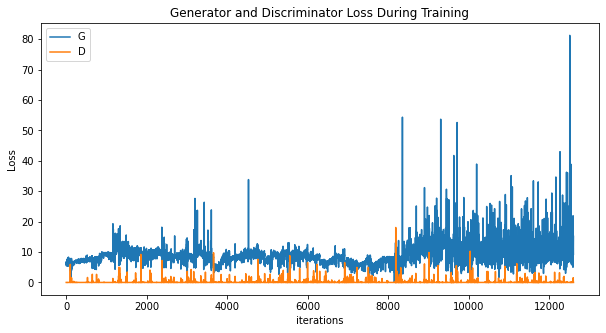

[0/3][12610/30000]	Loss_D: 0.0057	Loss_G: 8.9153	D(x): 1.0000	D(G(z)): 0.0057 / 0.0003
tensor([ 5.6917, -2.5527], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0046], grad_fn=<SliceBackward>)
tensor([ 0.0195, -0.3324], grad_fn=<SliceBackward>)
[0/3][12620/30000]	Loss_D: 0.0045	Loss_G: 6.2034	D(x): 1.0000	D(G(z)): 0.0044 / 0.1476
tensor([ 5.6893, -2.5481], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0052], grad_fn=<SliceBackward>)
tensor([ 0.0163, -0.3324], grad_fn=<SliceBackward>)
[0/3][12630/30000]	Loss_D: 0.0444	Loss_G: 11.8950	D(x): 1.0000	D(G(z)): 0.0428 / 0.0000
tensor([ 5.7026, -2.5421], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0054], grad_fn=<SliceBackward>)
tensor([ 0.0128, -0.3345], grad_fn=<SliceBackward>)
[0/3][12640/30000]	Loss_D: 0.0003	Loss_G: 10.9039	D(x): 1.0000	D(G(z)): 0.0003 / 0.0000
tensor([ 5.7217, -2.5226], grad_fn=<SliceBackward>) tensor([-0.0084,  0.0054], grad_fn=<SliceBackward>)
tensor([ 0.0137, -0.3338], grad_fn=<SliceBackward>)
[0/3][12650/30000]	Loss_D:

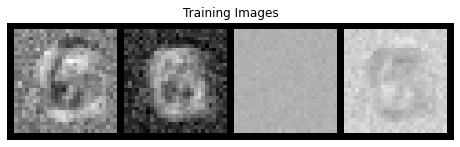

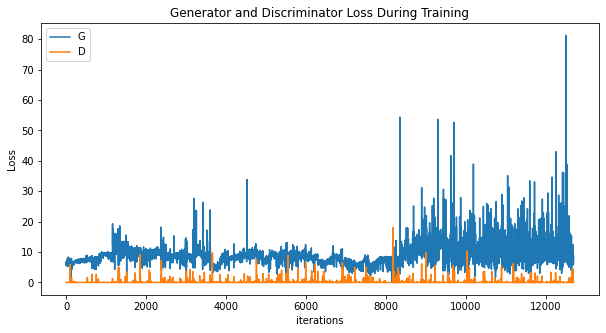

[0/3][12710/30000]	Loss_D: 0.0044	Loss_G: 13.4992	D(x): 1.0000	D(G(z)): 0.0043 / 0.0001
tensor([ 5.8146, -2.4429], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0050], grad_fn=<SliceBackward>)
tensor([ 0.0127, -0.3290], grad_fn=<SliceBackward>)
[0/3][12720/30000]	Loss_D: 0.0021	Loss_G: 10.4476	D(x): 1.0000	D(G(z)): 0.0021 / 0.0001
tensor([ 5.8254, -2.4300], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0053], grad_fn=<SliceBackward>)
tensor([ 0.0141, -0.3240], grad_fn=<SliceBackward>)
[0/3][12730/30000]	Loss_D: 0.0035	Loss_G: 9.3957	D(x): 0.9977	D(G(z)): 0.0013 / 0.0001
tensor([ 5.8328, -2.4154], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0053], grad_fn=<SliceBackward>)
tensor([ 0.0130, -0.3249], grad_fn=<SliceBackward>)
[0/3][12740/30000]	Loss_D: 0.0020	Loss_G: 9.3204	D(x): 1.0000	D(G(z)): 0.0020 / 0.0002
tensor([ 5.8454, -2.4015], grad_fn=<SliceBackward>) tensor([-0.0089,  0.0050], grad_fn=<SliceBackward>)
tensor([ 0.0142, -0.3234], grad_fn=<SliceBackward>)
[0/3][12750/30000]	Loss_D:

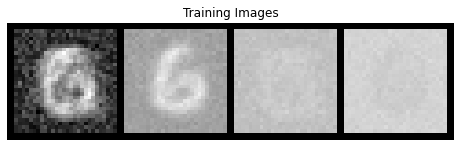

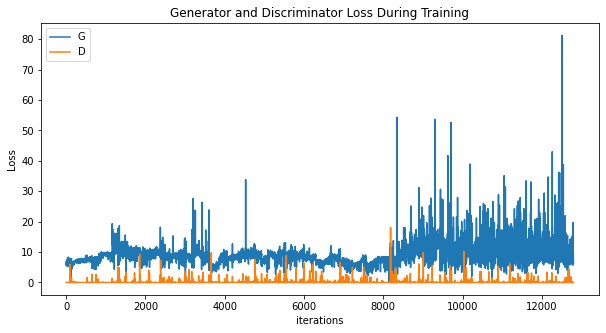

[0/3][12810/30000]	Loss_D: 0.0012	Loss_G: 9.5083	D(x): 0.9999	D(G(z)): 0.0011 / 0.0001
tensor([ 5.8383, -2.4012], grad_fn=<SliceBackward>) tensor([-0.0104,  0.0035], grad_fn=<SliceBackward>)
tensor([ 0.0183, -0.3201], grad_fn=<SliceBackward>)
[0/3][12820/30000]	Loss_D: 0.0035	Loss_G: 6.2940	D(x): 1.0000	D(G(z)): 0.0035 / 0.0018
tensor([ 5.8375, -2.4015], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0036], grad_fn=<SliceBackward>)
tensor([ 0.0169, -0.3198], grad_fn=<SliceBackward>)
[0/3][12830/30000]	Loss_D: 0.0023	Loss_G: 10.0856	D(x): 1.0000	D(G(z)): 0.0023 / 0.0000
tensor([ 5.8372, -2.4017], grad_fn=<SliceBackward>) tensor([-0.0103,  0.0036], grad_fn=<SliceBackward>)
tensor([ 0.0191, -0.3175], grad_fn=<SliceBackward>)
[0/3][12840/30000]	Loss_D: 0.0114	Loss_G: 8.2431	D(x): 1.0000	D(G(z)): 0.0113 / 0.0037
tensor([ 5.8392, -2.4007], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0037], grad_fn=<SliceBackward>)
tensor([ 0.0185, -0.3163], grad_fn=<SliceBackward>)
[0/3][12850/30000]	Loss_D: 

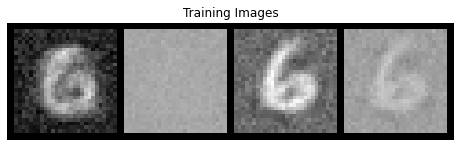

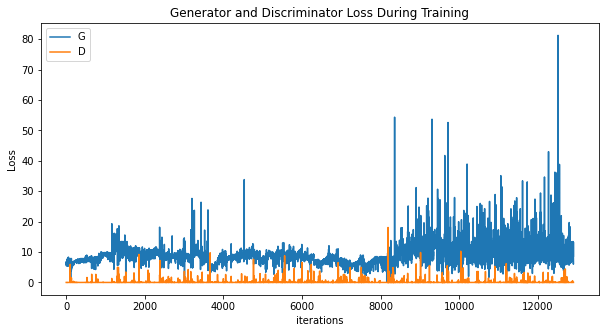

[0/3][12910/30000]	Loss_D: 0.0065	Loss_G: 8.1449	D(x): 1.0000	D(G(z)): 0.0065 / 0.0028
tensor([ 5.9403, -2.2741], grad_fn=<SliceBackward>) tensor([-0.0113,  0.0025], grad_fn=<SliceBackward>)
tensor([ 0.0339, -0.2866], grad_fn=<SliceBackward>)
[0/3][12920/30000]	Loss_D: 0.0038	Loss_G: 8.7153	D(x): 1.0000	D(G(z)): 0.0038 / 0.0009
tensor([ 5.9423, -2.2747], grad_fn=<SliceBackward>) tensor([-0.0111,  0.0027], grad_fn=<SliceBackward>)
tensor([ 0.0359, -0.2814], grad_fn=<SliceBackward>)
[0/3][12930/30000]	Loss_D: 0.0001	Loss_G: 9.2220	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.9613, -2.2637], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0038], grad_fn=<SliceBackward>)
tensor([ 0.0362, -0.2792], grad_fn=<SliceBackward>)
[0/3][12940/30000]	Loss_D: 0.0000	Loss_G: 10.7157	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.9899, -2.2275], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0039], grad_fn=<SliceBackward>)
tensor([ 0.0427, -0.2544], grad_fn=<SliceBackward>)
[0/3][12950/30000]	Loss_D: 

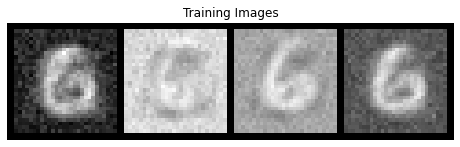

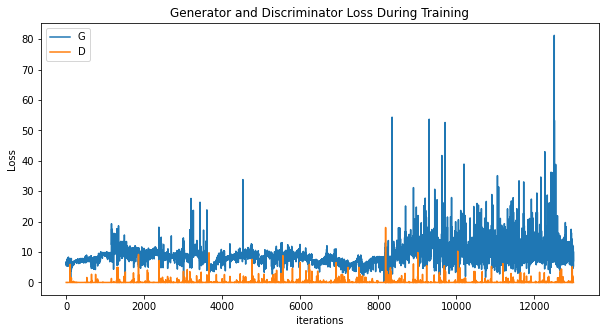

[0/3][13010/30000]	Loss_D: 0.0119	Loss_G: 9.6733	D(x): 1.0000	D(G(z)): 0.0118 / 0.0002
tensor([ 6.0459, -2.1589], grad_fn=<SliceBackward>) tensor([-0.0085,  0.0054], grad_fn=<SliceBackward>)
tensor([ 0.0554, -0.2250], grad_fn=<SliceBackward>)
[0/3][13020/30000]	Loss_D: 0.0008	Loss_G: 9.3008	D(x): 1.0000	D(G(z)): 0.0008 / 0.0001
tensor([ 6.0622, -2.1362], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0057], grad_fn=<SliceBackward>)
tensor([ 0.0650, -0.2188], grad_fn=<SliceBackward>)
[0/3][13030/30000]	Loss_D: 0.0786	Loss_G: 4.9342	D(x): 0.9280	D(G(z)): 0.0009 / 0.0641
tensor([ 6.0725, -2.1159], grad_fn=<SliceBackward>) tensor([-0.0086,  0.0053], grad_fn=<SliceBackward>)
tensor([ 0.0715, -0.2120], grad_fn=<SliceBackward>)
[0/3][13040/30000]	Loss_D: 0.0340	Loss_G: 21.7519	D(x): 0.9701	D(G(z)): 0.0032 / 0.0000
tensor([ 6.0747, -2.1095], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0052], grad_fn=<SliceBackward>)
tensor([ 0.0806, -0.2005], grad_fn=<SliceBackward>)
[0/3][13050/30000]	Loss_D: 

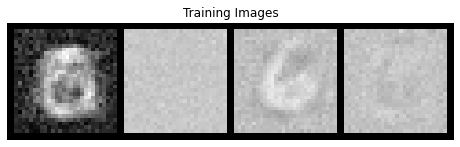

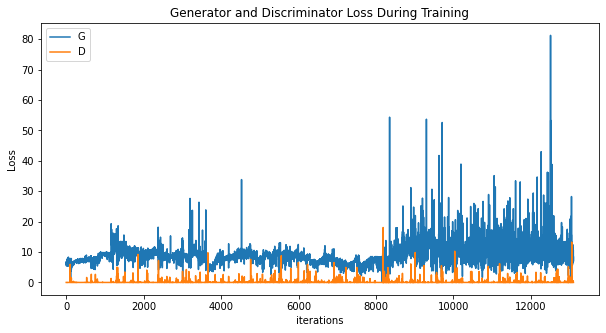

[0/3][13110/30000]	Loss_D: 0.0066	Loss_G: 9.3727	D(x): 1.0000	D(G(z)): 0.0066 / 0.0001
tensor([ 6.0807, -2.0578], grad_fn=<SliceBackward>) tensor([-0.0081,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.0901, -0.1661], grad_fn=<SliceBackward>)
[0/3][13120/30000]	Loss_D: 0.0077	Loss_G: 8.4409	D(x): 1.0000	D(G(z)): 0.0077 / 0.0004
tensor([ 6.0822, -2.0464], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.1001, -0.1561], grad_fn=<SliceBackward>)
[0/3][13130/30000]	Loss_D: 0.0033	Loss_G: 8.0693	D(x): 1.0000	D(G(z)): 0.0033 / 0.0003
tensor([ 6.0822, -2.0344], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.1022, -0.1536], grad_fn=<SliceBackward>)
[0/3][13140/30000]	Loss_D: 0.0034	Loss_G: 6.2380	D(x): 1.0000	D(G(z)): 0.0034 / 0.0044
tensor([ 6.0822, -2.0246], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0058], grad_fn=<SliceBackward>)
tensor([ 0.1114, -0.1449], grad_fn=<SliceBackward>)
[0/3][13150/30000]	Loss_D: 0

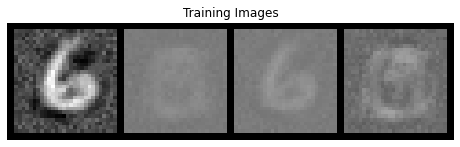

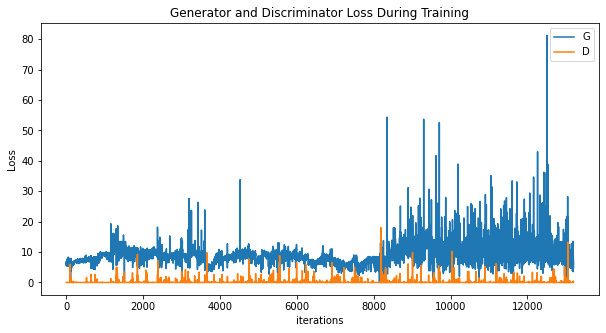

[0/3][13210/30000]	Loss_D: 0.0035	Loss_G: 8.5400	D(x): 1.0000	D(G(z)): 0.0035 / 0.0005
tensor([ 6.0789, -1.9802], grad_fn=<SliceBackward>) tensor([-0.0082,  0.0057], grad_fn=<SliceBackward>)
tensor([ 0.1264, -0.1230], grad_fn=<SliceBackward>)
[0/3][13220/30000]	Loss_D: 1.2100	Loss_G: 7.9768	D(x): 0.5446	D(G(z)): 0.0014 / 0.0008
tensor([ 6.0835, -1.9740], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0071], grad_fn=<SliceBackward>)
tensor([ 0.1338, -0.1185], grad_fn=<SliceBackward>)
[0/3][13230/30000]	Loss_D: 0.0873	Loss_G: 6.6481	D(x): 1.0000	D(G(z)): 0.0817 / 0.0705
tensor([ 6.0870, -1.9748], grad_fn=<SliceBackward>) tensor([-0.0071,  0.0068], grad_fn=<SliceBackward>)
tensor([ 0.1311, -0.1189], grad_fn=<SliceBackward>)
[0/3][13240/30000]	Loss_D: 0.0218	Loss_G: 3.8566	D(x): 1.0000	D(G(z)): 0.0214 / 0.0464
tensor([ 6.0881, -1.9743], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0068], grad_fn=<SliceBackward>)
tensor([ 0.1276, -0.1162], grad_fn=<SliceBackward>)
[0/3][13250/30000]	Loss_D: 0

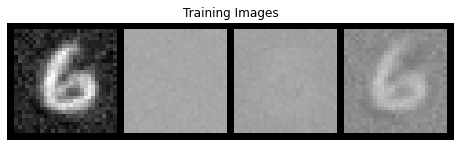

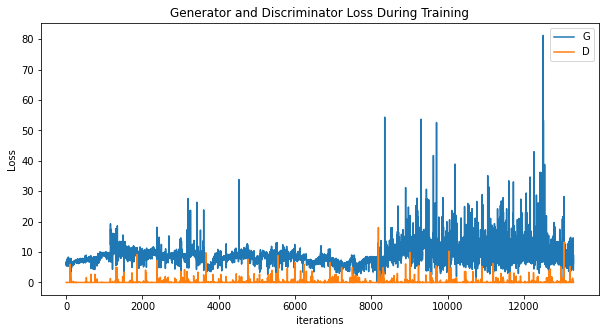

[0/3][13310/30000]	Loss_D: 0.0013	Loss_G: 5.7227	D(x): 1.0000	D(G(z)): 0.0013 / 0.0043
tensor([ 6.0920, -1.9456], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.1430, -0.0893], grad_fn=<SliceBackward>)
[0/3][13320/30000]	Loss_D: 0.0049	Loss_G: 5.0263	D(x): 1.0000	D(G(z)): 0.0048 / 0.0066
tensor([ 6.0933, -1.9461], grad_fn=<SliceBackward>) tensor([-0.0078,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.1428, -0.0883], grad_fn=<SliceBackward>)
[0/3][13330/30000]	Loss_D: 0.0237	Loss_G: 10.2489	D(x): 1.0000	D(G(z)): 0.0234 / 0.0011
tensor([ 6.0972, -1.9468], grad_fn=<SliceBackward>) tensor([-0.0078,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.1447, -0.0867], grad_fn=<SliceBackward>)
[0/3][13340/30000]	Loss_D: 0.0036	Loss_G: 9.1393	D(x): 0.9991	D(G(z)): 0.0027 / 0.0001
tensor([ 6.1131, -1.9404], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0065], grad_fn=<SliceBackward>)
tensor([ 0.1445, -0.0788], grad_fn=<SliceBackward>)
[0/3][13350/30000]	Loss_D: 

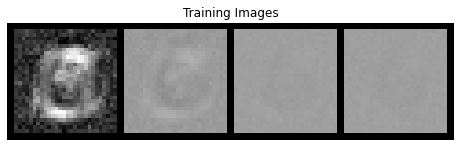

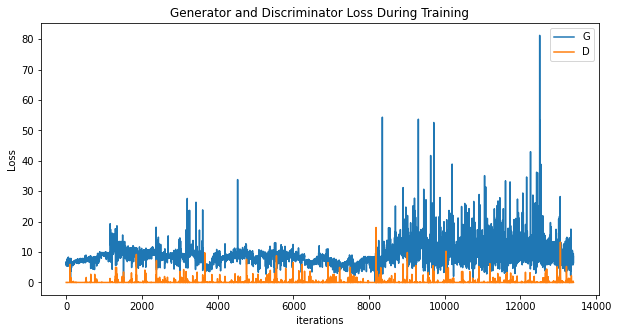

[0/3][13410/30000]	Loss_D: 0.0275	Loss_G: 8.1276	D(x): 0.9739	D(G(z)): 0.0006 / 0.0005
tensor([ 6.1277, -1.9124], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.1600, -0.0597], grad_fn=<SliceBackward>)
[0/3][13420/30000]	Loss_D: 0.0067	Loss_G: 7.5207	D(x): 1.0000	D(G(z)): 0.0067 / 0.0006
tensor([ 6.1364, -1.9024], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0062], grad_fn=<SliceBackward>)
tensor([ 0.1596, -0.0590], grad_fn=<SliceBackward>)
[0/3][13430/30000]	Loss_D: 0.0003	Loss_G: 8.2321	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
tensor([ 6.1447, -1.8928], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([ 0.1580, -0.0580], grad_fn=<SliceBackward>)
[0/3][13440/30000]	Loss_D: 0.0706	Loss_G: 11.4943	D(x): 1.0000	D(G(z)): 0.0659 / 0.0001
tensor([ 6.1536, -1.8845], grad_fn=<SliceBackward>) tensor([-0.0078,  0.0061], grad_fn=<SliceBackward>)
tensor([ 0.1586, -0.0541], grad_fn=<SliceBackward>)
[0/3][13450/30000]	Loss_D: 

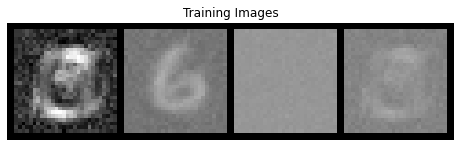

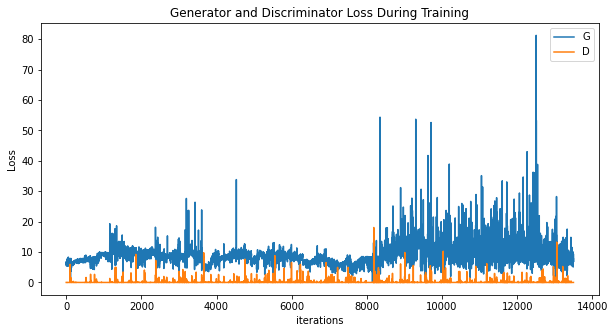

[0/3][13510/30000]	Loss_D: 0.0022	Loss_G: 6.2104	D(x): 1.0000	D(G(z)): 0.0022 / 0.0021
tensor([ 6.1808, -1.8506], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.1682, -0.0338], grad_fn=<SliceBackward>)
[0/3][13520/30000]	Loss_D: 0.0033	Loss_G: 7.5721	D(x): 1.0000	D(G(z)): 0.0033 / 0.0006
tensor([ 6.1809, -1.8507], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.1677, -0.0340], grad_fn=<SliceBackward>)
[0/3][13530/30000]	Loss_D: 0.0046	Loss_G: 8.2388	D(x): 1.0000	D(G(z)): 0.0046 / 0.0006
tensor([ 6.1811, -1.8509], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.1702, -0.0320], grad_fn=<SliceBackward>)
[0/3][13540/30000]	Loss_D: 0.0030	Loss_G: 6.3117	D(x): 1.0000	D(G(z)): 0.0030 / 0.0025
tensor([ 6.1813, -1.8512], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0060], grad_fn=<SliceBackward>)
tensor([ 0.1706, -0.0308], grad_fn=<SliceBackward>)
[0/3][13550/30000]	Loss_D: 0

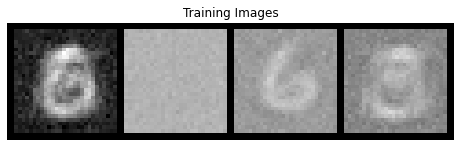

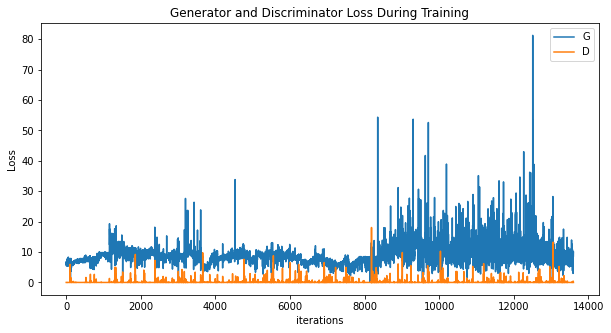

[0/3][13610/30000]	Loss_D: 0.0001	Loss_G: 9.3248	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 6.2297, -1.7880], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([0.1571, 0.0010], grad_fn=<SliceBackward>)
[0/3][13620/30000]	Loss_D: 0.0000	Loss_G: 8.4814	D(x): 1.0000	D(G(z)): 0.0000 / 0.0002
tensor([ 6.2299, -1.7700], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([0.1570, 0.0018], grad_fn=<SliceBackward>)
[0/3][13630/30000]	Loss_D: 0.0000	Loss_G: 10.1694	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.2273, -1.7654], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([0.1531, 0.0012], grad_fn=<SliceBackward>)
[0/3][13640/30000]	Loss_D: 0.0004	Loss_G: 8.4879	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 6.2249, -1.7634], grad_fn=<SliceBackward>) tensor([-0.0076,  0.0063], grad_fn=<SliceBackward>)
tensor([0.1512, 0.0015], grad_fn=<SliceBackward>)
[0/3][13650/30000]	Loss_D: 0.0001	L

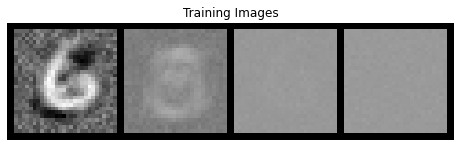

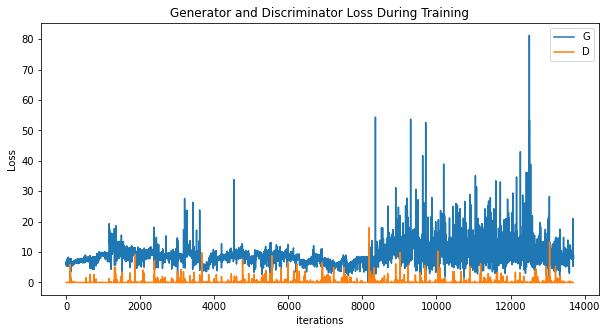

[0/3][13710/30000]	Loss_D: 0.0003	Loss_G: 8.3498	D(x): 1.0000	D(G(z)): 0.0003 / 0.0005
tensor([ 6.2116, -1.7595], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0062], grad_fn=<SliceBackward>)
tensor([0.1463, 0.0058], grad_fn=<SliceBackward>)
[0/3][13720/30000]	Loss_D: 0.0010	Loss_G: 9.5962	D(x): 1.0000	D(G(z)): 0.0010 / 0.0001
tensor([ 6.2096, -1.7593], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0062], grad_fn=<SliceBackward>)
tensor([0.1468, 0.0056], grad_fn=<SliceBackward>)
[0/3][13730/30000]	Loss_D: 0.0011	Loss_G: 7.7571	D(x): 1.0000	D(G(z)): 0.0011 / 0.0004
tensor([ 6.2075, -1.7591], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0062], grad_fn=<SliceBackward>)
tensor([0.1476, 0.0057], grad_fn=<SliceBackward>)
[0/3][13740/30000]	Loss_D: 0.0004	Loss_G: 8.4993	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 6.2049, -1.7588], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0062], grad_fn=<SliceBackward>)
tensor([0.1452, 0.0066], grad_fn=<SliceBackward>)
[0/3][13750/30000]	Loss_D: 0.0008	Lo

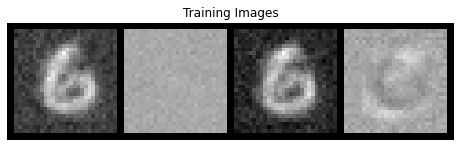

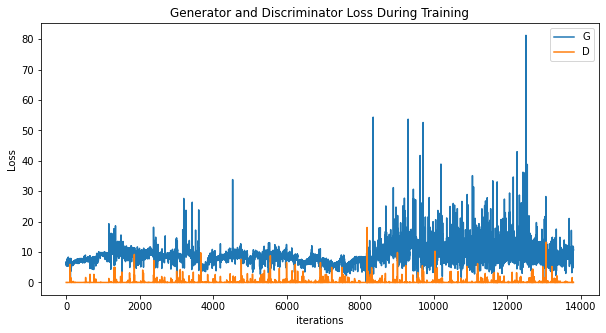

[0/3][13810/30000]	Loss_D: 0.0002	Loss_G: 10.1314	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 6.2503, -1.7076], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([0.1382, 0.0057], grad_fn=<SliceBackward>)
[0/3][13820/30000]	Loss_D: 0.0000	Loss_G: 10.2926	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.2497, -1.7073], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([0.1350, 0.0052], grad_fn=<SliceBackward>)
[0/3][13830/30000]	Loss_D: 0.0043	Loss_G: 6.3673	D(x): 1.0000	D(G(z)): 0.0043 / 0.0025
tensor([ 6.2496, -1.7073], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([0.1337, 0.0052], grad_fn=<SliceBackward>)
[0/3][13840/30000]	Loss_D: 0.0104	Loss_G: 5.7568	D(x): 1.0000	D(G(z)): 0.0103 / 0.0032
tensor([ 6.2500, -1.7075], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0059], grad_fn=<SliceBackward>)
tensor([0.1329, 0.0043], grad_fn=<SliceBackward>)
[0/3][13850/30000]	Loss_D: 0.0045	

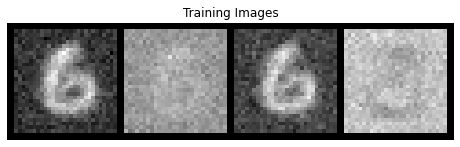

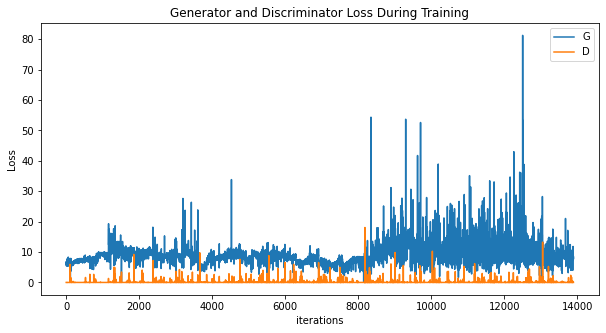

[0/3][13910/30000]	Loss_D: 0.0004	Loss_G: 7.4402	D(x): 1.0000	D(G(z)): 0.0004 / 0.0009
tensor([ 6.2909, -1.6475], grad_fn=<SliceBackward>) tensor([-0.0117,  0.0021], grad_fn=<SliceBackward>)
tensor([0.1441, 0.0152], grad_fn=<SliceBackward>)
[0/3][13920/30000]	Loss_D: 0.0147	Loss_G: 5.8238	D(x): 1.0000	D(G(z)): 0.0146 / 0.0093
tensor([ 6.2904, -1.6480], grad_fn=<SliceBackward>) tensor([-0.0121,  0.0017], grad_fn=<SliceBackward>)
tensor([0.1460, 0.0212], grad_fn=<SliceBackward>)
[0/3][13930/30000]	Loss_D: 0.0012	Loss_G: 8.5532	D(x): 1.0000	D(G(z)): 0.0012 / 0.0002
tensor([ 6.2890, -1.6486], grad_fn=<SliceBackward>) tensor([-0.0117,  0.0021], grad_fn=<SliceBackward>)
tensor([0.1457, 0.0263], grad_fn=<SliceBackward>)
[0/3][13940/30000]	Loss_D: 0.0025	Loss_G: 8.8046	D(x): 1.0000	D(G(z)): 0.0025 / 0.0002
tensor([ 6.2887, -1.6485], grad_fn=<SliceBackward>) tensor([-0.0117,  0.0021], grad_fn=<SliceBackward>)
tensor([0.1429, 0.0269], grad_fn=<SliceBackward>)
[0/3][13950/30000]	Loss_D: 0.0037	Lo

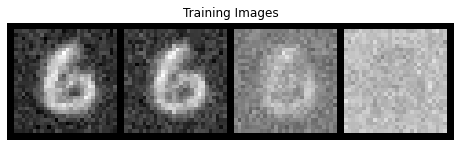

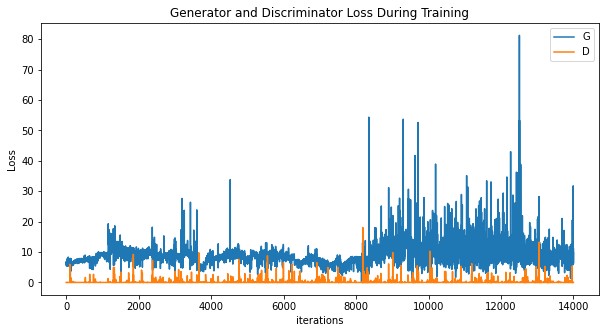

[0/3][14010/30000]	Loss_D: 0.0131	Loss_G: 8.8979	D(x): 1.0000	D(G(z)): 0.0129 / 0.0009
tensor([ 6.3084, -1.6412], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0038], grad_fn=<SliceBackward>)
tensor([0.1528, 0.0478], grad_fn=<SliceBackward>)
[0/3][14020/30000]	Loss_D: 0.0179	Loss_G: 4.4063	D(x): 1.0000	D(G(z)): 0.0177 / 0.0146
tensor([ 6.3079, -1.6408], grad_fn=<SliceBackward>) tensor([-0.0101,  0.0038], grad_fn=<SliceBackward>)
tensor([0.1539, 0.0488], grad_fn=<SliceBackward>)
[0/3][14030/30000]	Loss_D: 0.0602	Loss_G: 5.0723	D(x): 0.9986	D(G(z)): 0.0560 / 0.0067
tensor([ 6.3074, -1.6405], grad_fn=<SliceBackward>) tensor([-0.0100,  0.0039], grad_fn=<SliceBackward>)
tensor([0.1514, 0.0520], grad_fn=<SliceBackward>)
[0/3][14040/30000]	Loss_D: 0.0466	Loss_G: 12.2397	D(x): 1.0000	D(G(z)): 0.0446 / 0.0004
tensor([ 6.3130, -1.6406], grad_fn=<SliceBackward>) tensor([-0.0097,  0.0042], grad_fn=<SliceBackward>)
tensor([0.1568, 0.0541], grad_fn=<SliceBackward>)
[0/3][14050/30000]	Loss_D: 0.0002	L

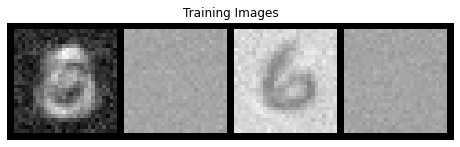

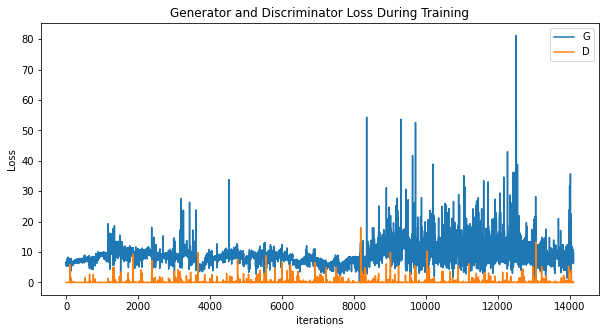

[0/3][14110/30000]	Loss_D: 0.0010	Loss_G: 7.7012	D(x): 1.0000	D(G(z)): 0.0010 / 0.0006
tensor([ 6.3266, -1.6105], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.1737, 0.0753], grad_fn=<SliceBackward>)
[0/3][14120/30000]	Loss_D: 0.0017	Loss_G: 6.7202	D(x): 1.0000	D(G(z)): 0.0017 / 0.0013
tensor([ 6.3295, -1.6051], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.1723, 0.0770], grad_fn=<SliceBackward>)
[0/3][14130/30000]	Loss_D: 0.0007	Loss_G: 8.1666	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
tensor([ 6.3323, -1.5999], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.1737, 0.0811], grad_fn=<SliceBackward>)
[0/3][14140/30000]	Loss_D: 0.0004	Loss_G: 12.6685	D(x): 1.0000	D(G(z)): 0.0004 / 0.0009
tensor([ 6.3374, -1.5932], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0032], grad_fn=<SliceBackward>)
tensor([0.1820, 0.0931], grad_fn=<SliceBackward>)
[0/3][14150/30000]	Loss_D: 0.0012	L

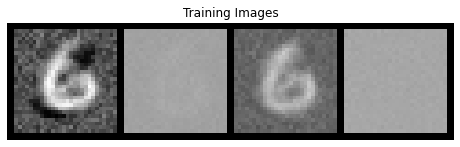

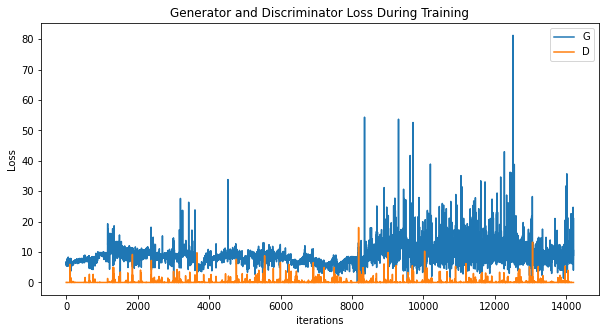

[0/3][14210/30000]	Loss_D: 0.0006	Loss_G: 10.9824	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 6.3465, -1.5359], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.2189, 0.1363], grad_fn=<SliceBackward>)
[0/3][14220/30000]	Loss_D: 0.0002	Loss_G: 8.3944	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 6.3434, -1.5299], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.2214, 0.1383], grad_fn=<SliceBackward>)
[0/3][14230/30000]	Loss_D: 0.0018	Loss_G: 10.3108	D(x): 1.0000	D(G(z)): 0.0018 / 0.0003
tensor([ 6.3391, -1.5267], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.2259, 0.1454], grad_fn=<SliceBackward>)
[0/3][14240/30000]	Loss_D: 0.0047	Loss_G: 10.6961	D(x): 1.0000	D(G(z)): 0.0047 / 0.0012
tensor([ 6.3338, -1.5260], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0031], grad_fn=<SliceBackward>)
tensor([0.2246, 0.1474], grad_fn=<SliceBackward>)
[0/3][14250/30000]	Loss_D: 4.3044

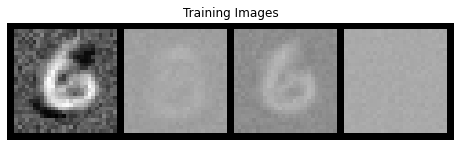

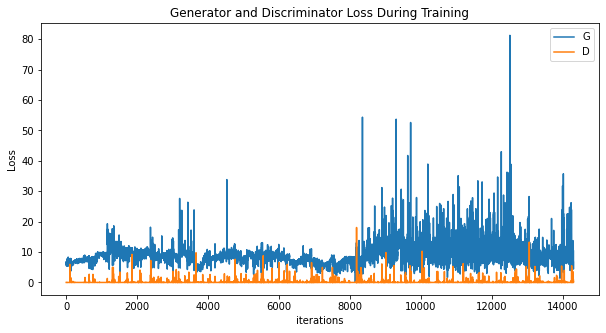

[0/3][14310/30000]	Loss_D: 0.0066	Loss_G: 9.0825	D(x): 1.0000	D(G(z)): 0.0066 / 0.0081
tensor([ 6.3227, -1.5241], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0046], grad_fn=<SliceBackward>)
tensor([0.2265, 0.1580], grad_fn=<SliceBackward>)
[0/3][14320/30000]	Loss_D: 0.0094	Loss_G: 6.5239	D(x): 1.0000	D(G(z)): 0.0093 / 0.0022
tensor([ 6.3245, -1.5260], grad_fn=<SliceBackward>) tensor([-0.0088,  0.0047], grad_fn=<SliceBackward>)
tensor([0.2345, 0.1660], grad_fn=<SliceBackward>)
[0/3][14330/30000]	Loss_D: 0.0077	Loss_G: 8.3524	D(x): 1.0000	D(G(z)): 0.0077 / 0.0007
tensor([ 6.3306, -1.5300], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0047], grad_fn=<SliceBackward>)
tensor([0.2437, 0.1756], grad_fn=<SliceBackward>)
[0/3][14340/30000]	Loss_D: 0.0227	Loss_G: 7.8248	D(x): 1.0000	D(G(z)): 0.0224 / 0.0005
tensor([ 6.3306, -1.5328], grad_fn=<SliceBackward>) tensor([-0.0087,  0.0047], grad_fn=<SliceBackward>)
tensor([0.2444, 0.1762], grad_fn=<SliceBackward>)
[0/3][14350/30000]	Loss_D: 0.0029	Lo

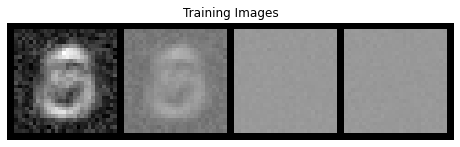

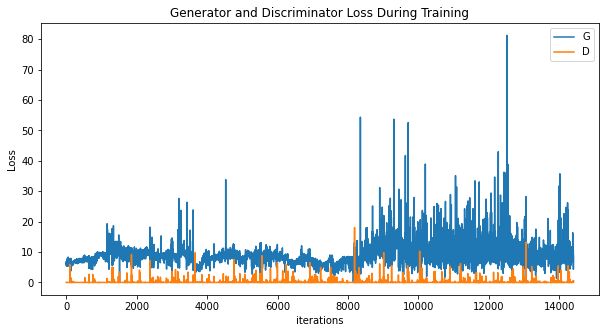

[0/3][14410/30000]	Loss_D: 0.0015	Loss_G: 11.1223	D(x): 1.0000	D(G(z)): 0.0015 / 0.0000
tensor([ 6.3017, -1.5552], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0039], grad_fn=<SliceBackward>)
tensor([0.2569, 0.1881], grad_fn=<SliceBackward>)
[0/3][14420/30000]	Loss_D: 0.0003	Loss_G: 8.6111	D(x): 0.9999	D(G(z)): 0.0003 / 0.0009
tensor([ 6.2985, -1.5585], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0039], grad_fn=<SliceBackward>)
tensor([0.2555, 0.1886], grad_fn=<SliceBackward>)
[0/3][14430/30000]	Loss_D: 0.0011	Loss_G: 9.3473	D(x): 1.0000	D(G(z)): 0.0011 / 0.0003
tensor([ 6.2955, -1.5616], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0039], grad_fn=<SliceBackward>)
tensor([0.2566, 0.1905], grad_fn=<SliceBackward>)
[0/3][14440/30000]	Loss_D: 0.0026	Loss_G: 7.3155	D(x): 1.0000	D(G(z)): 0.0026 / 0.0008
tensor([ 6.2933, -1.5638], grad_fn=<SliceBackward>) tensor([-0.0096,  0.0038], grad_fn=<SliceBackward>)
tensor([0.2551, 0.1893], grad_fn=<SliceBackward>)
[0/3][14450/30000]	Loss_D: 0.0007	L

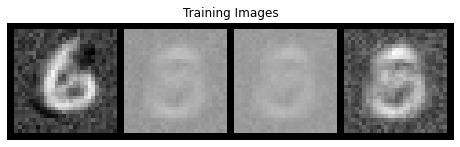

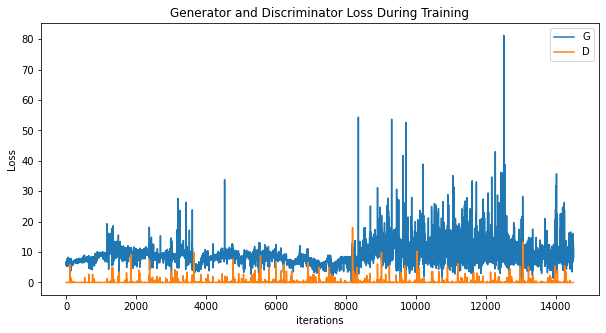

[0/3][14510/30000]	Loss_D: 0.0038	Loss_G: 9.6262	D(x): 0.9998	D(G(z)): 0.0036 / 0.0005
tensor([ 6.2886, -1.5669], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0039], grad_fn=<SliceBackward>)
tensor([0.2713, 0.2115], grad_fn=<SliceBackward>)
[0/3][14520/30000]	Loss_D: 0.0036	Loss_G: 7.9445	D(x): 1.0000	D(G(z)): 0.0036 / 0.0005
tensor([ 6.2884, -1.5669], grad_fn=<SliceBackward>) tensor([-0.0094,  0.0040], grad_fn=<SliceBackward>)
tensor([0.2777, 0.2174], grad_fn=<SliceBackward>)
[0/3][14530/30000]	Loss_D: 0.0175	Loss_G: 9.5220	D(x): 1.0000	D(G(z)): 0.0173 / 0.0002
tensor([ 6.2884, -1.5668], grad_fn=<SliceBackward>) tensor([-0.0093,  0.0041], grad_fn=<SliceBackward>)
tensor([0.2784, 0.2187], grad_fn=<SliceBackward>)
[0/3][14540/30000]	Loss_D: 0.0000	Loss_G: 10.1696	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 6.2867, -1.5668], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0061], grad_fn=<SliceBackward>)
tensor([0.2790, 0.2188], grad_fn=<SliceBackward>)
[0/3][14550/30000]	Loss_D: 0.0003	L

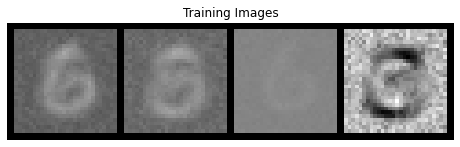

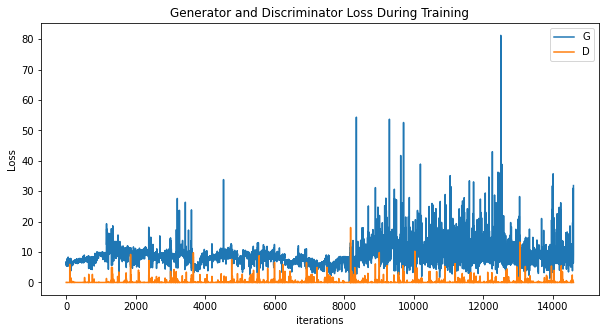

[0/3][14610/30000]	Loss_D: 0.0533	Loss_G: 14.0979	D(x): 0.9510	D(G(z)): 0.0017 / 0.0000
tensor([ 6.2367, -1.5628], grad_fn=<SliceBackward>) tensor([-0.0055,  0.0086], grad_fn=<SliceBackward>)
tensor([0.2805, 0.2255], grad_fn=<SliceBackward>)
[0/3][14620/30000]	Loss_D: 0.0007	Loss_G: 9.2444	D(x): 1.0000	D(G(z)): 0.0007 / 0.0001
tensor([ 6.2282, -1.5675], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0086], grad_fn=<SliceBackward>)
tensor([0.2796, 0.2242], grad_fn=<SliceBackward>)
[0/3][14630/30000]	Loss_D: 0.0029	Loss_G: 10.4236	D(x): 1.0000	D(G(z)): 0.0029 / 0.0007
tensor([ 6.2285, -1.5681], grad_fn=<SliceBackward>) tensor([-0.0055,  0.0086], grad_fn=<SliceBackward>)
tensor([0.2778, 0.2239], grad_fn=<SliceBackward>)
[0/3][14640/30000]	Loss_D: 0.0091	Loss_G: 7.6443	D(x): 1.0000	D(G(z)): 0.0091 / 0.0007
tensor([ 6.2288, -1.5685], grad_fn=<SliceBackward>) tensor([-0.0055,  0.0086], grad_fn=<SliceBackward>)
tensor([0.2843, 0.2301], grad_fn=<SliceBackward>)
[0/3][14650/30000]	Loss_D: 0.0035	

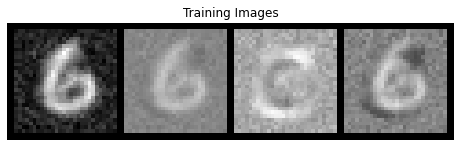

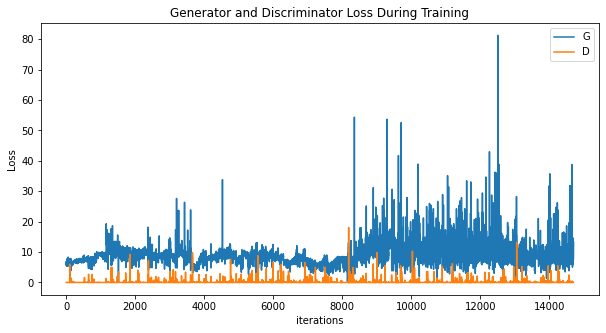

[0/3][14710/30000]	Loss_D: 0.0002	Loss_G: 8.0597	D(x): 1.0000	D(G(z)): 0.0002 / 0.0007
tensor([ 6.2310, -1.5710], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0088], grad_fn=<SliceBackward>)
tensor([0.2860, 0.2294], grad_fn=<SliceBackward>)
[0/3][14720/30000]	Loss_D: 0.0506	Loss_G: 12.0659	D(x): 0.9999	D(G(z)): 0.0492 / 0.0001
tensor([ 6.2351, -1.5738], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0091], grad_fn=<SliceBackward>)
tensor([0.2927, 0.2333], grad_fn=<SliceBackward>)
[0/3][14730/30000]	Loss_D: 0.0004	Loss_G: 12.4349	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 6.2310, -1.5761], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0092], grad_fn=<SliceBackward>)
tensor([0.2904, 0.2290], grad_fn=<SliceBackward>)
[0/3][14740/30000]	Loss_D: 0.0001	Loss_G: 11.1429	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 6.2309, -1.5761], grad_fn=<SliceBackward>) tensor([-0.0048,  0.0092], grad_fn=<SliceBackward>)
tensor([0.2880, 0.2277], grad_fn=<SliceBackward>)
[0/3][14750/30000]	Loss_D: 0.0002

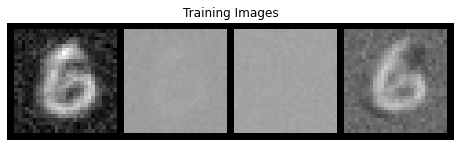

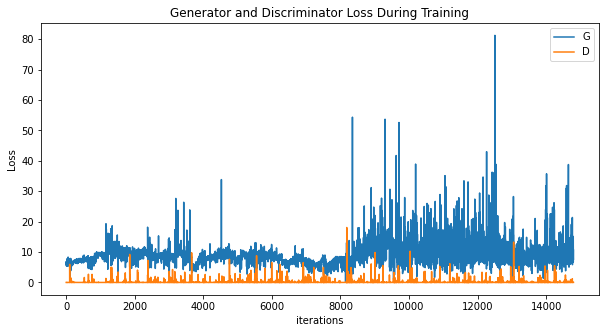

[0/3][14810/30000]	Loss_D: 0.0021	Loss_G: 7.0923	D(x): 1.0000	D(G(z)): 0.0021 / 0.0010
tensor([ 6.2272, -1.5751], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0090], grad_fn=<SliceBackward>)
tensor([0.2211, 0.1466], grad_fn=<SliceBackward>)
[0/3][14820/30000]	Loss_D: 0.0005	Loss_G: 9.3806	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
tensor([ 6.2271, -1.5749], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0090], grad_fn=<SliceBackward>)
tensor([0.2210, 0.1424], grad_fn=<SliceBackward>)
[0/3][14830/30000]	Loss_D: 0.0024	Loss_G: 10.4504	D(x): 1.0000	D(G(z)): 0.0024 / 0.0004
tensor([ 6.2271, -1.5746], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0090], grad_fn=<SliceBackward>)
tensor([0.2202, 0.1403], grad_fn=<SliceBackward>)
[0/3][14840/30000]	Loss_D: 0.0028	Loss_G: 11.2945	D(x): 1.0000	D(G(z)): 0.0028 / 0.0003
tensor([ 6.2271, -1.5744], grad_fn=<SliceBackward>) tensor([-0.0050,  0.0090], grad_fn=<SliceBackward>)
tensor([0.2251, 0.1430], grad_fn=<SliceBackward>)
[0/3][14850/30000]	Loss_D: 0.1453	

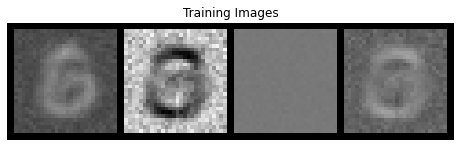

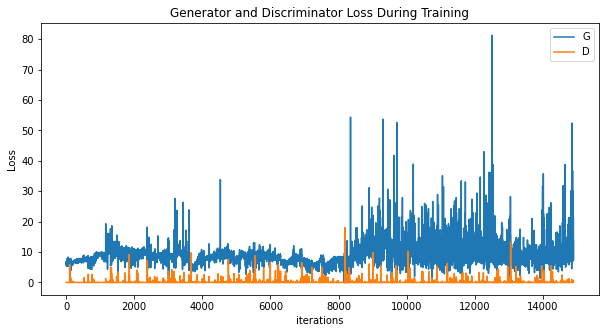

[0/3][14910/30000]	Loss_D: 0.0000	Loss_G: 14.0084	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.1876, -1.6058], grad_fn=<SliceBackward>) tensor([-0.0022,  0.0117], grad_fn=<SliceBackward>)
tensor([0.2055, 0.1138], grad_fn=<SliceBackward>)
[0/3][14920/30000]	Loss_D: 0.0003	Loss_G: 9.8124	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 6.1862, -1.6045], grad_fn=<SliceBackward>) tensor([-0.0022,  0.0117], grad_fn=<SliceBackward>)
tensor([0.2047, 0.1122], grad_fn=<SliceBackward>)
[0/3][14930/30000]	Loss_D: 0.0005	Loss_G: 9.2458	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 6.1852, -1.6031], grad_fn=<SliceBackward>) tensor([-0.0022,  0.0117], grad_fn=<SliceBackward>)
tensor([0.2027, 0.1117], grad_fn=<SliceBackward>)
[0/3][14940/30000]	Loss_D: 0.0010	Loss_G: 10.5345	D(x): 1.0000	D(G(z)): 0.0010 / 0.0000
tensor([ 6.1842, -1.6017], grad_fn=<SliceBackward>) tensor([-0.0022,  0.0117], grad_fn=<SliceBackward>)
tensor([0.1970, 0.1077], grad_fn=<SliceBackward>)
[0/3][14950/30000]	Loss_D: 0.0004	

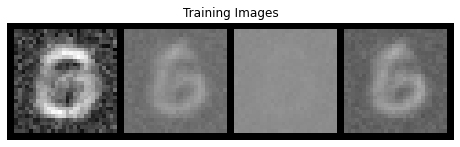

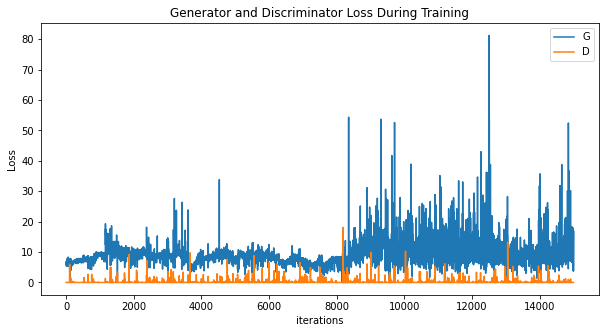

[0/3][15010/30000]	Loss_D: 0.0047	Loss_G: 11.1432	D(x): 1.0000	D(G(z)): 0.0047 / 0.0000
tensor([ 6.1732, -1.5850], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0115], grad_fn=<SliceBackward>)
tensor([0.1772, 0.0935], grad_fn=<SliceBackward>)
[0/3][15020/30000]	Loss_D: 0.0040	Loss_G: 5.2924	D(x): 1.0000	D(G(z)): 0.0040 / 0.0369
tensor([ 6.1704, -1.5797], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0115], grad_fn=<SliceBackward>)
tensor([0.1690, 0.0847], grad_fn=<SliceBackward>)
[0/3][15030/30000]	Loss_D: 0.0001	Loss_G: 9.0552	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 6.1708, -1.5818], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0115], grad_fn=<SliceBackward>)
tensor([0.1672, 0.0839], grad_fn=<SliceBackward>)
[0/3][15040/30000]	Loss_D: 0.0002	Loss_G: 9.3427	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 6.1711, -1.5820], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0115], grad_fn=<SliceBackward>)
tensor([0.1688, 0.0853], grad_fn=<SliceBackward>)
[0/3][15050/30000]	Loss_D: 0.0004	L

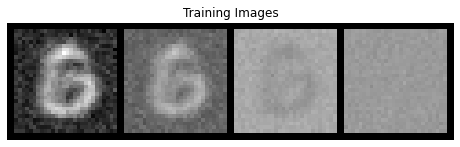

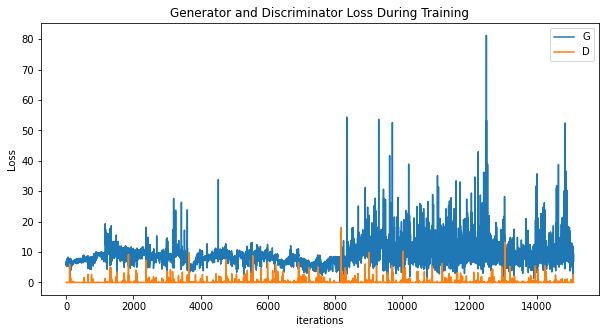

[0/3][15110/30000]	Loss_D: 0.0021	Loss_G: 18.8417	D(x): 1.0000	D(G(z)): 0.0021 / 0.0021
tensor([ 6.1581, -1.6050], grad_fn=<SliceBackward>) tensor([-0.0045,  0.0094], grad_fn=<SliceBackward>)
tensor([0.1623, 0.0825], grad_fn=<SliceBackward>)
[0/3][15120/30000]	Loss_D: 0.0000	Loss_G: 22.0220	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.1583, -1.6051], grad_fn=<SliceBackward>) tensor([-0.0039,  0.0100], grad_fn=<SliceBackward>)
tensor([0.1559, 0.0779], grad_fn=<SliceBackward>)
[0/3][15130/30000]	Loss_D: 0.0140	Loss_G: 8.2551	D(x): 0.9969	D(G(z)): 0.0108 / 0.0004
tensor([ 6.1598, -1.6202], grad_fn=<SliceBackward>) tensor([-0.0038,  0.0100], grad_fn=<SliceBackward>)
tensor([0.1457, 0.0703], grad_fn=<SliceBackward>)
[0/3][15140/30000]	Loss_D: 0.0276	Loss_G: 10.4306	D(x): 1.0000	D(G(z)): 0.0272 / 0.0001
tensor([ 6.1440, -1.6539], grad_fn=<SliceBackward>) tensor([-0.0019,  0.0122], grad_fn=<SliceBackward>)
tensor([0.1343, 0.0615], grad_fn=<SliceBackward>)
[0/3][15150/30000]	Loss_D: 0.0001

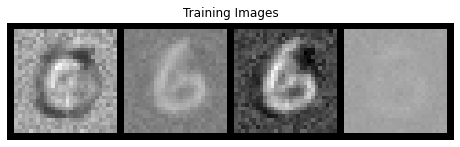

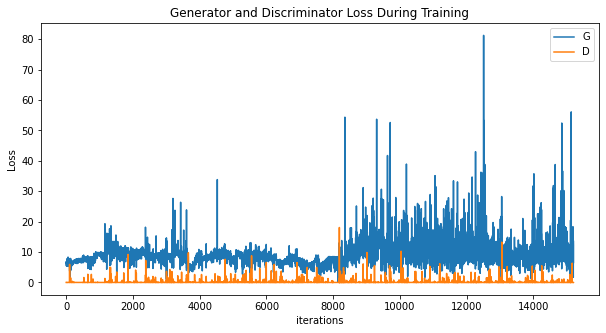

[0/3][15210/30000]	Loss_D: 0.0000	Loss_G: 9.8185	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 6.1106, -1.7062], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0121], grad_fn=<SliceBackward>)
tensor([0.1202, 0.0478], grad_fn=<SliceBackward>)
[0/3][15220/30000]	Loss_D: 0.0000	Loss_G: 15.1336	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.0735, -1.7195], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0121], grad_fn=<SliceBackward>)
tensor([0.1177, 0.0445], grad_fn=<SliceBackward>)
[0/3][15230/30000]	Loss_D: 0.0000	Loss_G: 10.0166	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.0438, -1.7328], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0121], grad_fn=<SliceBackward>)
tensor([0.1138, 0.0398], grad_fn=<SliceBackward>)
[0/3][15240/30000]	Loss_D: 0.0012	Loss_G: 12.4537	D(x): 1.0000	D(G(z)): 0.0012 / 0.0001
tensor([ 6.0206, -1.7463], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0121], grad_fn=<SliceBackward>)
tensor([0.1089, 0.0351], grad_fn=<SliceBackward>)
[0/3][15250/30000]	Loss_D: 0.0066

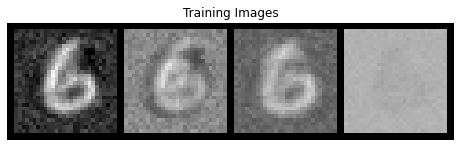

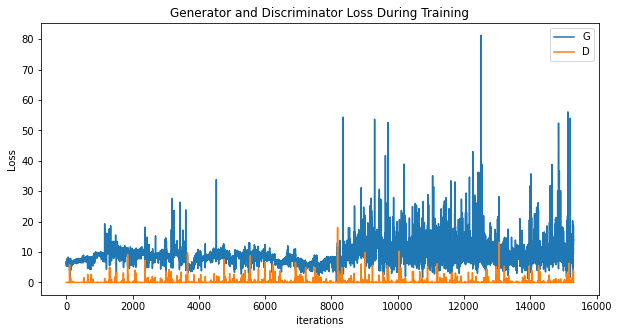

[0/3][15310/30000]	Loss_D: 0.0094	Loss_G: 7.3157	D(x): 0.9911	D(G(z)): 0.0005 / 0.0009
tensor([ 6.0172, -1.7557], grad_fn=<SliceBackward>) tensor([0.0021, 0.0159], grad_fn=<SliceBackward>)
tensor([0.1079, 0.0332], grad_fn=<SliceBackward>)
[0/3][15320/30000]	Loss_D: 0.0017	Loss_G: 7.0976	D(x): 0.9993	D(G(z)): 0.0010 / 0.0008
tensor([ 6.0190, -1.7509], grad_fn=<SliceBackward>) tensor([0.0021, 0.0159], grad_fn=<SliceBackward>)
tensor([0.1098, 0.0364], grad_fn=<SliceBackward>)
[0/3][15330/30000]	Loss_D: 0.0263	Loss_G: 7.1545	D(x): 0.9994	D(G(z)): 0.0251 / 0.0010
tensor([ 6.0196, -1.7494], grad_fn=<SliceBackward>) tensor([0.0012, 0.0150], grad_fn=<SliceBackward>)
tensor([0.1098, 0.0369], grad_fn=<SliceBackward>)
[0/3][15340/30000]	Loss_D: 0.0054	Loss_G: 8.5187	D(x): 1.0000	D(G(z)): 0.0054 / 0.0004
tensor([ 6.0193, -1.7502], grad_fn=<SliceBackward>) tensor([0.0011, 0.0150], grad_fn=<SliceBackward>)
tensor([0.1105, 0.0377], grad_fn=<SliceBackward>)
[0/3][15350/30000]	Loss_D: 0.0023	Loss_G: 4.

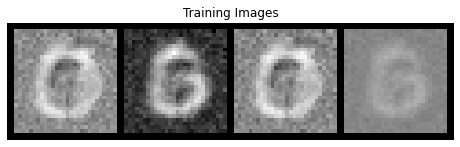

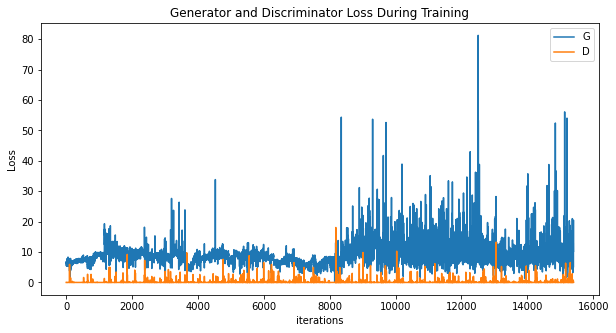

[0/3][15410/30000]	Loss_D: 0.0036	Loss_G: 8.4541	D(x): 1.0000	D(G(z)): 0.0036 / 0.0009
tensor([ 5.9487, -1.8076], grad_fn=<SliceBackward>) tensor([0.0001, 0.0140], grad_fn=<SliceBackward>)
tensor([0.0904, 0.0147], grad_fn=<SliceBackward>)
[0/3][15420/30000]	Loss_D: 0.0093	Loss_G: 5.1926	D(x): 1.0000	D(G(z)): 0.0093 / 0.0056
tensor([ 5.9386, -1.8160], grad_fn=<SliceBackward>) tensor([0.0001, 0.0140], grad_fn=<SliceBackward>)
tensor([0.0883, 0.0115], grad_fn=<SliceBackward>)
[0/3][15430/30000]	Loss_D: 0.0027	Loss_G: 6.9918	D(x): 1.0000	D(G(z)): 0.0026 / 0.0010
tensor([ 5.9286, -1.8228], grad_fn=<SliceBackward>) tensor([0.0001, 0.0140], grad_fn=<SliceBackward>)
tensor([0.0857, 0.0080], grad_fn=<SliceBackward>)
[0/3][15440/30000]	Loss_D: 0.0053	Loss_G: 8.3136	D(x): 1.0000	D(G(z)): 0.0052 / 0.0004
tensor([ 5.9181, -1.8293], grad_fn=<SliceBackward>) tensor([0.0001, 0.0140], grad_fn=<SliceBackward>)
tensor([0.0818, 0.0038], grad_fn=<SliceBackward>)
[0/3][15450/30000]	Loss_D: 0.0011	Loss_G: 10

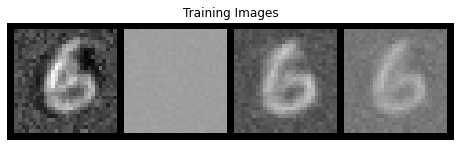

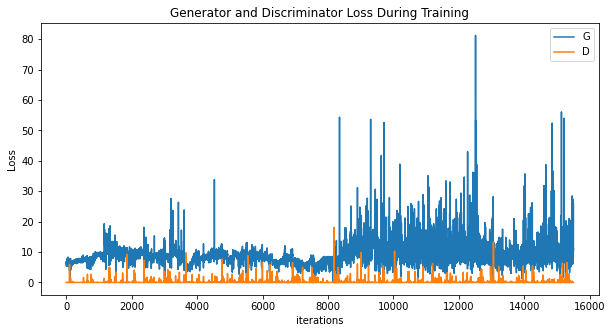

[0/3][15510/30000]	Loss_D: 0.0004	Loss_G: 8.6467	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
tensor([ 5.8431, -1.8948], grad_fn=<SliceBackward>) tensor([0.0002, 0.0141], grad_fn=<SliceBackward>)
tensor([ 0.0605, -0.0252], grad_fn=<SliceBackward>)
[0/3][15520/30000]	Loss_D: 0.0007	Loss_G: 7.8194	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
tensor([ 5.8354, -1.9014], grad_fn=<SliceBackward>) tensor([0.0002, 0.0141], grad_fn=<SliceBackward>)
tensor([ 0.0544, -0.0320], grad_fn=<SliceBackward>)
[0/3][15530/30000]	Loss_D: 1.1804	Loss_G: 4.3079	D(x): 1.0000	D(G(z)): 0.6423 / 0.0219
tensor([ 5.8267, -1.9095], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0137], grad_fn=<SliceBackward>)
tensor([ 0.0539, -0.0338], grad_fn=<SliceBackward>)
[0/3][15540/30000]	Loss_D: 0.0040	Loss_G: 5.3650	D(x): 1.0000	D(G(z)): 0.0040 / 0.0078
tensor([ 5.8181, -1.9131], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0137], grad_fn=<SliceBackward>)
tensor([ 0.0524, -0.0346], grad_fn=<SliceBackward>)
[0/3][15550/30000]	Loss_D: 0.046

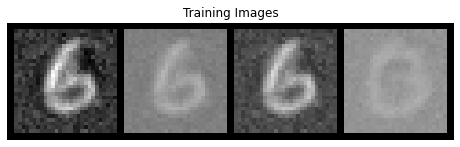

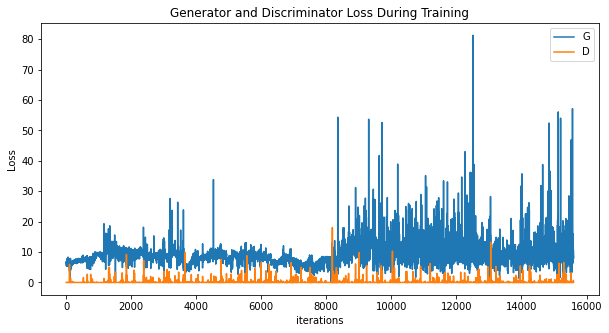

[0/3][15610/30000]	Loss_D: 0.0001	Loss_G: 16.0996	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.7974, -1.9396], grad_fn=<SliceBackward>) tensor([0.0006, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0404, -0.0460], grad_fn=<SliceBackward>)
[0/3][15620/30000]	Loss_D: 0.0304	Loss_G: 10.5356	D(x): 1.0000	D(G(z)): 0.0295 / 0.0000
tensor([ 5.7870, -1.9519], grad_fn=<SliceBackward>) tensor([0.0007, 0.0146], grad_fn=<SliceBackward>)
tensor([ 0.0393, -0.0475], grad_fn=<SliceBackward>)
[0/3][15630/30000]	Loss_D: 0.0001	Loss_G: 13.0705	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.7745, -1.9599], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0384, -0.0497], grad_fn=<SliceBackward>)
[0/3][15640/30000]	Loss_D: 0.0002	Loss_G: 11.4664	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
tensor([ 5.7745, -1.9603], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0381, -0.0516], grad_fn=<SliceBackward>)
[0/3][15650/30000]	Loss_D: 0.000

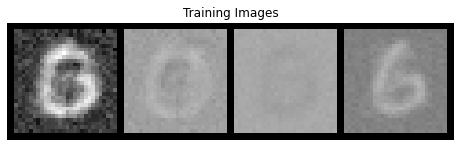

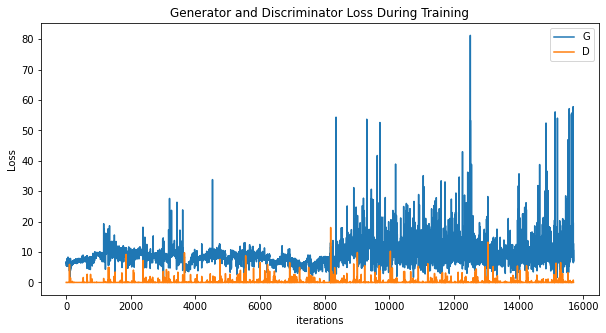

[0/3][15710/30000]	Loss_D: 0.0178	Loss_G: 7.6522	D(x): 1.0000	D(G(z)): 0.0176 / 0.0010
tensor([ 5.7747, -1.9538], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0528, -0.0388], grad_fn=<SliceBackward>)
[0/3][15720/30000]	Loss_D: 0.0402	Loss_G: 10.2118	D(x): 1.0000	D(G(z)): 0.0392 / 0.0008
tensor([ 5.7746, -1.9536], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0534, -0.0375], grad_fn=<SliceBackward>)
[0/3][15730/30000]	Loss_D: 0.0247	Loss_G: 7.7383	D(x): 1.0000	D(G(z)): 0.0242 / 0.0006
tensor([ 5.7750, -1.9578], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0553, -0.0363], grad_fn=<SliceBackward>)
[0/3][15740/30000]	Loss_D: 0.0518	Loss_G: 11.3296	D(x): 0.9630	D(G(z)): 0.0133 / 0.0001
tensor([ 5.7656, -1.9796], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0561, -0.0355], grad_fn=<SliceBackward>)
[0/3][15750/30000]	Loss_D: 0.0004	

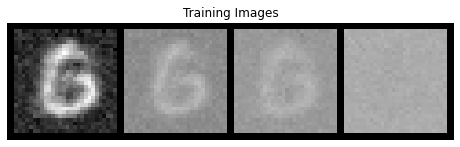

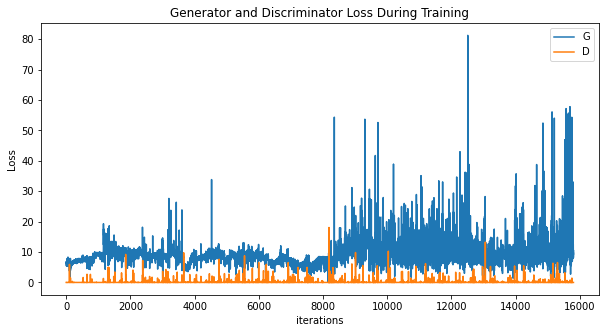

[0/3][15810/30000]	Loss_D: 0.0029	Loss_G: 10.9909	D(x): 1.0000	D(G(z)): 0.0029 / 0.0002
tensor([ 5.7387, -2.0102], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0625, -0.0284], grad_fn=<SliceBackward>)
[0/3][15820/30000]	Loss_D: 0.0011	Loss_G: 12.9733	D(x): 1.0000	D(G(z)): 0.0011 / 0.0002
tensor([ 5.7391, -2.0095], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0636, -0.0269], grad_fn=<SliceBackward>)
[0/3][15830/30000]	Loss_D: 0.0016	Loss_G: 11.9193	D(x): 1.0000	D(G(z)): 0.0016 / 0.0001
tensor([ 5.7391, -2.0094], grad_fn=<SliceBackward>) tensor([0.0005, 0.0144], grad_fn=<SliceBackward>)
tensor([ 0.0651, -0.0248], grad_fn=<SliceBackward>)
[0/3][15840/30000]	Loss_D: 0.0042	Loss_G: 9.8086	D(x): 1.0000	D(G(z)): 0.0042 / 0.0001
tensor([ 5.7326, -2.0179], grad_fn=<SliceBackward>) tensor([0.0009, 0.0148], grad_fn=<SliceBackward>)
tensor([ 0.0671, -0.0221], grad_fn=<SliceBackward>)
[0/3][15850/30000]	Loss_D: 0.0005

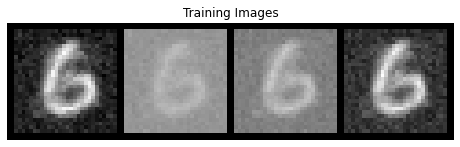

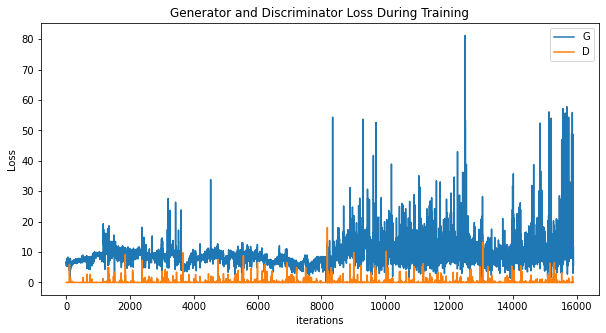

[0/3][15910/30000]	Loss_D: 0.0000	Loss_G: 10.1378	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.6866, -2.0686], grad_fn=<SliceBackward>) tensor([0.0007, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0604, -0.0345], grad_fn=<SliceBackward>)
[0/3][15920/30000]	Loss_D: 0.0001	Loss_G: 11.6439	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.6883, -2.0678], grad_fn=<SliceBackward>) tensor([0.0007, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0619, -0.0327], grad_fn=<SliceBackward>)
[0/3][15930/30000]	Loss_D: 0.0841	Loss_G: 11.3940	D(x): 0.9218	D(G(z)): 0.0002 / 0.0001
tensor([ 5.6896, -2.0674], grad_fn=<SliceBackward>) tensor([0.0007, 0.0146], grad_fn=<SliceBackward>)
tensor([ 0.0623, -0.0327], grad_fn=<SliceBackward>)
[0/3][15940/30000]	Loss_D: 0.0001	Loss_G: 16.7235	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
tensor([ 5.6905, -2.0674], grad_fn=<SliceBackward>) tensor([0.0007, 0.0146], grad_fn=<SliceBackward>)
tensor([ 0.0627, -0.0322], grad_fn=<SliceBackward>)
[0/3][15950/30000]	Loss_D: 0.001

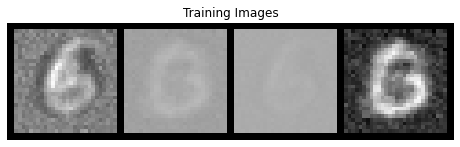

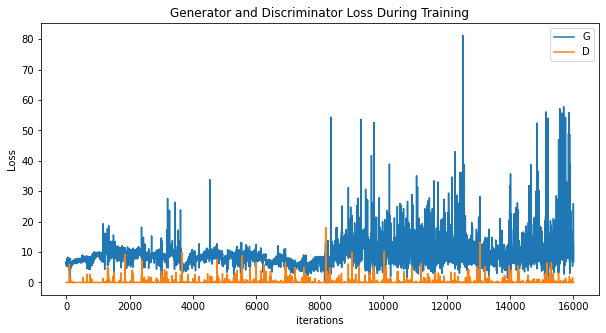

[0/3][16010/30000]	Loss_D: 1.2919	Loss_G: 16.8159	D(x): 1.0000	D(G(z)): 0.6731 / 0.0000
tensor([ 5.7331, -2.0767], grad_fn=<SliceBackward>) tensor([0.0007, 0.0146], grad_fn=<SliceBackward>)
tensor([ 0.0443, -0.0473], grad_fn=<SliceBackward>)
[0/3][16020/30000]	Loss_D: 0.1221	Loss_G: 10.7906	D(x): 0.9995	D(G(z)): 0.1113 / 0.0007
tensor([ 5.7272, -2.0888], grad_fn=<SliceBackward>) tensor([0.0008, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0410, -0.0495], grad_fn=<SliceBackward>)
[0/3][16030/30000]	Loss_D: 0.0013	Loss_G: 10.3657	D(x): 1.0000	D(G(z)): 0.0013 / 0.0007
tensor([ 5.7152, -2.1045], grad_fn=<SliceBackward>) tensor([0.0009, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0412, -0.0497], grad_fn=<SliceBackward>)
[0/3][16040/30000]	Loss_D: 0.0052	Loss_G: 10.0270	D(x): 1.0000	D(G(z)): 0.0052 / 0.0009
tensor([ 5.7065, -2.1183], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0399, -0.0514], grad_fn=<SliceBackward>)
[0/3][16050/30000]	Loss_D: 0.001

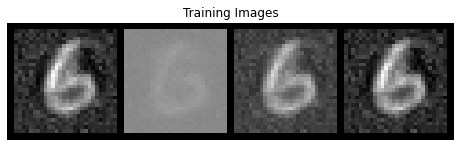

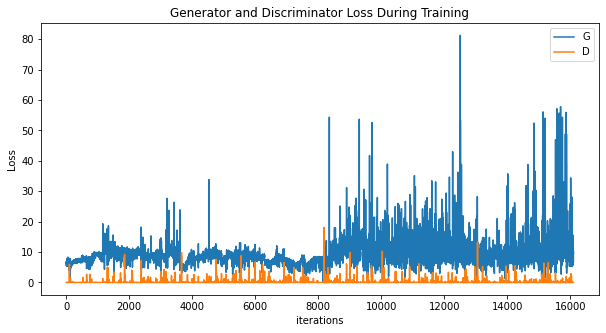

[0/3][16110/30000]	Loss_D: 0.0020	Loss_G: 12.3640	D(x): 1.0000	D(G(z)): 0.0020 / 0.0004
tensor([ 5.7043, -2.1618], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0444, -0.0469], grad_fn=<SliceBackward>)
[0/3][16120/30000]	Loss_D: 0.0010	Loss_G: 8.2076	D(x): 1.0000	D(G(z)): 0.0010 / 0.0004
tensor([ 5.7055, -2.1673], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0441, -0.0472], grad_fn=<SliceBackward>)
[0/3][16130/30000]	Loss_D: 0.0006	Loss_G: 7.9640	D(x): 1.0000	D(G(z)): 0.0006 / 0.0008
tensor([ 5.7071, -2.1730], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0422, -0.0488], grad_fn=<SliceBackward>)
[0/3][16140/30000]	Loss_D: 0.0021	Loss_G: 7.7429	D(x): 1.0000	D(G(z)): 0.0020 / 0.0006
tensor([ 5.7091, -2.1787], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0428, -0.0475], grad_fn=<SliceBackward>)
[0/3][16150/30000]	Loss_D: 0.0016	L

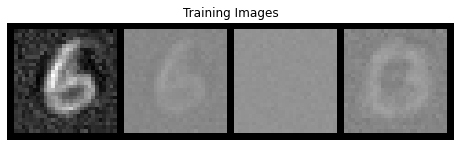

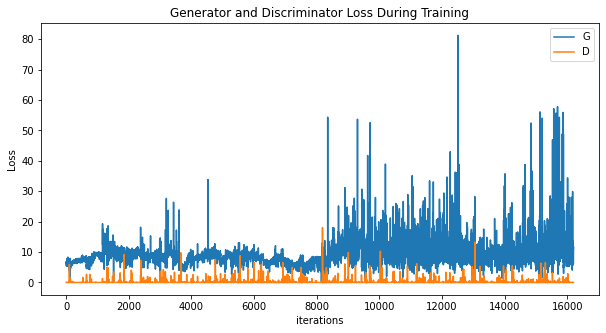

[0/3][16210/30000]	Loss_D: 0.0007	Loss_G: 8.0465	D(x): 1.0000	D(G(z)): 0.0007 / 0.0004
tensor([ 5.7242, -2.2282], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0304, -0.0507], grad_fn=<SliceBackward>)
[0/3][16220/30000]	Loss_D: 0.0057	Loss_G: 9.8502	D(x): 1.0000	D(G(z)): 0.0057 / 0.0001
tensor([ 5.7261, -2.2358], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0309, -0.0488], grad_fn=<SliceBackward>)
[0/3][16230/30000]	Loss_D: 0.0011	Loss_G: 9.5116	D(x): 1.0000	D(G(z)): 0.0011 / 0.0061
tensor([ 5.7280, -2.2434], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0275, -0.0507], grad_fn=<SliceBackward>)
[0/3][16240/30000]	Loss_D: 0.0008	Loss_G: 12.1883	D(x): 1.0000	D(G(z)): 0.0008 / 0.0000
tensor([ 5.7310, -2.2492], grad_fn=<SliceBackward>) tensor([0.0007, 0.0145], grad_fn=<SliceBackward>)
tensor([ 0.0289, -0.0469], grad_fn=<SliceBackward>)
[0/3][16250/30000]	Loss_D: 0.1674	L

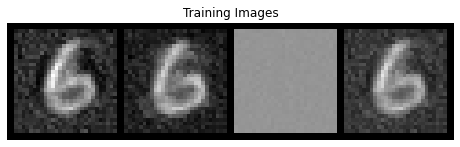

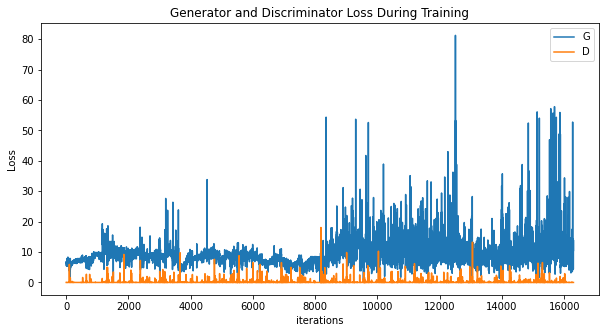

[0/3][16310/30000]	Loss_D: 0.0013	Loss_G: 13.1591	D(x): 1.0000	D(G(z)): 0.0013 / 0.0006
tensor([ 5.7480, -2.2781], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0199, -0.0511], grad_fn=<SliceBackward>)
[0/3][16320/30000]	Loss_D: 0.0004	Loss_G: 5.0734	D(x): 1.0000	D(G(z)): 0.0004 / 0.0340
tensor([ 5.7492, -2.2818], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0179, -0.0518], grad_fn=<SliceBackward>)
[0/3][16330/30000]	Loss_D: 0.0007	Loss_G: 12.0692	D(x): 1.0000	D(G(z)): 0.0007 / 0.0000
tensor([ 5.7508, -2.2840], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0172, -0.0528], grad_fn=<SliceBackward>)
[0/3][16340/30000]	Loss_D: 0.0030	Loss_G: 7.6883	D(x): 0.9977	D(G(z)): 0.0007 / 0.0007
tensor([ 5.7524, -2.2844], grad_fn=<SliceBackward>) tensor([0.0005, 0.0143], grad_fn=<SliceBackward>)
tensor([ 0.0154, -0.0532], grad_fn=<SliceBackward>)
[0/3][16350/30000]	Loss_D: 0.0020	

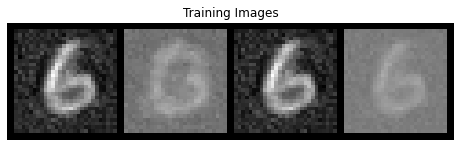

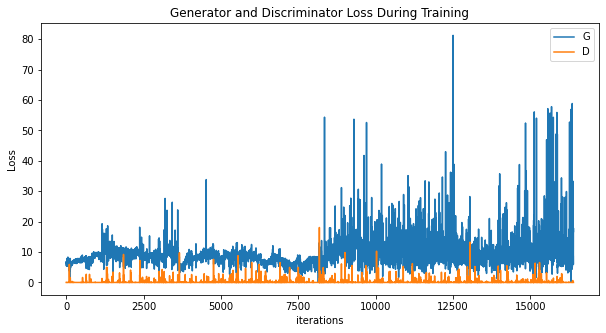

[0/3][16410/30000]	Loss_D: 1.1415	Loss_G: 27.7756	D(x): 0.5510	D(G(z)): 0.0003 / 0.0000
tensor([ 5.7605, -2.2787], grad_fn=<SliceBackward>) tensor([0.0012, 0.0150], grad_fn=<SliceBackward>)
tensor([ 0.0070, -0.0517], grad_fn=<SliceBackward>)
[0/3][16420/30000]	Loss_D: 0.1089	Loss_G: 10.3675	D(x): 1.0000	D(G(z)): 0.0990 / 0.0000
tensor([ 5.7621, -2.2788], grad_fn=<SliceBackward>) tensor([0.0013, 0.0151], grad_fn=<SliceBackward>)
tensor([ 0.0062, -0.0490], grad_fn=<SliceBackward>)
[0/3][16430/30000]	Loss_D: 0.0090	Loss_G: 10.9866	D(x): 1.0000	D(G(z)): 0.0089 / 0.2192
tensor([ 5.7650, -2.2784], grad_fn=<SliceBackward>) tensor([0.0009, 0.0147], grad_fn=<SliceBackward>)
tensor([ 0.0065, -0.0475], grad_fn=<SliceBackward>)
[0/3][16440/30000]	Loss_D: 0.0474	Loss_G: 9.4699	D(x): 1.0000	D(G(z)): 0.0453 / 0.0031
tensor([ 5.7643, -2.2825], grad_fn=<SliceBackward>) tensor([0.0014, 0.0152], grad_fn=<SliceBackward>)
tensor([ 0.0021, -0.0482], grad_fn=<SliceBackward>)
[0/3][16450/30000]	Loss_D: 0.0014

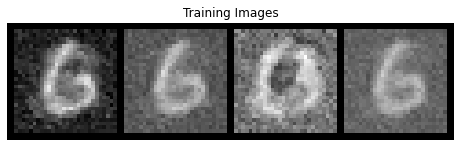

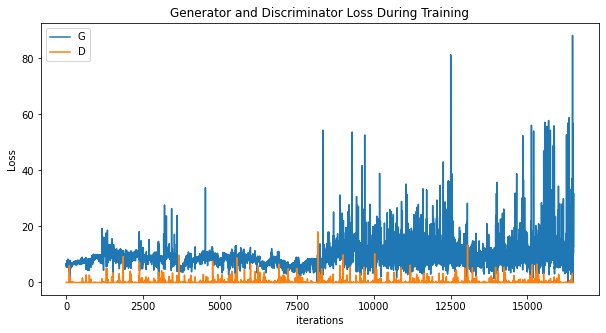

[0/3][16510/30000]	Loss_D: 0.0000	Loss_G: 15.7181	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([ 0.0406, -0.0030], grad_fn=<SliceBackward>)
[0/3][16520/30000]	Loss_D: 0.0000	Loss_G: 5.9538	D(x): 1.0000	D(G(z)): 0.0000 / 0.4898
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0468, 0.0016], grad_fn=<SliceBackward>)
[0/3][16530/30000]	Loss_D: 0.0000	Loss_G: 22.9748	D(x): 1.0000	D(G(z)): 0.0000 / 0.0256
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0516, 0.0047], grad_fn=<SliceBackward>)
[0/3][16540/30000]	Loss_D: 0.0000	Loss_G: 4.8302	D(x): 1.0000	D(G(z)): 0.0000 / 0.3295
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0534, 0.0085], grad_fn=<SliceBackward>)
[0/3][16550/30000]	Loss_D: 0.0000	Loss_G

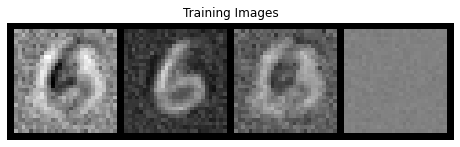

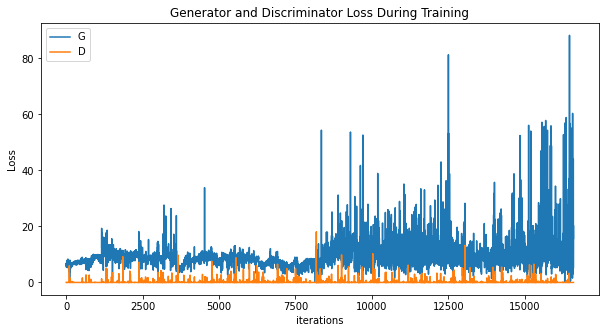

[0/3][16610/30000]	Loss_D: 0.0000	Loss_G: 17.1035	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0758, 0.0355], grad_fn=<SliceBackward>)
[0/3][16620/30000]	Loss_D: 0.0000	Loss_G: 10.5921	D(x): 1.0000	D(G(z)): 0.0000 / 0.4816
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0821, 0.0410], grad_fn=<SliceBackward>)
[0/3][16630/30000]	Loss_D: 0.0000	Loss_G: 5.5535	D(x): 1.0000	D(G(z)): 0.0000 / 0.1122
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0827, 0.0421], grad_fn=<SliceBackward>)
[0/3][16640/30000]	Loss_D: 0.0000	Loss_G: 10.5194	D(x): 1.0000	D(G(z)): 0.0000 / 0.4654
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0854, 0.0458], grad_fn=<SliceBackward>)
[0/3][16650/30000]	Loss_D: 0.0000	Loss_G:

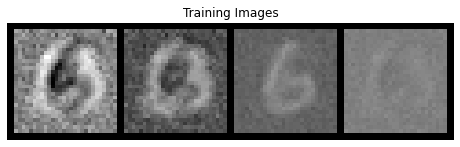

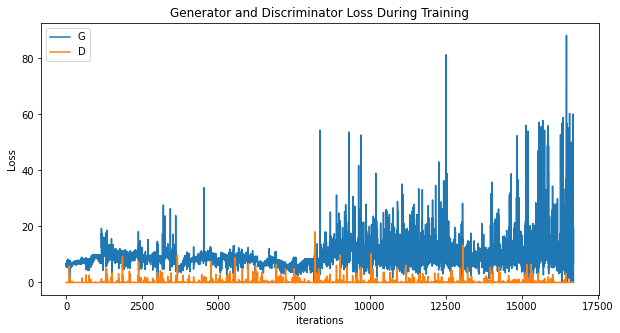

[0/3][16710/30000]	Loss_D: 0.0000	Loss_G: 13.8540	D(x): 1.0000	D(G(z)): 0.0000 / 0.0005
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0969, 0.0620], grad_fn=<SliceBackward>)
[0/3][16720/30000]	Loss_D: 0.0000	Loss_G: 22.1910	D(x): 1.0000	D(G(z)): 0.0000 / 0.4553
tensor([ 5.7242, -2.3442], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.0981, 0.0631], grad_fn=<SliceBackward>)
[0/3][16730/30000]	Loss_D: 0.0000	Loss_G: 19.1925	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.7242, -2.3441], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.1025, 0.0683], grad_fn=<SliceBackward>)
[0/3][16740/30000]	Loss_D: 0.0000	Loss_G: 0.5258	D(x): 1.0000	D(G(z)): 0.0000 / 0.6741
tensor([ 5.7242, -2.3440], grad_fn=<SliceBackward>) tensor([0.0036, 0.0179], grad_fn=<SliceBackward>)
tensor([0.1060, 0.0711], grad_fn=<SliceBackward>)
[0/3][16750/30000]	Loss_D: 0.0000	Loss_G:

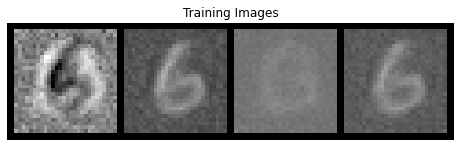

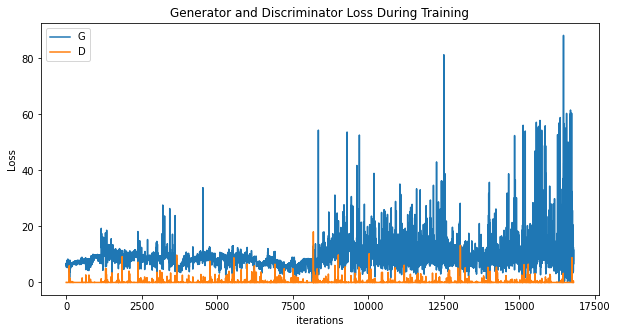

[0/3][16810/30000]	Loss_D: 0.0533	Loss_G: 10.4794	D(x): 1.0000	D(G(z)): 0.0517 / 0.0003
tensor([ 5.7160, -2.3347], grad_fn=<SliceBackward>) tensor([0.0034, 0.0178], grad_fn=<SliceBackward>)
tensor([0.1113, 0.0806], grad_fn=<SliceBackward>)
[0/3][16820/30000]	Loss_D: 0.0156	Loss_G: 8.1966	D(x): 1.0000	D(G(z)): 0.0154 / 0.0072
tensor([ 5.7183, -2.3354], grad_fn=<SliceBackward>) tensor([0.0035, 0.0178], grad_fn=<SliceBackward>)
tensor([0.1184, 0.0870], grad_fn=<SliceBackward>)
[0/3][16830/30000]	Loss_D: 0.0321	Loss_G: 17.6020	D(x): 1.0000	D(G(z)): 0.0316 / 0.0000
tensor([ 5.7223, -2.3390], grad_fn=<SliceBackward>) tensor([0.0037, 0.0180], grad_fn=<SliceBackward>)
tensor([0.1150, 0.0835], grad_fn=<SliceBackward>)
[0/3][16840/30000]	Loss_D: 0.0395	Loss_G: 38.7134	D(x): 0.9949	D(G(z)): 0.0337 / 0.0000
tensor([ 5.7328, -2.3535], grad_fn=<SliceBackward>) tensor([0.0042, 0.0184], grad_fn=<SliceBackward>)
tensor([0.1142, 0.0827], grad_fn=<SliceBackward>)
[0/3][16850/30000]	Loss_D: 0.0195	Loss_G:

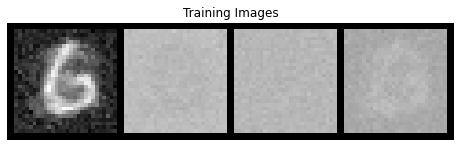

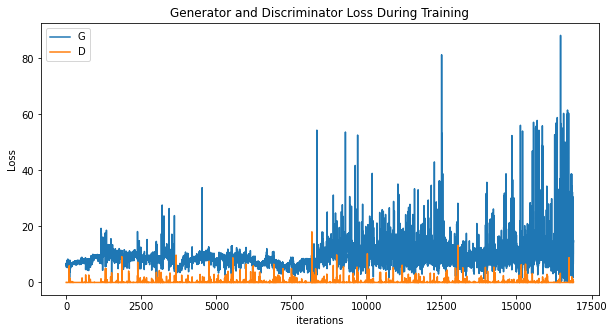

[0/3][16910/30000]	Loss_D: 0.0021	Loss_G: 6.6357	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
tensor([ 5.7550, -2.4010], grad_fn=<SliceBackward>) tensor([0.0038, 0.0181], grad_fn=<SliceBackward>)
tensor([0.1174, 0.0899], grad_fn=<SliceBackward>)
[0/3][16920/30000]	Loss_D: 0.0001	Loss_G: 10.5211	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 5.7485, -2.4087], grad_fn=<SliceBackward>) tensor([0.0039, 0.0183], grad_fn=<SliceBackward>)
tensor([0.1183, 0.0915], grad_fn=<SliceBackward>)
[0/3][16930/30000]	Loss_D: 0.0000	Loss_G: 12.4876	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.7416, -2.4131], grad_fn=<SliceBackward>) tensor([0.0039, 0.0183], grad_fn=<SliceBackward>)
tensor([0.1180, 0.0910], grad_fn=<SliceBackward>)
[0/3][16940/30000]	Loss_D: 0.0002	Loss_G: 7.7320	D(x): 1.0000	D(G(z)): 0.0002 / 0.0004
tensor([ 5.7369, -2.4133], grad_fn=<SliceBackward>) tensor([0.0039, 0.0183], grad_fn=<SliceBackward>)
tensor([0.1194, 0.0933], grad_fn=<SliceBackward>)
[0/3][16950/30000]	Loss_D: 0.0000	Loss_G: 

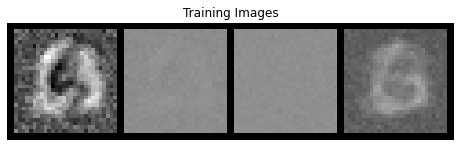

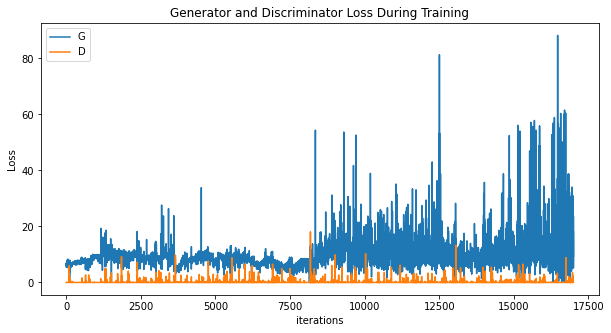

[0/3][17010/30000]	Loss_D: 0.0006	Loss_G: 10.9943	D(x): 1.0000	D(G(z)): 0.0006 / 0.0003
tensor([ 5.7142, -2.4039], grad_fn=<SliceBackward>) tensor([0.0013, 0.0158], grad_fn=<SliceBackward>)
tensor([0.1193, 0.1016], grad_fn=<SliceBackward>)
[0/3][17020/30000]	Loss_D: 0.0005	Loss_G: 11.5214	D(x): 1.0000	D(G(z)): 0.0005 / 0.0000
tensor([ 5.7132, -2.4007], grad_fn=<SliceBackward>) tensor([0.0013, 0.0158], grad_fn=<SliceBackward>)
tensor([0.1194, 0.1010], grad_fn=<SliceBackward>)
[0/3][17030/30000]	Loss_D: 0.0007	Loss_G: 9.7444	D(x): 1.0000	D(G(z)): 0.0007 / 0.0004
tensor([ 5.7123, -2.3981], grad_fn=<SliceBackward>) tensor([0.0013, 0.0158], grad_fn=<SliceBackward>)
tensor([0.1164, 0.0977], grad_fn=<SliceBackward>)
[0/3][17040/30000]	Loss_D: 0.0006	Loss_G: 7.0616	D(x): 1.0000	D(G(z)): 0.0006 / 0.0009
tensor([ 5.7115, -2.3959], grad_fn=<SliceBackward>) tensor([0.0013, 0.0158], grad_fn=<SliceBackward>)
tensor([0.1142, 0.0948], grad_fn=<SliceBackward>)
[0/3][17050/30000]	Loss_D: 0.0029	Loss_G: 

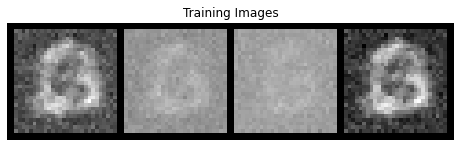

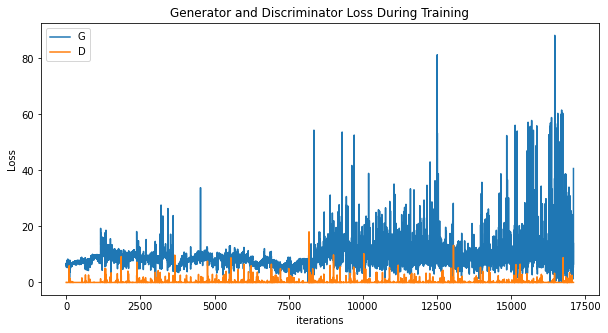

[0/3][17110/30000]	Loss_D: 0.0049	Loss_G: 6.3757	D(x): 1.0000	D(G(z)): 0.0049 / 0.0019
tensor([ 5.7011, -2.3796], grad_fn=<SliceBackward>) tensor([0.0008, 0.0154], grad_fn=<SliceBackward>)
tensor([0.1152, 0.0918], grad_fn=<SliceBackward>)
[0/3][17120/30000]	Loss_D: 0.1344	Loss_G: 13.6839	D(x): 1.0000	D(G(z)): 0.1241 / 0.0039
tensor([ 5.7009, -2.3793], grad_fn=<SliceBackward>) tensor([0.0009, 0.0155], grad_fn=<SliceBackward>)
tensor([0.1146, 0.0907], grad_fn=<SliceBackward>)
[0/3][17130/30000]	Loss_D: 0.0195	Loss_G: 16.4918	D(x): 0.9998	D(G(z)): 0.0191 / 0.0000
tensor([ 5.7045, -2.3892], grad_fn=<SliceBackward>) tensor([0.0019, 0.0163], grad_fn=<SliceBackward>)
tensor([0.1111, 0.0869], grad_fn=<SliceBackward>)
[0/3][17140/30000]	Loss_D: 0.0072	Loss_G: 7.9355	D(x): 1.0000	D(G(z)): 0.0072 / 0.0006
tensor([ 5.6985, -2.4112], grad_fn=<SliceBackward>) tensor([0.0019, 0.0163], grad_fn=<SliceBackward>)
tensor([0.1171, 0.0936], grad_fn=<SliceBackward>)
[0/3][17150/30000]	Loss_D: 0.0021	Loss_G: 

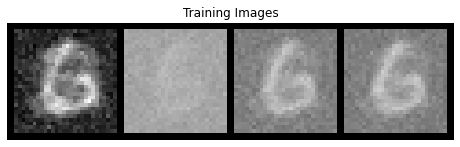

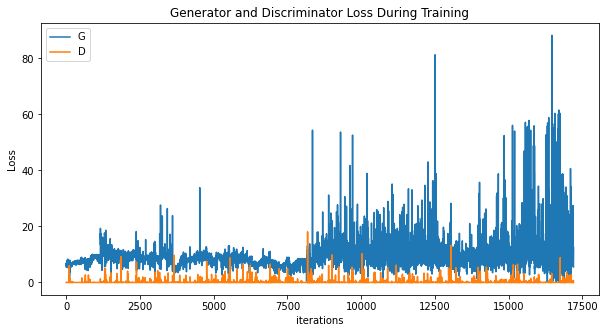

[0/3][17210/30000]	Loss_D: 0.0029	Loss_G: 8.5610	D(x): 1.0000	D(G(z)): 0.0029 / 0.0002
tensor([ 5.6089, -2.5051], grad_fn=<SliceBackward>) tensor([0.0005, 0.0149], grad_fn=<SliceBackward>)
tensor([0.0944, 0.0875], grad_fn=<SliceBackward>)
[0/3][17220/30000]	Loss_D: 0.0000	Loss_G: 15.0889	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 5.6148, -2.5202], grad_fn=<SliceBackward>) tensor([0.0006, 0.0151], grad_fn=<SliceBackward>)
tensor([0.0920, 0.0872], grad_fn=<SliceBackward>)
[0/3][17230/30000]	Loss_D: 0.0928	Loss_G: 11.9016	D(x): 1.0000	D(G(z)): 0.0881 / 0.0002
tensor([ 5.6143, -2.5413], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0837, 0.0852], grad_fn=<SliceBackward>)
[0/3][17240/30000]	Loss_D: 0.0012	Loss_G: 10.7866	D(x): 1.0000	D(G(z)): 0.0012 / 0.0000
tensor([ 5.6140, -2.5496], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0789, 0.0864], grad_fn=<SliceBackward>)
[0/3][17250/30000]	Loss_D: 0.0000	Los

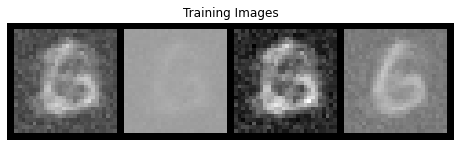

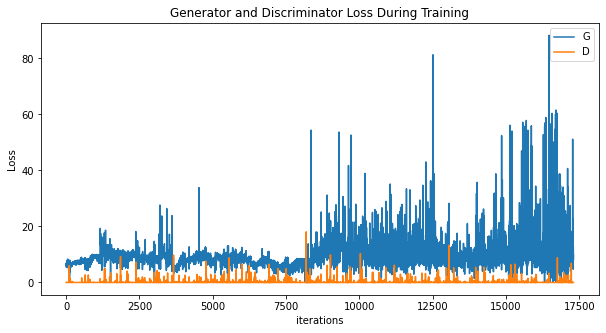

[0/3][17310/30000]	Loss_D: 0.0002	Loss_G: 6.6552	D(x): 1.0000	D(G(z)): 0.0002 / 0.0023
tensor([ 5.5995, -2.6415], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0144], grad_fn=<SliceBackward>)
tensor([0.0749, 0.0972], grad_fn=<SliceBackward>)
[0/3][17320/30000]	Loss_D: 0.0066	Loss_G: 11.0267	D(x): 1.0000	D(G(z)): 0.0065 / 0.0001
tensor([ 5.5957, -2.6553], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0144], grad_fn=<SliceBackward>)
tensor([0.0752, 0.0996], grad_fn=<SliceBackward>)
[0/3][17330/30000]	Loss_D: 0.0000	Loss_G: 6.9069	D(x): 1.0000	D(G(z)): 0.0000 / 0.0029
tensor([ 5.5923, -2.6662], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0144], grad_fn=<SliceBackward>)
tensor([0.0749, 0.1010], grad_fn=<SliceBackward>)
[0/3][17340/30000]	Loss_D: 0.0006	Loss_G: 12.4326	D(x): 0.9999	D(G(z)): 0.0005 / 0.0001
tensor([ 5.5901, -2.6760], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0144], grad_fn=<SliceBackward>)
tensor([0.0757, 0.1029], grad_fn=<SliceBackward>)
[0/3][17350/30000]	Loss_D: 0.0001	

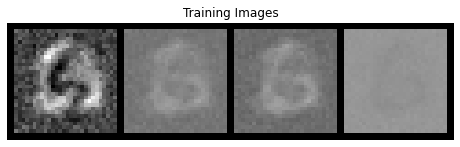

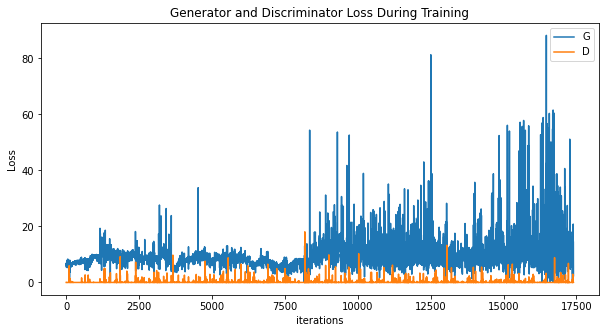

[0/3][17410/30000]	Loss_D: 0.0519	Loss_G: 4.7899	D(x): 1.0000	D(G(z)): 0.0496 / 0.0083
tensor([ 5.5855, -2.6588], grad_fn=<SliceBackward>) tensor([-0.0012,  0.0135], grad_fn=<SliceBackward>)
tensor([0.0585, 0.0930], grad_fn=<SliceBackward>)
[0/3][17420/30000]	Loss_D: 0.0923	Loss_G: 7.3826	D(x): 1.0000	D(G(z)): 0.0875 / 0.0007
tensor([ 5.5916, -2.6655], grad_fn=<SliceBackward>) tensor([-0.0009,  0.0138], grad_fn=<SliceBackward>)
tensor([0.0588, 0.0945], grad_fn=<SliceBackward>)
[0/3][17430/30000]	Loss_D: 0.0092	Loss_G: 8.9001	D(x): 1.0000	D(G(z)): 0.0091 / 0.0002
tensor([ 5.6021, -2.6658], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0139], grad_fn=<SliceBackward>)
tensor([0.0578, 0.0952], grad_fn=<SliceBackward>)
[0/3][17440/30000]	Loss_D: 0.0282	Loss_G: 6.4095	D(x): 1.0000	D(G(z)): 0.0278 / 0.0082
tensor([ 5.6053, -2.6631], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0139], grad_fn=<SliceBackward>)
tensor([0.0527, 0.0898], grad_fn=<SliceBackward>)
[0/3][17450/30000]	Loss_D: 0.0520	Lo

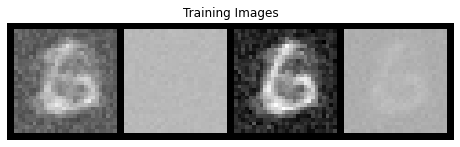

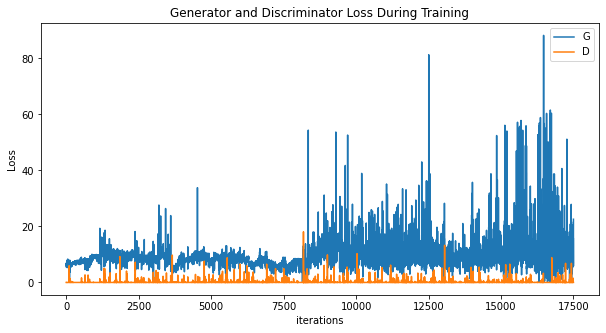

[0/3][17510/30000]	Loss_D: 0.0277	Loss_G: 3.7409	D(x): 1.0000	D(G(z)): 0.0272 / 0.0281
tensor([ 5.6046, -2.6584], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0138], grad_fn=<SliceBackward>)
tensor([0.0338, 0.0774], grad_fn=<SliceBackward>)
[0/3][17520/30000]	Loss_D: 0.0030	Loss_G: 8.5364	D(x): 0.9996	D(G(z)): 0.0025 / 0.0002
tensor([ 5.6038, -2.6628], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0146], grad_fn=<SliceBackward>)
tensor([0.0332, 0.0782], grad_fn=<SliceBackward>)
[0/3][17530/30000]	Loss_D: 0.0026	Loss_G: 6.2110	D(x): 1.0000	D(G(z)): 0.0026 / 0.0021
tensor([ 5.6037, -2.6629], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0147], grad_fn=<SliceBackward>)
tensor([0.0319, 0.0760], grad_fn=<SliceBackward>)
[0/3][17540/30000]	Loss_D: 0.0011	Loss_G: 6.8727	D(x): 1.0000	D(G(z)): 0.0011 / 0.0012
tensor([ 5.6035, -2.6631], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0147], grad_fn=<SliceBackward>)
tensor([0.0320, 0.0761], grad_fn=<SliceBackward>)
[0/3][17550/30000]	Loss_D: 0.1057	Lo

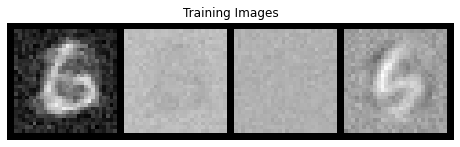

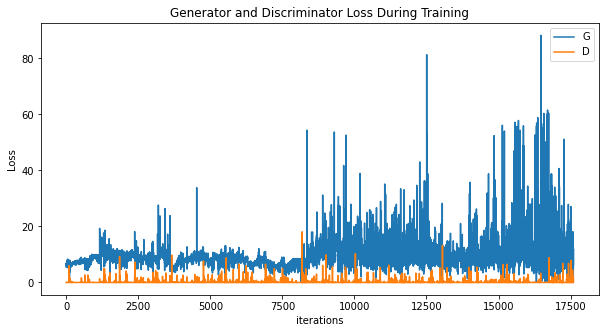

[0/3][17610/30000]	Loss_D: 1.4958	Loss_G: 7.0271	D(x): 0.5252	D(G(z)): 0.0014 / 0.0097
tensor([ 5.6005, -2.6687], grad_fn=<SliceBackward>) tensor([-0.0018,  0.0130], grad_fn=<SliceBackward>)
tensor([0.0198, 0.0636], grad_fn=<SliceBackward>)
[0/3][17620/30000]	Loss_D: 0.0796	Loss_G: 6.3019	D(x): 1.0000	D(G(z)): 0.0754 / 0.0038
tensor([ 5.6030, -2.6727], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0127], grad_fn=<SliceBackward>)
tensor([0.0174, 0.0607], grad_fn=<SliceBackward>)
[0/3][17630/30000]	Loss_D: 0.0549	Loss_G: 11.5206	D(x): 1.0000	D(G(z)): 0.0527 / 0.0000
tensor([ 5.6063, -2.6753], grad_fn=<SliceBackward>) tensor([-0.0021,  0.0127], grad_fn=<SliceBackward>)
tensor([0.0152, 0.0586], grad_fn=<SliceBackward>)
[0/3][17640/30000]	Loss_D: 0.0055	Loss_G: 8.6931	D(x): 1.0000	D(G(z)): 0.0055 / 0.0251
tensor([ 5.6104, -2.6766], grad_fn=<SliceBackward>) tensor([-0.0020,  0.0128], grad_fn=<SliceBackward>)
tensor([0.0136, 0.0592], grad_fn=<SliceBackward>)
[0/3][17650/30000]	Loss_D: 0.0055	L

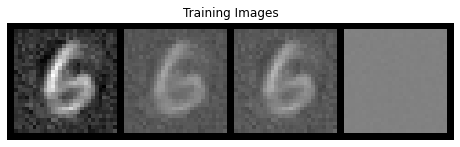

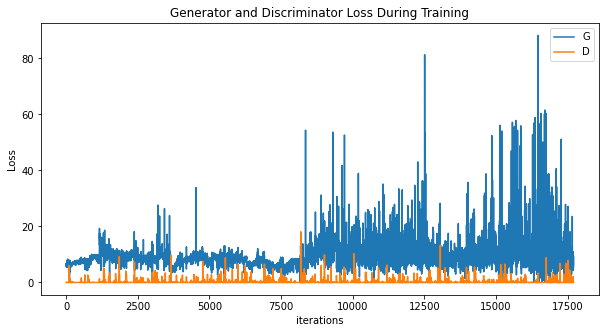

[0/3][17710/30000]	Loss_D: 0.0010	Loss_G: 7.0906	D(x): 0.9997	D(G(z)): 0.0007 / 0.0027
tensor([ 5.6156, -2.6858], grad_fn=<SliceBackward>) tensor([-0.0020,  0.0128], grad_fn=<SliceBackward>)
tensor([-0.0013,  0.0484], grad_fn=<SliceBackward>)
[0/3][17720/30000]	Loss_D: 0.0018	Loss_G: 8.8432	D(x): 1.0000	D(G(z)): 0.0018 / 0.0003
tensor([ 5.6156, -2.6850], grad_fn=<SliceBackward>) tensor([-0.0020,  0.0128], grad_fn=<SliceBackward>)
tensor([-0.0027,  0.0472], grad_fn=<SliceBackward>)
[0/3][17730/30000]	Loss_D: 0.0002	Loss_G: 6.1299	D(x): 1.0000	D(G(z)): 0.0002 / 0.0265
tensor([ 5.6155, -2.6841], grad_fn=<SliceBackward>) tensor([-0.0020,  0.0128], grad_fn=<SliceBackward>)
tensor([-0.0075,  0.0418], grad_fn=<SliceBackward>)
[0/3][17740/30000]	Loss_D: 0.0060	Loss_G: 8.6093	D(x): 0.9993	D(G(z)): 0.0053 / 0.0005
tensor([ 5.6172, -2.6824], grad_fn=<SliceBackward>) tensor([-0.0020,  0.0128], grad_fn=<SliceBackward>)
tensor([-0.0113,  0.0398], grad_fn=<SliceBackward>)
[0/3][17750/30000]	Loss_D: 0

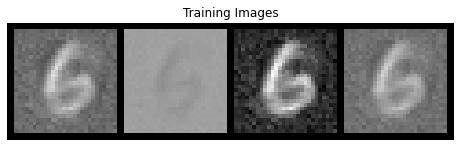

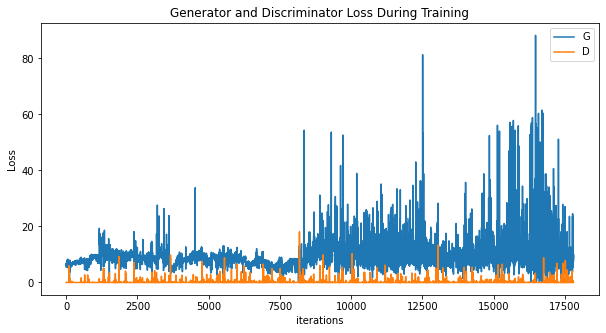

[0/3][17810/30000]	Loss_D: 0.0031	Loss_G: 10.3867	D(x): 1.0000	D(G(z)): 0.0031 / 0.0000
tensor([ 5.6777, -2.7010], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0125], grad_fn=<SliceBackward>)
tensor([-0.0171,  0.0383], grad_fn=<SliceBackward>)
[0/3][17820/30000]	Loss_D: 0.0143	Loss_G: 9.1497	D(x): 0.9925	D(G(z)): 0.0067 / 0.0003
tensor([ 5.7128, -2.7112], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0125], grad_fn=<SliceBackward>)
tensor([-0.0165,  0.0365], grad_fn=<SliceBackward>)
[0/3][17830/30000]	Loss_D: 0.0013	Loss_G: 9.5558	D(x): 1.0000	D(G(z)): 0.0013 / 0.0004
tensor([ 5.7353, -2.7071], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0125], grad_fn=<SliceBackward>)
tensor([-0.0172,  0.0356], grad_fn=<SliceBackward>)
[0/3][17840/30000]	Loss_D: 0.0028	Loss_G: 9.5054	D(x): 1.0000	D(G(z)): 0.0028 / 0.0005
tensor([ 5.7536, -2.6997], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0125], grad_fn=<SliceBackward>)
tensor([-0.0113,  0.0375], grad_fn=<SliceBackward>)
[0/3][17850/30000]	Loss_D: 

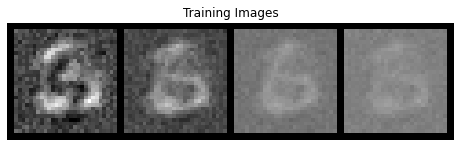

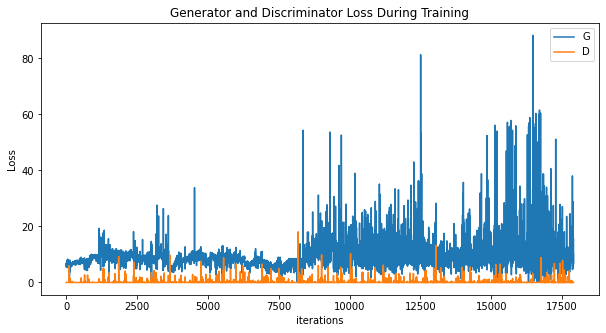

[0/3][17910/30000]	Loss_D: 0.0001	Loss_G: 4.9918	D(x): 1.0000	D(G(z)): 0.0001 / 0.0394
tensor([ 5.9378, -2.7213], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0123], grad_fn=<SliceBackward>)
tensor([0.0157, 0.0495], grad_fn=<SliceBackward>)
[0/3][17920/30000]	Loss_D: 0.0004	Loss_G: 11.6089	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 5.9568, -2.7200], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0123], grad_fn=<SliceBackward>)
tensor([0.0150, 0.0461], grad_fn=<SliceBackward>)
[0/3][17930/30000]	Loss_D: 0.0009	Loss_G: 11.6904	D(x): 1.0000	D(G(z)): 0.0009 / 0.0000
tensor([ 5.9557, -2.7160], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0123], grad_fn=<SliceBackward>)
tensor([0.0163, 0.0463], grad_fn=<SliceBackward>)
[0/3][17940/30000]	Loss_D: 0.0004	Loss_G: 11.8020	D(x): 1.0000	D(G(z)): 0.0004 / 0.0000
tensor([ 5.9547, -2.7130], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0123], grad_fn=<SliceBackward>)
tensor([0.0177, 0.0466], grad_fn=<SliceBackward>)
[0/3][17950/30000]	Loss_D: 0.0072

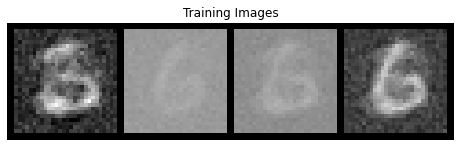

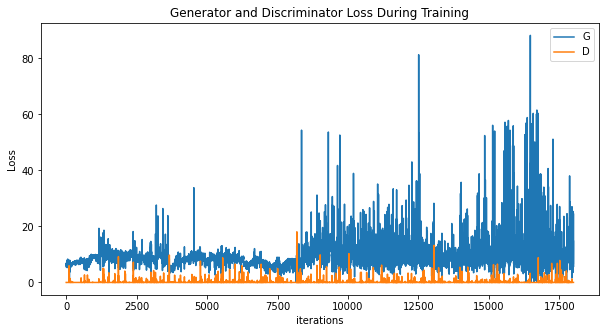

[0/3][18010/30000]	Loss_D: 0.0213	Loss_G: 18.8931	D(x): 0.9833	D(G(z)): 0.0043 / 0.0007
tensor([ 5.9460, -2.7025], grad_fn=<SliceBackward>) tensor([-0.0037,  0.0112], grad_fn=<SliceBackward>)
tensor([0.0399, 0.0681], grad_fn=<SliceBackward>)
[0/3][18020/30000]	Loss_D: 0.0061	Loss_G: 9.4816	D(x): 1.0000	D(G(z)): 0.0060 / 0.0028
tensor([ 5.9459, -2.7025], grad_fn=<SliceBackward>) tensor([-0.0036,  0.0112], grad_fn=<SliceBackward>)
tensor([0.0418, 0.0694], grad_fn=<SliceBackward>)
[0/3][18030/30000]	Loss_D: 0.0064	Loss_G: 10.1113	D(x): 1.0000	D(G(z)): 0.0064 / 0.0001
tensor([ 5.9469, -2.7030], grad_fn=<SliceBackward>) tensor([-0.0036,  0.0112], grad_fn=<SliceBackward>)
tensor([0.0431, 0.0711], grad_fn=<SliceBackward>)
[0/3][18040/30000]	Loss_D: 0.2093	Loss_G: 4.3515	D(x): 1.0000	D(G(z)): 0.1755 / 0.4923
tensor([ 5.9510, -2.7050], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0114], grad_fn=<SliceBackward>)
tensor([0.0443, 0.0716], grad_fn=<SliceBackward>)
[0/3][18050/30000]	Loss_D: 0.0003	

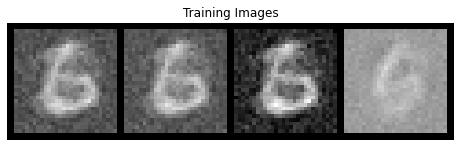

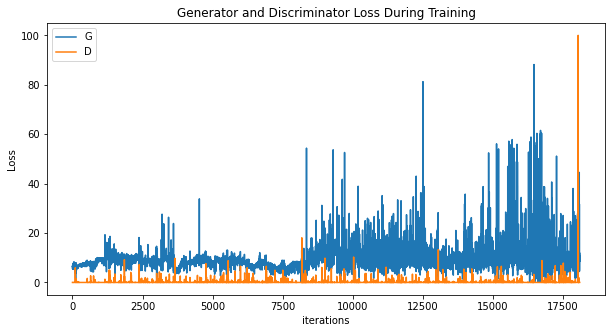

[0/3][18110/30000]	Loss_D: 0.0056	Loss_G: 11.8875	D(x): 1.0000	D(G(z)): 0.0056 / 0.0003
tensor([ 5.9474, -2.7036], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0487, 0.0705], grad_fn=<SliceBackward>)
[0/3][18120/30000]	Loss_D: 0.0383	Loss_G: 12.9276	D(x): 0.9717	D(G(z)): 0.0091 / 0.0000
tensor([ 5.9450, -2.7027], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0530, 0.0736], grad_fn=<SliceBackward>)
[0/3][18130/30000]	Loss_D: 0.0043	Loss_G: 8.8664	D(x): 1.0000	D(G(z)): 0.0042 / 0.0014
tensor([ 5.9423, -2.7021], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0140], grad_fn=<SliceBackward>)
tensor([0.0553, 0.0748], grad_fn=<SliceBackward>)
[0/3][18140/30000]	Loss_D: 0.0056	Loss_G: 12.8592	D(x): 1.0000	D(G(z)): 0.0056 / 0.0011
tensor([ 5.9394, -2.7012], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0140], grad_fn=<SliceBackward>)
tensor([0.0575, 0.0761], grad_fn=<SliceBackward>)
[0/3][18150/30000]	Loss_D: 0.0033

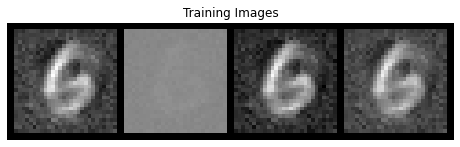

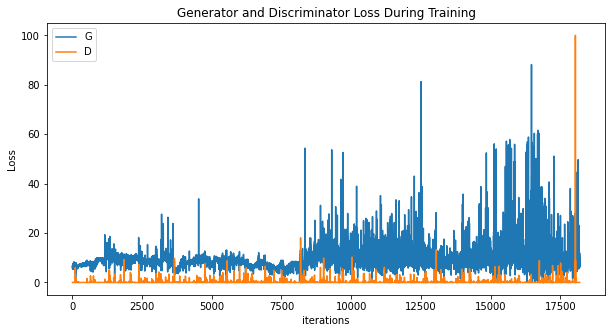

[0/3][18210/30000]	Loss_D: 0.0037	Loss_G: 8.7294	D(x): 0.9993	D(G(z)): 0.0030 / 0.0007
tensor([ 5.9177, -2.6921], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0518, 0.0652], grad_fn=<SliceBackward>)
[0/3][18220/30000]	Loss_D: 0.0004	Loss_G: 7.3849	D(x): 1.0000	D(G(z)): 0.0004 / 0.0007
tensor([ 5.9159, -2.6897], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0522, 0.0649], grad_fn=<SliceBackward>)
[0/3][18230/30000]	Loss_D: 0.0021	Loss_G: 9.6356	D(x): 1.0000	D(G(z)): 0.0021 / 0.0002
tensor([ 5.9149, -2.6873], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0495, 0.0598], grad_fn=<SliceBackward>)
[0/3][18240/30000]	Loss_D: 0.0003	Loss_G: 6.8552	D(x): 1.0000	D(G(z)): 0.0003 / 0.0012
tensor([ 5.9141, -2.6850], grad_fn=<SliceBackward>) tensor([-0.0002,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0495, 0.0581], grad_fn=<SliceBackward>)
[0/3][18250/30000]	Loss_D: 0.0015	Lo

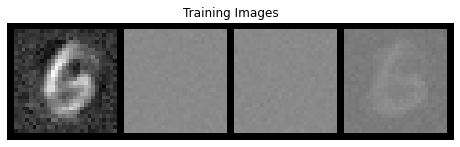

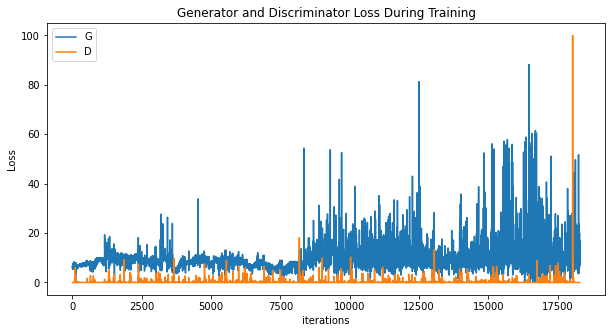

[0/3][18310/30000]	Loss_D: 0.0018	Loss_G: 14.5764	D(x): 1.0000	D(G(z)): 0.0018 / 0.0027
tensor([ 5.9028, -2.6723], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0527, 0.0540], grad_fn=<SliceBackward>)
[0/3][18320/30000]	Loss_D: 0.0024	Loss_G: 9.4978	D(x): 1.0000	D(G(z)): 0.0024 / 0.0003
tensor([ 5.8964, -2.6702], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0537, 0.0539], grad_fn=<SliceBackward>)
[0/3][18330/30000]	Loss_D: 0.0010	Loss_G: 6.7259	D(x): 1.0000	D(G(z)): 0.0010 / 0.0021
tensor([ 5.8891, -2.6677], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0577, 0.0576], grad_fn=<SliceBackward>)
[0/3][18340/30000]	Loss_D: 0.0021	Loss_G: 8.7046	D(x): 1.0000	D(G(z)): 0.0020 / 0.0091
tensor([ 5.8802, -2.6647], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0142], grad_fn=<SliceBackward>)
tensor([0.0560, 0.0546], grad_fn=<SliceBackward>)
[0/3][18350/30000]	Loss_D: 0.0042	L

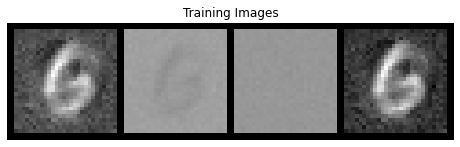

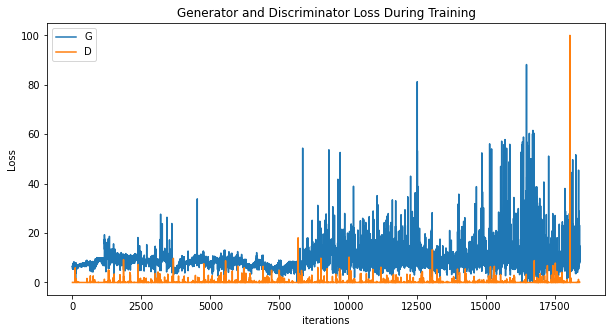

[0/3][18410/30000]	Loss_D: 0.0203	Loss_G: 7.8249	D(x): 1.0000	D(G(z)): 0.0199 / 0.0023
tensor([ 5.8621, -2.6561], grad_fn=<SliceBackward>) tensor([-0.0010,  0.0133], grad_fn=<SliceBackward>)
tensor([0.0283, 0.0323], grad_fn=<SliceBackward>)
[0/3][18420/30000]	Loss_D: 0.0000	Loss_G: 9.0184	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 5.8632, -2.6527], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0309, 0.0349], grad_fn=<SliceBackward>)
[0/3][18430/30000]	Loss_D: 0.0017	Loss_G: 8.8874	D(x): 1.0000	D(G(z)): 0.0017 / 0.0002
tensor([ 5.8627, -2.6517], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0139], grad_fn=<SliceBackward>)
tensor([0.0298, 0.0338], grad_fn=<SliceBackward>)
[0/3][18440/30000]	Loss_D: 0.0032	Loss_G: 7.0075	D(x): 1.0000	D(G(z)): 0.0032 / 0.0014
tensor([ 5.8602, -2.6533], grad_fn=<SliceBackward>) tensor([-0.0004,  0.0138], grad_fn=<SliceBackward>)
tensor([0.0295, 0.0332], grad_fn=<SliceBackward>)
[0/3][18450/30000]	Loss_D: 0.1740	Lo

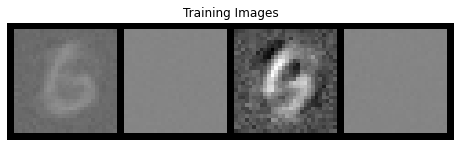

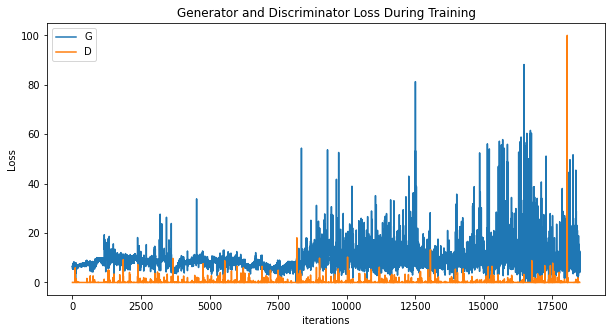

[0/3][18510/30000]	Loss_D: 0.0029	Loss_G: 10.2810	D(x): 1.0000	D(G(z)): 0.0029 / 0.0001
tensor([ 5.8673, -2.6850], grad_fn=<SliceBackward>) tensor([6.3604e-05, 1.4274e-02], grad_fn=<SliceBackward>)
tensor([0.0385, 0.0447], grad_fn=<SliceBackward>)
[0/3][18520/30000]	Loss_D: 0.0015	Loss_G: 9.3296	D(x): 1.0000	D(G(z)): 0.0015 / 0.0003
tensor([ 5.8715, -2.6858], grad_fn=<SliceBackward>) tensor([8.0171e-05, 1.4289e-02], grad_fn=<SliceBackward>)
tensor([0.0399, 0.0469], grad_fn=<SliceBackward>)
[0/3][18530/30000]	Loss_D: 0.0003	Loss_G: 10.0453	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
tensor([ 5.8762, -2.6862], grad_fn=<SliceBackward>) tensor([9.8232e-05, 1.4305e-02], grad_fn=<SliceBackward>)
tensor([0.0404, 0.0481], grad_fn=<SliceBackward>)
[0/3][18540/30000]	Loss_D: 0.0002	Loss_G: 13.3894	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 5.8807, -2.6863], grad_fn=<SliceBackward>) tensor([0.0001, 0.0143], grad_fn=<SliceBackward>)
tensor([0.0394, 0.0476], grad_fn=<SliceBackward>)
[0/3][18550/30000

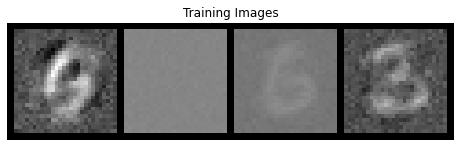

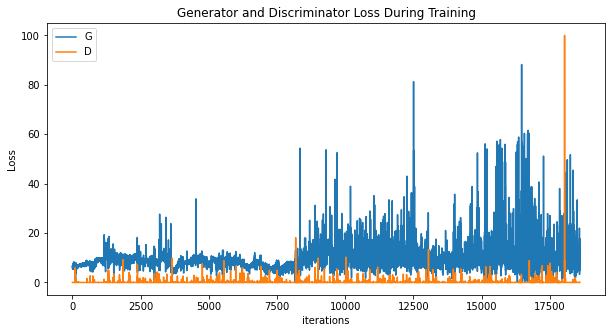

[0/3][18610/30000]	Loss_D: 0.0011	Loss_G: 5.9900	D(x): 0.9999	D(G(z)): 0.0010 / 0.0036
tensor([ 5.9129, -2.6770], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0234, 0.0391], grad_fn=<SliceBackward>)
[0/3][18620/30000]	Loss_D: 0.0094	Loss_G: 12.2168	D(x): 1.0000	D(G(z)): 0.0093 / 0.0000
tensor([ 5.9138, -2.6714], grad_fn=<SliceBackward>) tensor([-0.0001,  0.0141], grad_fn=<SliceBackward>)
tensor([0.0209, 0.0368], grad_fn=<SliceBackward>)
[0/3][18630/30000]	Loss_D: 0.0008	Loss_G: 10.6722	D(x): 1.0000	D(G(z)): 0.0008 / 0.0000
tensor([ 5.9127, -2.6644], grad_fn=<SliceBackward>) tensor([-7.2412e-05,  1.4117e-02], grad_fn=<SliceBackward>)
tensor([0.0203, 0.0361], grad_fn=<SliceBackward>)
[0/3][18640/30000]	Loss_D: 0.0211	Loss_G: 9.1045	D(x): 0.9806	D(G(z)): 0.0013 / 0.0022
tensor([ 5.9108, -2.6556], grad_fn=<SliceBackward>) tensor([-4.3624e-06,  1.4183e-02], grad_fn=<SliceBackward>)
tensor([0.0223, 0.0370], grad_fn=<SliceBackward>)
[0/3][18650/30000]

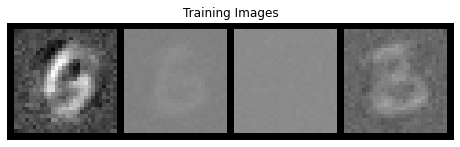

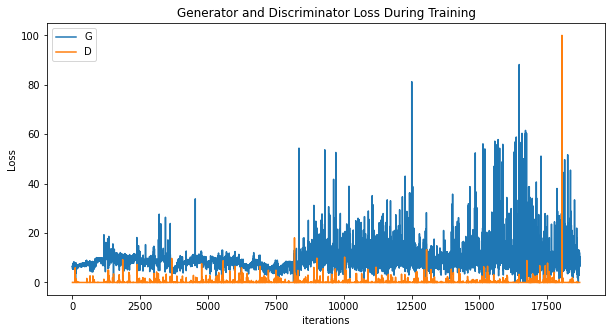

[0/3][18710/30000]	Loss_D: 0.0006	Loss_G: 17.2621	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 5.8900, -2.6183], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0136], grad_fn=<SliceBackward>)
tensor([0.0212, 0.0366], grad_fn=<SliceBackward>)
[0/3][18720/30000]	Loss_D: 0.0383	Loss_G: 5.4872	D(x): 1.0000	D(G(z)): 0.0375 / 0.0928
tensor([ 5.8899, -2.6219], grad_fn=<SliceBackward>) tensor([-0.0008,  0.0135], grad_fn=<SliceBackward>)
tensor([0.0192, 0.0342], grad_fn=<SliceBackward>)
[0/3][18730/30000]	Loss_D: 1.1691	Loss_G: 1.3758	D(x): 0.3107	D(G(z)): 0.0000 / 0.4360
tensor([ 5.8906, -2.6390], grad_fn=<SliceBackward>) tensor([0.0009, 0.0162], grad_fn=<SliceBackward>)
tensor([0.0186, 0.0328], grad_fn=<SliceBackward>)
[0/3][18740/30000]	Loss_D: 0.0113	Loss_G: 7.7301	D(x): 1.0000	D(G(z)): 0.0113 / 0.0005
tensor([ 5.8943, -2.6351], grad_fn=<SliceBackward>) tensor([0.0006, 0.0159], grad_fn=<SliceBackward>)
tensor([0.0184, 0.0328], grad_fn=<SliceBackward>)
[0/3][18750/30000]	Loss_D: 0.0188	Loss_

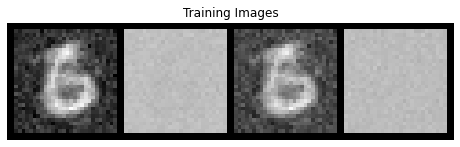

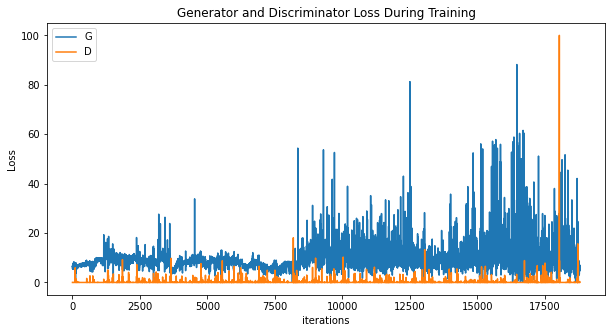

[0/3][18810/30000]	Loss_D: 0.0933	Loss_G: 5.0052	D(x): 1.0000	D(G(z)): 0.0883 / 0.0078
tensor([ 5.8952, -2.6257], grad_fn=<SliceBackward>) tensor([4.2313e-05, 1.5435e-02], grad_fn=<SliceBackward>)
tensor([0.0100, 0.0215], grad_fn=<SliceBackward>)
[0/3][18820/30000]	Loss_D: 0.0007	Loss_G: 3.7881	D(x): 1.0000	D(G(z)): 0.0007 / 0.1193
tensor([ 5.8952, -2.6241], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0151], grad_fn=<SliceBackward>)
tensor([0.0078, 0.0189], grad_fn=<SliceBackward>)
[0/3][18830/30000]	Loss_D: 0.0070	Loss_G: 7.3925	D(x): 1.0000	D(G(z)): 0.0070 / 0.0008
tensor([ 5.8954, -2.6242], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0151], grad_fn=<SliceBackward>)
tensor([0.0077, 0.0189], grad_fn=<SliceBackward>)
[0/3][18840/30000]	Loss_D: 0.0047	Loss_G: 8.1050	D(x): 1.0000	D(G(z)): 0.0047 / 0.0003
tensor([ 5.8960, -2.6248], grad_fn=<SliceBackward>) tensor([-0.0003,  0.0152], grad_fn=<SliceBackward>)
tensor([0.0068, 0.0178], grad_fn=<SliceBackward>)
[0/3][18850/30000]	Loss_D: 0.0

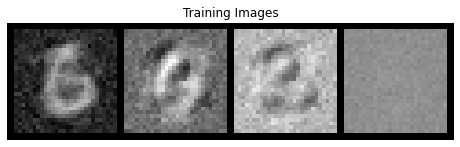

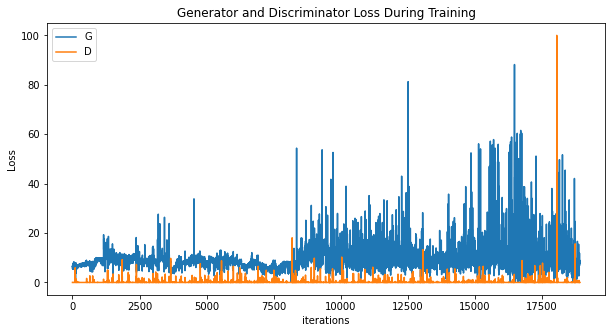

[0/3][18910/30000]	Loss_D: 0.0043	Loss_G: 7.4860	D(x): 1.0000	D(G(z)): 0.0043 / 0.0040
tensor([ 5.9193, -2.6450], grad_fn=<SliceBackward>) tensor([-0.0007,  0.0148], grad_fn=<SliceBackward>)
tensor([0.0033, 0.0129], grad_fn=<SliceBackward>)
[0/3][18920/30000]	Loss_D: 0.0048	Loss_G: 8.8765	D(x): 0.9999	D(G(z)): 0.0046 / 0.0002
tensor([ 5.9158, -2.6444], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0148], grad_fn=<SliceBackward>)
tensor([0.0024, 0.0120], grad_fn=<SliceBackward>)
[0/3][18930/30000]	Loss_D: 0.0372	Loss_G: 10.6401	D(x): 1.0000	D(G(z)): 0.0360 / 0.0001
tensor([ 5.9092, -2.6425], grad_fn=<SliceBackward>) tensor([-0.0006,  0.0149], grad_fn=<SliceBackward>)
tensor([0.0037, 0.0127], grad_fn=<SliceBackward>)
[0/3][18940/30000]	Loss_D: 0.0085	Loss_G: 8.2146	D(x): 1.0000	D(G(z)): 0.0084 / 0.0007
tensor([ 5.9032, -2.6408], grad_fn=<SliceBackward>) tensor([-0.0005,  0.0149], grad_fn=<SliceBackward>)
tensor([0.0034, 0.0126], grad_fn=<SliceBackward>)
[0/3][18950/30000]	Loss_D: 0.0021	L

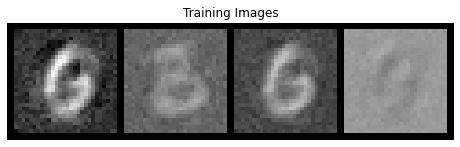

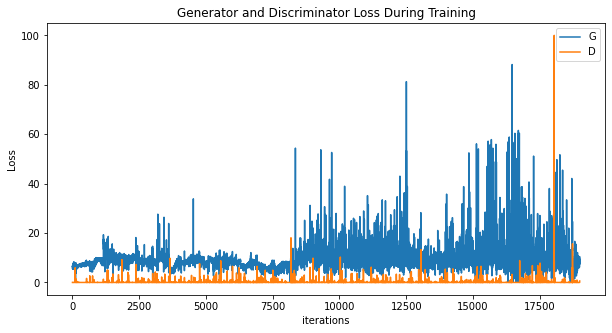

[0/3][19010/30000]	Loss_D: 0.0117	Loss_G: 6.8849	D(x): 0.9999	D(G(z)): 0.0116 / 0.0027
tensor([ 5.8974, -2.6347], grad_fn=<SliceBackward>) tensor([-0.0011,  0.0144], grad_fn=<SliceBackward>)
tensor([-0.0008,  0.0052], grad_fn=<SliceBackward>)
[0/3][19020/30000]	Loss_D: 0.1539	Loss_G: 12.5005	D(x): 0.8678	D(G(z)): 0.0003 / 0.0000
tensor([ 5.8964, -2.6329], grad_fn=<SliceBackward>) tensor([-0.0009,  0.0147], grad_fn=<SliceBackward>)
tensor([-0.0045,  0.0007], grad_fn=<SliceBackward>)
[0/3][19030/30000]	Loss_D: 0.0013	Loss_G: 7.8092	D(x): 1.0000	D(G(z)): 0.0013 / 0.0004
tensor([ 5.8971, -2.6323], grad_fn=<SliceBackward>) tensor([-0.0010,  0.0146], grad_fn=<SliceBackward>)
tensor([-0.0069, -0.0013], grad_fn=<SliceBackward>)
[0/3][19040/30000]	Loss_D: 0.0014	Loss_G: 7.5861	D(x): 1.0000	D(G(z)): 0.0014 / 0.0005
tensor([ 5.8980, -2.6320], grad_fn=<SliceBackward>) tensor([-0.0012,  0.0144], grad_fn=<SliceBackward>)
tensor([-0.0072, -0.0022], grad_fn=<SliceBackward>)
[0/3][19050/30000]	Loss_D: 

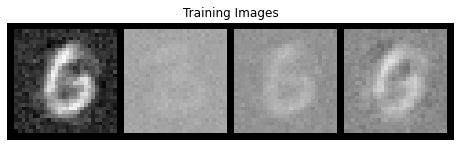

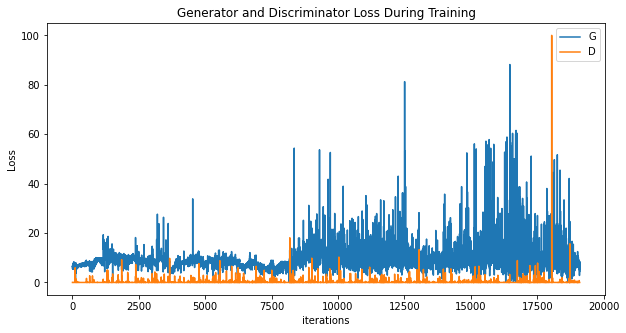

[0/3][19110/30000]	Loss_D: 0.0023	Loss_G: 5.4443	D(x): 1.0000	D(G(z)): 0.0023 / 0.0043
tensor([ 5.9087, -2.6349], grad_fn=<SliceBackward>) tensor([-0.0014,  0.0142], grad_fn=<SliceBackward>)
tensor([-0.0093, -0.0068], grad_fn=<SliceBackward>)
[0/3][19120/30000]	Loss_D: 0.0081	Loss_G: 6.8284	D(x): 1.0000	D(G(z)): 0.0081 / 0.0024
tensor([ 5.9127, -2.6370], grad_fn=<SliceBackward>) tensor([-0.0014,  0.0142], grad_fn=<SliceBackward>)
tensor([-0.0104, -0.0088], grad_fn=<SliceBackward>)
[0/3][19130/30000]	Loss_D: 0.0062	Loss_G: 5.3445	D(x): 1.0000	D(G(z)): 0.0062 / 0.0064
tensor([ 5.9197, -2.6411], grad_fn=<SliceBackward>) tensor([-0.0014,  0.0142], grad_fn=<SliceBackward>)
tensor([-0.0102, -0.0092], grad_fn=<SliceBackward>)
[0/3][19140/30000]	Loss_D: 0.0002	Loss_G: 10.4825	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 5.9373, -2.6488], grad_fn=<SliceBackward>) tensor([0.0005, 0.0159], grad_fn=<SliceBackward>)
tensor([-0.0089, -0.0080], grad_fn=<SliceBackward>)
[0/3][19150/30000]	Loss_D: 0.

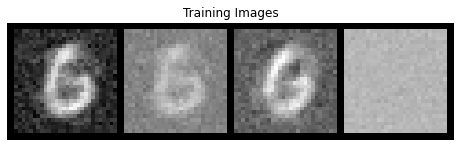

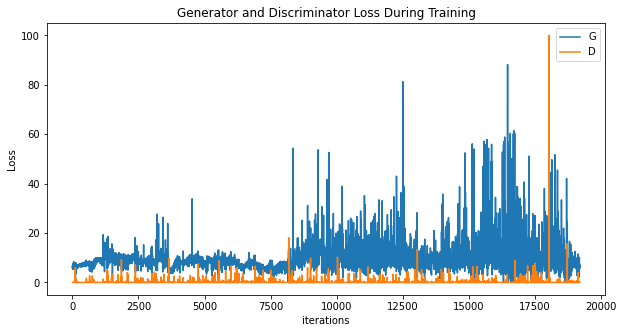

[0/3][19210/30000]	Loss_D: 0.0125	Loss_G: 7.3133	D(x): 1.0000	D(G(z)): 0.0124 / 0.0007
tensor([ 5.9405, -2.6956], grad_fn=<SliceBackward>) tensor([0.0007, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0110, -0.0075], grad_fn=<SliceBackward>)
[0/3][19220/30000]	Loss_D: 0.0021	Loss_G: 7.1960	D(x): 1.0000	D(G(z)): 0.0021 / 0.0008
tensor([ 5.9426, -2.6999], grad_fn=<SliceBackward>) tensor([0.0008, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0115, -0.0072], grad_fn=<SliceBackward>)
[0/3][19230/30000]	Loss_D: 0.0045	Loss_G: 6.6609	D(x): 1.0000	D(G(z)): 0.0045 / 0.0013
tensor([ 5.9433, -2.7054], grad_fn=<SliceBackward>) tensor([0.0008, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0108, -0.0052], grad_fn=<SliceBackward>)
[0/3][19240/30000]	Loss_D: 0.0072	Loss_G: 6.0369	D(x): 1.0000	D(G(z)): 0.0071 / 0.0024
tensor([ 5.9435, -2.7118], grad_fn=<SliceBackward>) tensor([0.0008, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0100, -0.0035], grad_fn=<SliceBackward>)
[0/3][19250/30000]	Loss_D: 0.0058	Lo

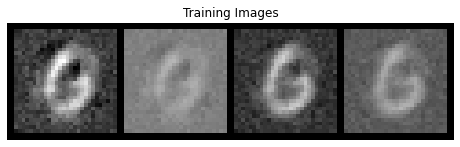

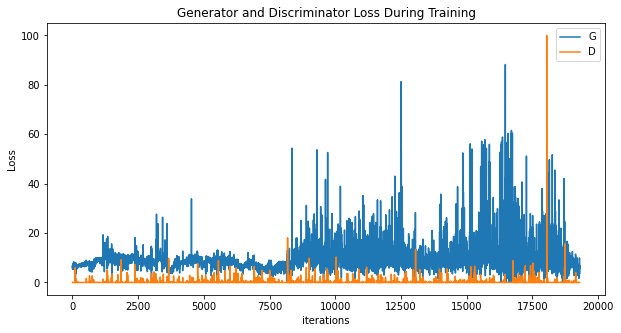

[0/3][19310/30000]	Loss_D: 0.0060	Loss_G: 5.4516	D(x): 1.0000	D(G(z)): 0.0059 / 0.0079
tensor([ 5.9437, -2.7867], grad_fn=<SliceBackward>) tensor([0.0006, 0.0159], grad_fn=<SliceBackward>)
tensor([-0.0102, -0.0007], grad_fn=<SliceBackward>)
[0/3][19320/30000]	Loss_D: 0.0118	Loss_G: 5.0732	D(x): 1.0000	D(G(z)): 0.0117 / 0.0064
tensor([ 5.9563, -2.7965], grad_fn=<SliceBackward>) tensor([0.0006, 0.0159], grad_fn=<SliceBackward>)
tensor([-0.0113, -0.0008], grad_fn=<SliceBackward>)
[0/3][19330/30000]	Loss_D: 0.0025	Loss_G: 6.7242	D(x): 1.0000	D(G(z)): 0.0025 / 0.0012
tensor([ 5.9699, -2.8054], grad_fn=<SliceBackward>) tensor([0.0006, 0.0160], grad_fn=<SliceBackward>)
tensor([-0.0109, -0.0002], grad_fn=<SliceBackward>)
[0/3][19340/30000]	Loss_D: 0.0019	Loss_G: 6.3440	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
tensor([ 5.9833, -2.8124], grad_fn=<SliceBackward>) tensor([0.0007, 0.0160], grad_fn=<SliceBackward>)
tensor([-0.0108,  0.0012], grad_fn=<SliceBackward>)
[0/3][19350/30000]	Loss_D: 0.0107	Lo

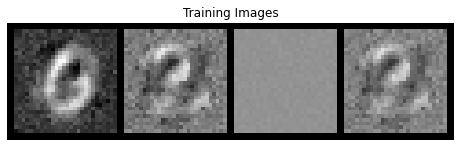

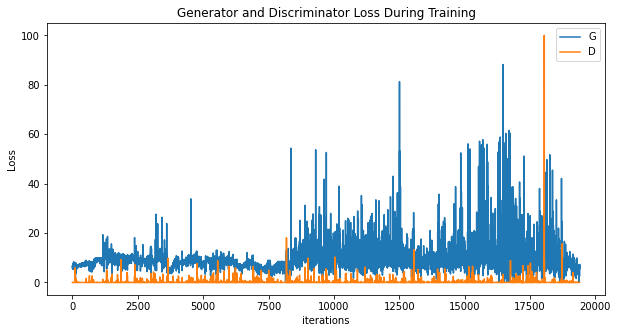

[0/3][19410/30000]	Loss_D: 0.0096	Loss_G: 4.2142	D(x): 1.0000	D(G(z)): 0.0095 / 0.0148
tensor([ 6.0611, -2.8752], grad_fn=<SliceBackward>) tensor([0.0008, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0044,  0.0123], grad_fn=<SliceBackward>)
[0/3][19420/30000]	Loss_D: 0.0086	Loss_G: 6.7778	D(x): 0.9978	D(G(z)): 0.0064 / 0.0012
tensor([ 6.0642, -2.8940], grad_fn=<SliceBackward>) tensor([0.0009, 0.0162], grad_fn=<SliceBackward>)
tensor([-0.0027,  0.0147], grad_fn=<SliceBackward>)
[0/3][19430/30000]	Loss_D: 0.0035	Loss_G: 6.2752	D(x): 1.0000	D(G(z)): 0.0035 / 0.0019
tensor([ 6.0666, -2.9131], grad_fn=<SliceBackward>) tensor([0.0009, 0.0162], grad_fn=<SliceBackward>)
tensor([-0.0008,  0.0180], grad_fn=<SliceBackward>)
[0/3][19440/30000]	Loss_D: 0.0122	Loss_G: 6.0751	D(x): 1.0000	D(G(z)): 0.0121 / 0.0023
tensor([ 6.0694, -2.9327], grad_fn=<SliceBackward>) tensor([0.0009, 0.0162], grad_fn=<SliceBackward>)
tensor([0.0021, 0.0208], grad_fn=<SliceBackward>)
[0/3][19450/30000]	Loss_D: 0.0015	Loss

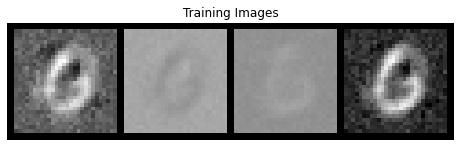

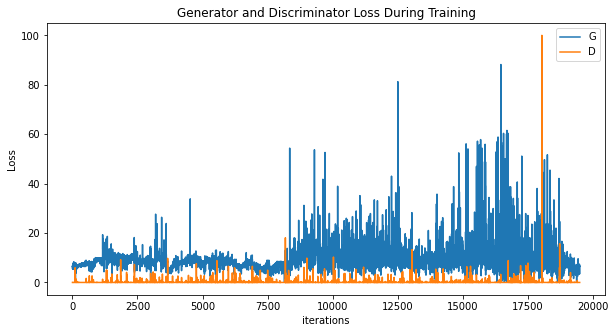

[0/3][19510/30000]	Loss_D: 0.0041	Loss_G: 5.1670	D(x): 1.0000	D(G(z)): 0.0041 / 0.0164
tensor([ 6.1082, -3.0680], grad_fn=<SliceBackward>) tensor([0.0010, 0.0163], grad_fn=<SliceBackward>)
tensor([0.0171, 0.0416], grad_fn=<SliceBackward>)
[0/3][19520/30000]	Loss_D: 0.8222	Loss_G: 5.9534	D(x): 0.5966	D(G(z)): 0.0003 / 0.0034
tensor([ 6.1215, -3.0917], grad_fn=<SliceBackward>) tensor([0.0010, 0.0163], grad_fn=<SliceBackward>)
tensor([0.0227, 0.0458], grad_fn=<SliceBackward>)
[0/3][19530/30000]	Loss_D: 0.0020	Loss_G: 5.9422	D(x): 1.0000	D(G(z)): 0.0020 / 0.0027
tensor([ 6.1032, -3.1011], grad_fn=<SliceBackward>) tensor([0.0012, 0.0165], grad_fn=<SliceBackward>)
tensor([0.0234, 0.0472], grad_fn=<SliceBackward>)
[0/3][19540/30000]	Loss_D: 0.0666	Loss_G: 4.9126	D(x): 1.0000	D(G(z)): 0.0631 / 0.0109
tensor([ 6.0900, -3.1009], grad_fn=<SliceBackward>) tensor([0.0013, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0241, 0.0484], grad_fn=<SliceBackward>)
[0/3][19550/30000]	Loss_D: 6.2320	Loss_G: 6.

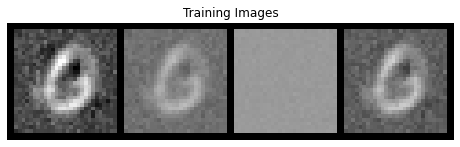

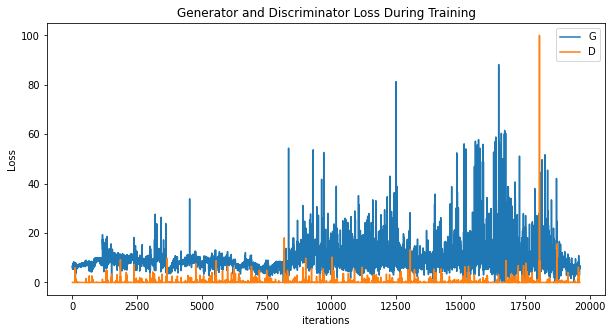

[0/3][19610/30000]	Loss_D: 0.0005	Loss_G: 4.2984	D(x): 1.0000	D(G(z)): 0.0005 / 0.0542
tensor([ 6.0788, -3.1171], grad_fn=<SliceBackward>) tensor([-6.8354e-05,  1.5524e-02], grad_fn=<SliceBackward>)
tensor([0.0199, 0.0398], grad_fn=<SliceBackward>)
[0/3][19620/30000]	Loss_D: 0.0050	Loss_G: 3.2621	D(x): 1.0000	D(G(z)): 0.0050 / 0.4320
tensor([ 6.0780, -3.1161], grad_fn=<SliceBackward>) tensor([-6.4709e-05,  1.5528e-02], grad_fn=<SliceBackward>)
tensor([0.0183, 0.0384], grad_fn=<SliceBackward>)
[0/3][19630/30000]	Loss_D: 0.0020	Loss_G: 6.1571	D(x): 1.0000	D(G(z)): 0.0020 / 0.0030
tensor([ 6.0773, -3.1154], grad_fn=<SliceBackward>) tensor([-6.1213e-05,  1.5532e-02], grad_fn=<SliceBackward>)
tensor([0.0169, 0.0370], grad_fn=<SliceBackward>)
[0/3][19640/30000]	Loss_D: 0.0026	Loss_G: 2.2146	D(x): 1.0000	D(G(z)): 0.0026 / 0.1311
tensor([ 6.0769, -3.1150], grad_fn=<SliceBackward>) tensor([-5.7723e-05,  1.5535e-02], grad_fn=<SliceBackward>)
tensor([0.0162, 0.0367], grad_fn=<SliceBackward>)
[0/3

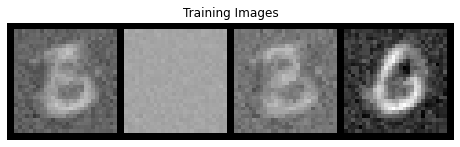

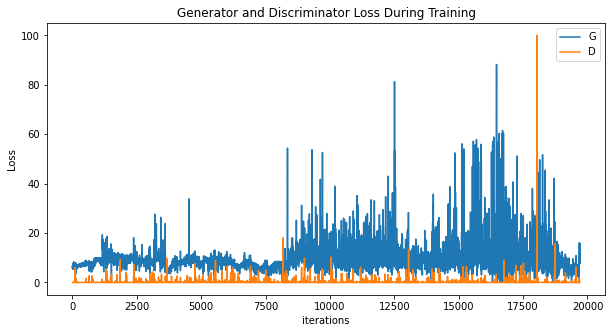

[0/3][19710/30000]	Loss_D: 0.0000	Loss_G: 55.9331	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.1684, -3.1509], grad_fn=<SliceBackward>) tensor([1.8623e-05, 1.5513e-02], grad_fn=<SliceBackward>)
tensor([0.0219, 0.0475], grad_fn=<SliceBackward>)
[0/3][19720/30000]	Loss_D: 0.0009	Loss_G: 12.4749	D(x): 1.0000	D(G(z)): 0.0009 / 0.0000
tensor([ 6.1703, -3.1394], grad_fn=<SliceBackward>) tensor([0.0001, 0.0156], grad_fn=<SliceBackward>)
tensor([0.0176, 0.0442], grad_fn=<SliceBackward>)
[0/3][19730/30000]	Loss_D: 0.0058	Loss_G: 8.1170	D(x): 1.0000	D(G(z)): 0.0058 / 0.0016
tensor([ 6.1744, -3.1344], grad_fn=<SliceBackward>) tensor([0.0002, 0.0157], grad_fn=<SliceBackward>)
tensor([0.0072, 0.0359], grad_fn=<SliceBackward>)
[0/3][19740/30000]	Loss_D: 0.0108	Loss_G: 16.4793	D(x): 1.0000	D(G(z)): 0.0108 / 0.0004
tensor([ 6.1786, -3.1292], grad_fn=<SliceBackward>) tensor([0.0002, 0.0157], grad_fn=<SliceBackward>)
tensor([0.0085, 0.0384], grad_fn=<SliceBackward>)
[0/3][19750/30000]	Loss_D: 0.0040

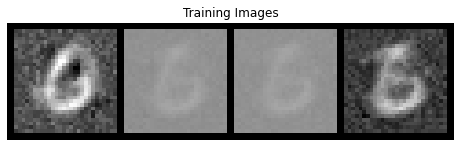

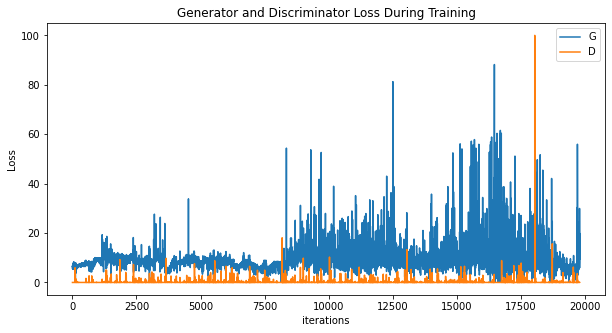

[0/3][19810/30000]	Loss_D: 0.0017	Loss_G: 13.2358	D(x): 1.0000	D(G(z)): 0.0017 / 0.0005
tensor([ 6.2430, -3.0612], grad_fn=<SliceBackward>) tensor([0.0007, 0.0161], grad_fn=<SliceBackward>)
tensor([-0.0008,  0.0436], grad_fn=<SliceBackward>)
[0/3][19820/30000]	Loss_D: 0.0264	Loss_G: 11.8946	D(x): 1.0000	D(G(z)): 0.0259 / 0.0004
tensor([ 6.2710, -3.0438], grad_fn=<SliceBackward>) tensor([0.0005, 0.0160], grad_fn=<SliceBackward>)
tensor([0.0056, 0.0501], grad_fn=<SliceBackward>)
[0/3][19830/30000]	Loss_D: 0.0006	Loss_G: 24.0439	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 6.3075, -3.0202], grad_fn=<SliceBackward>) tensor([0.0006, 0.0161], grad_fn=<SliceBackward>)
tensor([0.0090, 0.0580], grad_fn=<SliceBackward>)
[0/3][19840/30000]	Loss_D: 0.0005	Loss_G: 16.8112	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 6.3422, -2.9910], grad_fn=<SliceBackward>) tensor([0.0010, 0.0164], grad_fn=<SliceBackward>)
tensor([0.0091, 0.0595], grad_fn=<SliceBackward>)
[0/3][19850/30000]	Loss_D: 0.0257	Loss

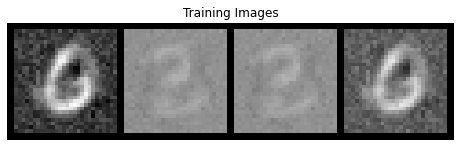

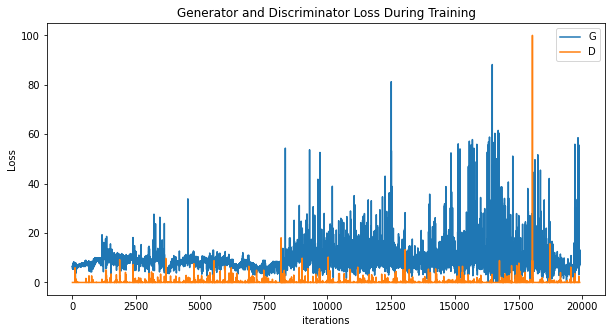

[0/3][19910/30000]	Loss_D: 0.0055	Loss_G: 10.9236	D(x): 1.0000	D(G(z)): 0.0055 / 0.0012
tensor([ 6.4478, -2.8763], grad_fn=<SliceBackward>) tensor([0.0013, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0217, 0.0837], grad_fn=<SliceBackward>)
[0/3][19920/30000]	Loss_D: 0.0119	Loss_G: 14.2342	D(x): 1.0000	D(G(z)): 0.0118 / 0.0549
tensor([ 6.4479, -2.8763], grad_fn=<SliceBackward>) tensor([0.0013, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0034, 0.0680], grad_fn=<SliceBackward>)
[0/3][19930/30000]	Loss_D: 0.0045	Loss_G: 7.9893	D(x): 1.0000	D(G(z)): 0.0044 / 0.0005
tensor([ 6.4498, -2.8796], grad_fn=<SliceBackward>) tensor([0.0014, 0.0167], grad_fn=<SliceBackward>)
tensor([0.0002, 0.0642], grad_fn=<SliceBackward>)
[0/3][19940/30000]	Loss_D: 0.0002	Loss_G: 12.1231	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
tensor([ 6.4715, -2.8805], grad_fn=<SliceBackward>) tensor([0.0017, 0.0171], grad_fn=<SliceBackward>)
tensor([0.0009, 0.0647], grad_fn=<SliceBackward>)
[0/3][19950/30000]	Loss_D: 0.0046	Loss_G:

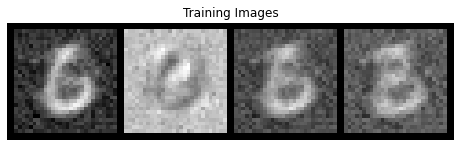

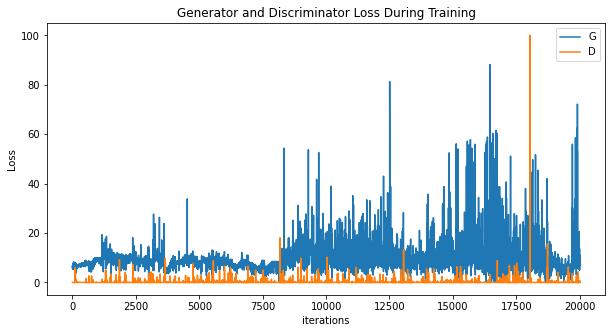

[0/3][20010/30000]	Loss_D: 0.0465	Loss_G: 7.2198	D(x): 1.0000	D(G(z)): 0.0453 / 0.0008
tensor([ 6.6375, -2.7561], grad_fn=<SliceBackward>) tensor([0.0014, 0.0168], grad_fn=<SliceBackward>)
tensor([-0.0029,  0.0559], grad_fn=<SliceBackward>)
[0/3][20020/30000]	Loss_D: 0.0145	Loss_G: 6.7832	D(x): 0.9908	D(G(z)): 0.0052 / 0.0011
tensor([ 6.6643, -2.7366], grad_fn=<SliceBackward>) tensor([0.0015, 0.0168], grad_fn=<SliceBackward>)
tensor([-0.0039,  0.0530], grad_fn=<SliceBackward>)
[0/3][20030/30000]	Loss_D: 0.0000	Loss_G: 11.6661	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 6.6889, -2.7135], grad_fn=<SliceBackward>) tensor([0.0016, 0.0169], grad_fn=<SliceBackward>)
tensor([-0.0010,  0.0566], grad_fn=<SliceBackward>)
[0/3][20040/30000]	Loss_D: 0.0015	Loss_G: 22.9156	D(x): 1.0000	D(G(z)): 0.0015 / 0.0003
tensor([ 6.7140, -2.6897], grad_fn=<SliceBackward>) tensor([0.0016, 0.0169], grad_fn=<SliceBackward>)
tensor([-0.0008,  0.0584], grad_fn=<SliceBackward>)
[0/3][20050/30000]	Loss_D: 0.0022	

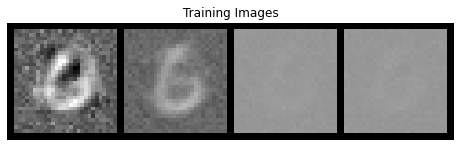

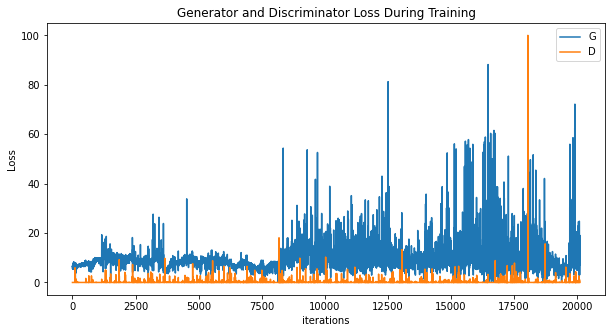

[0/3][20110/30000]	Loss_D: 0.0057	Loss_G: 5.7285	D(x): 1.0000	D(G(z)): 0.0057 / 0.0045
tensor([ 6.7890, -2.5950], grad_fn=<SliceBackward>) tensor([0.0014, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0080, 0.0629], grad_fn=<SliceBackward>)
[0/3][20120/30000]	Loss_D: 0.0232	Loss_G: 9.4184	D(x): 1.0000	D(G(z)): 0.0230 / 0.0013
tensor([ 6.7890, -2.5943], grad_fn=<SliceBackward>) tensor([0.0015, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0080, 0.0617], grad_fn=<SliceBackward>)
[0/3][20130/30000]	Loss_D: 0.0023	Loss_G: 6.8229	D(x): 1.0000	D(G(z)): 0.0023 / 0.0012
tensor([ 6.7890, -2.5935], grad_fn=<SliceBackward>) tensor([0.0015, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0080, 0.0607], grad_fn=<SliceBackward>)
[0/3][20140/30000]	Loss_D: 0.0050	Loss_G: 11.5602	D(x): 1.0000	D(G(z)): 0.0050 / 0.0004
tensor([ 6.7891, -2.5925], grad_fn=<SliceBackward>) tensor([0.0015, 0.0166], grad_fn=<SliceBackward>)
tensor([0.0094, 0.0613], grad_fn=<SliceBackward>)
[0/3][20150/30000]	Loss_D: 0.0074	Loss_G: 1

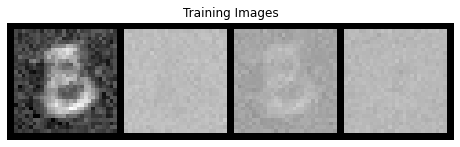

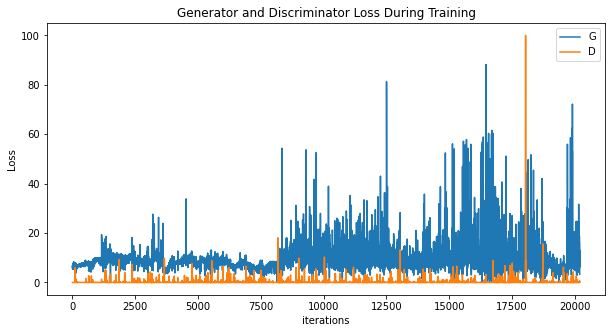

[0/3][20210/30000]	Loss_D: 0.1620	Loss_G: 6.2668	D(x): 1.0000	D(G(z)): 0.1425 / 0.0019
tensor([ 6.7953, -2.5905], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0130], grad_fn=<SliceBackward>)
tensor([0.0207, 0.0673], grad_fn=<SliceBackward>)
[0/3][20220/30000]	Loss_D: 0.0039	Loss_G: 11.1762	D(x): 1.0000	D(G(z)): 0.0039 / 0.0004
tensor([ 6.8068, -2.6098], grad_fn=<SliceBackward>) tensor([-0.0022,  0.0132], grad_fn=<SliceBackward>)
tensor([0.0203, 0.0668], grad_fn=<SliceBackward>)
[0/3][20230/30000]	Loss_D: 0.0020	Loss_G: 7.8287	D(x): 1.0000	D(G(z)): 0.0020 / 0.0004
tensor([ 6.8119, -2.6156], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0130], grad_fn=<SliceBackward>)
tensor([0.0231, 0.0696], grad_fn=<SliceBackward>)
[0/3][20240/30000]	Loss_D: 0.0066	Loss_G: 9.3097	D(x): 1.0000	D(G(z)): 0.0066 / 0.0003
tensor([ 6.8119, -2.6158], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0130], grad_fn=<SliceBackward>)
tensor([0.0302, 0.0754], grad_fn=<SliceBackward>)
[0/3][20250/30000]	Loss_D: 0.0036	L

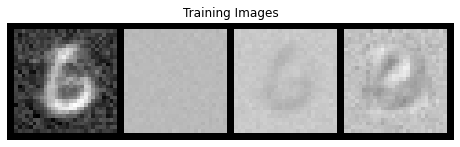

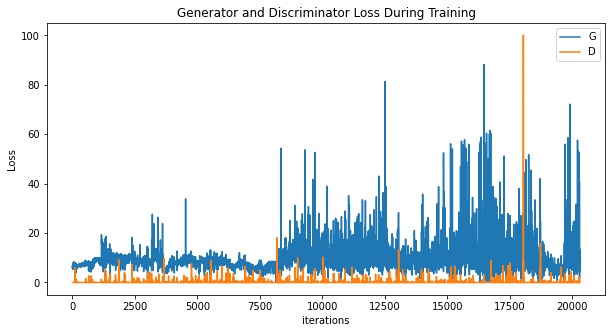

[0/3][20310/30000]	Loss_D: 0.0051	Loss_G: 10.3114	D(x): 1.0000	D(G(z)): 0.0051 / 0.0067
tensor([ 6.8232, -2.6159], grad_fn=<SliceBackward>) tensor([-0.0036,  0.0119], grad_fn=<SliceBackward>)
tensor([0.0462, 0.0831], grad_fn=<SliceBackward>)
[0/3][20320/30000]	Loss_D: 0.0034	Loss_G: 12.1172	D(x): 1.0000	D(G(z)): 0.0033 / 0.0001
tensor([ 6.8374, -2.6191], grad_fn=<SliceBackward>) tensor([-0.0028,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0479, 0.0864], grad_fn=<SliceBackward>)
[0/3][20330/30000]	Loss_D: 0.0001	Loss_G: 9.2253	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
tensor([ 6.8498, -2.5978], grad_fn=<SliceBackward>) tensor([-0.0023,  0.0130], grad_fn=<SliceBackward>)
tensor([0.0484, 0.0884], grad_fn=<SliceBackward>)
[0/3][20340/30000]	Loss_D: 0.0002	Loss_G: 10.5540	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
tensor([ 6.8576, -2.5858], grad_fn=<SliceBackward>) tensor([-0.0034,  0.0119], grad_fn=<SliceBackward>)
tensor([0.0463, 0.0853], grad_fn=<SliceBackward>)
[0/3][20350/30000]	Loss_D: 0.0001

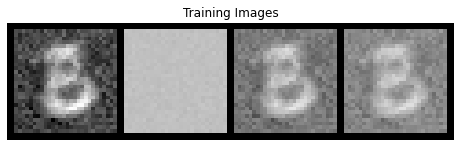

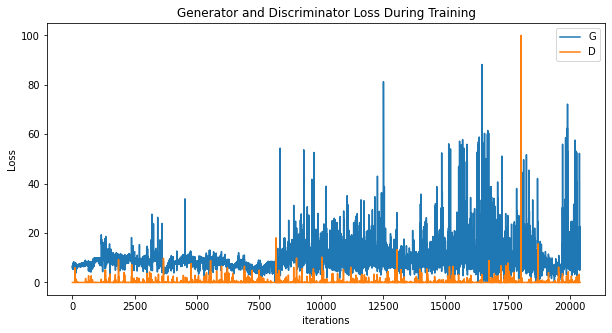

[0/3][20410/30000]	Loss_D: 0.0420	Loss_G: 11.0625	D(x): 1.0000	D(G(z)): 0.0411 / 0.0001
tensor([ 6.8933, -2.5529], grad_fn=<SliceBackward>) tensor([-0.0029,  0.0123], grad_fn=<SliceBackward>)
tensor([0.0495, 0.0930], grad_fn=<SliceBackward>)
[0/3][20420/30000]	Loss_D: 0.0085	Loss_G: 10.2592	D(x): 1.0000	D(G(z)): 0.0085 / 0.0009
tensor([ 6.8939, -2.5500], grad_fn=<SliceBackward>) tensor([-0.0028,  0.0124], grad_fn=<SliceBackward>)
tensor([0.0513, 0.0939], grad_fn=<SliceBackward>)
[0/3][20430/30000]	Loss_D: 0.0059	Loss_G: 11.5756	D(x): 1.0000	D(G(z)): 0.0058 / 0.0027
tensor([ 6.8961, -2.5471], grad_fn=<SliceBackward>) tensor([-0.0027,  0.0125], grad_fn=<SliceBackward>)
tensor([0.0528, 0.0938], grad_fn=<SliceBackward>)
[0/3][20440/30000]	Loss_D: 0.0068	Loss_G: 56.8432	D(x): 1.0000	D(G(z)): 0.0068 / 0.0000
tensor([ 6.8978, -2.5452], grad_fn=<SliceBackward>) tensor([-0.0026,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0546, 0.0974], grad_fn=<SliceBackward>)
[0/3][20450/30000]	Loss_D: 0.004

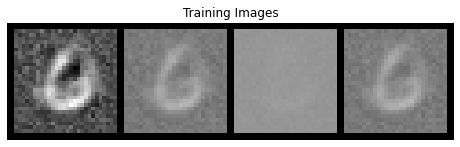

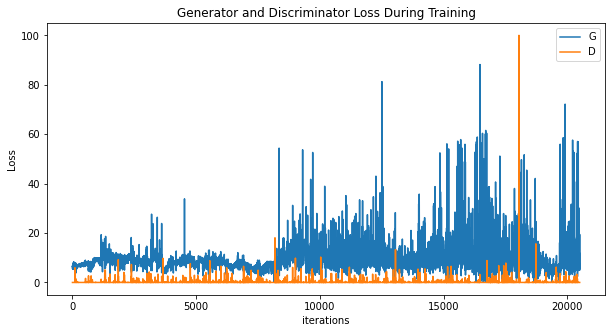

[0/3][20510/30000]	Loss_D: 0.0053	Loss_G: 31.7682	D(x): 1.0000	D(G(z)): 0.0053 / 0.0000
tensor([ 6.8948, -2.5376], grad_fn=<SliceBackward>) tensor([-0.0026,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0657, 0.1135], grad_fn=<SliceBackward>)
[0/3][20520/30000]	Loss_D: 0.0044	Loss_G: 13.3794	D(x): 1.0000	D(G(z)): 0.0044 / 0.0002
tensor([ 6.8938, -2.5367], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0659, 0.1120], grad_fn=<SliceBackward>)
[0/3][20530/30000]	Loss_D: 0.0034	Loss_G: 8.2912	D(x): 1.0000	D(G(z)): 0.0034 / 0.0005
tensor([ 6.8926, -2.5356], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0676, 0.1148], grad_fn=<SliceBackward>)
[0/3][20540/30000]	Loss_D: 0.0018	Loss_G: 5.9719	D(x): 1.0000	D(G(z)): 0.0018 / 0.0039
tensor([ 6.8916, -2.5343], grad_fn=<SliceBackward>) tensor([-0.0025,  0.0126], grad_fn=<SliceBackward>)
tensor([0.0684, 0.1164], grad_fn=<SliceBackward>)
[0/3][20550/30000]	Loss_D: 0.0033	

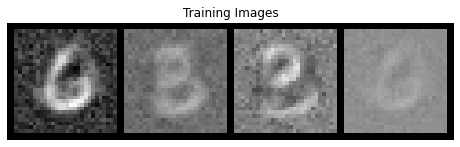

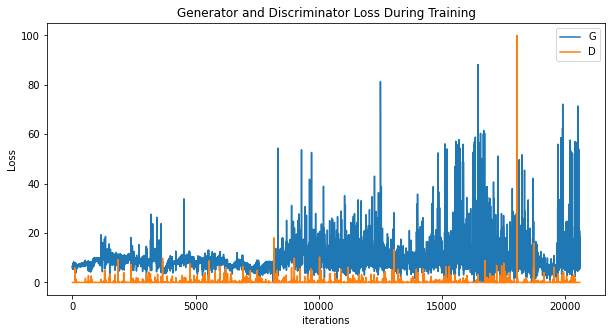

[0/3][20610/30000]	Loss_D: 0.0028	Loss_G: 6.6765	D(x): 1.0000	D(G(z)): 0.0028 / 0.0014
tensor([ 6.8854, -2.5284], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0127], grad_fn=<SliceBackward>)
tensor([0.1040, 0.1446], grad_fn=<SliceBackward>)
[0/3][20620/30000]	Loss_D: 0.0010	Loss_G: 7.0785	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
tensor([ 6.8846, -2.5279], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0127], grad_fn=<SliceBackward>)
tensor([0.1224, 0.1599], grad_fn=<SliceBackward>)
[0/3][20630/30000]	Loss_D: 0.0030	Loss_G: 12.5745	D(x): 1.0000	D(G(z)): 0.0030 / 0.0033
tensor([ 6.8837, -2.5275], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0127], grad_fn=<SliceBackward>)
tensor([0.1362, 0.1734], grad_fn=<SliceBackward>)
[0/3][20640/30000]	Loss_D: 0.0153	Loss_G: 26.6827	D(x): 1.0000	D(G(z)): 0.0151 / 0.0067
tensor([ 6.8823, -2.5270], grad_fn=<SliceBackward>) tensor([-0.0024,  0.0127], grad_fn=<SliceBackward>)
tensor([0.1581, 0.1945], grad_fn=<SliceBackward>)
[0/3][20650/30000]	Loss_D: 0.0083	

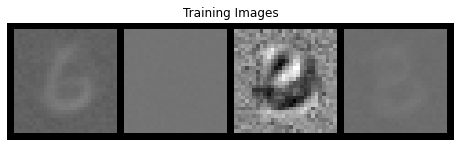

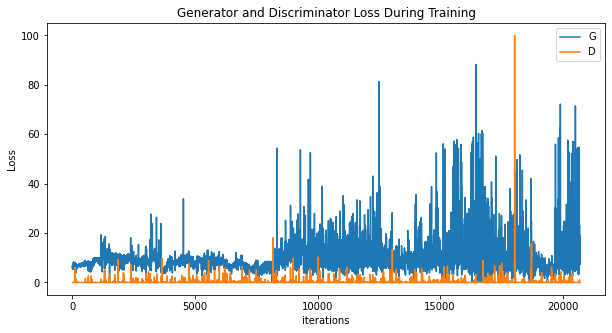

[0/3][20710/30000]	Loss_D: 0.0002	Loss_G: 9.1074	D(x): 1.0000	D(G(z)): 0.0002 / 0.0043
tensor([ 6.8712, -2.5237], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0136], grad_fn=<SliceBackward>)
tensor([0.1602, 0.1931], grad_fn=<SliceBackward>)
[0/3][20720/30000]	Loss_D: 0.0004	Loss_G: 9.7197	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
tensor([ 6.8717, -2.5244], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0136], grad_fn=<SliceBackward>)
tensor([0.1622, 0.1967], grad_fn=<SliceBackward>)
[0/3][20730/30000]	Loss_D: 0.0034	Loss_G: 9.7636	D(x): 0.9967	D(G(z)): 0.0001 / 0.0035
tensor([ 6.8733, -2.5269], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0136], grad_fn=<SliceBackward>)
tensor([0.1650, 0.2007], grad_fn=<SliceBackward>)
[0/3][20740/30000]	Loss_D: 0.0006	Loss_G: 10.7374	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 6.8743, -2.5280], grad_fn=<SliceBackward>) tensor([-0.0016,  0.0136], grad_fn=<SliceBackward>)
tensor([0.1697, 0.2077], grad_fn=<SliceBackward>)
[0/3][20750/30000]	Loss_D: 0.0122	L

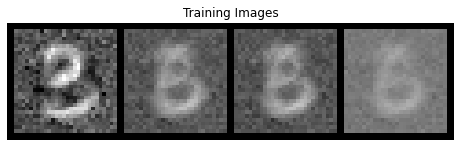

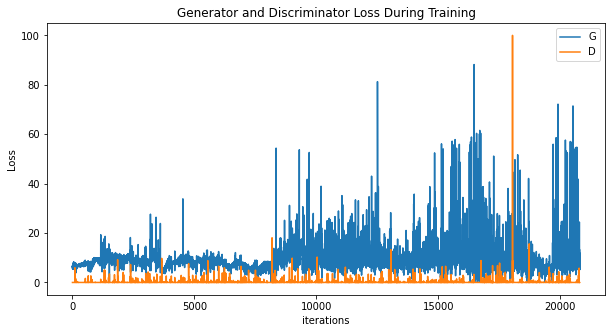

[0/3][20810/30000]	Loss_D: 0.0412	Loss_G: 7.2501	D(x): 1.0000	D(G(z)): 0.0396 / 0.0046
tensor([ 6.8701, -2.5126], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0099], grad_fn=<SliceBackward>)
tensor([0.1706, 0.2075], grad_fn=<SliceBackward>)
[0/3][20820/30000]	Loss_D: 0.4975	Loss_G: 6.4361	D(x): 1.0000	D(G(z)): 0.3360 / 0.0022
tensor([ 6.8846, -2.5087], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0100], grad_fn=<SliceBackward>)
tensor([0.1726, 0.2095], grad_fn=<SliceBackward>)
[0/3][20830/30000]	Loss_D: 0.0026	Loss_G: 11.2427	D(x): 1.0000	D(G(z)): 0.0026 / 0.0010
tensor([ 6.8842, -2.5086], grad_fn=<SliceBackward>) tensor([-0.0051,  0.0102], grad_fn=<SliceBackward>)
tensor([0.1685, 0.2048], grad_fn=<SliceBackward>)
[0/3][20840/30000]	Loss_D: 0.0083	Loss_G: 14.4140	D(x): 1.0000	D(G(z)): 0.0082 / 0.0000
tensor([ 6.8866, -2.5146], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0095], grad_fn=<SliceBackward>)
tensor([0.1654, 0.2011], grad_fn=<SliceBackward>)
[0/3][20850/30000]	Loss_D: 0.0143	

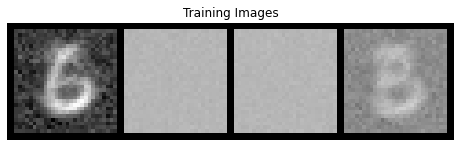

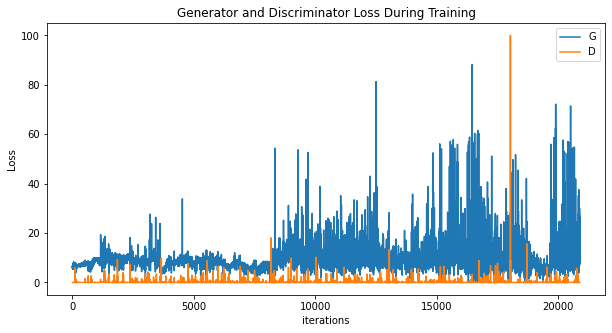

[0/3][20910/30000]	Loss_D: 0.0007	Loss_G: 6.5832	D(x): 1.0000	D(G(z)): 0.0007 / 0.0015
tensor([ 6.8997, -2.5544], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0096], grad_fn=<SliceBackward>)
tensor([0.1855, 0.2171], grad_fn=<SliceBackward>)
[0/3][20920/30000]	Loss_D: 0.0041	Loss_G: 28.1403	D(x): 1.0000	D(G(z)): 0.0041 / 0.0000
tensor([ 6.9000, -2.5546], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0096], grad_fn=<SliceBackward>)
tensor([0.1859, 0.2181], grad_fn=<SliceBackward>)
[0/3][20930/30000]	Loss_D: 0.0034	Loss_G: 7.4066	D(x): 1.0000	D(G(z)): 0.0034 / 0.0006
tensor([ 6.9006, -2.5549], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0096], grad_fn=<SliceBackward>)
tensor([0.1877, 0.2197], grad_fn=<SliceBackward>)
[0/3][20940/30000]	Loss_D: 0.0004	Loss_G: 19.6501	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
tensor([ 6.9012, -2.5552], grad_fn=<SliceBackward>) tensor([-0.0059,  0.0096], grad_fn=<SliceBackward>)
tensor([0.1873, 0.2188], grad_fn=<SliceBackward>)
[0/3][20950/30000]	Loss_D: 0.0022	

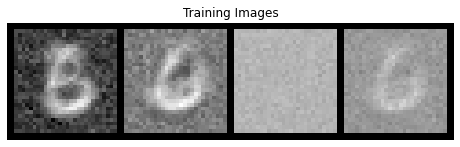

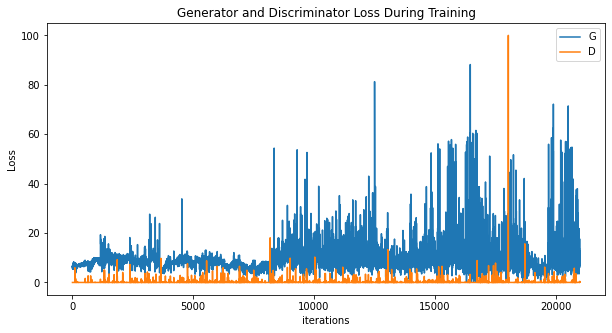

[0/3][21010/30000]	Loss_D: 0.0009	Loss_G: 12.8698	D(x): 0.9995	D(G(z)): 0.0004 / 0.0000
tensor([ 6.9211, -2.5452], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0099], grad_fn=<SliceBackward>)
tensor([0.1825, 0.2071], grad_fn=<SliceBackward>)
[0/3][21020/30000]	Loss_D: 0.0002	Loss_G: 7.4141	D(x): 1.0000	D(G(z)): 0.0002 / 0.0006
tensor([ 6.9193, -2.5413], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0099], grad_fn=<SliceBackward>)
tensor([0.1961, 0.2194], grad_fn=<SliceBackward>)
[0/3][21030/30000]	Loss_D: 0.0006	Loss_G: 5.8747	D(x): 1.0000	D(G(z)): 0.0006 / 0.0126
tensor([ 6.9172, -2.5404], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0099], grad_fn=<SliceBackward>)
tensor([0.1930, 0.2089], grad_fn=<SliceBackward>)
[0/3][21040/30000]	Loss_D: 0.0008	Loss_G: 6.9777	D(x): 1.0000	D(G(z)): 0.0008 / 0.0010
tensor([ 6.9159, -2.5396], grad_fn=<SliceBackward>) tensor([-0.0054,  0.0099], grad_fn=<SliceBackward>)
tensor([0.1921, 0.2065], grad_fn=<SliceBackward>)
[0/3][21050/30000]	Loss_D: 0.0014	L

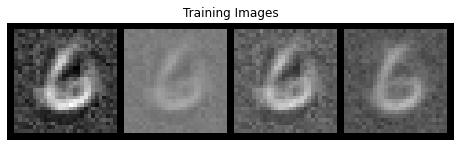

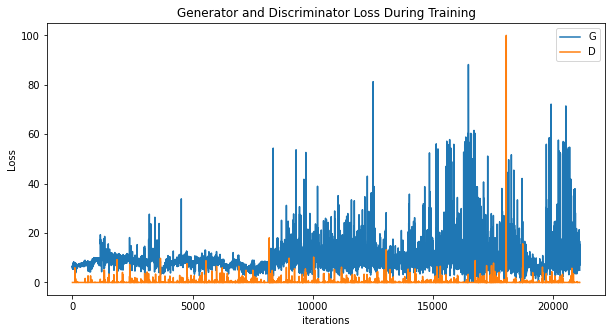

[0/3][21110/30000]	Loss_D: 0.0056	Loss_G: 8.6263	D(x): 0.9981	D(G(z)): 0.0037 / 0.0013
tensor([ 6.9121, -2.5321], grad_fn=<SliceBackward>) tensor([-0.0053,  0.0100], grad_fn=<SliceBackward>)
tensor([0.1938, 0.1969], grad_fn=<SliceBackward>)
[0/3][21120/30000]	Loss_D: 0.0002	Loss_G: 10.9093	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
tensor([ 6.9128, -2.5586], grad_fn=<SliceBackward>) tensor([-0.0036,  0.0118], grad_fn=<SliceBackward>)
tensor([0.1945, 0.1944], grad_fn=<SliceBackward>)
[0/3][21130/30000]	Loss_D: 0.0023	Loss_G: 10.8223	D(x): 1.0000	D(G(z)): 0.0023 / 0.0000
tensor([ 6.9150, -2.5670], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0114], grad_fn=<SliceBackward>)
tensor([0.1963, 0.1960], grad_fn=<SliceBackward>)
[0/3][21140/30000]	Loss_D: 0.0078	Loss_G: 11.4977	D(x): 1.0000	D(G(z)): 0.0077 / 0.0023
tensor([ 6.9145, -2.5658], grad_fn=<SliceBackward>) tensor([-0.0041,  0.0114], grad_fn=<SliceBackward>)
tensor([0.1960, 0.1952], grad_fn=<SliceBackward>)
[0/3][21150/30000]	Loss_D: 0.1738

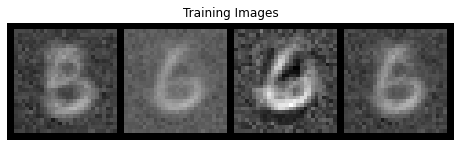

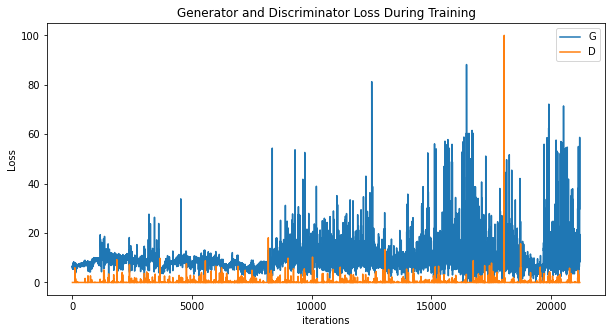

[0/3][21210/30000]	Loss_D: 0.0224	Loss_G: 10.1085	D(x): 1.0000	D(G(z)): 0.0220 / 0.0047
tensor([ 6.8952, -2.5900], grad_fn=<SliceBackward>) tensor([-0.0056,  0.0099], grad_fn=<SliceBackward>)
tensor([0.2073, 0.2076], grad_fn=<SliceBackward>)
[0/3][21220/30000]	Loss_D: 0.0256	Loss_G: 11.4834	D(x): 1.0000	D(G(z)): 0.0252 / 0.0105
tensor([ 6.8882, -2.5994], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0063], grad_fn=<SliceBackward>)
tensor([0.2100, 0.2111], grad_fn=<SliceBackward>)
[0/3][21230/30000]	Loss_D: 0.0166	Loss_G: 8.6797	D(x): 1.0000	D(G(z)): 0.0165 / 0.0007
tensor([ 6.8846, -2.6074], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0063], grad_fn=<SliceBackward>)
tensor([0.2099, 0.2119], grad_fn=<SliceBackward>)
[0/3][21240/30000]	Loss_D: 0.0008	Loss_G: 6.8440	D(x): 1.0000	D(G(z)): 0.0008 / 0.3876
tensor([ 6.8735, -2.6248], grad_fn=<SliceBackward>) tensor([-0.0092,  0.0063], grad_fn=<SliceBackward>)
tensor([0.2110, 0.2140], grad_fn=<SliceBackward>)
[0/3][21250/30000]	Loss_D: 0.0045	

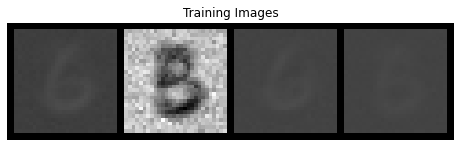

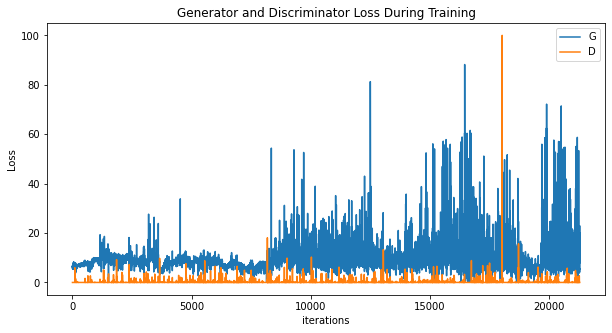

[0/3][21310/30000]	Loss_D: 0.1685	Loss_G: 11.6575	D(x): 1.0000	D(G(z)): 0.1434 / 0.0024
tensor([ 6.8343, -2.6600], grad_fn=<SliceBackward>) tensor([-0.0075,  0.0076], grad_fn=<SliceBackward>)
tensor([0.2214, 0.2292], grad_fn=<SliceBackward>)
[0/3][21320/30000]	Loss_D: 0.0012	Loss_G: 7.8698	D(x): 1.0000	D(G(z)): 0.0012 / 0.0004
tensor([ 6.8395, -2.6598], grad_fn=<SliceBackward>) tensor([-0.0073,  0.0079], grad_fn=<SliceBackward>)
tensor([0.2234, 0.2317], grad_fn=<SliceBackward>)
[0/3][21330/30000]	Loss_D: 0.0155	Loss_G: 11.5758	D(x): 0.9975	D(G(z)): 0.0128 / 0.0000
tensor([ 6.8413, -2.6583], grad_fn=<SliceBackward>) tensor([-0.0071,  0.0080], grad_fn=<SliceBackward>)
tensor([0.2235, 0.2317], grad_fn=<SliceBackward>)
[0/3][21340/30000]	Loss_D: 0.0007	Loss_G: 12.1286	D(x): 1.0000	D(G(z)): 0.0006 / 0.0012
tensor([ 6.8431, -2.6558], grad_fn=<SliceBackward>) tensor([-0.0071,  0.0080], grad_fn=<SliceBackward>)
tensor([0.2243, 0.2324], grad_fn=<SliceBackward>)
[0/3][21350/30000]	Loss_D: 0.0192

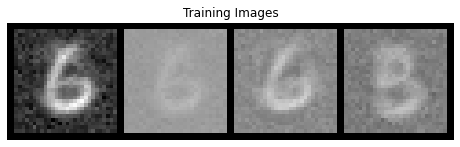

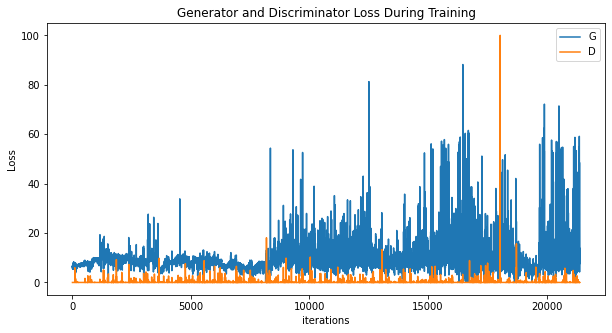

[0/3][21410/30000]	Loss_D: 0.0177	Loss_G: 6.9849	D(x): 1.0000	D(G(z)): 0.0175 / 0.0011
tensor([ 6.8463, -2.6515], grad_fn=<SliceBackward>) tensor([-0.0078,  0.0073], grad_fn=<SliceBackward>)
tensor([0.2385, 0.2455], grad_fn=<SliceBackward>)
[0/3][21420/30000]	Loss_D: 0.0054	Loss_G: 26.2634	D(x): 0.9999	D(G(z)): 0.0053 / 0.0000
tensor([ 6.8449, -2.6548], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0071], grad_fn=<SliceBackward>)
tensor([0.2398, 0.2464], grad_fn=<SliceBackward>)
[0/3][21430/30000]	Loss_D: 0.0079	Loss_G: 6.9171	D(x): 1.0000	D(G(z)): 0.0078 / 0.0010
tensor([ 6.8433, -2.6595], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0072], grad_fn=<SliceBackward>)
tensor([0.2409, 0.2473], grad_fn=<SliceBackward>)
[0/3][21440/30000]	Loss_D: 0.0011	Loss_G: 7.0279	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
tensor([ 6.8415, -2.6669], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0072], grad_fn=<SliceBackward>)
tensor([0.2425, 0.2489], grad_fn=<SliceBackward>)
[0/3][21450/30000]	Loss_D: 0.0052	L

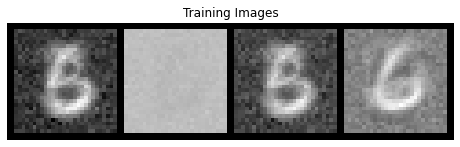

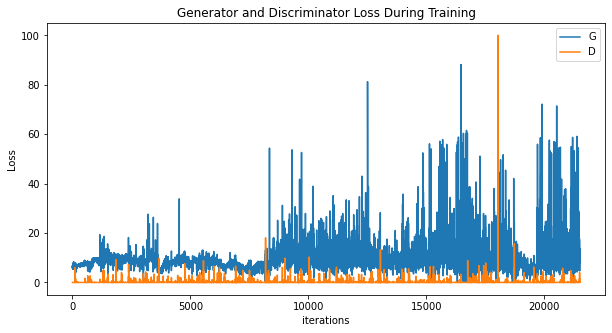

[0/3][21510/30000]	Loss_D: 0.0006	Loss_G: 6.2615	D(x): 1.0000	D(G(z)): 0.0006 / 0.0020
tensor([ 6.7281, -2.7996], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0048], grad_fn=<SliceBackward>)
tensor([0.2585, 0.2665], grad_fn=<SliceBackward>)
[0/3][21520/30000]	Loss_D: 0.0002	Loss_G: 11.8642	D(x): 1.0000	D(G(z)): 0.0002 / 0.0007
tensor([ 6.7279, -2.7960], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0048], grad_fn=<SliceBackward>)
tensor([0.2590, 0.2674], grad_fn=<SliceBackward>)
[0/3][21530/30000]	Loss_D: 0.0177	Loss_G: 10.4626	D(x): 1.0000	D(G(z)): 0.0175 / 0.0006
tensor([ 6.7270, -2.7930], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0048], grad_fn=<SliceBackward>)
tensor([0.2622, 0.2707], grad_fn=<SliceBackward>)
[0/3][21540/30000]	Loss_D: 0.0003	Loss_G: 15.2212	D(x): 1.0000	D(G(z)): 0.0003 / 0.0008
tensor([ 6.7259, -2.7908], grad_fn=<SliceBackward>) tensor([-0.0102,  0.0048], grad_fn=<SliceBackward>)
tensor([0.2636, 0.2720], grad_fn=<SliceBackward>)
[0/3][21550/30000]	Loss_D: 0.1252

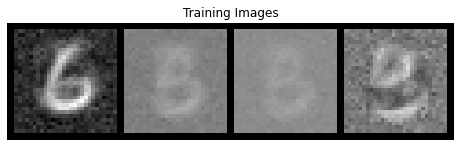

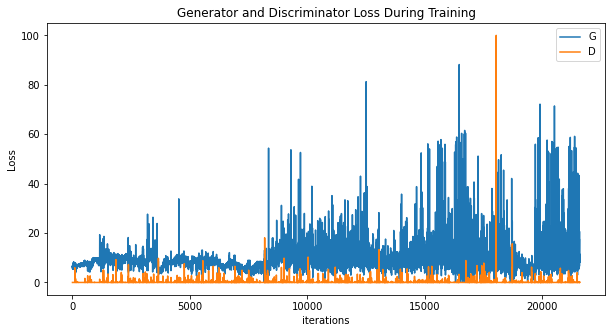

[0/3][21610/30000]	Loss_D: 0.0006	Loss_G: 11.5955	D(x): 1.0000	D(G(z)): 0.0006 / 0.0000
tensor([ 6.7266, -2.8091], grad_fn=<SliceBackward>) tensor([-0.0098,  0.0052], grad_fn=<SliceBackward>)
tensor([0.2781, 0.2932], grad_fn=<SliceBackward>)
[0/3][21620/30000]	Loss_D: 0.0116	Loss_G: 7.9390	D(x): 1.0000	D(G(z)): 0.0116 / 0.0011
tensor([ 6.7316, -2.8119], grad_fn=<SliceBackward>) tensor([-0.0097,  0.0056], grad_fn=<SliceBackward>)
tensor([0.2795, 0.2941], grad_fn=<SliceBackward>)
[0/3][21630/30000]	Loss_D: 0.0000	Loss_G: 12.5668	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
tensor([ 6.7399, -2.8074], grad_fn=<SliceBackward>) tensor([-0.0096,  0.0057], grad_fn=<SliceBackward>)
tensor([0.2891, 0.3038], grad_fn=<SliceBackward>)
[0/3][21640/30000]	Loss_D: 0.0004	Loss_G: 9.5190	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
tensor([ 6.7399, -2.8069], grad_fn=<SliceBackward>) tensor([-0.0096,  0.0057], grad_fn=<SliceBackward>)
tensor([0.2922, 0.3065], grad_fn=<SliceBackward>)
[0/3][21650/30000]	Loss_D: 0.0001	

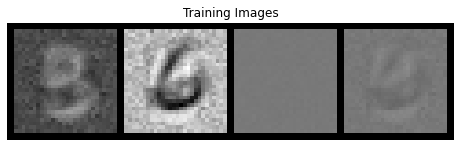

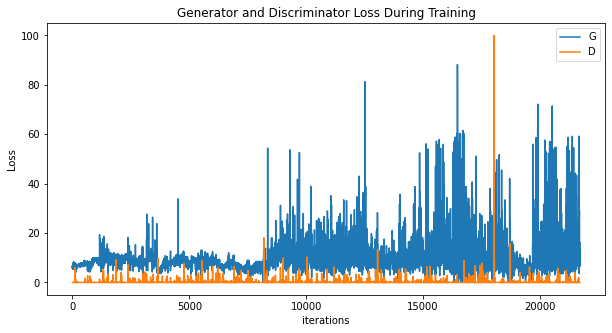

[0/3][21710/30000]	Loss_D: 0.0412	Loss_G: 21.0651	D(x): 0.9614	D(G(z)): 0.0009 / 0.0000
tensor([ 6.7427, -2.8155], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0049], grad_fn=<SliceBackward>)
tensor([0.3054, 0.3264], grad_fn=<SliceBackward>)
[0/3][21720/30000]	Loss_D: 0.0016	Loss_G: 12.1061	D(x): 1.0000	D(G(z)): 0.0016 / 0.0003
tensor([ 6.7432, -2.8157], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3068, 0.3283], grad_fn=<SliceBackward>)
[0/3][21730/30000]	Loss_D: 0.0005	Loss_G: 7.6311	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
tensor([ 6.7433, -2.8155], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3037, 0.3252], grad_fn=<SliceBackward>)
[0/3][21740/30000]	Loss_D: 0.0003	Loss_G: 19.0159	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
tensor([ 6.7431, -2.8159], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3050, 0.3266], grad_fn=<SliceBackward>)
[0/3][21750/30000]	Loss_D: 0.0004

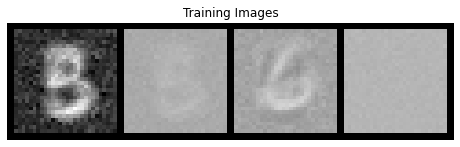

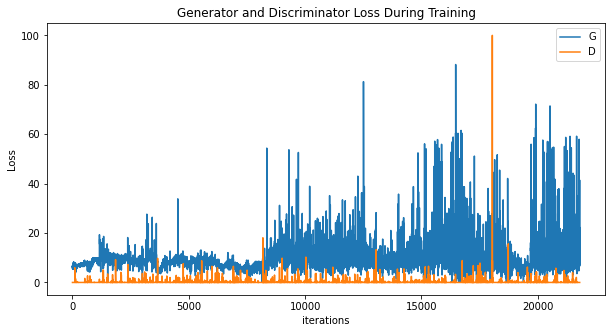

[0/3][21810/30000]	Loss_D: 0.0041	Loss_G: 12.3775	D(x): 1.0000	D(G(z)): 0.0041 / 0.0002
tensor([ 6.7406, -2.8178], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3258, 0.3524], grad_fn=<SliceBackward>)
[0/3][21820/30000]	Loss_D: 0.0001	Loss_G: 8.7406	D(x): 0.9999	D(G(z)): 0.0001 / 0.0006
tensor([ 6.7398, -2.8185], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3366, 0.3650], grad_fn=<SliceBackward>)
[0/3][21830/30000]	Loss_D: 0.0018	Loss_G: 9.7604	D(x): 1.0000	D(G(z)): 0.0017 / 0.0287
tensor([ 6.7394, -2.8193], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3371, 0.3659], grad_fn=<SliceBackward>)
[0/3][21840/30000]	Loss_D: 0.0006	Loss_G: 12.0098	D(x): 1.0000	D(G(z)): 0.0006 / 0.0042
tensor([ 6.7392, -2.8193], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3394, 0.3687], grad_fn=<SliceBackward>)
[0/3][21850/30000]	Loss_D: 0.0010	

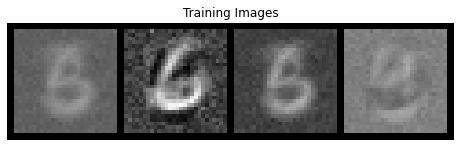

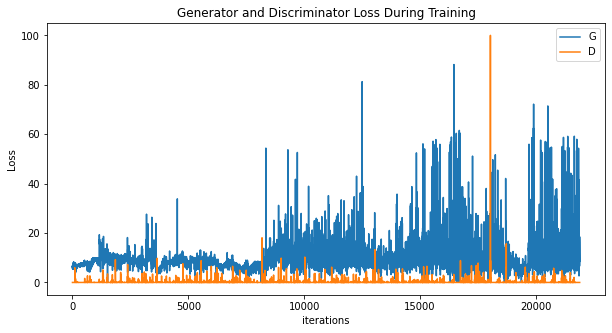

[0/3][21910/30000]	Loss_D: 0.0011	Loss_G: 10.8161	D(x): 1.0000	D(G(z)): 0.0011 / 0.0002
tensor([ 6.7399, -2.8214], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3488, 0.3812], grad_fn=<SliceBackward>)
[0/3][21920/30000]	Loss_D: 0.0009	Loss_G: 7.3289	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
tensor([ 6.7401, -2.8221], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3498, 0.3824], grad_fn=<SliceBackward>)
[0/3][21930/30000]	Loss_D: 0.0007	Loss_G: 11.8844	D(x): 0.9996	D(G(z)): 0.0003 / 0.0008
tensor([ 6.7403, -2.8229], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3502, 0.3841], grad_fn=<SliceBackward>)
[0/3][21940/30000]	Loss_D: 0.0003	Loss_G: 42.2512	D(x): 1.0000	D(G(z)): 0.0003 / 0.0000
tensor([ 6.7406, -2.8237], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0048], grad_fn=<SliceBackward>)
tensor([0.3506, 0.3856], grad_fn=<SliceBackward>)
[0/3][21950/30000]	Loss_D: 0.0005

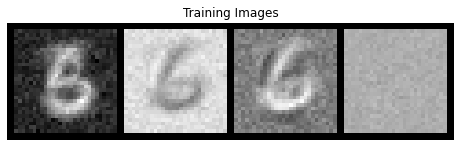

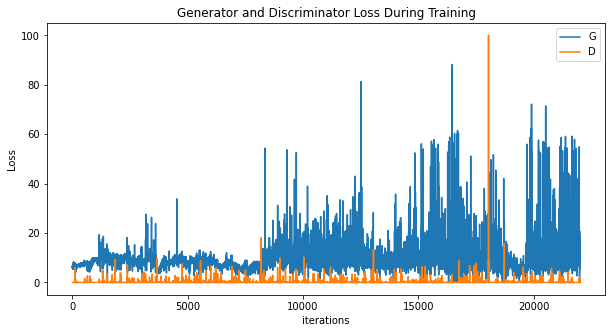

[0/3][22010/30000]	Loss_D: 0.0004	Loss_G: 7.4271	D(x): 1.0000	D(G(z)): 0.0004 / 0.0006
tensor([ 6.6888, -2.8562], grad_fn=<SliceBackward>) tensor([-0.0107,  0.0042], grad_fn=<SliceBackward>)
tensor([0.3605, 0.4012], grad_fn=<SliceBackward>)
[0/3][22020/30000]	Loss_D: 0.0073	Loss_G: 10.8510	D(x): 1.0000	D(G(z)): 0.0073 / 0.0019
tensor([ 6.6886, -2.8565], grad_fn=<SliceBackward>) tensor([-0.0106,  0.0043], grad_fn=<SliceBackward>)
tensor([0.3626, 0.4036], grad_fn=<SliceBackward>)
[0/3][22030/30000]	Loss_D: 0.0016	Loss_G: 5.0489	D(x): 1.0000	D(G(z)): 0.0016 / 0.0064
tensor([ 6.6878, -2.8579], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0043], grad_fn=<SliceBackward>)
tensor([0.3639, 0.4048], grad_fn=<SliceBackward>)
[0/3][22040/30000]	Loss_D: 0.0052	Loss_G: 7.0098	D(x): 1.0000	D(G(z)): 0.0052 / 0.0009
tensor([ 6.6875, -2.8586], grad_fn=<SliceBackward>) tensor([-0.0105,  0.0043], grad_fn=<SliceBackward>)
tensor([0.3662, 0.4077], grad_fn=<SliceBackward>)
[0/3][22050/30000]	Loss_D: 0.0055	L

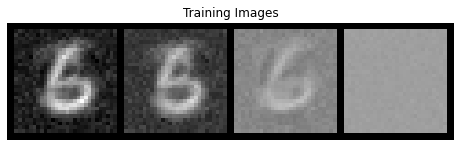

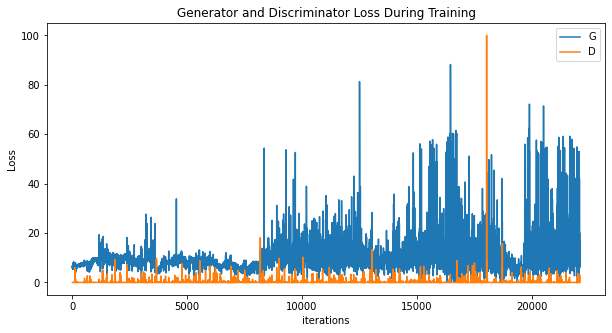

[0/3][22110/30000]	Loss_D: 0.1293	Loss_G: 6.2158	D(x): 1.0000	D(G(z)): 0.1186 / 0.0065
tensor([ 6.6767, -2.8587], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0089], grad_fn=<SliceBackward>)
tensor([0.3849, 0.4349], grad_fn=<SliceBackward>)
[0/3][22120/30000]	Loss_D: 0.0122	Loss_G: 15.8540	D(x): 1.0000	D(G(z)): 0.0121 / 0.0037
tensor([ 6.6797, -2.8570], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0089], grad_fn=<SliceBackward>)
tensor([0.3851, 0.4356], grad_fn=<SliceBackward>)
[0/3][22130/30000]	Loss_D: 0.0144	Loss_G: 10.3787	D(x): 0.9900	D(G(z)): 0.0042 / 0.0023
tensor([ 6.6834, -2.8555], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0089], grad_fn=<SliceBackward>)
tensor([0.3897, 0.4406], grad_fn=<SliceBackward>)
[0/3][22140/30000]	Loss_D: 0.0318	Loss_G: 8.7823	D(x): 1.0000	D(G(z)): 0.0310 / 0.0009
tensor([ 6.6879, -2.8558], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0087], grad_fn=<SliceBackward>)
tensor([0.3941, 0.4461], grad_fn=<SliceBackward>)
[0/3][22150/30000]	Loss_D: 0.0040	

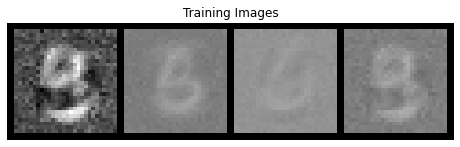

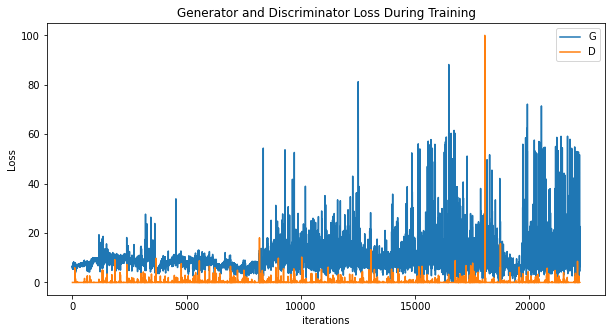

[0/3][22210/30000]	Loss_D: 0.0051	Loss_G: 34.4401	D(x): 1.0000	D(G(z)): 0.0051 / 0.0008
tensor([ 6.6819, -2.8745], grad_fn=<SliceBackward>) tensor([-0.0078,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4039, 0.4638], grad_fn=<SliceBackward>)
[0/3][22220/30000]	Loss_D: 0.0017	Loss_G: 9.3206	D(x): 1.0000	D(G(z)): 0.0016 / 0.0001
tensor([ 6.6766, -2.8829], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0083], grad_fn=<SliceBackward>)
tensor([0.4011, 0.4630], grad_fn=<SliceBackward>)
[0/3][22230/30000]	Loss_D: 0.0256	Loss_G: 5.0307	D(x): 1.0000	D(G(z)): 0.0253 / 0.0066
tensor([ 6.6699, -2.8903], grad_fn=<SliceBackward>) tensor([-0.0080,  0.0077], grad_fn=<SliceBackward>)
tensor([0.4028, 0.4645], grad_fn=<SliceBackward>)
[0/3][22240/30000]	Loss_D: 0.0097	Loss_G: 11.8374	D(x): 1.0000	D(G(z)): 0.0097 / 0.0009
tensor([ 6.6555, -2.8981], grad_fn=<SliceBackward>) tensor([-0.0079,  0.0078], grad_fn=<SliceBackward>)
tensor([0.4026, 0.4649], grad_fn=<SliceBackward>)
[0/3][22250/30000]	Loss_D: 0.0014	

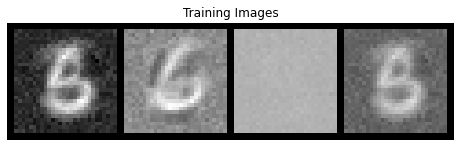

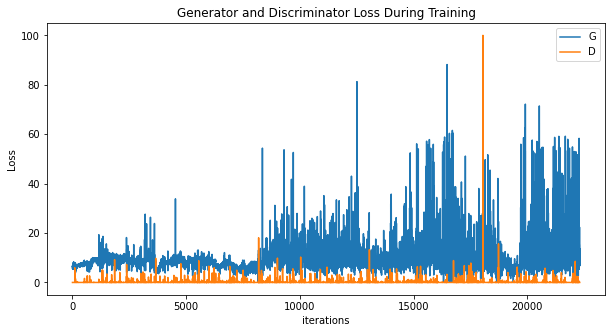

[0/3][22310/30000]	Loss_D: 0.0085	Loss_G: 10.6296	D(x): 1.0000	D(G(z)): 0.0084 / 0.0002
tensor([ 6.6182, -2.8983], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4135, 0.4800], grad_fn=<SliceBackward>)
[0/3][22320/30000]	Loss_D: 0.0026	Loss_G: 27.2006	D(x): 1.0000	D(G(z)): 0.0026 / 0.0007
tensor([ 6.6175, -2.8984], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4175, 0.4857], grad_fn=<SliceBackward>)
[0/3][22330/30000]	Loss_D: 0.0033	Loss_G: 7.6370	D(x): 1.0000	D(G(z)): 0.0033 / 0.0007
tensor([ 6.6170, -2.8985], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4209, 0.4900], grad_fn=<SliceBackward>)
[0/3][22340/30000]	Loss_D: 2.4712	Loss_G: 54.1096	D(x): 0.5036	D(G(z)): 0.0014 / 0.0001
tensor([ 6.6160, -2.8992], grad_fn=<SliceBackward>) tensor([-0.0074,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4233, 0.4906], grad_fn=<SliceBackward>)
[0/3][22350/30000]	Loss_D: 0.0165

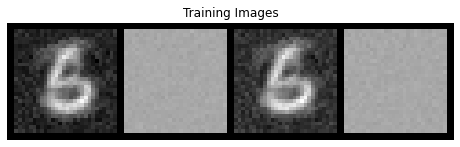

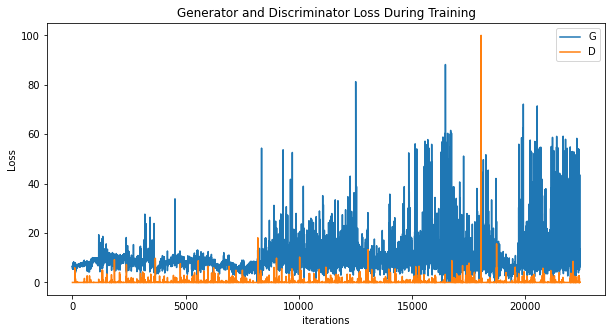

[0/3][22410/30000]	Loss_D: 0.0012	Loss_G: 8.2110	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
tensor([ 6.5135, -2.9885], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0085], grad_fn=<SliceBackward>)
tensor([0.4445, 0.5163], grad_fn=<SliceBackward>)
[0/3][22420/30000]	Loss_D: 0.0040	Loss_G: 5.0474	D(x): 1.0000	D(G(z)): 0.0040 / 0.0642
tensor([ 6.5111, -2.9892], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0085], grad_fn=<SliceBackward>)
tensor([0.4442, 0.5167], grad_fn=<SliceBackward>)
[0/3][22430/30000]	Loss_D: 0.0009	Loss_G: 9.6321	D(x): 1.0000	D(G(z)): 0.0009 / 0.0005
tensor([ 6.5121, -2.9891], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0085], grad_fn=<SliceBackward>)
tensor([0.4450, 0.5194], grad_fn=<SliceBackward>)
[0/3][22440/30000]	Loss_D: 0.0013	Loss_G: 27.9362	D(x): 1.0000	D(G(z)): 0.0013 / 0.0006
tensor([ 6.5111, -2.9892], grad_fn=<SliceBackward>) tensor([-0.0070,  0.0085], grad_fn=<SliceBackward>)
tensor([0.4487, 0.5250], grad_fn=<SliceBackward>)
[0/3][22450/30000]	Loss_D: 0.0022	L

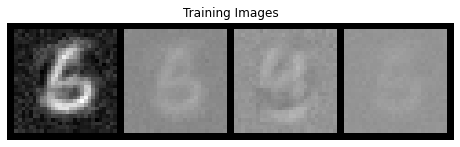

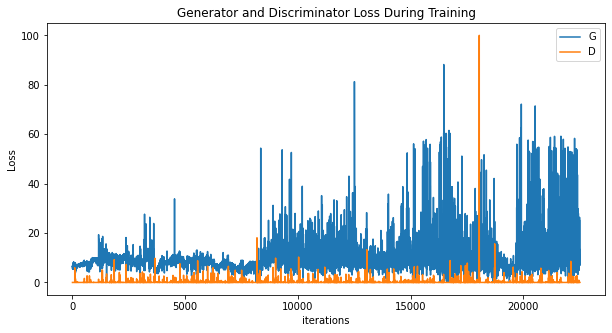

[0/3][22510/30000]	Loss_D: 0.0000	Loss_G: 11.6319	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
tensor([ 6.5115, -3.0240], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0087], grad_fn=<SliceBackward>)
tensor([0.4529, 0.5474], grad_fn=<SliceBackward>)
[0/3][22520/30000]	Loss_D: 0.0551	Loss_G: 9.4474	D(x): 1.0000	D(G(z)): 0.0526 / 0.0001
tensor([ 6.4972, -3.0440], grad_fn=<SliceBackward>) tensor([-0.0068,  0.0088], grad_fn=<SliceBackward>)
tensor([0.4543, 0.5511], grad_fn=<SliceBackward>)
[0/3][22530/30000]	Loss_D: 0.0001	Loss_G: 13.1842	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
tensor([ 6.4826, -3.0573], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0089], grad_fn=<SliceBackward>)
tensor([0.4568, 0.5563], grad_fn=<SliceBackward>)
[0/3][22540/30000]	Loss_D: 0.0021	Loss_G: 9.7980	D(x): 1.0000	D(G(z)): 0.0021 / 0.0001
tensor([ 6.4677, -3.0700], grad_fn=<SliceBackward>) tensor([-0.0067,  0.0089], grad_fn=<SliceBackward>)
tensor([0.4633, 0.5674], grad_fn=<SliceBackward>)
[0/3][22550/30000]	Loss_D: 0.0002	

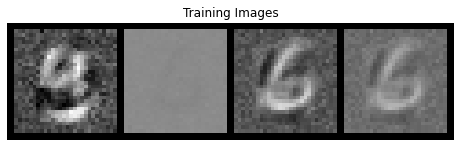

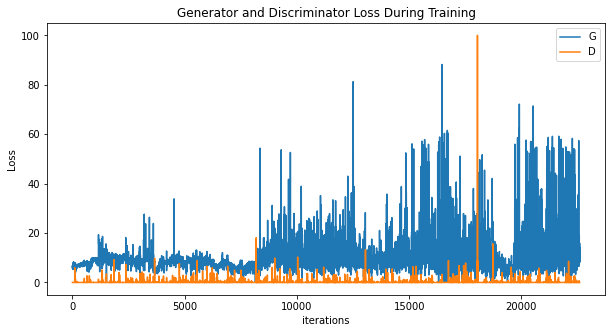

[0/3][22610/30000]	Loss_D: 0.0014	Loss_G: 8.0816	D(x): 0.9999	D(G(z)): 0.0013 / 0.0003
tensor([ 6.3481, -3.1706], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4785, 0.5868], grad_fn=<SliceBackward>)
[0/3][22620/30000]	Loss_D: 0.0006	Loss_G: 10.0923	D(x): 1.0000	D(G(z)): 0.0006 / 0.0001
tensor([ 6.3462, -3.1648], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4776, 0.5862], grad_fn=<SliceBackward>)
[0/3][22630/30000]	Loss_D: 0.0004	Loss_G: 7.6806	D(x): 1.0000	D(G(z)): 0.0004 / 0.0007
tensor([ 6.3458, -3.1609], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4813, 0.5907], grad_fn=<SliceBackward>)
[0/3][22640/30000]	Loss_D: 0.0006	Loss_G: 7.1933	D(x): 1.0000	D(G(z)): 0.0006 / 0.0008
tensor([ 6.3455, -3.1576], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4847, 0.5953], grad_fn=<SliceBackward>)
[0/3][22650/30000]	Loss_D: 0.0003	L

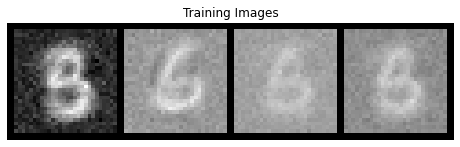

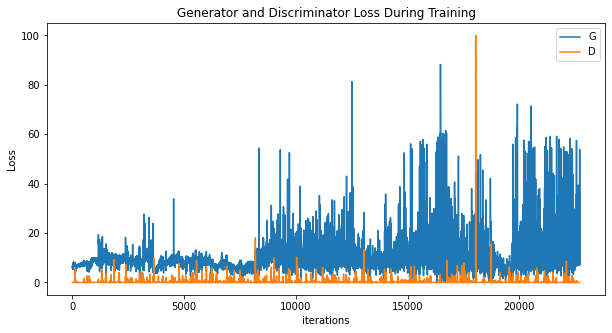

[0/3][22710/30000]	Loss_D: 0.0016	Loss_G: 8.0730	D(x): 1.0000	D(G(z)): 0.0016 / 0.0003
tensor([ 6.3427, -3.1452], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4774, 0.5898], grad_fn=<SliceBackward>)
[0/3][22720/30000]	Loss_D: 0.0010	Loss_G: 6.6357	D(x): 1.0000	D(G(z)): 0.0010 / 0.0037
tensor([ 6.3426, -3.1441], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4809, 0.5937], grad_fn=<SliceBackward>)
[0/3][22730/30000]	Loss_D: 0.0005	Loss_G: 9.1954	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001
tensor([ 6.3424, -3.1431], grad_fn=<SliceBackward>) tensor([-0.0077,  0.0081], grad_fn=<SliceBackward>)
tensor([0.4763, 0.5895], grad_fn=<SliceBackward>)


In [ ]:
# Training Loop

# Lists to keep track of progress
fake_all = []
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################_____________________NET DETONATOR______________________
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        if (i % 1== 0):
            netD.train()
            netG.eval()

            netD.zero_grad()
            netD.zero_grad()

            #real_cpu = torch.nn.functional.normalize(data[0].to(device))
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            output = netD(real_cpu).view(-1)
            errD_real = criterion(output, label)
            errD_real.backward()
            D_x = output.mean().item()

            #print("BEFORE OPTIMIZER: GRADIENTS")
            #print(next(netG.g.parameters()).grad)

            #for param in netG.parameters():
            #    print(param)

            noise = torch.reshape(noise, (image_size * image_size, ))
            fake = netG(noise)
            fake = torch.reshape(fake, (batch_size + add_samples, nc, image_size, image_size))
            fake_all.append(fake.detach().to("cpu"))
            fake = fake[-batch_size:]
            label.fill_(fake_label)
            noise = fake[len(fake) - 1].clone()
            noise = noise.detach()

            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            errD_fake.backward(retain_graph = False)
            D_G_z1 = output.mean().item()
            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake
            optimizerD.step()

        #_______________________________________________NET GENERATOR_______________________
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netD.eval()
        netG.train()
        netG.zero_grad()
        
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        ## Train g freeze T
        #for param in netG.parameters():
        #    param.requires_grad = True
        #netG.T.weight.requires_grad = False
        
        errG.backward(retain_graph = True)
        D_G_z2 = output.mean().item()
            
        optimizerG_g.step()
            
        noise = torch.reshape(noise, (image_size*image_size, ))
        
        fake_news = torch.reshape(netG(noise), (batch_size + add_samples, nc, image_size, image_size))
        
        fake_all.append(fake_news.detach().to("cpu"))
        fake_news = fake_news[-batch_size:]
        label.fill_(fake_label)
        noise = fake_news[len(fake) - 1].clone()
        noise = noise.detach()
        
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake_news).view(-1)
        errG = criterion(output, label)
        ##Train T freeze g
        netG.zero_grad()
        #for param in netG.parameters():
        #    param.requires_grad = False
        
        #netG.T.weight.requires_grad = True
        errG.backward(retain_graph = False)
        optimizerG_T.step()
        D_G_z2 = output.mean().item()
        #optimizerG_T.zero_grad()
            
        #for param in netG.parameters():
        #    print(param)
        #print("________________________NEXT_STEP___________________\n")
        
        #detach all
        output = output.detach().cpu()
        fake = fake.detach().cpu()
        fake_news = fake_news.detach().cpu()
        
        
        # Output training stats
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            print(next(netG.g.parameters())[0][0:2], next(netD.parameters())[0][0:2])
            print(next(netG.T.parameters())[0][0:2])
        if i % 100 == 0:
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(G_losses,label="G")
            plt.plot(D_losses,label="D")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()
            plt.figure(figsize=(8,8))
            plt.axis("off")
            plt.title("Training Images")
            plt.imshow(np.transpose(vutils.make_grid(fake_all[-1][:64], padding=2, normalize=True).cpu(),(1,2,0)))
        if i == len(dataloader) - 2:
            torch.save(netG.state_dict(), "netG"+ 'model_{}_v1.pth'.format(epoch))
            torch.save(netD.state_dict(), "netD"+ 'model_{}_v1.pth'.format(epoch))
            #torch.save(optimizerG.state_dict(), "optG"+ 'optimizer_{}_v1.pth'.format(epoch))
            torch.save(optimizerD.state_dict(), "optD"+ 'optimizer_{}_v1.pth'.format(epoch))
            write_samples(fake_all, "samples3.txt")
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
 

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Check gradient

In [ ]:
torch.autograd.grad(netG(torch.ones(4)), next(netG.T.parameters()), grad_outputs = torch.ones_like(netG(torch.ones(4))))

In [8]:
def my_samples(est_samples, j):

    my_samples = []
    for i in range(len(est_samples)):
        my_samples.append(est_samples[i][j])

    return my_samples



In [1234]:
def write_samples(fake_all, file_name):
    fake_all_list = []
    for elem in fake_all:
        fake_all_list.extend(elem.detach().cpu().numpy())
        with open(file_name, "a") as f:
            for elem in fake_all_list:
                s = ''
                for coord in elem:
                    s += str(coord) + ' '
                s += '\n'
                f.write(s)
        fake_all_list = []

In [124]:
write_samples(fake_all, "cuda5.txt")

# В fake_all  находятся все фейки сгенерированные генератором.

# АХТУНГ! Периодически fake_all нужно сбрасывать на диск, чтобы оно не хранилось в памяти, иначе рано или поздно ядро упадет(обычно одной эпохи хватало

In [1]:
len(fake_all)

NameError: name 'fake_all' is not defined

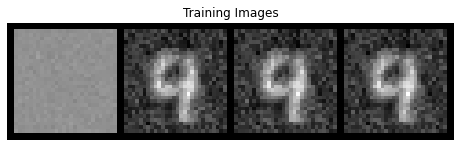

In [1242]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(fake_all[-30000][:64], padding=2, normalize=True).cpu(),(1,2,0)))